README:  
Introcuction: This script is for figure 4 in fullscope analysis(celltype spatial DTU feature analysis)  
Author: Y0NEKO  
Time: 2024.03.28  

In [1]:
#load package
.libPaths(c("/cluster/home/liuhengxin/software/miniconda3_2/envs/r-kernel/lib/R/library",
           "/cluster/home/liuhengxin/software/miniconda3/envs/r4.1.2/lib/R/library",
           "/cluster/home/liuhengxin/software/miniconda3_2/envs/Rsplot/lib/R/library"))
library(data.table)
library(qs)
library(GenomicRanges)
library(GenomicFeatures)
library(rtracklayer)
library(dplyr)
library(ggbio)
library(reshape2)
library(ggsci)
library(viridis)
library(ggpubr)
library(ggh4x)
library(ggtranscript)
library(khroma)
library(bambu)
library(ggdensity)
library(Seurat)
library(scCustomize)
library(ComplexUpset)
library(ComplexHeatmap)

qs 0.25.5

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


Loading required package: S4Vectors


Attaching package: ‘S4Vectors’


The following objects are masked from ‘package:data.table’:

    first, second


The following object is masked from ‘package:utils’:

    findMatches


The following objects are masked from ‘package:base’:

    expand.grid, I, unname


Loading required package: I

In [2]:
library(randomcoloR)
library(ggsignif) # Significance Brackets for 'ggplot2'
library(gghalves)

Warning message:
"package 'ggsignif' was built under R version 4.3.3"


In [4]:
#load data
setwd("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
MySplit = function(str,sep, n){
  return(unlist(lapply(strsplit(str,sep),"[[",n)))
}
cellan = read.csv("../ref/T44/cell_type_type20230220-macaque1-contour2_v1.csv")
cellan = unique(cellan[,c("subclass","class")])
areaan = read.csv("../ref/area_annotation.csv")
gtf = rtracklayer::import("ref/bambu_extended_annotations_novelname.gtf")
areaan = unique(areaan[c("L0","L3")])
colnames(areaan) = c("lobe","area")
areaan[areaan$area == "1/2",]$area = "1|2"

In [5]:
#transtls = qread("data/reads_full_anotation/read_trans_stat_list_24_04_19.qs")
#fsraw = qread("data/reads_full_anotation/main_data_read_total_annotation_24_04_19.qs")
fsraw.cor = qread("data/reads_full_anotation/main_data_read_total_annotation_fil_delete_multiread_25_10_09.qs")
fsraw.cor = fsraw.cor[fsraw.cor$layer %in% paste0("l",1:6),]
#isosigls.cl = qread(file = "data/dtu_analysis/dtu_isoform_ls_fsraw_dedup_celltype_24_09_17.qs")
#srtt = qread("data/meta_cell_ngs/umap_srt_combined_24_04")

In [6]:
isosigls = qread(file = "data/dtu_analysis/dtu_isoform_ls_fsraw_cor_25_10_10.qs")

In [426]:
fsraw = qread("data/reads_full_anotation/main_data_read_total_annotation_24_09_04.qs")
fsraw = fsraw[fsraw$layer %in% paste0("l",1:6),]

In [6]:
transtls = qread("data/reads_full_anotation/read_trans_stat_list_dedup_fsrawcor_24_09_04.qs")

In [6]:
longbed = qread("ref/long_read_mapping_total_rawnano_total_fil_24_11_12.qs")
backpt = qread("longread_cell_isoform_without_subcortical_24_04_29.qs")

In [6]:
dir.create("result/figure4")

In [10]:
regionorder = c("29","30","23a","23b","31","23c","1|2","PE","PEa","VIP","LIPv","LIPd","PG","7op","CM","AI","CL","CPB","TPO",
               "PGa","FST","V4t","V4","TEO","TEpd","TEpv","TFO","V3v","V2","v23b")
lobeorder = c('cingulate','somatosensory','parietal','auditory','temporal','occipital')
suborder = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC',"PVALB",'SST','ASC','OLG','OPC','MG','EC','VLMC')

In [9]:
cellmd = read.csv(file = "result/figure3/sigiso_subclass_transcript_dr_cluster_tab.csv")
head(cellmd)

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj,dr2,cluster,class,clusteran
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<int>,<chr>
1,ABCB9,XM_015431732.1,L2,6,24,0.25000000,0.1093299,0.08119588,0.16880412,N,0.02467568,0.9717002,0.14067010,5,1,surface-GLU
2,ABCB9,XM_015431732.1,L2/3,1,41,0.02439024,0.1093299,0.12631783,-0.10192759,N,0.02467568,0.9717002,-0.08493965,5,1,surface-GLU
3,ABCB9,XM_015431732.1,L3/4,3,45,0.06666667,0.1093299,0.11786254,-0.05119588,N,0.02467568,0.9717002,-0.04266323,5,2,deep-GLU
4,ABCB9,XM_015431732.1,L4,2,24,0.08333333,0.1093299,0.11452921,-0.03119588,N,0.02467568,0.9717002,-0.02599657,5,2,deep-GLU
5,ABCB9,XM_015431732.1,L4/5,1,43,0.02325581,0.1093299,0.12654472,-0.10328890,N,0.02467568,0.9717002,-0.08607408,5,2,deep-GLU
6,ABCB9,XM_015431732.1,L4/5/6,5,24,0.20833333,0.1093299,0.08952921,0.11880412,N,0.02467568,0.9717002,0.09900343,5,2,deep-GLU


In [10]:
datas4 = list()

In [15]:
theme_presentation<- function(base_size = 16, base_family = "") {
  # Starts with theme_grey and then modify some parts
  theme_bw(base_size = base_size, base_family = base_family) %+replace%
    theme(
      strip.background = element_blank(),
      strip.text.x = element_text(size=16,colour="white"),
      strip.text.y = element_text(size=16,colour="white"),
      axis.text.x = element_blank(),
      axis.text.y = element_blank(),
      axis.ticks =  element_blank(), 
      axis.title.x= element_blank(),
      axis.title.y= element_blank(),
      panel.background = element_rect(fill="black"), 
      panel.border =element_blank(),  
      panel.grid.major = element_blank(), 
      panel.grid.minor = element_blank(), 
      panel.margin = unit(1.0, "lines"), 
      plot.background = element_rect(fill="black"), 
      plot.title =element_text(size=16,colour="white"), 
      # plot.margin = unit(c(1,  1, 1, 1), "lines"),
      legend.background=element_rect(fill='black'),
      legend.title=element_text(size=12,colour="white"),
      legend.text=element_text(size=12,colour="white"),
      legend.key = element_rect( fill = 'black'),
      # legend.key.size = unit(c(0, 0), "lines"),
      axis.line.x = element_blank(),
      axis.line.y = element_blank()
    )
}

### Case plot function

In [17]:
#case plot
BuildPlotBed = function(npclf,nanobed,groupname,geneex,sigtr = NULL){
    readgroup = npclf[npclf$gene_id == geneex,]
    # readgroup = readgroup[readgroup$arealayer %in% paste0("l",1:6),]
    readgroup = unique(readgroup[c("readid","transcript_id","gene_id",
                                   groupname)])
    # readgroup = readgroup %>% group_by(readid) %>% 
    #   mutate(transgroup = 
    #            paste(unique(transcript_id)[order(unique(transcript_id))],
    #                              collapse = "|"))
    readgrt = nanobed[nanobed$name %in% readgroup$readid,]
    readgrt$group = readgroup[match(readgrt$name,
                                    readgroup$readid),
                              groupname]
    # readgrt$transcript_id = readgroup[match(readgrt$name,readgroup$readid),
    #                                   "transcript_id"]
    # readgrt$transgroup = readgroup[match(readgrt$name,readgroup$readid),
    #                                   "transgroup"]
    
    grtdfl = as.data.frame(readgrt)
    colnames(grtdfl)[ncol(grtdfl)] = "group"
    colnames(grtdfl)[6] = "readid"
    grtdfl = merge(grtdfl,readgroup[c("readid",
                              "transcript_id")],
          by = "readid")
    grtdfl = grtdfl[order(grtdfl$transcript_id,
                          grtdfl$start,grtdfl$end),]
    grtdfl = grtdfl[!is.na(grtdfl$group) &
                      grtdfl$group != "",]
    grtdfl
    grtdfl$readord = paste0(grtdfl$transcript_id,"-",grtdfl$readid)
    grtdfl = grtdfl %>% group_by(group) %>% 
      mutate(orid = as.numeric(factor(readord,
                                      levels = unique(readord)))) %>%
      mutate(oridnorm = orid/max(orid))
    grtdfl$sig = "black"
    grtdfl[grtdfl$group %in% sigtr, "sig"] = "red"
    return(grtdfl)
}

IsoformReadPlot = function(gtfp, grtdfl, geneex, onlyhub = T,mycolor = NULL){
    library(randomcoloR)
    library(ggbio)
    library(ggtranscript)
    tartrans = gtfp[which(gtfp$gene_id == geneex),]
    tartrans = as.data.frame(tartrans)
    tartrans = tartrans[tartrans$type == "exon",]
    tartrans = tartrans[order(tartrans$transcript_id),]
    tartrans$orid = as.numeric(factor(tartrans$transcript_id,levels = unique(tartrans$transcript_id)))
    tartrans$group = NA
    if(onlyhub){
      grtdfl = grtdfl %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)
      grtdfl$readord = paste0(grtdfl$transcript_id,"-",grtdfl$readid)
      grtdfl = grtdfl %>% group_by(group) %>% 
        mutate(orid = as.numeric(factor(readord,
                                        levels = unique(readord)))) %>%
        mutate(oridnorm = orid/max(orid))
      tartrans = tartrans[tartrans$transcript_id %in% grtdfl$transcript_id,]
    }
    # tartrans = merge(tartrans,unique(grtdfl[c("transcript_id",
    #                                           "transgroup")]),
    #                  by = "transcript_id")
    tartranstx = tartrans %>% group_by(transcript_id,orid) %>% 
      summarise(start = min(start),end = max(end))
    tartranstx$group = NA
    mylim = c(min(tartranstx$start)-1000,max(tartranstx$end)+1000)
    library(ggh4x)
    
    #facetcol = list()
    #facetcoldf = unique(grtdfl[c("group","sig")])
    #facetcoldf = facetcoldf[order(facetcoldf$group,decreasing = F),]
    #for (i in 1:nrow(facetcoldf)) {
    #  facetcol[[i]] = element_text(color = facetcoldf[i,]$sig)
    #}
    #facetcol[[nrow(facetcoldf)+1]] = element_text(color = "black")
    grtdflin = to_intron(grtdfl,
                     "readord")
    no_of_colors = length(unique(grtdfl$transcript_id)) 
    colorful_palette = distinctColorPalette(no_of_colors) 
    names(colorful_palette) = unique(grtdfl$transcript_id)
    if(!is.null(mycolor)){
        colorful_palette = mycolor
    }

    
    pc = ggplot(grtdfl,aes(x = start,xend = end,
                      y = orid,
                      yend = orid,
                      fill = transcript_id,color = transcript_id)) +
      geom_segment(size = 0.5) +
      geom_segment(data = grtdflin,
                   aes(x = start,xend = end,
                       y = orid,
                       yend = orid),
                   size = 0.03,alpha = 0.5,color = "grey") +
      geom_range(data = tartrans,
                 aes(xstart = start,xend = end,
                     y = orid,
                     fill = transcript_id,color = transcript_id),
                 size = 0.2) +
      geom_intron(data = to_intron(tartrans,
                                   "transcript_id"),
                  aes(xstart = start,xend = end,strand = strand),
                  size = 0.2,
                  arrow.min.intron.length = 200,
                  arrow = arrow(length=unit(0.3,"cm"))) +
      geom_text(data = tartranstx,
                aes(x = (start + end) / 2,y = orid,
                    label = transcript_id),
                size = 3, vjust = -0.1, color = "black") +
     # facet_grid2(group~.,scales = "free",
     #             strip = strip_themed(
     #               text_y = facetcol
    #            )) +
      facet_wrap(group~.,scales = "free",ncol = 1,strip.position = "top") +
      scale_x_continuous(limits = mylim)+
      scale_color_manual(values = colorful_palette) +
      scale_fill_manual(values = colorful_palette) +
      # scale_fill_discreterainbow() +
      # scale_color_discreterainbow() +
      theme_void() + 
      ggtitle(geneex) +
      theme(legend.position = "none",
            panel.spacing = unit(0,'lines'),
            strip.background = element_rect(fill = NA,color = NA),
           strip.placement = "outside",
           plot.title = element_text(hjust = 0.5))
    pc
    
    return(pc)
}
#fsraw.cor = fsraw[fsraw$layer %in% paste0("l",1:6),]
#
IsoformReadPlotTotal = function(fsraw,isosigi,longbed,gtf,geneex,hubtrans = NULL,onlyhub = F,mycolors =NULL){
    transname = unique(isosigi[isosigi$gene_id %in% geneex,]$transcript_id)
    if(!is.null(hubtrans)){
        transname = hubtrans
    }
    if(is.null(mycolors)){
        mycolors = distinctColorPalette(length(transname))
        names(mycolors) = transname
    }
    grtdfl = BuildPlotBed(fsraw,longbed,'areatr',geneex,NULL)
    grtdfl = grtdfl[grtdfl$transcript_id %in% transname,]
    
    pci1 = IsoformReadPlot(gtf, grtdfl, geneex,onlyhub,mycolors)
    pci1
    return(pci1)
}

CaseCountPlotBox = function(fsraw,geneex,transname,mycolors = NULL){
    npcase1 = fsraw[fsraw$gene_id == geneex,]
    npcase1 = npcase1[npcase1$transcript_id %in% transname,]
    if(is.null(mycolors)){
        mycolors = distinctColorPalette(length(unique(npcase1$transcript_id)))
    }
    npcase1 = npcase1 %>% 
        group_by(areatr,chunk) %>%
        mutate(genecount = length(unique(readid))) %>% 
        filter(genecount > 10) %>%
        group_by(areatr,chunk,transcript_id) %>%
        summarise(count = length(unique(readid)),genecount = genecount[1])
    npcase1 = npcase1[npcase1$areatr != "",]
    
    npcase1$rate = npcase1$count/npcase1$genecount

    npcase1$transid = as.numeric(as.factor(npcase1$transcript_id))
    npcase1$cmpgroup = paste0(substr(npcase1$transid,1,1),
                            "-",npcase1$areatr)
    comparisons = list()
    classid = as.character(unique(npcase1$areatr))
    n = 1
    for(i in 1:length(classid)){
        for(j in (i+1):length(classid)){
            comparisons[[n]] = c(classid[i],classid[j])
            n = n + 1
        }
    }
    
    npcase1m = npcase1 %>% group_by(areatr,transcript_id) %>% summarise(mean = mean(rate))
    
    pci2 = ggplot(npcase1,
                  aes(x = areatr, y = rate, color = transcript_id)) +
      geom_boxplot() +
      geom_point(data = npcase1m,aes(x = areatr, y = mean,
                                    color = transcript_id),
                 position = position_dodge(0.75)) +
      # geom_line(data = npcase1m,aes(x = areatr, y = mean,
      #                              group = transcript_id),
      #           position = position_dodge(0.75)) +
      stat_compare_means(label = "p.signif",hide.ns = T,method = "t.test",vjust = 0.7,ref.group = ".all.") + 
      scale_color_manual(values = mycolors) +
      theme_pubr() + 
    theme(axis.text.x = element_text(angle = 45,vjust = 0.5)) +
    xlab("") + ylab("Isoform read ratio")
    return(pci2)
}

CasePlotTotalClass = function(fsraw,isosigi,gtf,geneex,hubtrans = NULL,markdfb,edgesdf){
    transname = unique(isosigi[isosigi$gene_id %in% geneex,]$transcript_id)
    if(!is.null(hubtrans)){
        transname = hubtrans
    }
    mycolors = distinctColorPalette(length(transname))
    print(mycolors)
    names(mycolors) = transname
    grtdfl = BuildPlotBed(fsraw,longbed,'areatr',geneex,NULL)
    print(head(grtdfl))
    grtdfl = grtdfl[grtdfl$transcript_id %in% transname,]
    
    pci1 = IsoformReadPlot(gtf, grtdfl, geneex,onlyhub = F,mycolors)
    pci1
#ggexport(p0c1,filename = "processed/figures/f3/bambu_cell_case_NNvsNeuron_CDC42.pdf",
#           width = 6,height = 5)

    npcase1 = fsraw[fsraw$gene_id == geneex,]
    npcase1 = npcase1 %>% 
        group_by(areatr,chunk) %>%
        mutate(genecount = length(unique(readid))) %>% 
        filter(genecount > 10) %>%
        group_by(areatr,chunk,transcript_id) %>%
        summarise(count = length(unique(readid)),genecount = genecount[1])
    npcase1 = npcase1[npcase1$areatr != "",]
    npcase1 = npcase1[npcase1$transcript_id %in% transname,]
    npcase1$rate = npcase1$count/npcase1$genecount

    npcase1$transid = as.numeric(as.factor(npcase1$transcript_id))
    npcase1$cmpgroup = paste0(substr(npcase1$transid,1,1),
                            "-",npcase1$areatr)
    comparisons = list()
    classid = as.character(unique(npcase1$areatr))
    n = 1
    for(i in 1:length(classid)){
        for(j in (i+1):length(classid)){
            comparisons[[n]] = c(classid[i],classid[j])
            n = n + 1
        }
    }


    
    npcase1m = npcase1 %>% group_by(areatr,transcript_id) %>% summarise(mean = mean(rate))
    
#library(ggstatsplot)

    pci2 = ggplot(npcase1,
                  aes(x = areatr, y = rate, color = transcript_id)) +
      geom_boxplot() +
      geom_point(data = npcase1m,aes(x = areatr, y = mean,
                                    color = transcript_id),
                 position = position_dodge(0.75)) +
      geom_line(data = npcase1m,aes(x = areatr, y = mean,
                                   group = transcript_id),
                position = position_dodge(0.75)) +
      stat_compare_means(label = "p.signif",hide.ns = T,method = "t.test",vjust = 0.7,ref.group = ".all.") + 
      scale_color_manual(values = mycolors) +
      theme_pubr() + xlab("") + ylab("Isoform read ratio")
    
#     pci2 = ggbarplot(npcase1,
#                     x = "areatr", y = "rate", 
#                     fill = "areatr",size = 0.5,
#                     width = 0.7,facet.by = "transcript_id",
#                     add = c("mean_se")) +
#         geom_jitter(data = npcase1,
#                 aes(x = areatr, y = rate),size = 0.3,
#                     width = 0.25) +
#         scale_fill_flatui() +
# #        scale_fill_manual(values = mycolors) +
#         stat_compare_means(label = "p.signif",hide.ns = T,method = "t.test",vjust = 0.7,
#                            ref.group = ".all.") + 
#         xlab("") + ylab("Isoform ratio") + labs(fill = "") +
#         theme_pubr() + 
#     theme(axis.text.x = element_blank(),
#          axis.ticks.x = element_blank(),
#           legend.position = "bottom")
#     pci2
    pci3 = MarkerSpPlot(fsraw.cor,markdfb,geneex,hubtrans,edgesdf,200)
    #pci3 = MarkerSpPlot(fsrawdp.cell,fsrawdp.cellb,geneex,mycolors,hubtrans)
    
    pci = ggarrange(ggarrange(pci1,pci2,widths = c(1.5,2),ncol = 1),pci3,nrow = 1)
    return(pci)
}



In [18]:
#spatial point plot
MarkerSpPlot = function(npclfdp.cell,npclfdp.cellb,geneex,edgesdf,mycolor = NULL,hubtrans = NULL){
    markdf = npclfdp.cell[npclfdp.cell$gene_id %in% geneex,]
    if(!is.null(hubtrans)){
        markdf = markdf[markdf$transcript_id %in% hubtrans,]
    }
    markdfb = npclfdp.cellb[!npclfdp.cellb$cell_id %in% markdf$cell_id,]
    markdf = markdf %>% group_by(cell_id,gene_id) %>% mutate(readrate = readnum/sum(readnum))
    markdf = markdf[markdf$readrate > 0.5,]
    markdfst = markdf %>% group_by(transcript_id) %>% summarise(cellnum = length(cell_id))
    markdfst$cellpop = markdfst$cellnum/sum(markdfst$cellnum)
    markdfst = markdfst[markdfst$cellpop > 0.01,]
    markdf = markdf[markdf$transcript_id %in% markdfst$transcript_id,]

    if(is.null(mycolor)){
        mycolor = distinctColorPalette(length(unique(markdf$transcript_id)))
    }
    
    pmkpti = ggplot() +
      scattermore::geom_scattermore(
        data = markdfb,
        aes(x,y),
        color = "white",
        # pixels = raster.dpi,
        pointsize = 0.05
      ) +
      geom_segment(data = edgesdf, aes(x = x1, y = y1, xend = x2, yend = y2),
                 size = 0.005,color = "white",alpha = 0.25) + 
      geom_point(data = markdf,
                 aes(x,y,color = transcript_id,size = readnum)) + 
      scale_size(range = c(0.05,0.1)) +
      # facet_wrap(~gene_id,nrow = 2) +
      theme_void() + 
      scale_color_manual(values = mycolor) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 6)) +
      guides(color = guide_legend(override.aes = list(size=4),
                                  nrow = 2),
            size = "none") +
      scale_y_reverse() + scale_x_reverse()
    pmkpti
    return(pmkpti)
}
  # selectedhub  = c("APOE","CALB1","NEFM","SCN1B","SMYD2","PLP1")

In [701]:
#filter isoform and stat diversity
genetrst = fsrawdp %>% group_by(layer,gene_id) %>% 
    mutate(readnumt = length(unique(readid))) %>% 
    group_by(layer,gene_id,transcript_id)  %>% 
    summarise(readnum = length(unique(readid)),
              readnumt = readnumt[1],
              readrate = readnum/readnumt)
fsgenest = fsrawdp %>% group_by(layer, gene_id) %>% summarise(readnum = length(unique(readid)))
summary(genetrst$readrate)
genetrstf = genetrst[genetrst$readrate > 0.05,]

`summarise()` has grouped output by 'layer', 'gene_id'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.


     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.0000076 0.1052632 0.9756098 0.6545633 1.0000000 1.0000000 

In [639]:
pref = qread("../ref/area_figure_an.qs")

fsrawdp.cell = fsrawdp[fsrawdp$class != "",] %>% 
    group_by(cell_id,gene_id,transcript_id,class,subclass) %>%
    summarise(x = mean(x),y = mean(y),
              readnum = length(unique(readid)))
fsrawdp.cellb = qread("data//reads_full_anotation/longread_cell_position_24_03_29.qs")
fsrawdp.cell = fsrawdp.cell %>% group_by(cell_id,gene_id) %>% mutate(readnumg = sum(readnum),transprop = readnum/readnumg)
summary(fsrawdp.cell$transprop)
fsrawdp.cellf = fsrawdp.cell[fsrawdp.cell$transprop > 0.8,]
nrow(fsrawdp.cell)
nrow(fsrawdp.cellf)
#fsrawdp.cellf = fsrawdp.cellf[fsrawdp.cellf$transcript_id %in% genetrstf$transcript_id,]
nrow(fsrawdp.cellf)


`summarise()` has grouped output by 'cell_id', 'gene_id', 'transcript_id',
'class'. You can override using the `.groups` argument.


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.05556 1.00000 1.00000 0.99580 1.00000 1.00000 

[1] 13508004

[1] 13397480

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'table' in selecting a method for function '%in%': object 'genetrstf' not found


In [640]:
edgesdf = pref$layeredges
edgesdf = edgesdf[edgesdf$areaid %in% paste0("l",1:6),]
head(edgesdf)

,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,areaid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1385,7285,15438,46436,64705,46518,64693,46540.49,65132.87,46469.34,64646.63,0,0,l1
1386,16616,14951,46175,64676,46269,64674,46231.50,65121.50,46222.69,64707.37,0,0,l1
1387,33735,16616,46030,64696,46175,64676,46208.15,65451.96,46115.36,64779.21,0,0,l1
1388,3003,20924,46995,64656,46782,64591,46877.42,64659.80,46837.73,64789.86,0,0,l1
1389,4687,20924,46649,64706,46782,64591,46837.73,64789.86,46793.15,64738.31,0,0,l1
1390,32454,32318,47230,64665,47072,64696,47156.98,64710.96,47480.06,66357.65,0,0,l1


In [ ]:
#fsraw.cor = fsrawdp[fsrawdp$subclass %in% cellan[cellan$class %in% c("GLU"),]$subclass,]
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
gmksi = unique(isosigi$gene_id)
length(gmksi)
pcls.glu = list()
for(i in 1:length(gmksi)){
    print(i)
    grtdfl = BuildPlotBed(fsraw.cor,longbed,"subclass",gmksi[i],NULL)
    pcls.glu[[i]] = tryCatch(IsoformReadPlot(gtf, grtdfl, gmksi[i],onlyhub = T), 
                                                  error = function(e) NULL)
                               
}
ggexport(pcls.glu,filename = "result/figure4/dtu_case_ls_subclass_24_09_17.pdf",
           width = 10,height = 18)
                             

[1] 1948

[1] 1


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 2


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 3


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 4


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 5


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 6


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 7


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 8


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 9


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 10


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 11


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 12


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 13


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 14


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 15


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 16


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 17


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 18


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 19


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 20


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 21


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 22


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 23


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 24


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 25


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 26


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 27


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 28


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 29


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 30


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 31


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 32


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 33


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 34


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 35


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 36


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 37


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 38


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 39


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 40


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 41


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 42


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 43


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 44


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 45


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 46


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 47


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 48


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 49


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 50


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 51


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 52


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 53


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 54


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 55


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 56


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 57


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 58


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 59


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 60


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 61


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 62


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 63


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 64


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 65


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 66


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 67


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 68


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 69


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 70


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 71


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 72


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 73


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 74


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 75


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 76


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 77


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 78


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 79


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 80


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 81


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 82


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 83


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 84


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 85


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 86


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 87


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 88


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 89


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 90


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 91


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 92


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 93


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 94


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 95


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 96


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 97


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 98


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 99


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 100


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 101


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 102


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 103


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 104


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 105


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 106


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 107


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 108


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 109


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 110


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 111


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 112


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 113


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 114


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 115


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 116


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 117


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 118


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 119


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 120


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 121


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 122


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 123


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 124


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 125


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 126


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 127


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 128


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 129


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 130


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 131


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 132


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 133


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 134


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 135


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 136


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 137


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 138


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 139


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 140


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 141


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 142


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 143


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 144


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 145


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 146


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 147


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 148


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 149


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 150


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 151


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 152


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 153


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 154


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 155


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 156


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 157


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 158


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 159


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 160


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 161


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 162


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 163


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 164


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 165


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 166


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 167


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 168


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 169


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 170


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 171


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 172


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 173


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 174


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 175


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 176


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 177


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 178


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 179


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 180


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 181


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 182


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 183


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 184


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 185


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 186


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 187


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 188


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 189


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 190


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 191


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 192


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 193


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 194


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 195


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 196


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 197


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 198


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 199


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 200


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 201


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 202


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 203


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 204


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 205


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 206


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 207


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 208


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 209


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 210


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 211


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 212


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 213


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 214


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 215


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 216


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 217


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 218


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 219


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 220


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 221


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 222


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 223


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 224


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 225


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 226


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 227


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 228


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 229


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 230


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 231


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 232


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 233


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 234


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 235


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 236


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 237


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 238


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 239


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 240


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 241


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 242


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 243


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 244


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 245


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 246


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 247


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 248


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 249


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 250


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 251


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 252


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 253


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 254


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 255


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 256


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 257


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 258


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 259


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 260


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 261


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 262


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 263


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


[1] 264


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.


In [205]:
#isosigi = isosigls$subclass
#isosigi = isosigi[isosigi$sig != "N",]
caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")

In [221]:
casect = fsraw.cor[fsraw.cor$subclass != "",] %>% group_by(class,subclass,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(class,subclass,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)
isosigi = isosigls$subclass
casect = casect[casect$transcript_id %in% isosigi$transcript_id,]
casect = casect[casect$genecount > 20,]
casect = casect[!casect$subclass %in% c("VLMC","VIP","PV_CHC","MG"),]

casect = casect %>% group_by(gene_id) %>% mutate(id = as.character(as.numeric(as.factor(transcript_id))))
casect$gene_tran = paste0(casect$gene_id,"-",casect$id)
library(scatterpie)
casectl = dcast(casect,class+subclass+gene_id~id,value.var = "rate")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$class,casectl$subclass),]
casectl$groupid = as.numeric(factor(casectl$subclass,levels = unique(casectl$subclass)))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels =caseg))
head(casectl)

`summarise()` has grouped output by 'class', 'subclass', 'gene_id'. You can
override using the `.groups` argument.


,class,subclass,gene_id,1,2,3,4,5,6,7,8,9,groupid,geneidn
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,GABA,LAMP5,ABAT,0.02325581,0.88372093,0,0,0,0,0,0,0,1,NA
2,GABA,LAMP5,ABHD17A,0.95652174,0.04347826,0,0,0,0,0,0,0,1,NA
3,GABA,LAMP5,ACOT7,0.70000000,0.27500000,0,0,0,0,0,0,0,1,NA
4,GABA,LAMP5,ACSL6,0.14705882,0.85294118,0,0,0,0,0,0,0,1,NA
5,GABA,LAMP5,ACTL6B,0.80434783,0.17391304,0,0,0,0,0,0,0,1,NA
6,GABA,LAMP5,ACTR2,0.59459459,0.40540541,0,0,0,0,0,0,0,1,NA


file saved to result/figure4/case_subclass_isoform_rate_stat_pie_24_09_11.pdf



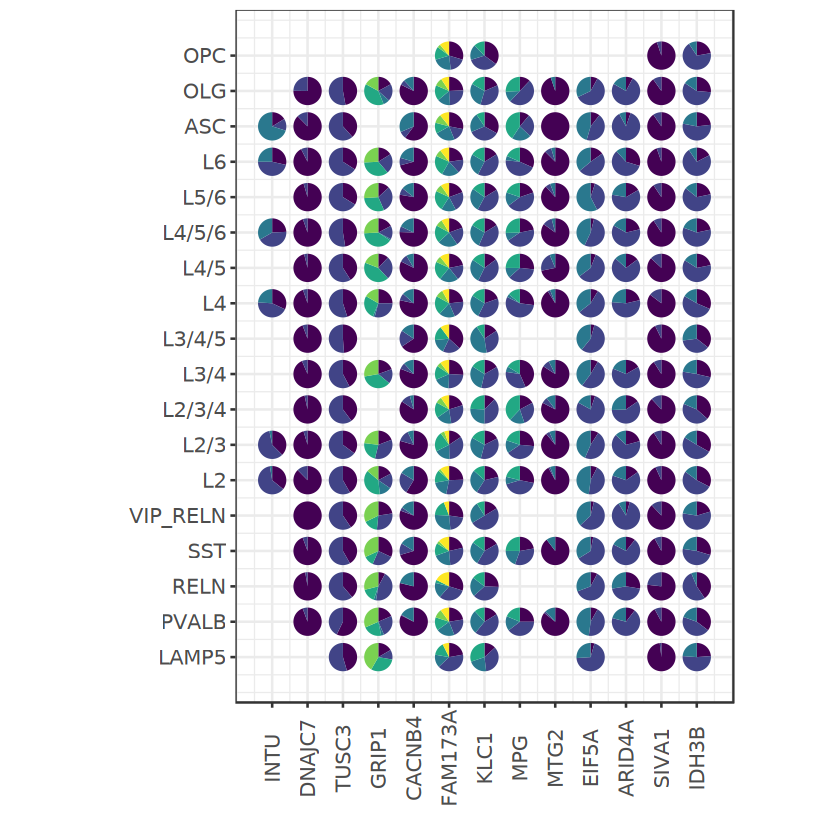

In [223]:
library(patchwork)
caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
casectl$gene_id = factor(casectl$gene_id,levels = caseg)
plt = ggplot() + 
      geom_scatterpie(data = casectl[casectl$gene_id %in% caseg, ],aes(y = groupid, x = geneidn, group = groupid,
                                           r = 0.4),color=NA,
                      cols=colnames(casectl)[4:12]) + 
      coord_fixed() +
      scale_y_continuous(breaks = c(1:length(unique(casectl$subclass))),labels = unique(casectl$subclass)) +
      scale_x_continuous(breaks = c(1:length(caseg)),labels = caseg) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_viridis(discrete=TRUE) +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),
                         axis.text.x = element_text(angle = 90,vjust = 0.5),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure4/case_subclass_isoform_rate_stat_pie_24_09_11.pdf",width = 4,height = 6)

file saved to result/figure4/case_subclass_isoform_rate_stat_FAM173A_24_09_11.pdf



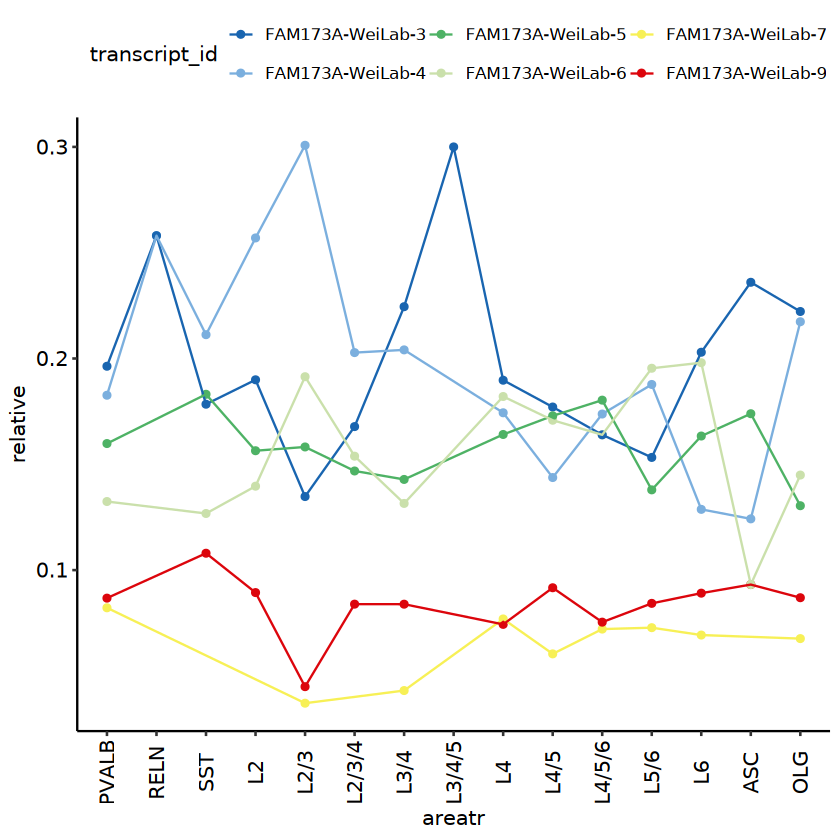

In [236]:
isosigi = isosigls$subclass
isosighub = isosigi[isosigi$gene_id == "FAM173A",]
isosighub = isosighub[!isosighub$areatr %in% c("VLMC","VIP","PV_CHC","MG"),]
isosighub = isosighub[isosighub$count > 10,]
isosighub = merge(isosighub,cellan,by.x = "areatr",by.y = "subclass")
isosighub = isosighub[order(isosighub$class,isosighub$areatr),]
isosighub$areatr = factor(isosighub$areatr,levels = unique(isosighub$areatr))
#head(isosighub)
pc = ggplot(isosighub,aes(x = areatr, y = relative, color = transcript_id,group = transcript_id)) + geom_point() + geom_line() + 
scale_color_discreterainbow() +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5))
pc
ggexport(pc,filename = "result/figure4/case_subclass_isoform_rate_stat_FAM173A_24_09_11.pdf",width = 4,height = 4)

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 399 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 294 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 25 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 4 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 8 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 10 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 2 rows containing missing values or values outside the scale range
(`g

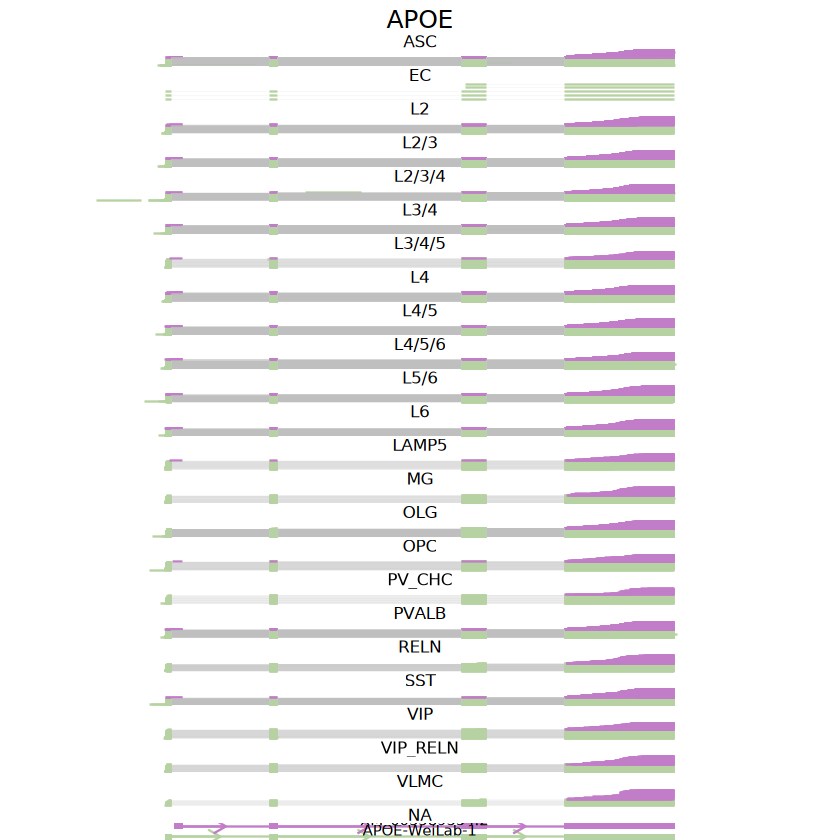

In [204]:
geneex = "APOE"
grtdfl = BuildPlotBed(fsraw.cor,longbed,"subclass",geneex,NULL)
pci = tryCatch(IsoformReadPlot(gtf, grtdfl,geneex,onlyhub = T), 
                                                  error = function(e) NULL)
pci
fileid = paste0("result/figure4/dtu_case_ls_subclass_",geneex,"_24_09_17.pdf")
ggexport(pci,filename = fileid,
           width = 10,height = 20)

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 2 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 2 rows containing missing values or values outside the scale range
(`geom_segment()`)."


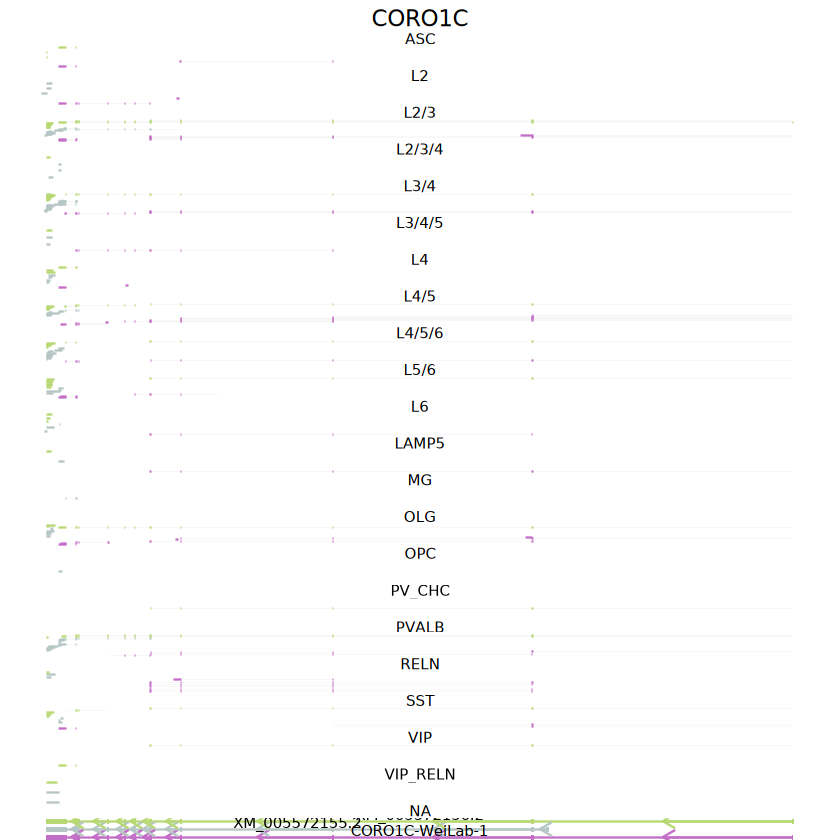

In [141]:
geneex = "LSAMP"
grtdfl = BuildPlotBed(fsraw.cor,longbed,"subclass",geneex,NULL)
pci = tryCatch(IsoformReadPlot(gtf, grtdfl,geneex,onlyhub = T), 
                                                  error = function(e) NULL)
pci

In [198]:
isosiggl = isosigls.cl$GLU_GLU
huntrans1 = unique(isosiggl[isosiggl$sig %in% c("Up","Down"),]$transcript_id)
isosigga = isosigls.cl$GABA_GABA
huntrans2 = unique(isosigga[isosigga$sig %in% c("Up","Down"),]$transcript_id)
isosignn = isosigls.cl$NonNeuron_NonNeuron
huntrans3 = unique(isosignn[isosignn$sig %in% c("Up","Down"),]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)
isosigi = isosigls$subclass
huntrans = unique(isosigi[isosigi$sig %in% c("Up","Down"),]$transcript_id)

isosiggl = isosiggl[isosiggl$transcript_id %in% huntrans,]
isosiggl = isosiggl[isosiggl$count > 10,]
isosiggl = isosiggl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigga = isosigga[isosigga$transcript_id %in% huntrans,]
isosigga = isosigga[isosigga$count > 10,]
isosigga = isosigga %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosignn = isosignn[isosignn$transcript_id %in% huntrans,]
isosignn = isosignn[isosignn$count > 10,]
isosignn = isosignn %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosiggl,isosigga,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosignn,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,AACS,NM_001284010.1,0.17748918,1042,0.08448093,0.167565139
2,ABCC5,XM_005546512.2,0.09204793,718,0.13766234,0.275702734
3,ABHD2,XM_005560462.2,0.29729730,417,0.12527473,0.109890110
4,ABLIM1,XM_005566500.2,0.16936488,693,0.17857143,0.008712016
5,ACBD5,ACBD5-WeiLab-1,0.16368286,192,0.08149038,0.003411306
6,ACBD5,XM_005564836.2,0.26666667,560,0.15064103,0.025828460


[1] 1552

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.01295 0.12994 0.18265 0.19734 0.24928 0.59806 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.05429 0.10349 0.12495 0.17778 0.63158 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.09871 0.16157 0.16592 0.22482 0.60000 

file saved to result/figure4/class_within_subclass_dtu_delta_tern_24_09_17.pdf



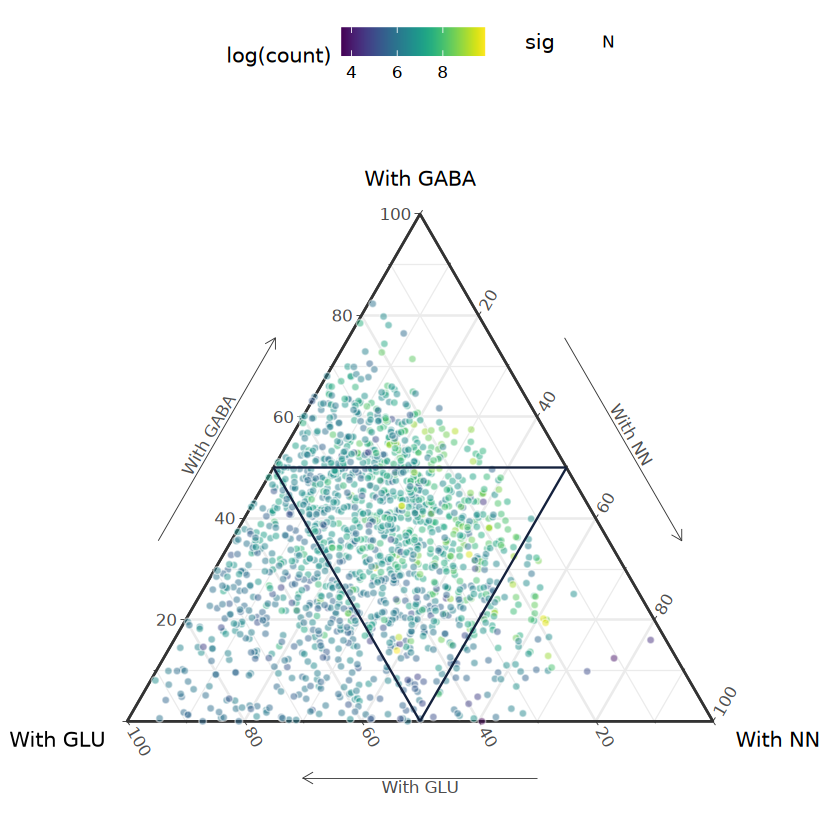

In [203]:
hubtrans = c("XM_015434930.1","XM_005545495.2","DDRGK1-WeiLab-1","XM_005576035.2","XM_005592027.2")
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubtrans = NULL
hubgene = c("ARPP21","DDRGK1","CAPRIN1","SLC8A1","ARL2BP")
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   # geom_text(data=isosigtri[isosigtri$sig != "N",],
   #           aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
xlab("With GLU")+ 
ylab("With GABA")+
zlab("With NN")+ 
scale_fill_viridis() +
scale_color_manual(values = mycolors) +
theme(legend.position = "top")
p2
ggexport(p2,filename = "result/figure4/class_within_subclass_dtu_delta_tern_24_09_17.pdf",width = 5,height = 5)

In [62]:
library(readxl)
all_sheets <- read_excel("ref/human_Brain_drug_target_and_GPCR_20240826.xlsx", sheet = 1)
head(all_sheets)
tfgene = read.delim("ref/Macaca_fascicularis_TF.txt")
tfgene = unique(tfgene$Symbol)
spgene = read.delim("ref/splicing_factor_gene_in_macaca_fas.txt")
spgene = unique(spgene$Symbol)

HumanGPCR,Opentarget-Drugs,GPCR-Drugs
<chr>,<chr>,<chr>
ACKR1,ABAT,ABAT
ACKR2,ABCA1,ABCA1
ACKR3,ABCC8,ABCC8
ACKR4,ABL1,ABL1
ADCYAP1R1,ACE,ACE
ADGRA1,ACHE,ACHE


In [86]:
rbpgene = read.csv("ref/RBPDB_v1.3.1_proteins_human_2012-11-21.csv",header = F)
head(rbpgene)
rbpgene = unique(rbpgene$V5)
length(rbpgene)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13
,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,1226,ENSG00000003756,2010-03-18,2010-04-24,RBM5,RNA binding motif protein 5 [Source:HGNC Symbol;Acc:9902],Homo sapiens,9606,RRMx2; Znf_C2H2x1,LUCA15; H37,\N,\N,\N
2,1228,ENSG00000004534,2010-03-18,2010-04-24,RBM6,RNA binding motif protein 6 [Source:HGNC Symbol;Acc:9903],Homo sapiens,9606,RRMx2,DEF-3; 3G2; NY-LU-12; g16; DEF3,\N,\N,\N
3,1229,ENSG00000005189,2010-03-18,2010-04-05,,Putative RNA exonuclease NEF-sp (EC 3.1.-.-) [Source:UniProtKB/Swiss-Prot;Acc:Q96IC2],Homo sapiens,9606,RRMx2,,\N,\N,\N
4,1230,ENSG00000006047,2010-03-18,2010-04-24,YBX2,Y box binding protein 2 [Source:HGNC Symbol;Acc:17948],Homo sapiens,9606,CSDx1,MSY2; CSDA3,\N,\N,\N
5,1231,ENSG00000009307,2010-03-18,2010-04-29,CSDE1,"cold shock domain containing E1, RNA-binding [Source:HGNC Symbol;Acc:29905]",Homo sapiens,9606,CSDx5,D1S155E; UNR,\N,\N,\N
6,1233,ENSG00000011304,2010-03-18,2010-04-07,PTBP1,polypyrimidine tract binding protein 1 [Source:HGNC Symbol;Acc:9583],Homo sapiens,9606,RRMx4,HNRPI; HNRNP-I; PTB2; PTB3; PTB-1; PTB4; pPTB,\N,\N,\N


[1] 407

In [88]:
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
hubgene = unique(isosigi$gene_id)
length(hubgene)

length(unique(unlist(all_sheets[,1])))
drugovl = intersect(unique(unlist(all_sheets[,1])),hubgene)
length(drugovl)
drugovl
#all_sheets[all_sheets$HumanGPCR,]

[1] 1948

[1] 402

[1] 9

[1] "ADCYAP1R1" "ADGRB3"    "ADGRG1"    "ADGRL2"    "ADGRL3"    "GPR137"   
[7] "GPR19"     "GRM8"      "TPRA1"

In [89]:
length(unique(tfgene))
drugovl = intersect(unique(tfgene),hubgene)
length(drugovl)
drugovl

[1] 1251

[1] 131

[1] "ZNF385B" "RFX3"    "CCDC88A" "GTF2I"   "TSC22D1" "ZNF740"  "TEF"    
  [8] "SOX6"    "ZNF471"  "MEF2C"   "CREB3L4" "ZNF583"  "ZNF107"  "ZNF567" 
 [15] "HMBOX1"  "ZNF644"  "ZNF322"  "ZNF658"  "BAZ2A"   "ZNF224"  "KLF12"  
 [22] "ZFP30"   "TOX2"    "NFIX"    "ZNF383"  "ZNF446"  "MXI1"    "NR3C2"  
 [29] "ZNF540"  "ZBTB14"  "ZNF292"  "TRERF1"  "ZNF84"   "THAP5"   "ZNF800" 
 [36] "NFIB"    "ZNF585A" "BBX"     "ZNF226"  "HOPX"    "ZNF512"  "ZFPM2"  
 [43] "AFF1"    "NCOA3"   "EGR2"    "ZNF131"  "ZNF142"  "ZNF174"  "SMARCC2"
 [50] "IRF2"    "NFE2L2"  "BCL11A"  "ID4"     "ZEB1"    "ATF2"    "MKX"    
 [57] "ZNF181"  "ZNF362"  "ERF"     "ATF7"    "ZNF576"  "FOXN3"   "ZNF48"  
 [64] "CAMTA1"  "MBD1"    "STAT3"   "ZNF445"  "HBP1"    "ADNP"    "ZBTB38" 
 [71] "CREB1"   "ZHX3"    "NFAT5"   "ZFP62"   "ARNTL"   "ZNF438"  "ZSCAN31"
 [78] "KLF3"    "DDIT3"   "ZNF385A" "PPARD"   "ELF2"    "THRB"    "ZBTB43" 
 [85] "ZNF605"  "AEBP2"   "ZNF521"  "CSRNP3"  "POU6F1"  "ZNF655"  "ZNF135" 
 [92] "THRA"    "CREM"    "TCF7L2"  "MIER1"   "RBAK"    "ZFX"     "ZNF782" 
 [99] "ZNF287"  "ZNF532"  "TSHZ1"   "ARID4A"  "ZBTB20"  "ZBTB44"  "ZFP28"  
[106] "SMARCE1" "DMTF1"   "RORA"    "KMT2C"   "ZNF347"  "ZEB2"    "ZNF528" 
[113] "MBD2"    "TCF12"   "GTF3A"   "ZNF212"  "GPBP1"   "ZGPAT"   "ZNF609" 
[120] "CNBP"    "HIF1A"   "SON"     "CREBRF"  "TMF1"    "ZNFX1"   "RBCK1"  
[127] "ZNF608"  "ZNF326"  "PRDM11"  "AHCTF1"  "GATAD1"

In [92]:
length(unique(spgene))
drugovl = intersect(unique(spgene),hubgene)
length(drugovl)
drugovl

[1] 140

[1] 16

[1] "CCDC12" "CELF5"  "DDX17"  "PHF3"   "PTBP2"  "RBFOX2" "RBM39"  "SF1"   
 [9] "SRSF10" "SRSF11" "SRSF4"  "SRSF5"  "SRSF7"  "TCERG1" "U2AF1"  "YTHDC1"

In [245]:
length(unique(rbpgene))
drugovl = intersect(unique(rbpgene),hubgene)
length(drugovl)
drugovl
isosigtmp = isosigi[isosigi$gene_id %in% drugovl,]
table(isosigtmp$areatr)
isosigtmp

[1] 407

[1] 61

[1] "RBM5"      "MATR3"     "ZC3H11A"   "SPEN"      "ZNF638"    "YTHDC1"   
 [7] "FUS"       "CIRBP"     "RBM23"     "ZC3H14"    "ACIN1"     "ZC3H12B"  
[13] "DNAJC17"   "PPARGC1A"  "KRR1"      "QKI"       "FXR1"      "PTBP2"    
[19] "AKAP1"     "HNRNPA2B1" "HNRNPH2"   "ZC3H4"     "RBM39"     "UNK"      
[25] "SRRM1"     "THUMPD3"   "SYNCRIP"   "LARP1B"    "G3BP1"     "CPSF7"    
[31] "MSI2"      "RBM45"     "PPARGC1B"  "U2AF1"     "LSM6"      "TRA2A"    
[37] "KIAA0430"  "SF1"       "HNRNPF"    "HNRNPA3"   "RBM4"      "SAMD4B"   
[43] "EWSR1"     "SNRNP35"   "RBM33"     "YTHDF3"    "RNPC3"     "PCBP2"    
[49] "ZGPAT"     "HELZ"      "PRR3"      "CCAR1"     "LEMD3"     "UPF3B"    
[55] "RCAN2"     "GTF3A"     "SRRM2"     "APTX"      "SNRPC"     "TROVE2"   
[61] "ZRANB2"


     ASC       L2     L2/3   L2/3/4     L3/4   L3/4/5       L4     L4/5 
      41       27        5       17        8        7       14       14 
  L4/5/6     L5/6       L6    LAMP5       MG      OLG      OPC    PVALB 
      11       21       19        6        3       19       13       14 
    RELN      SST      VIP VIP_RELN 
      10        9       12        7 

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
891,ACIN1,XM_005560838.1,RELN,28,37,0.7567568,0.8583684,0.8656264,-0.1088697,Down,2.066932e-04,1.420800e-03
3078,AKAP1,XR_001486059.1,ASC,34,88,0.3863636,0.5775563,0.5934890,-0.2071254,Down,2.447277e-04,1.633685e-03
3086,AKAP1,XR_001486059.1,L5/6,38,50,0.7600000,0.5775563,0.5623527,0.1976473,Up,2.447277e-04,1.633685e-03
3089,AKAP1,XR_001486059.1,PVALB,41,56,0.7321429,0.5775563,0.5646741,0.1674688,Up,2.447277e-04,1.633685e-03
6386,APTX,XM_005581546.2,L2,21,35,0.6000000,0.7624074,0.7827083,-0.1827083,Down,1.673437e-04,1.193585e-03
6389,APTX,XM_005581546.2,L4,36,41,0.8780488,0.7624074,0.7479522,0.1300966,Up,1.673437e-04,1.193585e-03
6391,APTX,XM_005581546.2,L4/5/6,16,26,0.6153846,0.7624074,0.7807852,-0.1654006,Down,1.673437e-04,1.193585e-03
6393,APTX,XM_005581546.2,L6,20,22,0.9090909,0.7624074,0.7440719,0.1650190,Up,1.673437e-04,1.193585e-03
6399,APTX,XM_015437086.1,L2,11,35,0.3142857,0.2038173,0.1900087,0.1242770,Up,1.673437e-04,1.193585e-03


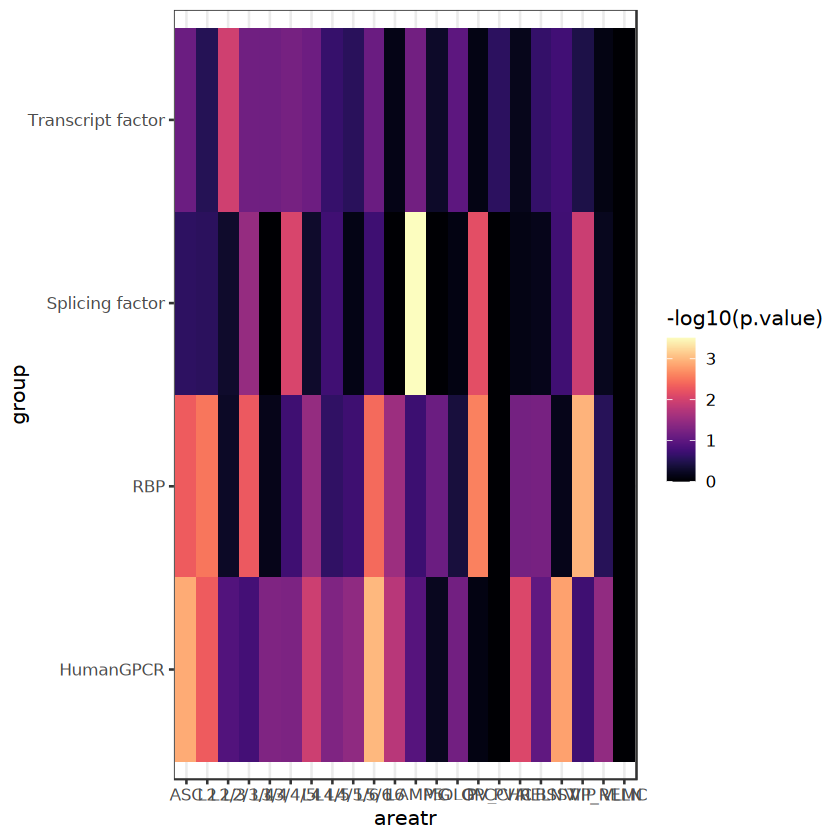

In [254]:
# 例子数据
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N",]
areatrs = unique(isosigi$areatr)

FishEnrich = function(geneset,funcset,total_genen){
    drugovl = intersect(unique(funcset),geneset)
    geneset_size <- length(geneset)    # 感兴趣的基因集大小
    functional_category_size <- length(unique(funcset))  # 特定功能类别中的基因总数
    both <- length(drugovl)  # 两个集合都包含的基因数量
    total_genes <- 20000  # 整个基因组中的基因总数

    contingency_table <- matrix(c(both, geneset_size - both, 
                              functional_category_size - both, 
                              total_genes - (geneset_size + functional_category_size - both)), 
                            nrow = 2)

    # 进行Fisher精确检验
    fisher_test_result <- fisher.test(contingency_table)
    # 输出p值
    p_value <- fisher_test_result$p.value

    # 计算富集分数（Enrichment Ratio），这通常是感兴趣的基因集中具有特定功能的基因比例与整个基因组中该功能基因比例的比值
    enrichment_ratio <- (both / geneset_size) / (functional_category_size / total_genes)
    res = data.frame("p.value" = p_value,"enrichscore" = enrichment_ratio)
    return(res)
}

goana = NULL
for(i in 1:length(areatrs)){
    isosigii = isosigi[isosigi$areatr == areatrs[i],]
    hubgene = unique(isosigii$gene_id)
    res.rbp = FishEnrich(hubgene,rbpgene,20000)
    res.rbp$group = "RBP"
    res.spf = FishEnrich(hubgene,spgene,20000)
    res.spf$group = "Splicing factor"
    res.tf = FishEnrich(hubgene,tfgene,20000)
    res.tf$group = "Transcript factor"
    res.hp = FishEnrich(hubgene,unlist(all_sheets[,1]),20000)
    res.hp$group = "HumanGPCR"
    goanai = rbind(res.rbp,res.spf,res.tf,res.hp)
    goanai$areatr = areatrs[i]
    goana = rbind(goana,goanai)
}
ph = ggplot(goana,aes(x = areatr,y = group, fill = -log10(p.value),size = enrichment_ratio)) + geom_point() + theme_bw() + 
scale_fill_viridis(option = "A")
ph


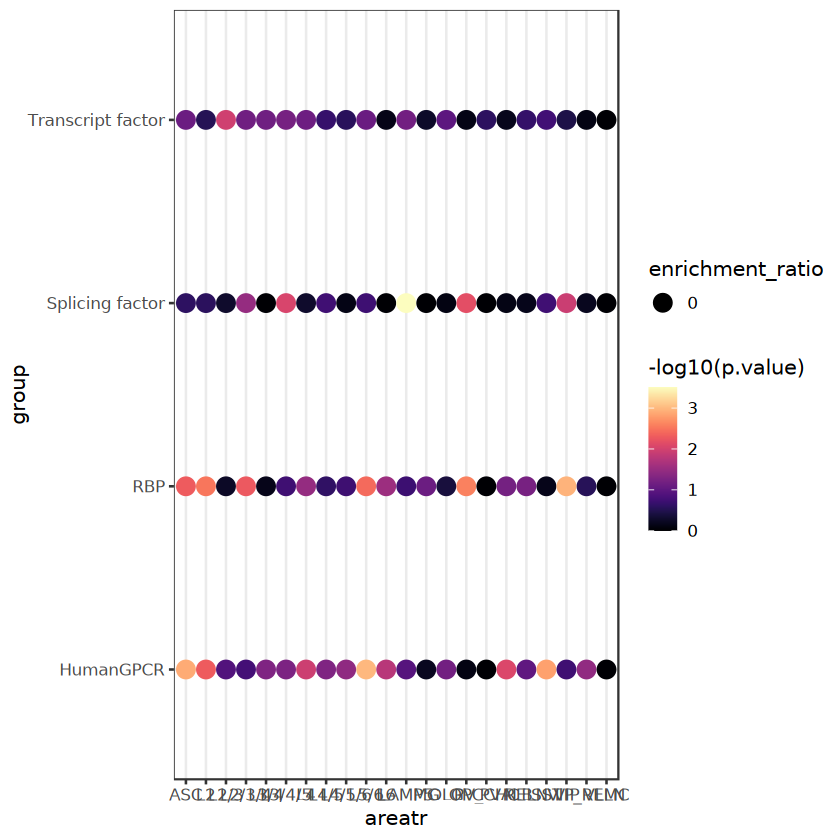

In [257]:
ph = ggplot(goana,aes(x = areatr,y = group, color = -log10(p.value),size = enrichment_ratio)) + geom_point() + theme_bw() + 
scale_color_viridis(option = "A") + coord_fixed()
ph

In [ ]:
ggexport(ph,filename = "result/figure4/subclass_dtu_enrich_analysis_24_09_17.pdf",width = 8,height = 4)

## Analysis Spatial and Cell interact

### DTU of layer/lobe/cell overlap

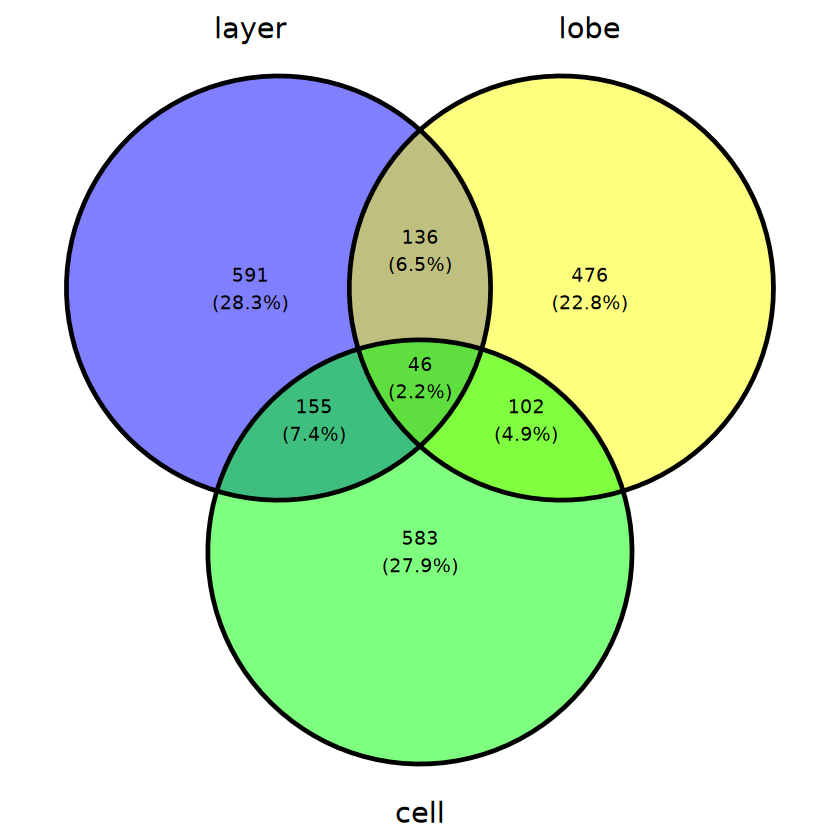

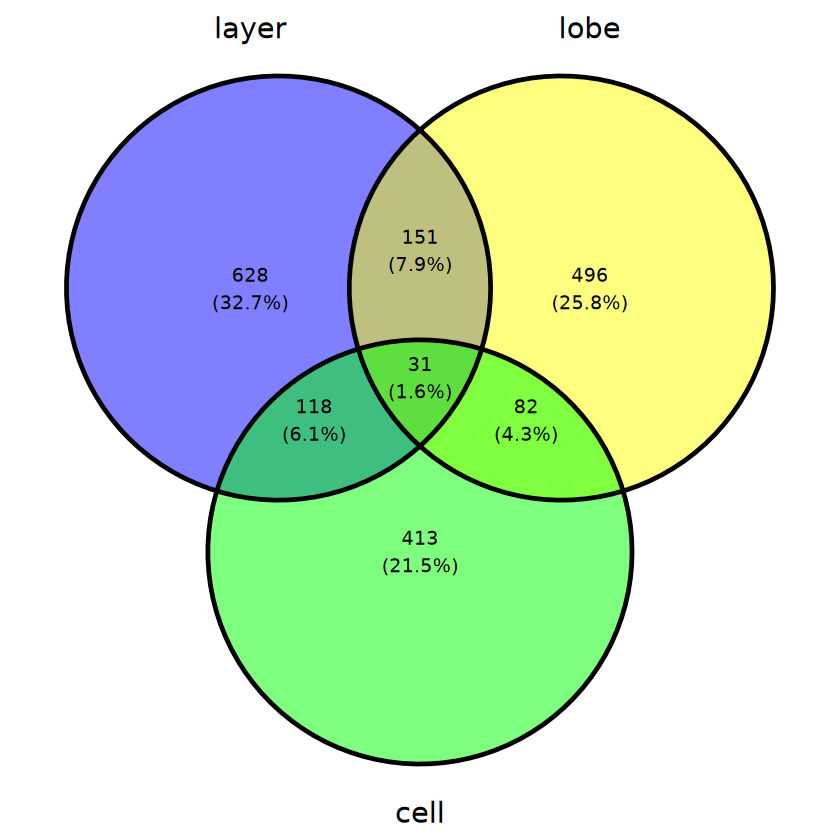

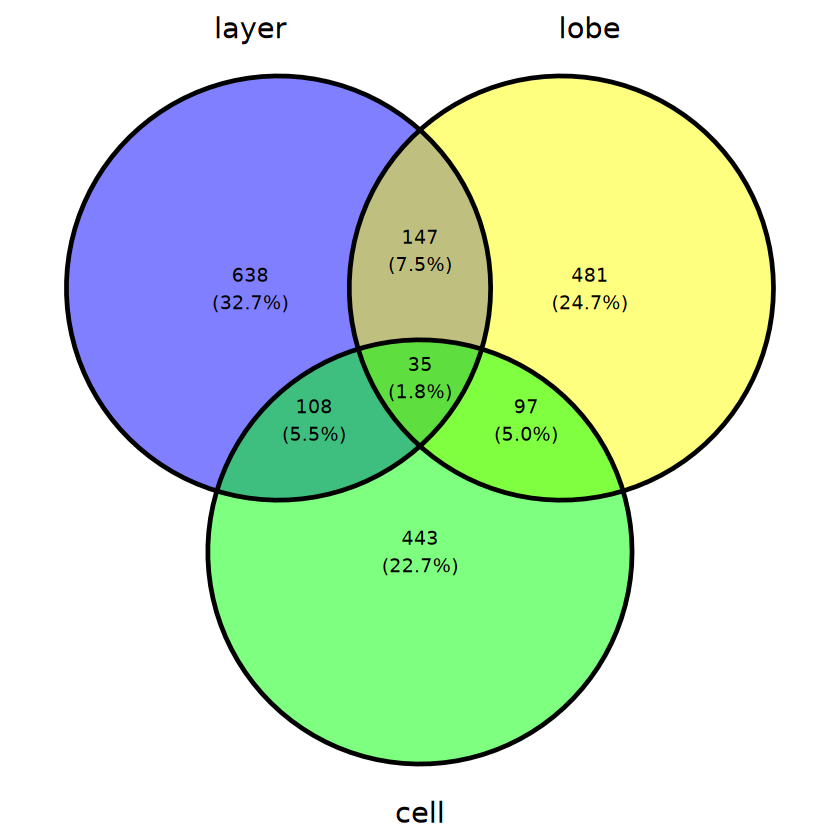

In [69]:
dtu.class = qread("result/figure3/class_DTU_by_subclass_ttest_24_11_05.qs")
siglydf = isosigls$layer
siglbdf = isosigls$lobe
sigcldf = isosigls$subclass
# sigcl = sigcl[sigcl$sig != "N",]$gene_id
# sigly = sigly[sigly$sig != "N" & sigly$count > 30,]
# sigly = sigly %>% group_by(gene_id) %>% mutate(tcount = sum(count))
# sigly$tcount = as.integer(log10(sigly$tcount))
# sigly$group = "layer"
# sigly[sigly$gene_id %in% sigcl,]$group = "cell"
# sigly = sigly %>% group_by(tcount,group) %>% summarise(gcount = length(unique(gene_id)))
# ggplot(sigly,aes(x = tcount,y = gcount,fill = group)) + geom_bar(stat = "identity")

# siglb = siglb[siglb$sig != "N"& siglb$count > 30,]
# siglb = siglb %>% group_by(gene_id) %>% mutate(tcount = sum(count))
# siglb$tcount = as.integer(log10(siglb$tcount))
# siglb$group = "lobe"
# siglb[siglb$gene_id %in% sigcl,]$group = "cell"
# siglb = siglb %>% group_by(tcount,group) %>% summarise(gcount = length(unique(gene_id)))
# ggplot(siglb,aes(x = tcount,y = gcount,fill = group)) + geom_bar(stat = "identity")
#sigcl = sigcl[sigcl$tcount > 1000,]
sigly = unique(siglydf[siglydf$sig != "N",]$gene_id)
siglb = unique(siglbdf[siglbdf$sig != "N",]$gene_id)
# sigcl = unique(sigcl[sigcl$sig != "N",]$gene_id)
# sigly = sigly[sigly %in% sigcl$gene_id]
# siglb = siglb[siglb %in% sigcl$gene_id]
sigcl = unique(c(sigcldf[sigcldf$sig != "N" & sigcldf$areatr == "ASC",]$gene_id,dtu.class$gene_id))
ggvenn::ggvenn(list("layer" = sigly,"lobe" = siglb,"cell" = sigcl))

sigcl = unique(c(sigcldf[sigcldf$sig != "N" & sigcldf$areatr == "OLG",]$gene_id,dtu.class$gene_id))
ggvenn::ggvenn(list("layer" = sigly,"lobe" = siglb,"cell" = sigcl))

sigcl = unique(c(sigcldf[sigcldf$sig != "N" & sigcldf$areatr == "L2",]$gene_id,dtu.class$gene_id))
ggvenn::ggvenn(list("layer" = sigly,"lobe" = siglb,"cell" = sigcl))

In [8]:
summary(sigly$tcount)
summary(siglb$tcount)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.500   2.000   2.286   3.000   4.000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1.00    1.25    2.00    2.00    2.75    3.00 

In [127]:
modelg = modelmx1.hub[modelmx1.hub$gene_id %in% c(sigly),]
length(unique(modelmx1.hub$gene_id))
length(unique(modelg$gene_id))
table(modelg$sig)

[1] 376

[1] 48


                           cell      cell-layer cell-layer-lobe       cell-lobe 
              4              18               1               4              13 
          layer      layer-lobe            lobe 
              4               1               3 

In [122]:
head(modelmx1.hub)

,gene_id,cell,layer,lobe,sig
,<chr>,<dbl>,<dbl>,<dbl>,<chr>
1,ACOT7,1.799344,0.13533841,0.03948331,cell
2,ACTR2,3.669600,1.95906793,1.77617600,cell-layer-lobe
3,ADGRB3,2.361913,0.52543377,1.62748289,cell-lobe
4,ADNP,3.757723,0.85641240,2.16464617,cell-lobe
5,AGAP3,0.268942,0.08276584,0.07465639,
6,AK1,1.521545,0.12737573,1.09151706,cell


### Calculate layer and subclass dtu correlation

In [7]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig != "N",]$transcript_id)
isosigc = isosigls$subclass
huntrans2 = unique(isosigc[isosigc$sig != "N",]$transcript_id)
huntrans = c(huntrans1,huntrans2)
print(length(unique(huntrans)))

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl$drl = isosigl$relative - isosigl$meanrelative
isosigl = unique(isosigl[,c("transcript_id","areatr","drl")])
colnames(isosigl)[2] = "layer"

isosigc$drc = isosigc$relative - isosigc$meanrelative
isosigc = isosigc[,c("transcript_id","areatr","drc")]
colnames(isosigc)[2] = "subclass"
isosigc = merge(isosigc,isosigl,by = "transcript_id")
isosigc.st = isosigc %>% group_by(layer,subclass) %>% summarise(cor = cor(drl,drc))
head(isosigc.st)

[1] 2611


`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.


layer,subclass,cor
<chr>,<chr>,<dbl>
l1,ASC,0.41428918
l1,L2,-0.03414151
l1,L2/3,-0.21047148
l1,L2/3/4,0.04273920
l1,L3/4,-0.21855451
l1,L3/4/5,-0.17349189


In [8]:
cellprop.layer = fsraw.cor[fsraw.cor$class != "",] %>% group_by(layer,class,subclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.layer = cellprop.layer %>% group_by(layer) %>% mutate(cellprop = cellnum/sum(cellnum))
isosigc.st = merge(isosigc.st,cellprop.layer,by = c("layer","subclass"))

`summarise()` has grouped output by 'layer', 'class'. You can override using
the `.groups` argument.


Ignoring unknown labels:
• fill : "Correlation of Delta Isoform ratio"
Ignoring unknown labels:
• fill : "Correlation of Delta Isoform ratio"
file saved to result/figure4/layer_subclass_dtu_correlation_25_12_03.pdf



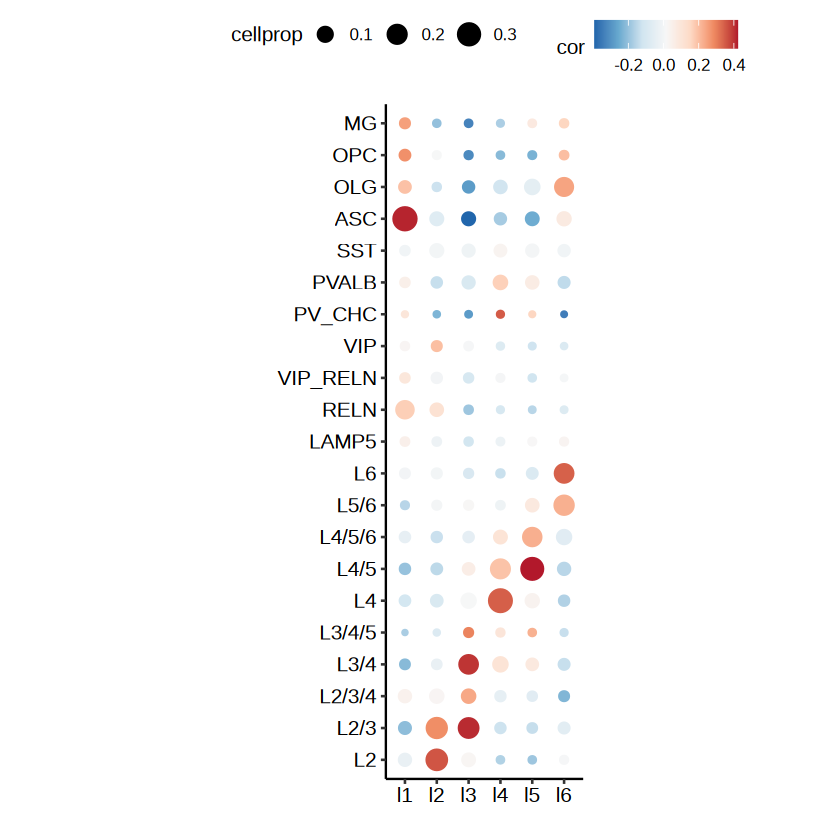

In [11]:
isosigc.st$subclass = factor(isosigc.st$subclass,levels = suborder)
p = ggplot(isosigc.st[as.character(isosigc.st$subclass) != "VLMC",],aes(x = layer,y = subclass,color = cor,size = cellprop)) + geom_point() +
theme_pubr() + scale_color_distiller(palette = "RdBu") + coord_fixed() + xlab("") + ylab("") + labs(fill = "Correlation of Delta Isoform ratio")
p
ggexport(p,filename = "result/figure4/layer_subclass_dtu_correlation_25_12_03.pdf",width = 5,height = 5)

[1] 2463


`summarise()` has grouped output by 'lobe'. You can override using the
`.groups` argument.


,layer,subclass,cor,class,cellnum,cellprop
,<chr>,<fct>,<dbl>,<chr>,<int>,<dbl>
1,l1,ASC,0.41428918,NonNeuron,5203,0.3360025831
2,l1,L2,-0.03414151,GLU,788,0.0508879561
3,l1,L2/3,-0.21047148,GLU,708,0.0457216661
4,l1,L2/3/4,0.04273920,GLU,802,0.0517920568
5,l1,L3/4,-0.21855451,GLU,321,0.0207297385
6,l1,L3/4/5,-0.17349189,GLU,14,0.0009041007


`summarise()` has grouped output by 'lobe', 'class'. You can override using the
`.groups` argument.
Ignoring unknown labels:
• fill : "Correlation of Delta Isoform ratio"


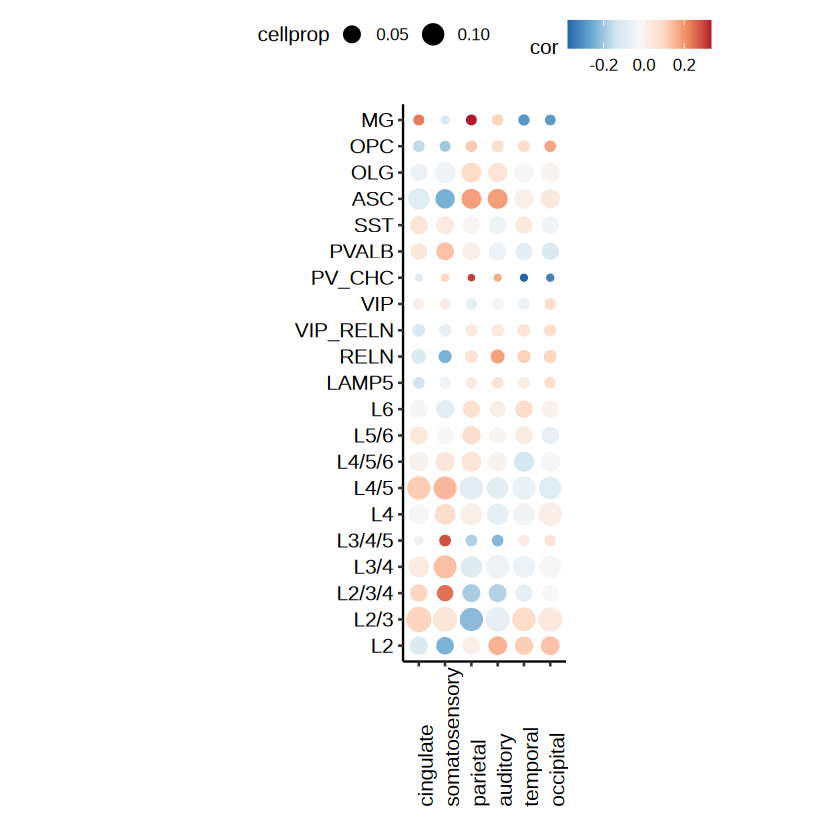

In [12]:
#
isosigl = isosigls$lobe
huntrans1 = unique(isosigl[isosigl$sig != "N",]$transcript_id)
isosigc = isosigls$subclass
huntrans2 = unique(isosigc[isosigc$sig != "N",]$transcript_id)
huntrans = c(huntrans1,huntrans2)
print(length(unique(huntrans)))

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl$drl = isosigl$relative - isosigl$meanrelative
isosigl = unique(isosigl[,c("transcript_id","areatr","drl")])
colnames(isosigl)[2] = "lobe"

isosigc$drc = isosigc$relative - isosigc$meanrelative
isosigc = isosigc[,c("transcript_id","areatr","drc")]
colnames(isosigc)[2] = "subclass"
isosigc = merge(isosigc,isosigl,by = "transcript_id")
isosigc.st2 = isosigc %>% group_by(lobe,subclass) %>% summarise(cor = cor(drl,drc))
head(isosigc.st)
cellprop.lobe = fsraw.cor[fsraw.cor$class != "",] %>% group_by(lobe,class,subclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.lobe = cellprop.lobe %>% group_by(lobe) %>% mutate(cellprop = cellnum/sum(cellnum))
isosigc.st2 = merge(isosigc.st2,cellprop.lobe,by = c("lobe","subclass"))
isosigc.st2$subclass = factor(isosigc.st2$subclass,levels = suborder)
isosigc.st2$lobe = factor(isosigc.st2$lobe,levels = lobeorder)
p = ggplot(isosigc.st2[as.character(isosigc.st2$subclass) != "VLMC",],aes(x = lobe,y = subclass,color = cor,size = cellprop)) + geom_point() +
theme_pubr() + scale_color_distiller(palette = "RdBu") + coord_fixed() + xlab("") + ylab("") + 
labs(fill = "Correlation of Delta Isoform ratio") + theme(axis.text.x = element_text(angle = 90,hjust = 0))
p

In [13]:
ggexport(p,filename = "result/figure4/lobe_subclass_dtu_correlation_25_12_03.pdf",width = 6.5,height = 6.5)

Ignoring unknown labels:
• fill : "Correlation of Delta Isoform ratio"
file saved to result/figure4/lobe_subclass_dtu_correlation_25_12_03.pdf



[1] 3622


`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'region', 'class'. You can override using
the `.groups` argument.
Ignoring unknown labels:
• fill : "Correlation of Delta Isoform ratio"


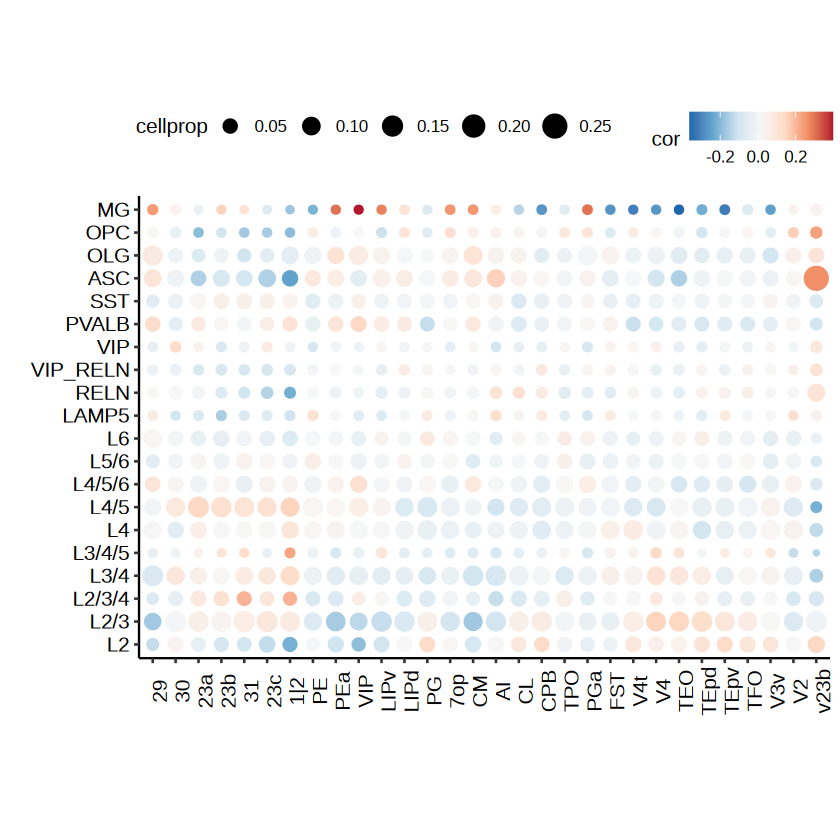

In [16]:
#
isosigl = isosigls$region
huntrans1 = unique(isosigl[isosigl$sig != "N",]$transcript_id)
isosigc = isosigls$subclass
huntrans2 = unique(isosigc[isosigc$sig != "N",]$transcript_id)
huntrans = c(huntrans1,huntrans2)
print(length(unique(huntrans)))

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl$drl = isosigl$relative - isosigl$meanrelative
isosigl = unique(isosigl[,c("transcript_id","areatr","drl")])
colnames(isosigl)[2] = "region"

isosigc$drc = isosigc$relative - isosigc$meanrelative
isosigc = isosigc[,c("transcript_id","areatr","drc")]
colnames(isosigc)[2] = "subclass"
isosigc = merge(isosigc,isosigl,by = "transcript_id")
isosigc.st2 = isosigc %>% group_by(region,subclass) %>% filter(length(unique(transcript_id)) > 100) %>% summarise(cor = cor(drl,drc))

cellprop.lobe = fsraw.cor[fsraw.cor$class != "",] %>% group_by(region,class,subclass) %>% 
summarise(cellnum = length(unique(cell_id)))
cellprop.lobe = cellprop.lobe %>% group_by(region) %>% mutate(cellprop = cellnum/sum(cellnum))
isosigc.st2 = merge(isosigc.st2,cellprop.lobe,by = c("region","subclass"))
isosigc.st2$subclass = factor(isosigc.st2$subclass,levels = suborder)
isosigc.st2$region = factor(isosigc.st2$region,levels = regionorder)

p = ggplot(isosigc.st2[as.character(isosigc.st2$subclass) != "VLMC",],aes(x = region,y = subclass,color = cor,size = cellprop)) + 
    geom_point() +
    theme_pubr() + scale_color_distiller(palette = "RdBu") + coord_fixed() + xlab("") + ylab("") + 
    labs(fill = "Correlation of Delta Isoform ratio") + theme(axis.text.x = element_text(angle = 90))

p

In [17]:
ggexport(p,filename = "result/figure4/region_subclass_dtu_correlation_25_12_03.pdf",width = 7,height = 7)

Ignoring unknown labels:
• fill : "Correlation of Delta Isoform ratio"
file saved to result/figure4/region_subclass_dtu_correlation_25_12_03.pdf



file saved to result/figure4/region_subclass_dtu_correlation_cellprop_cmpare_25_12_03.pdf



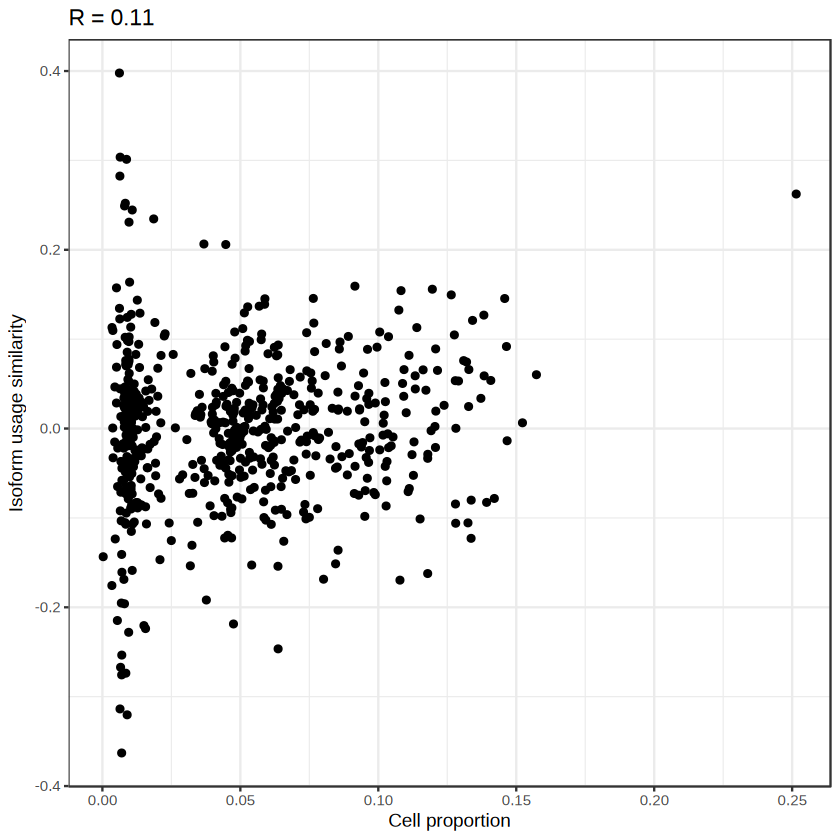

In [19]:
# cor(isosigc.st$cor,isosigc.st$cellprop)
library(ggrepel)
# ggplot(isosigc.st,aes(x = cellprop, y = cor)) + geom_point()
cortext = round(cor(isosigc.st2$cor,isosigc.st2$cellprop),3)
isosigc.st2$highlight = "N"
isosigc.st2$group = paste0(as.character(isosigc.st2$region),"-",as.character(isosigc.st2$subclass))
isosigc.st2[isosigc.st2$subclass %in% c("L3/4"),]$highlight = "Y"

p1.1 = ggplot(isosigc.st2,aes(x = cellprop, y = cor)) + geom_point() + 
    # geom_text_repel(data = isosigc.st2[isosigc.st2$highlight == "Y",],aes(label = group)) +
     theme_bw() + ggtitle(paste0("R = ",cortext)) + xlab("Cell proportion")  + 
     ylab("Isoform usage similarity") + scale_color_manual(values = c("black","red")) + theme(legend.position = "none")
p1.1
ggexport(p1.1,filename = "result/figure4/region_subclass_dtu_correlation_cellprop_cmpare_25_12_03.pdf",width =  4,height = 4)

In [ ]:
#sd(isosigc.st2[isosigc.st2$subclass %in% c("L3/4"),]$cellprop)
mean(isosigc.st2[isosigc.st2$subclass %in% c("L3/4") & isosigc.st2$region %in% c("23a","23b","23c","31","1|2"),]$cellprop)
mean(isosigc.st2[isosigc.st2$subclass %in% c("L3/4") & !isosigc.st2$region %in% c("23a","23b","23c","31","1|2"),]$cellprop)
mean(isosigc.st2[isosigc.st2$subclass %in% c("L3/4") & isosigc.st2$region %in% c("23a","23b","23c","31","1|2"),]$cor)
mean(isosigc.st2[isosigc.st2$subclass %in% c("L3/4") & !isosigc.st2$region %in% c("23a","23b","23c","31","1|2"),]$cor)

file saved to result/figure4/layer_subclass_dtu_correlation_cellprop_cmpare_25_12_03.pdf



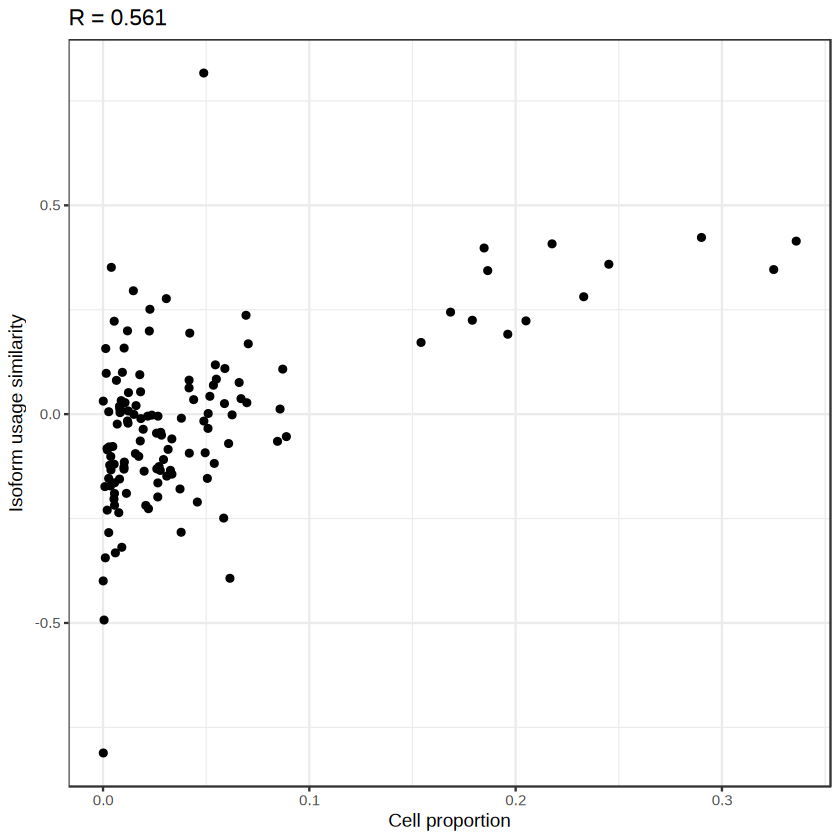

In [21]:
# cor(isosigc.st$cor,isosigc.st$cellprop)
# ggplot(isosigc.st,aes(x = cellprop, y = cor)) + geom_point()
cortext = round(cor(isosigc.st$cor,isosigc.st$cellprop),3)
isosigc.st$highlight = "N"
isosigc.st$group = paste0(as.character(isosigc.st$layer),"-",as.character(isosigc.st$subclass))
isosigc.st[isosigc.st$group %in% c("l1-ASC",
                                   "l1-RELN","l2-L2","l2-L2/3","l3-L2/3",
                                    "l3-L3/4","l4-L4","l4-L4/5","l5-L4/5","l5-L4/5/6",
                                     "l6-L5/6","l6-L6","l6-OLG"),]$highlight = "Y"
p1.1 = ggplot(isosigc.st,aes(x = cellprop, y = cor)) + geom_point() + 
     # geom_text_repel(data = isosigc.st[isosigc.st$highlight == "Y",],aes(label = group)) +
     theme_bw() + ggtitle(paste0("R = ",cortext)) + xlab("Cell proportion")  + 
     ylab("Isoform usage similarity") + scale_color_manual(values = c("black","red")) + theme(legend.position = "none")
p1.1
ggexport(p1.1,filename = "result/figure4/layer_subclass_dtu_correlation_cellprop_cmpare_25_12_03.pdf",width =  4,height = 4)

In [22]:
cor.test(isosigc.st$cor,isosigc.st$cellprop)


	Pearson's product-moment correlation

data:  isosigc.st$cor and isosigc.st$cellprop
t = 7.6889, df = 129, p-value = 3.33e-12
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.4304562 0.6678946
sample estimates:
      cor 
0.5605909 


In [66]:
isosigc.st[isosigc.st$subclass %in% c("L6"),]
isosigc.st[isosigc.st$subclass %in% c("L5/6"),]

,layer,subclass,cor,class,cellnum,cellprop,highlight,group
,<chr>,<fct>,<dbl>,<chr>,<int>,<dbl>,<chr>,<chr>
11,l1,L6,-0.049272030,GLU,335,0.02162686,N,l1-L6
33,l2,L6,-0.027588577,GLU,985,0.02364038,N,l2-L6
55,l3,L6,-0.073210420,GLU,2306,0.01570834,N,l3-L6
77,l4,L6,-0.110916808,GLU,504,0.01017709,N,l4-L6
98,l5,L6,-0.009339974,GLU,2414,0.03153577,N,l5-L6
120,l6,L6,0.327510779,GLU,11338,0.18645880,Y,l6-L6


,layer,subclass,cor,class,cellnum,cellprop,highlight,group
,<chr>,<fct>,<dbl>,<chr>,<int>,<dbl>,<chr>,<chr>
10,l1,L5/6,-0.167467555,GLU,124,0.008005165,N,l1-L5/6
32,l2,L5/6,0.008153176,GLU,624,0.014976240,N,l2-L5/6
54,l3,L5/6,0.027148414,GLU,2349,0.016001253,N,l3-L5/6
76,l4,L5/6,-0.012387136,GLU,588,0.011873271,N,l4-L5/6
97,l5,L5/6,0.046187142,GLU,4205,0.054932853,N,l5-L5/6
119,l6,L5/6,0.247325067,GLU,12467,0.205025737,Y,l6-L5/6


### Calculate jaccard score

In [91]:
#jaccard score between module and layer
MyJaccard = function(genels1,genels2){
    calculate_jaccard <- function(list1, list2) {
      intersection <- length(intersect(list1, list2))
      union <- length(union(list1, list2))
      jaccard_score <- intersection / union
      return(jaccard_score)
    }
    num_groups1 = length(genels1)
    num_groups2 = length(genels2)
    jaccard_matrix <- matrix(0, nrow = num_groups1, ncol = num_groups2)
    
    for (i in 1:num_groups1) {
      for (j in 1:num_groups2) {
        jaccard_matrix[i, j] <- calculate_jaccard(genels1[[i]], genels2[[j]])
      }
    }
    rownames(jaccard_matrix) <- names(genels1)
    colnames(jaccard_matrix) <- names(genels2)
    return(jaccard_matrix)
}
  MyJaccarddf = function(isosig1, isosig2){
    sigglscl = list()
    areatrs = unique(isosig1$areatr)
    for (i in 1:length(areatrs)) {
      sigglscli = isosig1[isosig1$sig!="N" & isosig1$sig != "Y" &
                            isosig1$areatr == areatrs[i],]
      sigglscl[[i]] = unique(paste0(sigglscli$transcript_id,"-",sigglscli$sig))
    }
    names(sigglscl) = areatrs
    
    sigglscl2 = list()
    areatrs = unique(isosig2$areatr)
    for (i in 1:length(areatrs)) {
      sigglscl2i = isosig2[isosig2$sig!="N" & isosig2$sig != "Y" &
                            isosig2$areatr == areatrs[i],]
      sigglscl2[[i]] = unique(paste0(sigglscl2i$transcript_id,"-",sigglscl2i$sig))
    }
    names(sigglscl2) = areatrs
    
    subclcor = MyJaccard(sigglscl,sigglscl2)
    subclcor[subclcor == 1] = NA
    return(subclcor)
  }
  MyJaccarddf2 = function(isosigls.cl, isosig2){
    sigglscl = list()
    for (i in 1:length(isosigls.cl)) {
      sigglscli = isosigls.cl[[i]][isosigls.cl[[i]]$sig!="N" &
                                     isosigls.cl[[i]]$sig != "Y",]
      sigglscl[[i]] = unique(paste0(sigglscli$transcript_id,"-",sigglscli$sig))
    }
    names(sigglscl) = names(isosigls.cl)
    
    sigglscl2 = list()
    areatrs = unique(isosig2$areatr)
    for (i in 1:length(areatrs)) {
      sigglscl2i = isosig2[isosig2$sig!="N" & isosig2$sig != "Y" &
                             isosig2$areatr == areatrs[i],]
      sigglscl2[[i]] = unique(paste0(sigglscl2i$transcript_id,"-",sigglscl2i$sig))
    }
    names(sigglscl2) = areatrs
    
    subclcor = MyJaccard(sigglscl,sigglscl2)
    subclcor[subclcor == 1] = NA
    return(subclcor)
}


In [138]:
head(mjcl)

,Var1,Var2,value
,<fct>,<fct>,<dbl>
1,L2,l1,0.022691706
2,L2/3,l1,0.008100810
3,L2/3/4,l1,0.023188406
4,L3/4,l1,0.007483630
5,L3/4/5,l1,0.005813953
6,L4,l1,0.017840376


In [92]:
#isosigi = bind_rows(isosigls$subclass,isosigls.cl$GLU_GLU,isosigls.cl$GABA_GABA,isosigls.cl$NonNeuron_NonNeuron)

mjc = MyJaccarddf(isosigls$subclass,isosigls$layer)
library(RColorBrewer)
mjc = mjc[suborder[suborder %in% rownames(mjc)],paste0("l",1:6)]
mjcl = melt(mjc)
colnames(mjcl) = c("subclass","layer","value")
mjcl = merge(mjcl,cellprop.layer,by = c("layer","subclass"))
#mjcht = Heatmap(mjc,col =  colorRampPalette((brewer.pal(n = 9, name ="YlGnBu")))(100),cluster_columns = F,
#                cluster_rows = F,name = "Jaccard score\n by DTUs")
#mjcht
#ggexport(mjcht,filename = "result/figure4/iso_sig_subclass_layer_jaccard_heatmap_24_04_14.pdf", width = 5,height = 5)
p = ggplot(mjcl[as.character(mjcl$subclass) != "VLMC",],aes(x = layer,y = subclass,color = value,size = cellprop)) + geom_point() +
theme_pubr() + 
scale_color_gradientn(colors = colorRampPalette((brewer.pal(n = 9, name ="YlGnBu")))(100)) + 
coord_fixed() + 
xlab("") + ylab("") + 
labs(fill = "Jaccard Score of DTU")
p
ggexport(p,filename = "result/figure4/layer_subclass_dtu_jacardscore_24_11_10.pdf",width = 6,height = 6)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'y' in selecting a method for function 'merge': object 'cellprop.layer' not found


file saved to result/figure4/lobe_subclass_dtu_jacardscore_24_11_10.pdf



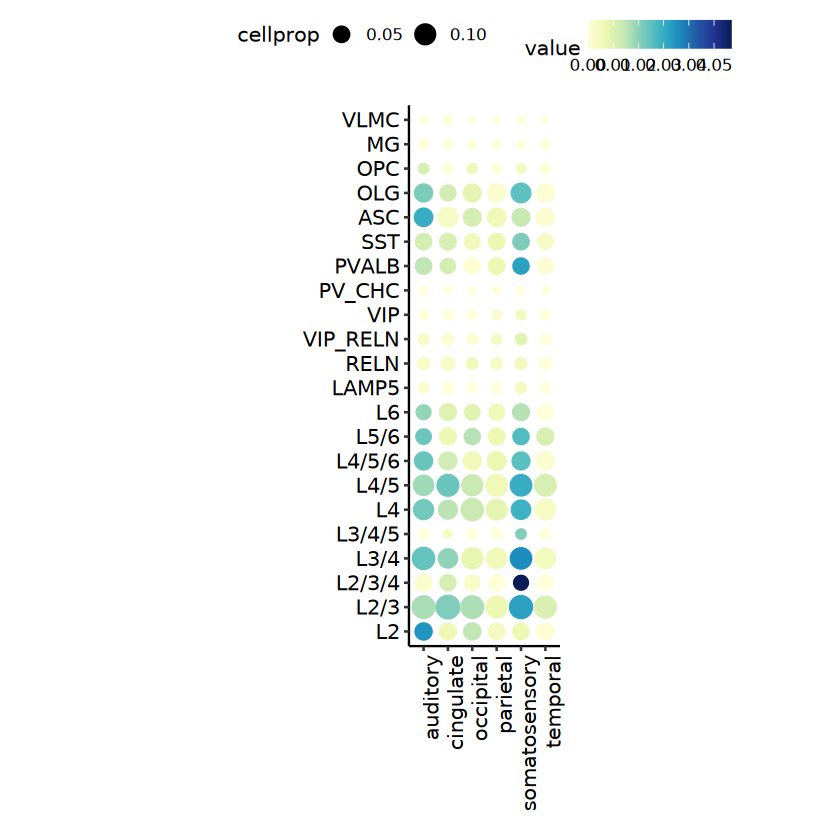

In [156]:
mjc = MyJaccarddf(isosigls$subclass,isosigls$lobe)
library(RColorBrewer)
mjc = mjc[suborder[suborder %in% rownames(mjc)],]
mjclb = melt(mjc)
colnames(mjclb) = c("subclass","lobe","value")
mjclb = merge(mjclb,cellprop.lobe,by = c("lobe","subclass"))

#mjcht = Heatmap(mjc,col =  colorRampPalette((brewer.pal(n = 9, name ="YlGnBu")))(100),cluster_columns = F,
#                cluster_rows = F,name = "Jaccard score\n by DTUs")
#mjcht
#ggexport(mjcht,filename = "result/figure4/iso_sig_subclass_layer_jaccard_heatmap_24_04_14.pdf", width = 5,height = 5)
p2 = ggplot(mjclb,aes(x = lobe,y = subclass,color = value,size = cellprop)) + geom_point() +
theme_pubr() + scale_color_gradientn(colors = colorRampPalette((brewer.pal(n = 9, name ="YlGnBu")))(100)) + coord_fixed() + xlab("") + ylab("") + 
labs(fill = "Jaccard Score of DTU") + theme(axis.text.x = element_text(angle = 90,hjust = 1))
p2
ggexport(p2,filename = "result/figure4/lobe_subclass_dtu_jacardscore_24_11_10.pdf",width = 5,height = 5)

file saved to result/figure4/cellprop_stat_24_11_10.pdf



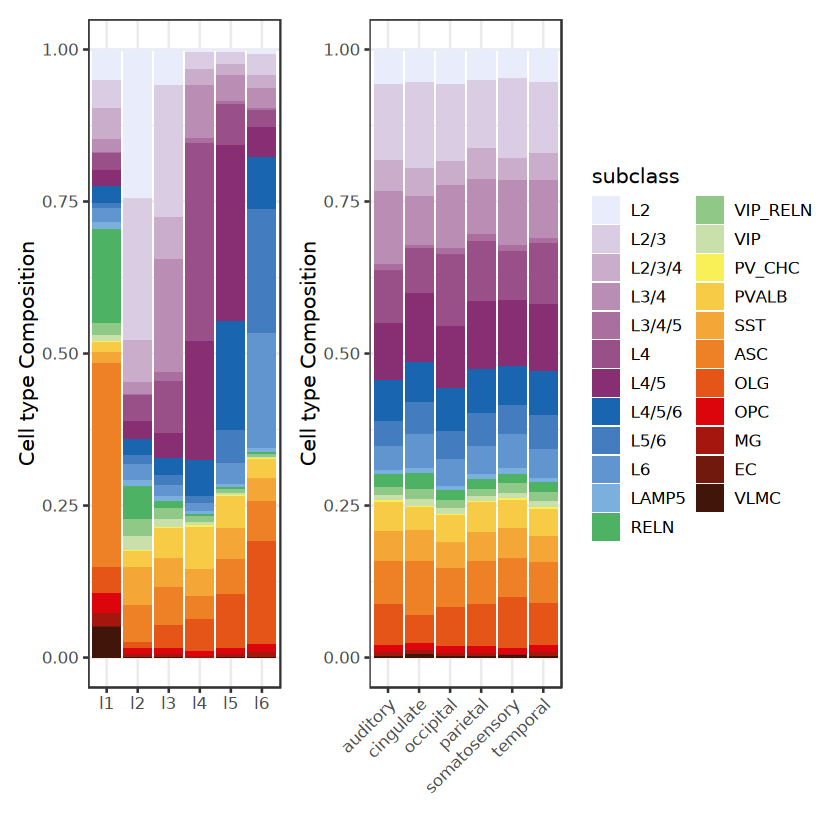

In [159]:
cellprop.layer$subclass = factor(cellprop.layer$subclass,levels = suborder)
cellprop.lobe$subclass = factor(cellprop.lobe$subclass,levels = suborder)
pst1 = ggplot(cellprop.layer,aes(x = layer,y = cellprop,fill = subclass)) + geom_bar(stat = "identity") + scale_fill_discreterainbow() + theme_bw() +
xlab("") + ylab("Cell type Composition") + NoLegend()
pst2 = ggplot(cellprop.lobe,aes(x = lobe,y = cellprop,fill = subclass)) + geom_bar(stat = "identity") + scale_fill_discreterainbow() + theme_bw() +
xlab("") + ylab("Cell type Composition") + theme(axis.text.x = element_text(angle = 45,hjust = 1))
pst = pst1 + pst2
pst
ggexport(pst,filename = "result/figure4/cellprop_stat_24_11_10.pdf",width = 7,height = 4)

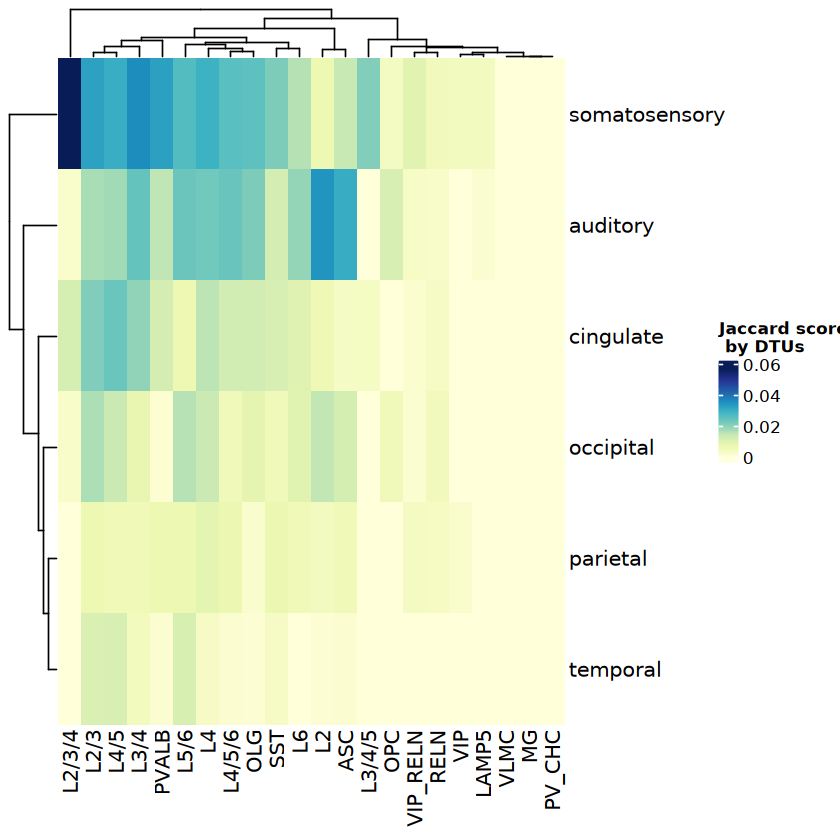

In [161]:
mjc = MyJaccarddf(isosigls$lobe,isosigls$subclass)
library(RColorBrewer)
mjcht = Heatmap(mjc,col =  colorRampPalette((brewer.pal(n = 9, name ="YlGnBu")))(100),name = "Jaccard score\n by DTUs")
mjcht

In [17]:
#build transcript_id list
isosigl = isosigls$layer
isosigl = isosigl[isosigl$sig == "Up",]
table(isosigl$areatr)

isols1 = list()
isols2 = list()

id1 = unique(isosigl$areatr)
id2 = unique(cellmd$cluster)
for(i in 1:length(id1)){
    isoi = isosigl[isosigl$areatr == id1[i],]
    isoi = unique(isoi$transcript_id)
    isols1[[i]] = isoi
}
names(isols1) = id1

for(i in 1:length(id2)){
    isoi = cellmd[cellmd$cluster == id2[i],]
    isoi = unique(isoi$transcript_id)
    isols2[[i]] = isoi
}
names(isols2) = id2

layermdjc = MyJaccard(isols1,isols2)
layermdjc


 l1  l2  l3  l4  l5  l6 
363 207 176 233 204 220 

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'unique': object 'cellmd' not found


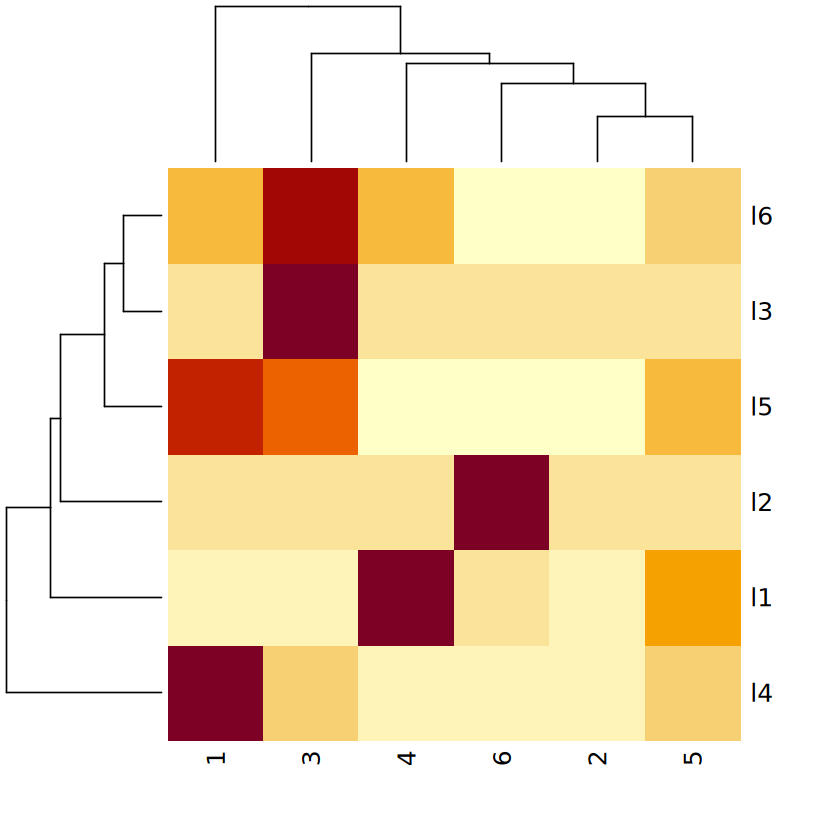

In [545]:
heatmap(layermdjc)

In [18]:
#Calculate module pattern
cellmd.st = cellmd[!is.na(cellmd$class),] %>% group_by(cluster,clusteran) %>% summarise(mdr = mean(dr2))
head(cellmd.st)
cellmd.ls = list()
cellmd.st = dcast(cellmd.st,cluster~clusteran,value.var = "mdr",fun.aggregate = sum)
clusterid = unique(cellmd.st$cluster)
for(i in 1:length(clusterid)){
    cellmd.sti = cellmd.st[cellmd.st$cluster == clusterid[i],]
    cellmd.sti = unlist(cellmd.sti[,-1])
    names(cellmd.sti) = colnames(cellmd.st)[-1]
    print(cellmd.sti)
    cellmd.ls[[i]] = cellmd.sti
}


ERROR: Error in eval(expr, envir, enclos): object 'cellmd' not found


In [19]:
isosigl = isosigls$layer
isosigl = isosigl[isosigl$sig == "Up",]
isosigl = isosigl[,c("areatr","transcript_id")]
colnames(isosigl)[1] = "layer"
isosigs = isosigls$subclass
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = merge(isosigs,isosigl,by = "transcript_id")
isosigs = isosigs[!isosigs$areatr %in% c("MG","PV_CHC","EC","VLMC","OPC"),]
subclassan = data.frame("subclass" = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC','PVALB','SST','ASC','OLG','OPC','MG','EC','VLMC'),
                      "class" = c('surface-GLU','surface-GLU','surface-GLU','deep-GLU','deep-GLU',
                                  'deep-GLU','deep-GLU','deep-GLU','deep-GLU','deep-GLU',
                                  'GABA','GABA','GABA','GABA','GABA','GABA',"GABA",
                                 'nonNeuron-ASC','nonNeuron-OLG','nonNeuron','nonNeuron','nonNeuron','nonNeuron'))
isosigs$clonecl = subclassan[match(isosigs$areatr,subclassan$subclass),]$class
isosigs.st = isosigs %>% group_by(transcript_id,clonecl,layer) %>% summarise(mdr = mean(dr2))
head(isosigs.st)
transids = unique(isosigs$transcript_id)
length(transids)



`summarise()` has grouped output by 'transcript_id', 'clonecl'. You can
override using the `.groups` argument.


transcript_id,clonecl,layer,mdr
<chr>,<chr>,<chr>,<dbl>
AAAS-WeiLab-1,GABA,l6,0.052439840
AAAS-WeiLab-1,deep-GLU,l6,-0.043482620
AAAS-WeiLab-1,surface-GLU,l6,0.078008021
AHSA2-WeiLab-5,GABA,l1,0.020248728
AHSA2-WeiLab-5,deep-GLU,l1,-0.005776113
AHSA2-WeiLab-5,nonNeuron-ASC,l1,0.073189904


[1] 914

In [20]:
#isosigs.sti = isosigs.st[isosigs.st$transcript_id == transids[i],]
isosigs.st = isosigs.st %>% group_by(transcript_id,layer) %>% filter(length(unique(clonecl)) == 5)
isosigs.st = isosigs.st[order(isosigs.st$transcript_id,isosigs.st$layer,isosigs.st$clonecl),]
disst = isosigs.st %>% group_by(transcript_id,layer) %>% 
summarise(distances = sapply(cellmd.ls, function(pattern) {
      sqrt(sum((unlist(pattern) - unlist(mdr))^2))
    }), cluster = 1:6)
head(disst)

ERROR: [1m[33mError[39m in `summarise()`:[22m
[1m[22m[36mℹ[39m In argument: `distances = sapply(...)`.
[36mℹ[39m In group 1: `transcript_id = "AHSA2-WeiLab-5"` and `layer = "l1"`.
[1mCaused by error in `h()`:[22m
[33m![39m error in evaluating the argument 'X' in selecting a method for function 'sapply': object 'cellmd.ls' not found


`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.


layer,cluster,transnum,transpop
<chr>,<int>,<int>,<dbl>
l1,1,10,0.07633588
l1,2,4,0.03053435
l1,4,84,0.64122137
l1,5,24,0.18320611
l1,6,9,0.06870229
l2,2,5,0.33333333


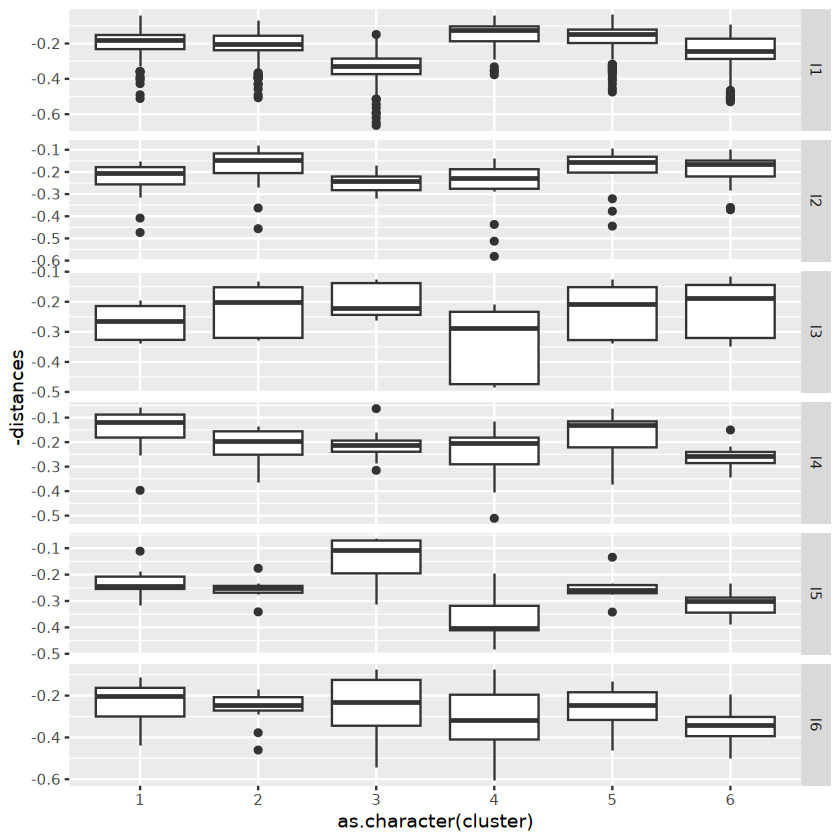

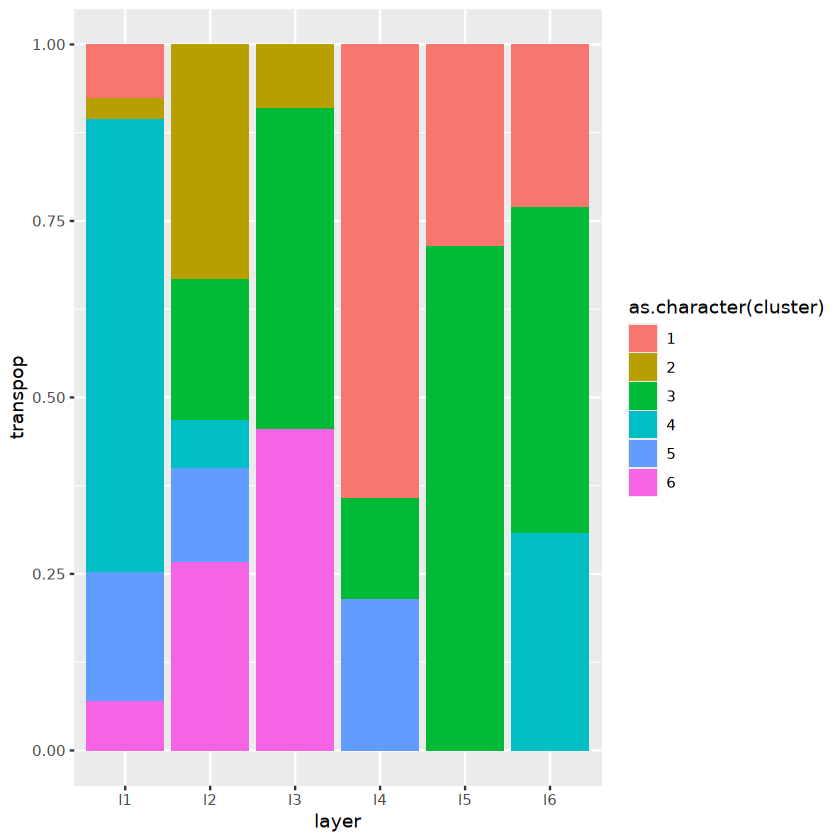

In [564]:
ggplot(disst,aes(x = as.character(cluster),y = -distances)) + geom_boxplot() +
facet_grid(layer~.,scales = "free")
disst2 = disst %>% group_by(layer,transcript_id) %>% summarise(cluster = cluster[which.min(distances)])
disst2 = disst2 %>% group_by(layer,cluster) %>% summarise(transnum = length(transcript_id))
disst2 = disst2 %>% group_by(layer) %>% mutate(transpop = transnum/sum(transnum))
head(disst2)
ggplot(disst2,aes(x = layer,y = transpop,fill = as.character(cluster))) + geom_bar(stat = "identity")

In [562]:
disst2

layer,cluster,transnum,transpop
<chr>,<int>,<int>,<dbl>


#### Calculate spatial module

In [622]:
#case 1
clusteran = read.csv("result/figure2/sigiso_layer_transcript_dr_cluster_tab.csv")
head(clusteran)

,cluster,transcript_id
,<int>,<chr>
1,5,AP4E1-WeiLab-2
2,3,APBA3-WeiLab-1
3,1,BambuGene103646-WeiLab-2
4,1,BambuGene11813-WeiLab-5
5,1,BambuGene127834-WeiLab-1
6,5,BambuGene44498-WeiLab-3


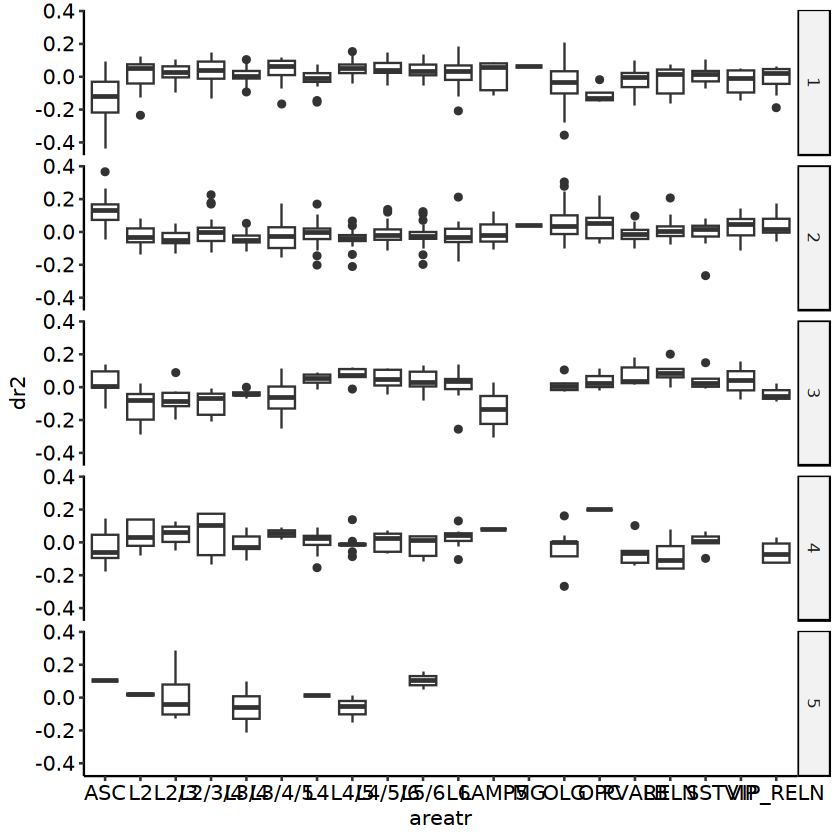

In [575]:
isosigs = isosigls$subclass
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = merge(isosigs,clusteran,by = "transcript_id")
ggplot(isosigs, aes(x = areatr,y = dr2)) + geom_boxplot() +
facet_grid(cluster~.) + theme_pubr()

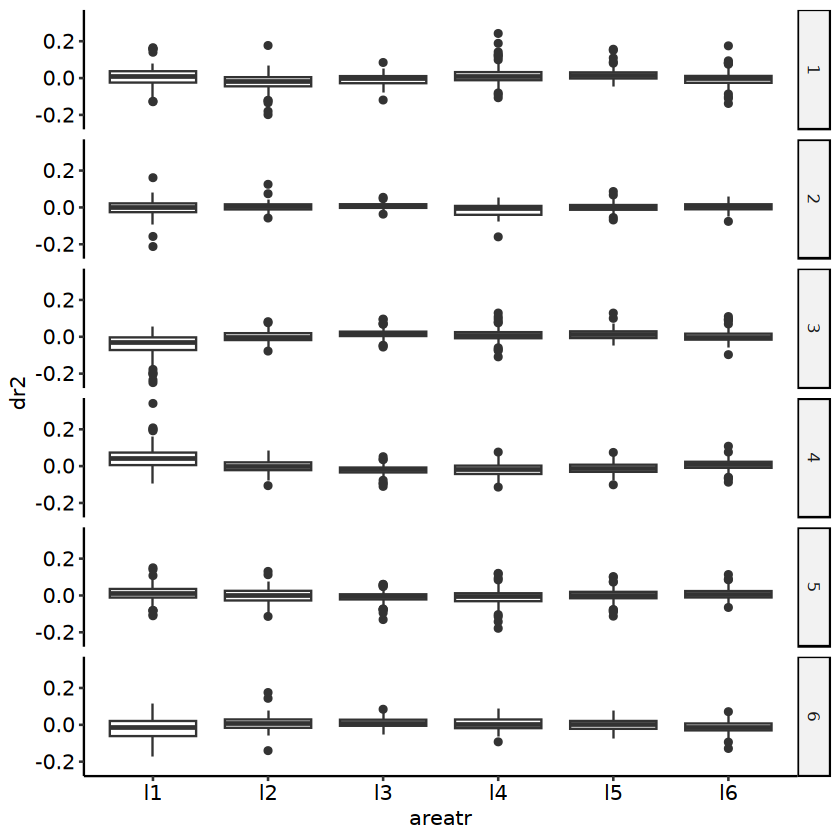

In [605]:
clusteran = unique(cellmd[,c("transcript_id","cluster")])
isosigs = isosigls$layer
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = merge(isosigs,clusteran,by = "transcript_id")
ggplot(isosigs, aes(x = areatr,y = dr2)) + geom_boxplot() +
facet_grid(cluster~.) + theme_pubr()

### Calculate region/layer/subclass contribution 

In [162]:
#Cal each gene subclass/lobe/layer delta isoform
FullLengthTranSt = function(fs.info){
      transtl = fs.info %>% group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
      transtl = transtl[transtl$areatr != "" &
                          !is.na(transtl$areatr),]
      return(transtl)
}

CalSigIsoform = function(transt){
  transt = transt[!is.na(transt$areatr),]
  transt = transt[transt$areatr != "",]
  transt$relative = transt$count/transt$genecount
  transtf = transt[transt$count > 5,]
  transtf = transt[transt$genecount > 20,]
  transtf = transtf %>% group_by(transcript_id) %>% 
    mutate(meanrelative = mean(relative),
           otherrelative = (sum(relative) - relative)/(n() - 1))
  transtf = transtf[which(transtf$meanrelative > 0.1),]
  transtf = transtf %>% group_by(transcript_id) %>% 
    filter(length(unique(areatr))>1)
  transtf = transtf %>% group_by(gene_id) %>% 
    filter(length(unique(transcript_id))>1)
  
  # transtf$lfc = log2(transtf$relative/transtf$meanrelative)
  transtf$dr = transtf$relative - transtf$otherrelative
  transtf$sig = "N"
  table(transtf$sig)
  
  transtf$pvalue = 1
  MyChiqTest = function(transcript_id, areatr, count){
    dat = data.frame(transcript_id = transcript_id, areatr = areatr,
                     count = count)
    dat = dcast(dat, areatr~transcript_id,
                value.var = "count",
                fun.aggregate = sum)
    rownames(dat) = dat$areatr;dat = dat[-1]
    p = tryCatch(chisq.test(as.matrix(dat))$p.value, 
                 error = function(e) NA)
    return(p)
  }
  transtf = transtf %>% group_by(gene_id) %>% 
    mutate(pvalue = MyChiqTest(transcript_id, areatr, count))
  transtf$padj = p.adjust(transtf$pvalue,method = "BH")
  # table(transtf[transtf$padj < 0.05,]$sig)
  transtf[transtf$pvalue < 0.05,]$sig = "Y"
  transtf[which(transtf$dr > 0.1 & transtf$pvalue < 0.05), "sig"] = "Up"
  transtf[which(transtf$dr < -0.1 & transtf$pvalue < 0.05), "sig"] = "Down"
  return(transtf)
}
#calculate ASC from different layer
fsrawdp.cor = fsraw.cor[fsraw.cor$class != "",]
fsrawdp.cor$areatr = paste0(fsrawdp.cor$lobe,"-",fsrawdp.cor$subclass)
transtsb = FullLengthTranSt(fsrawdp.cor)
#isosigsb = CalSigIsoform(transtsb)
#unique(isosigsb[isosigsb$sig != "N",]$gene_id)
#head(transtsb)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


In [164]:
#calculate delta cellprop and delta isoform ratio
transtsb$lobe = MySplit(transtsb$areatr,"-",1)
transtsb$subclass = MySplit(transtsb$areatr,"-",2)
transtsb$relative = transtsb$count/transtsb$genecount
#transtsbf = transtsb %>% group_by(transcript_id) %>% filter(mean(count) > 5)

transtsbf = transtsb %>% group_by(transcript_id,lobe) %>% 
    mutate(prop = genecount/sum(genecount),drc = relative - mean(relative))
transtsbf = transtsbf %>% group_by(transcript_id,subclass) %>% 
    mutate(drp = prop - mean(prop))

#transtsbf = transtsbf[transtsbf$count > 5,]
transtsbf = transtsbf %>% group_by(transcript_id,subclass) %>% 
    mutate(drb = relative - mean(relative))
#transtsbf = transtsbf[transtsbf$count > 5,]
#head(transtsbf)
# transtsbf$drbc = transtsbf$relative - transtsbf$mrc
# transtsbf$drcb = transtsbf$relative - transtsbf$mrb
 length(unique(transtsbf$transcript_id))

[1] 80528

[1] 1044

[1] 811

[1] 808

[1] -0.08333788

file saved to result/figure4/spatial_contribution_diger_lobe_24_11_10.pdf



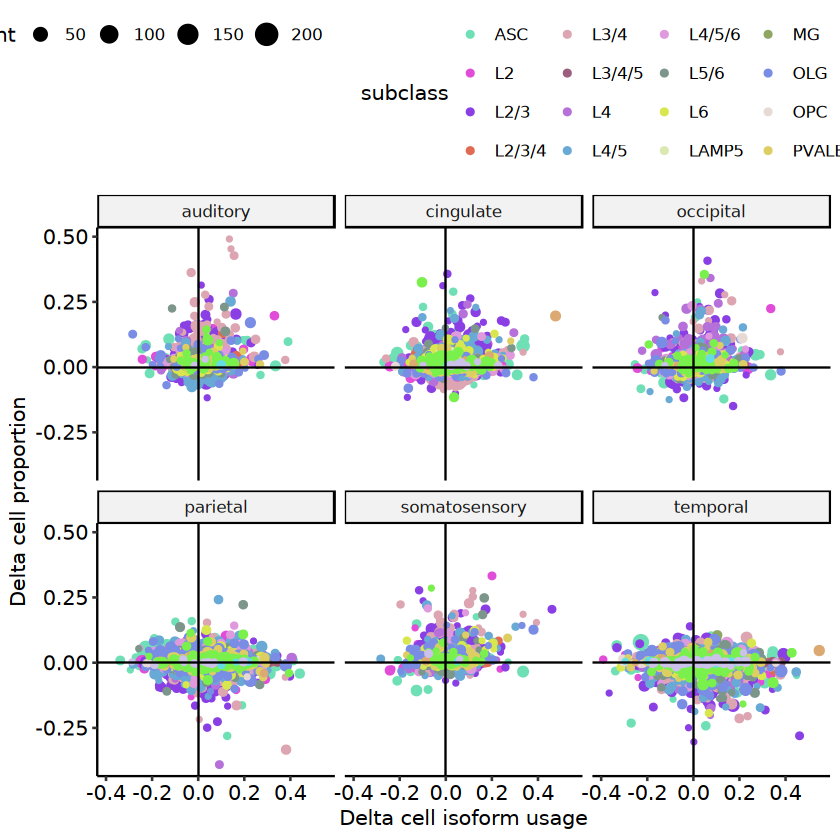

In [179]:
#transtsbf = transtsbf[transtsbf$drb > 0 & transtsbf$drc > 0,]
isosigb = isosigls$lobe
isosigc = isosigls$subclass
isosigc = isosigc[,c("areatr","meanrelative","transcript_id","dr")]
colnames(isosigc)[1] = "subclass"
#huntrans3 = unique(isosigb[isosigb$sig == "Up",]$transcript_id)
isosigb = isosigb[isosigb$sig == "Up",]
length(unique(isosigb$transcript_id))
#transtsbf2 = transtsbf %>% group_by(subclass,transcript_id) %>% filter(length(lobe) > 3)
transtsbf2 = transtsbf[transtsbf$transcript_id %in% isosigb$transcript_id,]
transtsbf2 = merge(transtsbf2,isosigc,by = c("subclass","transcript_id"))
length(unique(transtsbf2$transcript_id))
#transtsbf2 = transtsbf2[transtsbf2$relative < transtsbf2$meanrelative,]$sig = "N"
# transtsbf2.st = transtsbf2 %>% group_by(lobe,transcript_id) %>% summarise(mdrb = mean(drb))
#ggplot(transtsbf2.st,aes(x = lobe,y = mdrb)) + geom_boxplot()

# transtsbf2.st = transtsbf2 %>% group_by(lobe,transcript_id) %>% summarise(mdrp = mean(drp))
#ggplot(transtsbf2.st,aes(x = lobe,y = mdrp)) + geom_boxplot()
#transtsbf2 = transtsbf2 %>% group_by(transcript_id,subclass) %>% mutate(meanrelativec = mean(relative))

transtsbf2 = transtsbf2[transtsbf2$drp != 0 | transtsbf2$drb != 0,]
#transtsbf2$drc = transtsbf2$meanrelativec - transtsbf2$meanrelative
#transtsbf2 = transtsbf2[transtsbf2$drc > 0.01,]
#transtsbf2$drc = transtsbf2$relative - transtsbf2$meanrelative
length(unique(transtsbf2$transcript_id))
library(ggtern)
library(ggpointdensity)

no_of_colors = length(unique(transtsbf$subclass)) 
colorful_palette = distinctColorPalette(no_of_colors) 
names(colorful_palette) = unique(transtsbf$subclass)

transtsbf2 = transtsbf2[transtsbf2$count > 5,]
cor(transtsbf2$drc,transtsbf2$drp)
p2 = ggplot(data=transtsbf2,aes(x = dr,y = drp, size = count,color = subclass)) + 
geom_point() +
geom_hline(yintercept=0) +
geom_vline(xintercept=0) +
facet_wrap(~lobe) +
#scale_fill_manual(values = sigcolor) +
scale_color_manual(values = colorful_palette) +
theme_pubr() + xlab("Delta cell isoform usage") + 
ylab("Delta cell proportion")
p2
ggexport(p2,filename = "result/figure4/spatial_contribution_diger_lobe_24_11_10.pdf",width = 6,height = 6)

In [ ]:
head(transtsbf2)

In [166]:
isosigb = isosigls$lobe
isosigb[isosigb$gene_id == "DDRGK1",]
isosigc = isosigls$subclass
isosigc[isosigc$gene_id == "CAPRIN1",]

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
19579,DDRGK1,DDRGK1-WeiLab-1,auditory,1413,2406,0.5872818,0.565049,0.5606025,0.026679326,N,4.009886e-30,1.645233e-27
19580,DDRGK1,DDRGK1-WeiLab-1,cingulate,2946,4632,0.6360104,0.565049,0.5508568,0.085153607,N,4.009886e-30,1.645233e-27
19581,DDRGK1,DDRGK1-WeiLab-1,occipital,1329,2629,0.5055154,0.565049,0.5769557,-0.071440342,N,4.009886e-30,1.645233e-27
19582,DDRGK1,DDRGK1-WeiLab-1,parietal,3747,6696,0.5595878,0.565049,0.5661413,-0.006553452,N,4.009886e-30,1.645233e-27
19583,DDRGK1,DDRGK1-WeiLab-1,somatosensory,1572,2863,0.5490744,0.565049,0.5682439,-0.019169552,N,4.009886e-30,1.645233e-27
19584,DDRGK1,DDRGK1-WeiLab-1,temporal,5735,10374,0.5528244,0.565049,0.5674940,-0.014669586,N,4.009886e-30,1.645233e-27
19585,DDRGK1,XM_005568473.2,auditory,993,2406,0.4127182,0.434951,0.4393975,-0.026679326,N,4.009886e-30,1.645233e-27
19586,DDRGK1,XM_005568473.2,cingulate,1686,4632,0.3639896,0.434951,0.4491432,-0.085153607,N,4.009886e-30,1.645233e-27
19587,DDRGK1,XM_005568473.2,occipital,1300,2629,0.4944846,0.434951,0.4230443,0.071440342,N,4.009886e-30,1.645233e-27


,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
20423,CAPRIN1,XM_005578232.2,ASC,154,211,0.72985782,0.5950156,0.5875243,0.142333506,Up,1.267708e-08,2.696511e-07
20424,CAPRIN1,XM_005578232.2,L2,141,226,0.62389381,0.5950156,0.5934112,0.030482601,N,1.267708e-08,2.696511e-07
20425,CAPRIN1,XM_005578232.2,L2/3,292,504,0.57936508,0.5950156,0.5958850,-0.016519943,N,1.267708e-08,2.696511e-07
20426,CAPRIN1,XM_005578232.2,L2/3/4,62,112,0.55357143,0.5950156,0.5973180,-0.043746574,N,1.267708e-08,2.696511e-07
20427,CAPRIN1,XM_005578232.2,L3/4,241,507,0.47534517,0.5950156,0.6016639,-0.126318738,Down,1.267708e-08,2.696511e-07
20428,CAPRIN1,XM_005578232.2,L3/4/5,21,44,0.47727273,0.5950156,0.6015568,-0.124284092,Down,1.267708e-08,2.696511e-07
20429,CAPRIN1,XM_005578232.2,L4,176,293,0.60068259,0.5950156,0.5947007,0.005981878,N,1.267708e-08,2.696511e-07
20430,CAPRIN1,XM_005578232.2,L4/5,279,520,0.53653846,0.5950156,0.5982643,-0.061725817,N,1.267708e-08,2.696511e-07
20431,CAPRIN1,XM_005578232.2,L4/5/6,137,252,0.54365079,0.5950156,0.5978691,-0.054218355,N,1.267708e-08,2.696511e-07


`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
file saved to result/figure4/spatial_contribution_diger_lobe_pie_24_11_10.pdf



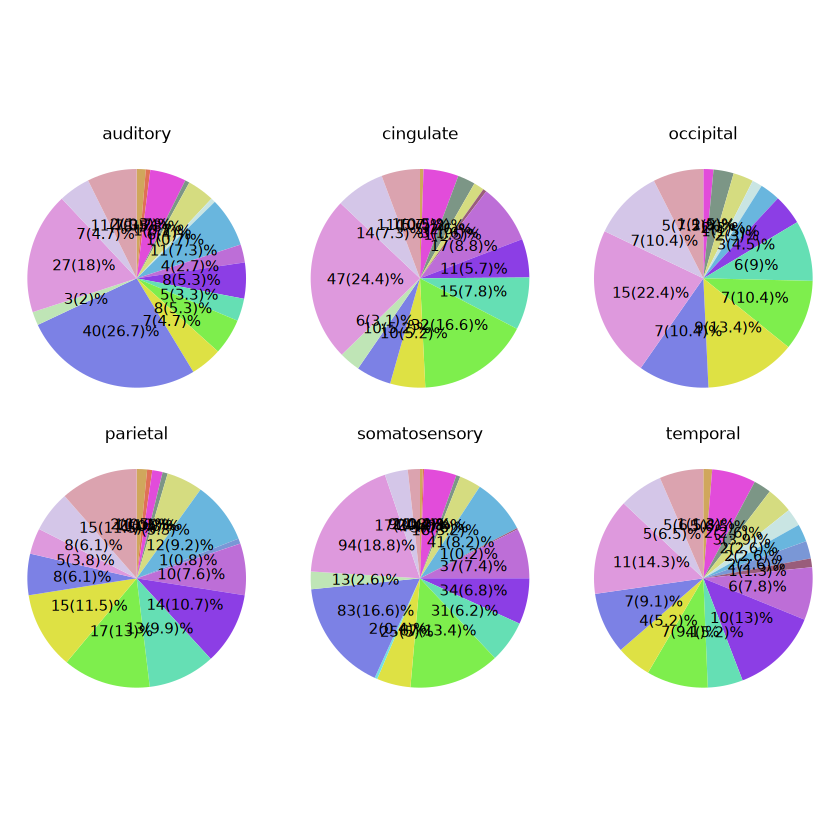

In [167]:
PiePlot = function(datadf,colorful_palette){
    datadf = datadf %>% group_by(areatr,group) %>% summarise(count = n())
    datadf <- datadf %>% group_by(areatr) %>% 
          arrange(desc(group)) %>%
          mutate(prop = count / sum(count) *100) %>%
          mutate(ypos = cumsum(prop)- 0.5*prop )
    datadf$proplabel = paste0(datadf$count,"(",round(datadf$prop,1),")%")

    p1.4 = ggplot(datadf, aes(x="", y=prop, fill=group)) +
          geom_bar(stat="identity", width=1, color= NA) +
          facet_wrap(~areatr) +
          coord_polar("y", start=0) +
          theme_void() + 
          theme(legend.position="none") +
          geom_text(aes(y = ypos, label = proplabel), color = "black", size=3) +
          scale_fill_manual(values = colorful_palette)
    return(p1.4)
}

transtsbf2.11 = transtsbf2[transtsbf2$drp > 0,]
transtsbf2.11$group = transtsbf2.11$subclass
transtsbf2.11$areatr = transtsbf2.11$lobe
grob11 = PiePlot(transtsbf2.11,colorful_palette)
grob11
ggexport(grob11,filename = "result/figure4/spatial_contribution_diger_lobe_pie_24_11_10.pdf",width = 6,height = 6)
# ybp_grob <- ggplotGrob(ybp)
# # Place box plots inside the scatter plot
# #::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
# xmin <- min(iris$Sepal.Length); xmax <- max(iris$Sepal.Length)
# ymin <- min(iris$Sepal.Width); ymax <- max(iris$Sepal.Width)
# yoffset <- (1/15)*ymax; xoffset <- (1/15)*xmax
# # Insert xbp_grob inside the scatter plot
# sp + annotation_custom(grob = xbp_grob, xmin = xmin, xmax = xmax, 
#                        ymin = ymin-yoffset, ymax = ymin+yoffset) +
#   # Insert ybp_grob inside the scatter plot
#   annotation_custom(grob = ybp_grob,
#                        xmin = xmin-xoffset, xmax = xmin+xoffset, 
#                        ymin = ymin, ymax = ymax)

In [171]:
fsrawdp.cor$areatr = paste0(fsrawdp.cor$layer,"-",fsrawdp.cor$subclass)
transtsl = FullLengthTranSt(fsrawdp.cor)
transtsl$layer = MySplit(transtsl$areatr,"-",1)
transtsl$subclass = MySplit(transtsl$areatr,"-",2)
transtsl$relative = transtsl$count/transtsl$genecount

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


In [172]:
transtslf = transtsl %>% group_by(transcript_id,layer) %>% 
    mutate(prop = count/sum(count))
transtslf = transtslf %>% group_by(transcript_id,subclass) %>% 
    mutate(drp = prop - mean(prop))

transtslf = transtslf[transtslf$count > 5,]
transtslf = transtslf %>% group_by(transcript_id,subclass) %>% 
    mutate(drb = relative - mean(relative))
#transtsbf = transtsbf[transtsbf$drb > 0 & transtsbf$drc > 0,]
length(unique(transtslf$transcript_id))


[1] 27538

[1] 1213

[1] 708

`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.
file saved to result/figure4/spatial_contribution_diger_layer_24_11_10.pdf

`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.


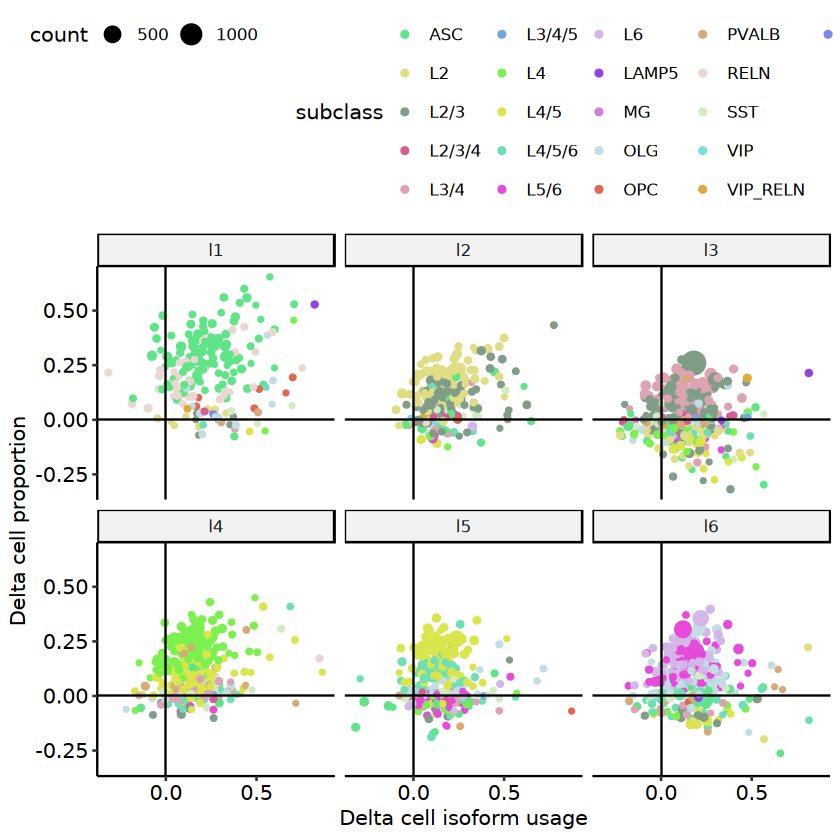

file saved to result/figure4/spatial_contribution_diger_layer_pie_24_11_10.pdf



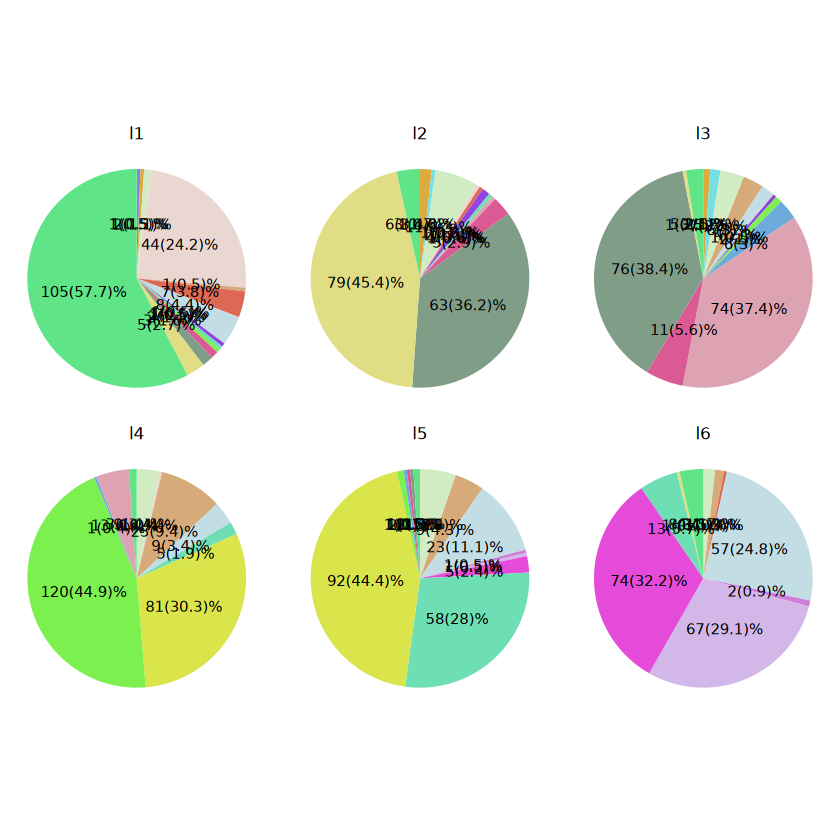

In [173]:
#head(transtslf2)
isosigl = isosigls$layer
#huntrans3 = unique(isosigb[isosigb$sig == "Up",]$transcript_id)
isosigl = isosigl[isosigl$sig == "Up",]
isosigl = isosigl[,c("areatr","meanrelative","transcript_id")]
colnames(isosigl)[1] = "layer"
length(unique(isosigl$transcript_id))
transtslf2 = merge(transtslf,isosigl,by = c("transcript_id","layer"))
length(unique(transtslf2$transcript_id))
transtslf2 = transtslf2 %>% group_by(transcript_id,subclass) %>% mutate(meanrelativec = mean(relative))

transtslf2 = transtslf2[transtslf2$drp != 0 | transtslf2$drb != 0,]
#transtslf2 = transtslf2[transtslf2$meanrelativec > transtslf2$meanrelative,]
transtslf2$drc = transtslf2$meanrelativec - transtslf2$meanrelative
#transtslf2 = transtslf2[transtslf2$drc > 0.01,]

transtslf2.st = transtslf2 %>% group_by(layer,transcript_id) %>% summarise(mdrb = mean(drb))
#ggplot(transtslf2.st,aes(x = layer, y = mdrb)) + geom_boxplot()
transtslf2.st = transtslf2 %>% group_by(layer,transcript_id) %>% summarise(mdrp = mean(drp))
#ggplot(transtslf2.st,aes(x = layer, y = mdrp)) + geom_boxplot()
transtslf2 = transtslf2[transtslf2$count > 5,]
p2 = ggplot(data=transtslf2,aes(x = drc,y = drp,color = subclass,size = count)) + 
geom_point() +
geom_hline(yintercept=0) +
geom_vline(xintercept=0) +
facet_wrap(~layer) +
scale_color_manual(values = colorful_palette) +
theme_pubr() + xlab("Delta cell isoform usage") + 
ylab("Delta cell proportion")
p2
ggexport(p2,filename = "result/figure4/spatial_contribution_diger_layer_24_11_10.pdf",width = 6,height = 6)

transtslf2.11 = transtslf2[transtslf2$drp > 0,]
transtslf2.11$group = transtslf2.11$subclass
transtslf2.11$areatr = transtslf2.11$layer
grob11 = PiePlot(transtslf2.11,colorful_palette)
grob11
ggexport(grob11,filename = "result/figure4/spatial_contribution_diger_layer_pie_24_11_10.pdf",width = 6,height = 6)

In [176]:
head(transtslf2)
head(transtsbf2)
transtslf2[transtslf2$gene_id == "ATG7",]

transcript_id,layer,gene_id,areatr,count,genecount,subclass,relative,prop,drp,drb,meanrelative,meanrelativec,drc
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ANKRD10-WeiLab-1,l2,ANKRD10,l2-L2,16,24,L2,0.6666667,0.59259259,0.22667604,0.04385965,0.3317571,0.6666667,0.33490960
ARMCX5-WeiLab-1,l6,ARMCX5,l6-L5/6,8,18,L5/6,0.4444444,0.66666667,0.25000000,0.00000000,0.1924988,0.4444444,0.25194565
ATG7-WeiLab-1,l3,ATG7,l3-SST,6,13,SST,0.4615385,0.03045685,-0.05777467,-0.14423077,0.4716039,0.6057692,0.13416536
ATG7-WeiLab-1,l3,ATG7,l3-L2,10,25,L2,0.4000000,0.05076142,-0.07461929,0.00000000,0.4716039,0.4000000,-0.07160387
ATG7-WeiLab-1,l3,ATG7,l3-L2/3/4,12,20,L2/3/4,0.6000000,0.06091371,0.02351241,0.00000000,0.4716039,0.6000000,0.12839613
ATG7-WeiLab-1,l3,ATG7,l3-L4/5/6,10,16,L4/5/6,0.6250000,0.05076142,-0.01389390,0.18504274,0.4716039,0.6250000,0.15339613


transcript_id,lobe,gene_id,areatr,count,genecount,subclass,relative,prop,drc,drp,drb,meanrelative,meanrelativec
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BambuGene113631-WeiLab-4,somatosensory,BambuGene113631,somatosensory-L2/3,37,43,L2/3,0.8604651,0.2097561,0.28341884,0.01323784,0.28933489,0.5770463,0.8604651
BambuGene113631-WeiLab-4,somatosensory,BambuGene113631,somatosensory-L4/5,19,27,L4/5,0.7037037,0.1317073,0.12665743,0.01641104,0.08277737,0.5770463,0.7037037
BambuGene113631-WeiLab-4,somatosensory,BambuGene113631,somatosensory-L3/4,23,31,L3/4,0.7419355,0.1512195,0.16488921,0.02189133,0.11599807,0.5770463,0.7419355
BambuGene77869-WeiLab-2,somatosensory,BambuGene77869,somatosensory-L2/3,12,18,L2/3,0.6666667,0.2432432,0.09505079,0.06875227,0.07159114,0.5716159,0.6666667
BambuGene77869-WeiLab-2,somatosensory,BambuGene77869,somatosensory-L3/4,12,14,L3/4,0.8571429,0.1891892,0.28552699,0.05594186,0.34966895,0.5716159,0.8571429
BIN1-WeiLab-1,auditory,BIN1,auditory-OLG,17,20,OLG,0.8500000,0.5000000,0.25038255,0.17037455,0.02010582,0.5996175,0.8500000


transcript_id,layer,gene_id,areatr,count,genecount,subclass,relative,prop,drp,drb,meanrelative,meanrelativec,drc
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ATG7-WeiLab-1,l3,ATG7,l3-SST,6,13,SST,0.4615385,0.03045685,-0.057774669,-0.14423077,0.4716039,0.6057692,0.134165364
ATG7-WeiLab-1,l3,ATG7,l3-L2,10,25,L2,0.4000000,0.05076142,-0.074619289,0.00000000,0.4716039,0.4000000,-0.071603866
ATG7-WeiLab-1,l3,ATG7,l3-L2/3/4,12,20,L2/3/4,0.6000000,0.06091371,0.023512408,0.00000000,0.4716039,0.6000000,0.128396134
ATG7-WeiLab-1,l3,ATG7,l3-L4/5/6,10,16,L4/5/6,0.6250000,0.05076142,-0.013893896,0.18504274,0.4716039,0.6250000,0.153396134
ATG7-WeiLab-1,l3,ATG7,l3-L2/3,36,75,L2/3,0.4800000,0.18274112,0.068747757,0.00000000,0.4716039,0.4800000,0.008396134
ATG7-WeiLab-1,l3,ATG7,l3-L4,22,38,L4,0.5789474,0.11167513,-0.067121885,-0.01052632,0.4716039,0.5894737,0.117869818
ATG7-WeiLab-1,l3,ATG7,l3-L4/5,7,13,L4/5,0.5384615,0.03553299,-0.131139080,0.10843323,0.4716039,0.4567308,-0.014873097
ATG7-WeiLab-1,l3,ATG7,l3-L3/4/5,6,8,L3/4/5,0.7500000,0.03045685,0.001365175,0.00000000,0.4716039,0.7500000,0.278396134
ATG7-WeiLab-1,l3,ATG7,l3-ASC,8,11,ASC,0.7272727,0.04060914,-0.064806990,0.05594406,0.4716039,0.7272727,0.255668861


#### Case Plot

In [30]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig %in% c("Up","Down"),]$transcript_id)
isosigc = isosigls$subclass
huntrans2 = unique(isosigc[isosigc$sig %in% c("Up","Down"),]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig %in% c("Up","Down"),]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,AAAS,XM_005571000.2,0.26696833,591,0.2575758,0.22860473
2,AACS,NM_001284010.1,0.08958333,2879,0.2619048,0.08743795
3,AACS,XM_015430724.1,0.04452586,385,0.1316527,0.08743795
4,AADAT,XM_005556303.2,0.21836890,591,0.2653563,0.22885572
5,AAGAB,NM_001284079.1,0.11174019,321,0.1895949,0.23645320
6,AAGAB,XM_005559881.2,0.11858386,1009,0.3036007,0.24538177


[1] 3742

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.006385 0.072862 0.112248 0.125923 0.163110 0.541667 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.004755 0.064909 0.102938 0.118285 0.157666 0.560000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.1783  0.2382  0.2444  0.3095  0.6176 

In [31]:
isosigtri$test = ((isosigtri$drc - isosigtri$drb) + (isosigtri$drc - isosigtri$drl)) / 2
isosigtri = isosigtri[order(-round(isosigtri$test,1),-isosigtri$count),]
isosigtri[1:50,]

,gene_id,transcript_id,drl,count,drc,drb,transname,test
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<dbl>
486,CADM2,XM_005548407.2,0.07595162,3111,0.5594406,0.12613407,CADM2-XM_005548407.2,0.4583977
737,CSNK1A1,XM_005558223.2,0.07237070,2437,0.5596330,0.11564802,CSNK1A1-XM_005558223.2,0.4656237
3490,VDAC2,XM_015455845.1,0.07938376,13427,0.4624820,0.08989515,VDAC2-XM_015455845.1,0.3778425
3385,TUBB2B,NM_001283898.1,0.17964533,12631,0.5125070,0.08469018,TUBB2B-NM_001283898.1,0.3803392
1801,LOC102141554,XM_005550070.2,0.22491223,12583,0.5037776,0.07355420,LOC102141554-XM_005550070.2,0.3545444
3386,TUBB2B,TUBB2B-WeiLab-1,0.17964533,10332,0.5125070,0.08469018,TUBB2B-WeiLab-1,0.3803392
2267,NTRK2,XM_005582051.2,0.27572125,8505,0.5456980,0.05225548,NTRK2-XM_005582051.2,0.3817096
2865,S100A13,XM_005541764.2,0.05645591,8408,0.3990683,0.02546240,S100A13-XM_005541764.2,0.3581092
3599,ZEB2,XM_015432170.1,0.08027762,6970,0.5183846,0.08768744,ZEB2-XM_015432170.1,0.4344020


Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_subclass_lobe_dtu_delta_tern_24_09_19.pdf



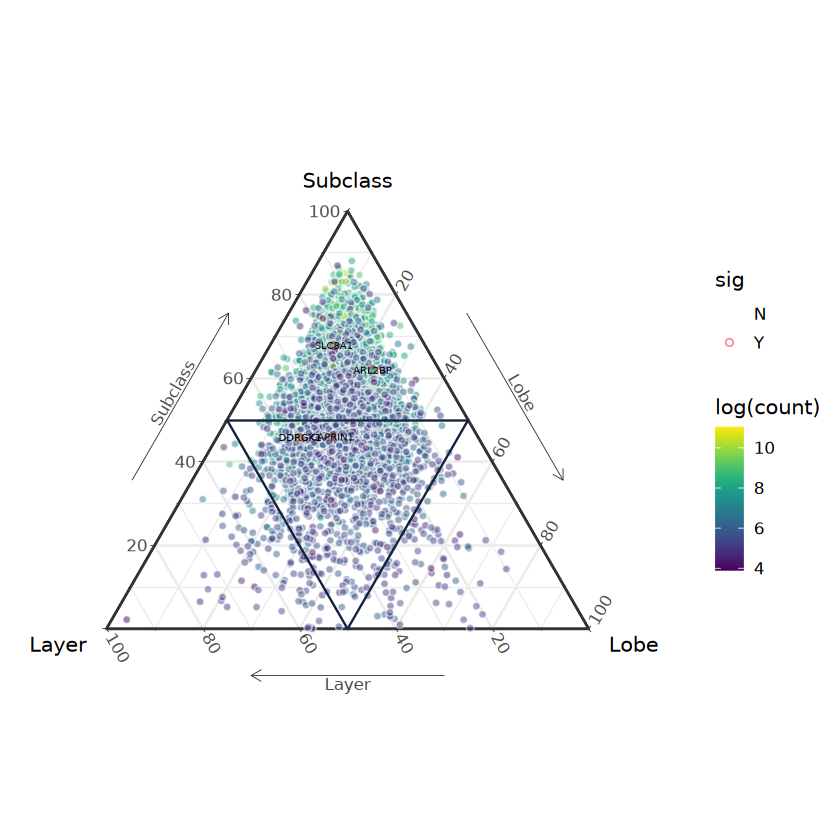

In [32]:
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = c("XM_015434930.1","XM_005545495.2","DDRGK1-WeiLab-1","XM_005576035.2","XM_005592027.2")
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = c("ARPP21","DDRGK1","CAPRIN1","SLC8A1","ARL2BP")
isosigtri$sig = "N"
isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
xlab("Layer")+ 
ylab("Subclass")+
zlab("Lobe")+ 
scale_fill_viridis() +
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_subclass_lobe_dtu_delta_tern_24_09_19.pdf",width = 5,height = 5)

In [76]:
fsrawdp.cor = fsrawdp[fsrawdp$subclass != "",]
fsrawdp.cor$areatr = paste0(fsrawdp.cor$lobe,"-",fsrawdp.cor$subclass)
transtsb = FullLengthTranSt(fsrawdp.cor)

fsrawdp.cor$areatr = paste0(fsrawdp.cor$layer,"-",fsrawdp.cor$subclass)
transtsl = FullLengthTranSt(fsrawdp.cor)

transtsb$lobe = MySplit(transtsb$areatr,"-",1)
transtsb$subclass = MySplit(transtsb$areatr,"-",2)

transtsl$layer = MySplit(transtsl$areatr,"-",1)
transtsl$subclass = MySplit(transtsl$areatr,"-",2)

transtsl$relative = transtsl$count/transtsl$genecount
transtsb$relative = transtsb$count/transtsb$genecount

transtsbf = transtsb[transtsb$count > 10,]
transtslf = transtsl[transtsl$count > 10,]

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


In [77]:
head(transtslf)

gene_id,transcript_id,areatr,count,genecount,layer,subclass,relative
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>
AAAS,XM_005571001.1,l3-L2/3,33,47,l3,L2/3,0.7021277
AAAS,XM_005571001.1,l3-L3/4,46,57,l3,L3/4,0.8070175
AAAS,XM_005571001.1,l4-L4/5,13,15,l4,L4/5,0.8666667
AAAS,XM_005571001.1,l5-L4/5,34,41,l5,L4/5,0.8292683
AAAS,XM_005571001.1,l5-L4/5/6,19,21,l5,L4/5/6,0.9047619
AAAS,XM_005571001.1,l6-L5/6,15,18,l6,L5/6,0.8333333


In [54]:
transtsblf.b = transtsbf %>% group_by(gene_id,transcript_id,subclass) %>% filter(length(lobe) > 1) %>% 
summarise(drb = max(relative) - min(relative),count = sum(count))
transtsblf.b =  transtsblf.b %>% group_by(gene_id,transcript_id) %>% summarise(drb = mean(drb),count = sum(count))

transtsblf.l = transtslf %>% group_by(gene_id,transcript_id,subclass) %>% filter(length(layer) > 1) %>% 
summarise(drl = max(relative) - min(relative))
transtsblf.l =  transtsblf.l %>% group_by(gene_id,transcript_id) %>% summarise(drl = mean(drl))

transtsblf.c = transtsbf %>% group_by(gene_id,transcript_id,lobe,layer) %>% filter(length(subclass) > 2) %>% 
summarise(drc = max(relative) - min(relative))
table(transtsblf.c$subclass)
transtsblf.c =  transtsblf.c %>% group_by(gene_id,transcript_id) %>% summarise(drc = mean(drc))

transtsblf.tri = merge(transtsblf.b,transtsblf.l,by = c("gene_id","transcript_id"))
transtsblf.tri = merge(transtsblf.tri,transtsblf.c,by = c("gene_id","transcript_id"))
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig %in% c("Up","Down"),]$transcript_id)
isosigc = isosigls$subclass
huntrans2 = unique(isosigc[isosigc$sig %in% c("Up","Down"),]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig %in% c("Up","Down"),]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)
length(unique(transtsblf.tri$gene_id))
transtsblf.tri = transtsblf.tri[transtsblf.tri$transcript_id %in% huntrans,]
length(unique(transtsblf.tri$gene_id))
head(transtsblf.tri)

`summarise()` has grouped output by 'gene_id', 'transcript_id', 'subclass'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id', 'subclass'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id', 'lobe'. You can
override using the `.groups` argument.
Warning message:
"Unknown or uninitialised column: `subclass`."


< table of extent 0 >

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


[1] 5913

[1] 928

,gene_id,transcript_id,drb,count,drl,drc
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,AACS,NM_001284010.1,0.12025492,821,0.04730284,0.1331495
2,AAGAB,XM_005559881.2,0.21150461,240,0.00619195,0.1911765
9,AATF,NM_001284760.1,0.08366941,176,0.05514706,0.1739130
10,AATK,XM_015438936.1,0.13367644,1839,0.11638453,0.1871014
14,ABCA5,XM_005584800.2,0.23427427,289,0.21969697,0.1948480
16,ABCC5,XM_005546515.2,0.16592482,670,0.13079099,0.1594182


In [35]:
#transtsblf.c = transtsblf %>% group_by(gene_id,transcript_id,lobe,layer) %>% filter(length(class) > 1) %>% 
#summarise(drc = max(relative) - min(relative))
#transtsblf.c =  transtsblf.c %>% group_by(gene_id,transcript_id) %>% summarise(drc = mean(drc))
tmp = transtsblf[transtsblf$gene_id == "CDC42",]
tmp[order(tmp$lobe,tmp$layer),]

gene_id,transcript_id,areatr,count,genecount,lobe,layer,class,relative
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>
CDC42,CDC42-WeiLab-1,auditory-l2-GLU,7,10,auditory,l2,GLU,0.7000000
CDC42,CDC42-WeiLab-1,auditory-l3-GABA,13,22,auditory,l3,GABA,0.5909091
CDC42,CDC42-WeiLab-1,auditory-l3-GLU,102,137,auditory,l3,GLU,0.7445255
CDC42,NM_001283401.1,auditory-l3-GABA,9,22,auditory,l3,GABA,0.4090909
CDC42,NM_001283401.1,auditory-l3-GLU,35,137,auditory,l3,GLU,0.2554745
CDC42,CDC42-WeiLab-1,auditory-l4-GLU,24,27,auditory,l4,GLU,0.8888889
CDC42,CDC42-WeiLab-1,auditory-l5-GABA,6,8,auditory,l5,GABA,0.7500000
CDC42,CDC42-WeiLab-1,auditory-l5-GLU,37,72,auditory,l5,GLU,0.5138889
CDC42,NM_001283401.1,auditory-l5-GLU,35,72,auditory,l5,GLU,0.4861111


In [55]:
summary(transtsblf.tri$drb)
summary(transtsblf.tri$drl)
summary(transtsblf.tri$drc)
transtsblf.tri[transtsblf.tri$gene_id == "CDC42",]
transtsblf.tri[transtsblf.tri$gene_id == "ARPP21",]
transtsblf.tri[transtsblf.tri$gene_id == "DDRGK1",]

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.005863 0.112041 0.138220 0.138712 0.163639 0.416667 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.08115 0.10896 0.11418 0.13553 0.57143 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.02515 0.15281 0.19172 0.19417 0.23074 0.63380 

,gene_id,transcript_id,drb,count,drl,drc
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
974,CDC42,CDC42-WeiLab-1,0.1800948,1815,0.1573981,0.3210301
975,CDC42,NM_001283401.1,0.1498511,369,0.1619691,0.3178933


,gene_id,transcript_id,drb,count,drl,drc
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
359,ARPP21,XM_005545495.2,0.1289648,1845,0.1096669,0.2940789
360,ARPP21,XM_015444956.1,0.1753120,5826,0.1598648,0.1937070


,gene_id,transcript_id,drb,count,drl,drc
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1386,DDRGK1,DDRGK1-WeiLab-1,0.1233081,1594,0.06584238,0.2193688
1387,DDRGK1,XM_005568473.2,0.1552486,5430,0.14435858,0.2195196


In [56]:
transtsblf.tri[transtsblf.tri$drb > transtsblf.tri$drl & (transtsblf.tri$drb - transtsblf.tri$drc) > 0.1,]
#transtsblf.tri[transtsblf.tri$gene_id == "CAPRIN1",]

,gene_id,transcript_id,drb,count,drl,drc
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
198,ANAPC16,XM_005565570.2,0.2327115,480,0.04930888,0.05844156
334,ARL6,XM_015445286.1,0.2083403,267,0.07558140,0.05188679
801,C8H8orf33,XM_005564438.2,0.2159513,205,0.05238095,0.03663004
898,CCDC127,XM_005556559.2,0.2362391,211,0.07193684,0.02514507
951,CD151,XM_005576810.2,0.2170614,183,0.11282051,0.05591398
1786,FAM13A,XM_005555404.2,0.1834905,301,0.04327674,0.07577088
2639,LAS1L,XM_005593786.2,0.2801282,102,0.09019608,0.14615385
2821,LOC102123466,XM_005545062.2,0.1956792,482,0.05718356,0.09140158
3132,LOC107128460,LOC107128460-WeiLab-1,0.2500000,81,0.14215686,0.11764706


[1] 928

Warning message in geom_text(data = transtsblf.tri[transtsblf.tri$sig != "N", ], :
"Ignoring unknown aesthetics: z"


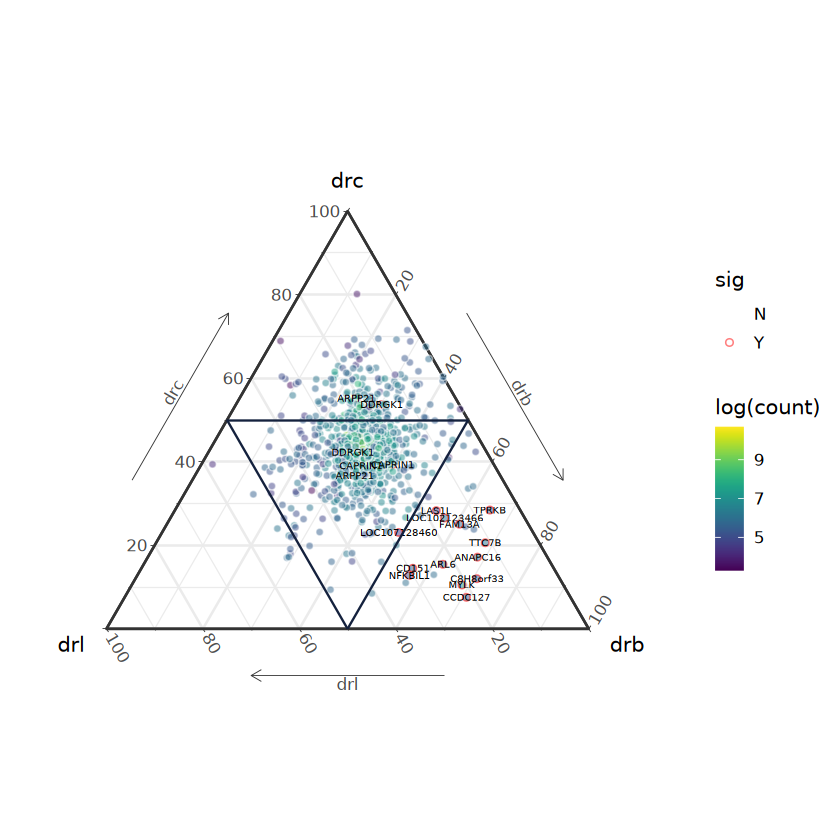

In [72]:
library(ggtern)
library(ggpointdensity)
library(ggrepel)

length(unique(transtsblf.tri$gene_id))

transtsblf.tri$sig = "N"
transtsblf.tri[((transtsblf.tri$drb - transtsblf.tri$drl) > 0.1 & (transtsblf.tri$drb - transtsblf.tri$drc) > 0.1) | 
               transtsblf.tri$gene_id %in% c("CAPRIN1","DDRGK1","ARPP21"),]$sig = "Y"
p2 = ggtern(data=transtsblf.tri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=transtsblf.tri[transtsblf.tri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
scale_fill_viridis() +
scale_color_manual(values = c("white","red"))

p2

Warning message:
"Groups with fewer than two datapoints have been dropped.
ℹ Set `drop = FALSE` to consider such groups for position adjustment purposes."
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
Warning message:
"This manual palette can handle a maximum of 10 values. You have supplied 20"


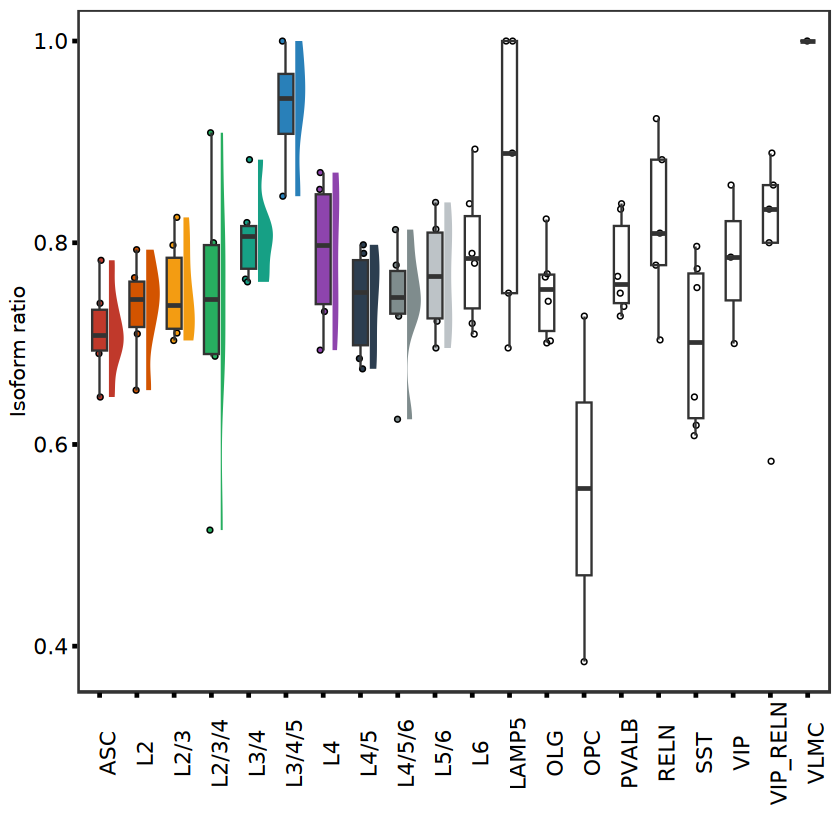

In [69]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
#ARL2BP
transex = c("XM_005571739.2")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtsb.case = transtsbf[transtsbf$transcript_id %in% transex,]
transtsb.case = transtsb.case %>% group_by(transcript_id) %>% filter(length(subclass) > 5)
transtsb.case = transtsb.case[transtsb.case$count > 5,]

isosigb = isosigls$lobe
isosigb = isosigb[,c("areatr","meanrelative","transcript_id")]

colnames(isosigb)[1] = "lobe"
transtsb.case = merge(transtsb.case,isosigb,by = c("lobe","transcript_id"))
transtsb.case$drc = transtsb.case$relative - transtsb.case$meanrelative
# pburble = ggplot(transtsb.case,aes(x = lobe,y = subclass,color = relative,size = prop)) + 
# geom_point() +
# facet_grid(~gene_id) +
# scale_color_viridis(option = "A") +
# theme_pubr() + theme(axis.text.x = element_blank()) +
# xlab("") + ylab("")
# pburble

pbox1 = ggplot(transtsb.case,aes(x = subclass,y = relative,fill = subclass)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw() +
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1


pbox2 = ggplot(transtsb.case,aes(x = subclass,y = relative,fill = subclass)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw() +
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox2
# pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
# pt
#ggexport(pt,filename = "result/figure4/spatial_contribution_lobe_case_CAPRIN1_05_02.pdf",width = 5,height = 8)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,AATF,NM_001284760.1,0.07919799,1562,0.16500067,0.10975105
2,AATF,XR_001485905.1,0.07919799,384,0.16500067,0.10975105
3,ABCA5,XM_005584800.2,0.15165242,1732,0.07619048,0.09067009
4,ACBD7,ACBD7-WeiLab-1,0.04128953,816,0.13892490,0.10884403
5,ACBD7,ACBD7-WeiLab-2,0.06521833,1528,0.14065336,0.03083393
6,ADAM15,XM_005541615.2,0.04175221,309,0.11891566,0.15707317


[1] 550

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0251  0.1001  0.1422  0.1475  0.1881  0.4056 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.01078 0.05742 0.08676 0.09799 0.13458 0.36201 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.008276 0.078829 0.126063 0.129902 0.165022 0.565735 

Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_class_lobe_dtu_delta_tern_24_05_15.pdf



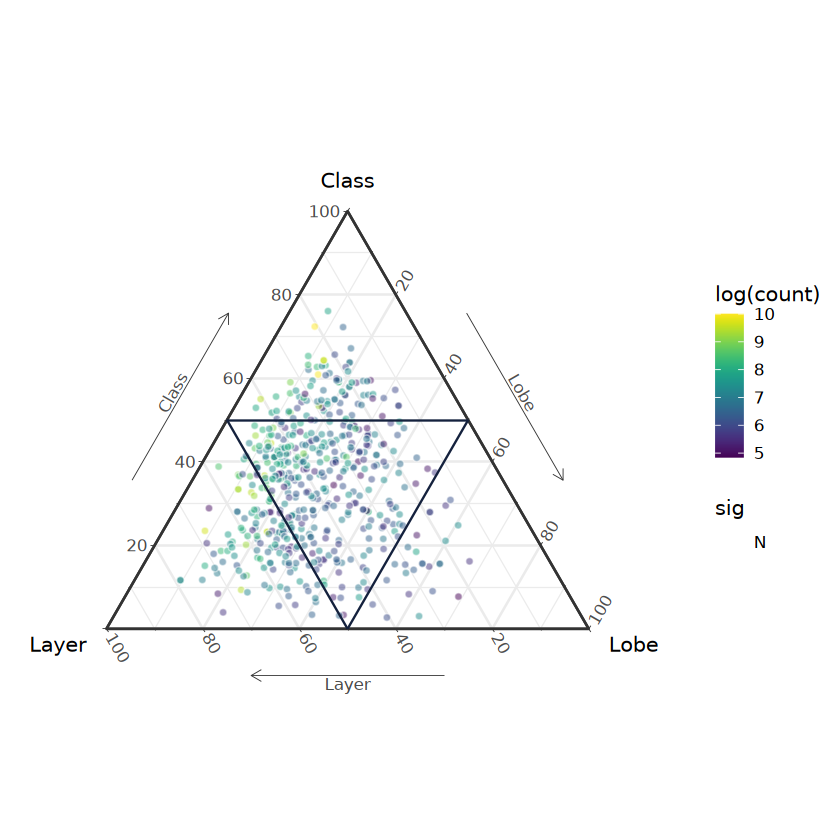

In [81]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig %in% c("Up","Down"),]$transcript_id)
isosigc = isosigls$class
huntrans2 = unique(isosigc[isosigc$sig %in% c("Up","Down"),]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig %in% c("Up","Down"),]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = NULL
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
xlab("Layer")+ 
ylab("Class")+
zlab("Lobe")+ 
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
scale_fill_viridis() +
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_class_lobe_dtu_delta_tern_24_05_15.pdf",width = 5,height = 5)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


[1] 1049

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.01669 0.12365 0.16232 0.16537 0.20108 0.42141 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.01580 0.07531 0.12327 0.12985 0.16769 0.53030 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.001277 0.151467 0.210101 0.216851 0.272821 0.814286 

Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_glu_lobe_dtu_delta_tern_24_05_15.pdf



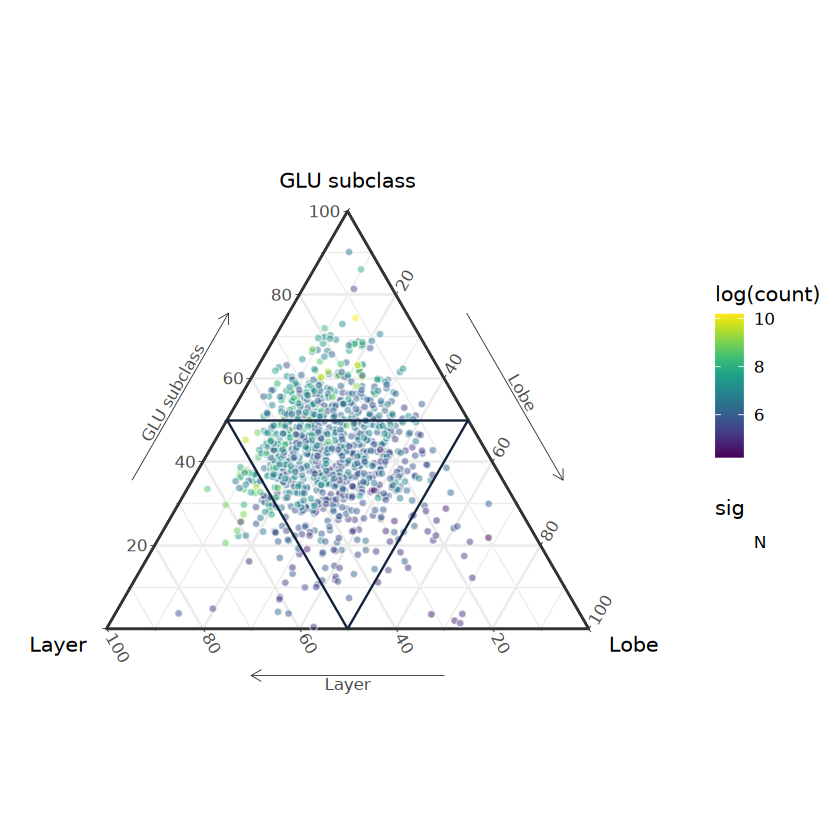

In [82]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig %in% c("Up","Down"),]$transcript_id)
isosigc = isosigls.cl$GLU_GLU
huntrans2 = unique(isosigc[isosigc$sig %in% c("Up","Down"),]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig %in% c("Up","Down"),]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
#head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = NULL
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
xlab("Layer")+ 
ylab("GLU subclass")+
zlab("Lobe")+ 
scale_fill_viridis() +
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_glu_lobe_dtu_delta_tern_24_05_15.pdf",width = 5,height = 5)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,ABCA5,XM_005584800.2,0.15165242,1732,0.1461538,0.09067009
2,ADAM15,XM_005541621.2,0.06618946,889,0.1364865,0.14005216
3,AHNAK,XM_005577589.2,0.24388262,1164,0.1461988,0.06520328
4,AIFM3,XM_015457402.1,0.13989126,5957,0.1041667,0.02694834
5,ANKRD42,XM_005579230.2,0.17714286,409,0.1640316,0.27139480
6,APMAP,XM_005568153.2,0.18530815,7595,0.1728778,0.03035467


[1] 413

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.02315 0.13553 0.16165 0.16424 0.19333 0.40076 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.01035 0.06096 0.09263 0.09957 0.13506 0.35624 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.06593 0.13095 0.14389 0.19737 0.50179 

Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_gaba_lobe_dtu_delta_tern_24_05_15.pdf



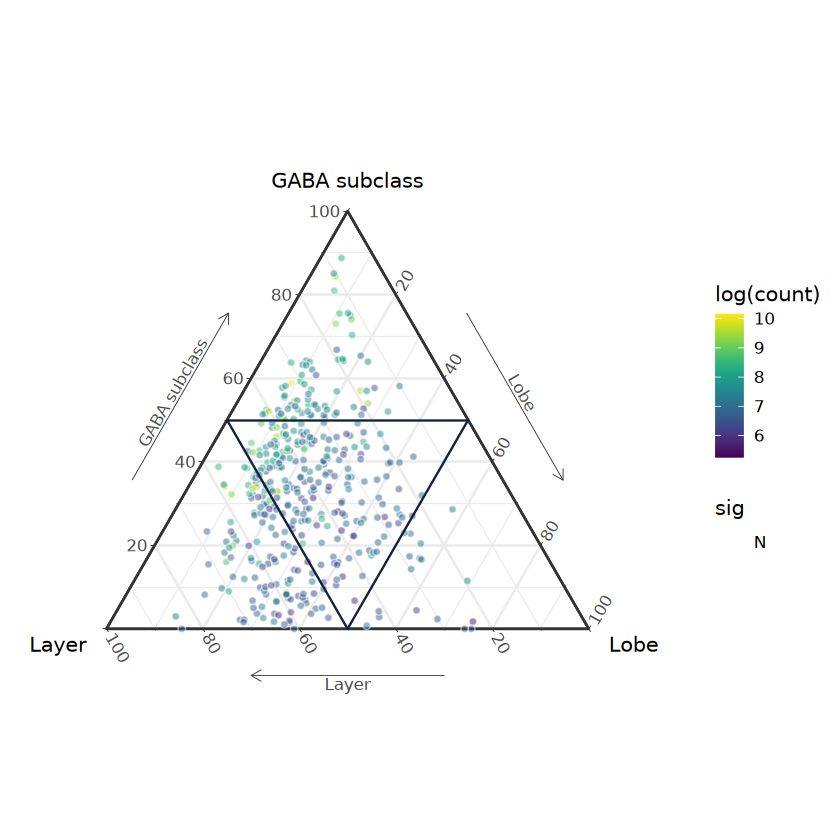

In [83]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig %in% c("Up","Down"),]$transcript_id)
isosigc = isosigls.cl$GABA_GABA
huntrans2 = unique(isosigc[isosigc$sig %in% c("Up","Down"),]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig %in% c("Up","Down"),]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = NULL
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
xlab("Layer")+ 
ylab("GABA subclass")+
zlab("Lobe")+ 
scale_fill_viridis() +
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_gaba_lobe_dtu_delta_tern_24_05_15.pdf",width = 5,height = 5)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,AGAP3,AGAP3-WeiLab-1,0.06790365,10549,0.20301926,0.03567868
2,AGO3,XM_005543987.2,0.23554422,561,0.16349206,0.18847458
3,AGPAT4,XM_015448385.1,0.12665574,2085,0.24133007,0.02926455
4,AHNAK,XM_005577589.2,0.24388262,1164,0.07906977,0.06520328
5,AIFM3,XM_015457402.1,0.13989126,5957,0.20326376,0.02694834
6,ANXA6,NM_001284044.1,0.07904451,14656,0.29226211,0.01507873


[1] 380

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0211  0.1104  0.1568  0.1576  0.2007  0.4008 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.006393 0.054007 0.085086 0.099618 0.138101 0.362012 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0557  0.1250  0.1458  0.2125  0.5176 

Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_nn_lobe_dtu_delta_tern_24_05_02.pdf



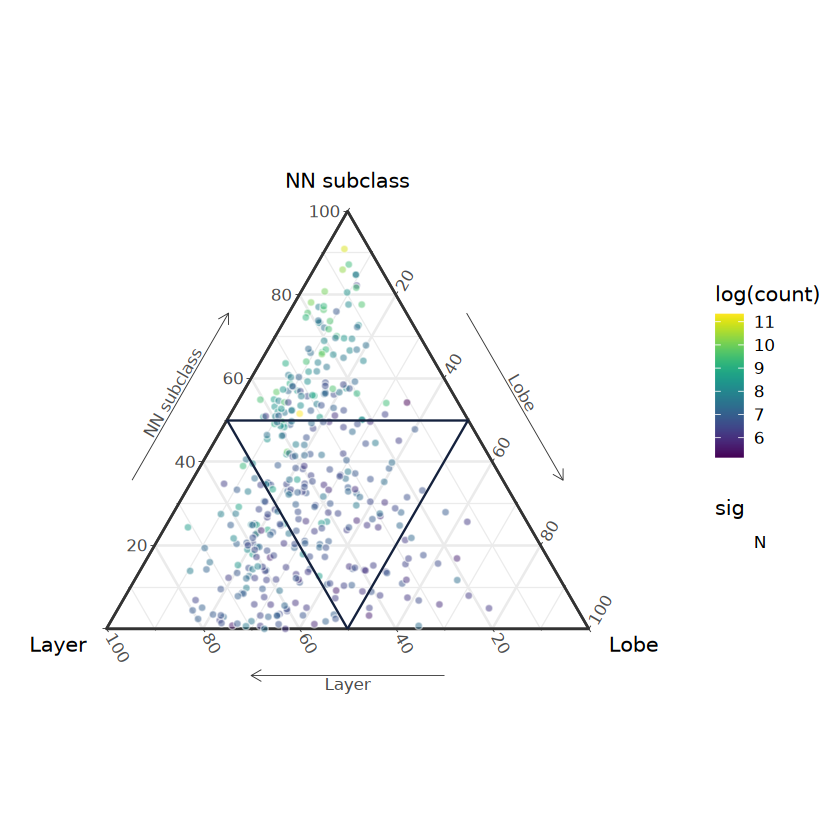

In [84]:
#
isosigl = isosigls$layer
huntrans1 = unique(isosigl[isosigl$sig == "Up",]$transcript_id)
isosigc = isosigls.cl$NonNeuron_NonNeuron
huntrans2 = unique(isosigc[isosigc$sig == "Up",]$transcript_id)
isosigb = isosigls$lobe
huntrans3 = unique(isosigb[isosigb$sig == "Up",]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = NULL
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
scale_fill_viridis() +
xlab("Layer")+ 
ylab("NN subclass")+
zlab("Lobe")+ 
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_nn_lobe_dtu_delta_tern_24_05_02.pdf",width = 5,height = 5)

`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


,gene_id,transcript_id,drl,count,drc,drb
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
1,ABLIM1,XM_005566500.2,0.18167406,1424,0.187418087,0.14631043
2,ACOT8,XM_005569186.2,0.29192547,596,0.008163265,0.12140175
3,ACSS1,XM_005568146.2,0.15625000,456,0.063950144,0.01987281
4,ADGRB3,XM_015449250.1,0.09395425,2455,0.207170224,0.07621951
5,ADIPOR2,XM_005569784.2,0.14772727,410,0.293729373,0.01987179
6,AGAP3,AGAP3-WeiLab-1,0.15811730,2796,0.203019261,0.18192488


[1] 374

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0136  0.1065  0.1688  0.1756  0.2360  0.4866 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00245 0.08333 0.13855 0.15367 0.20948 0.50179 

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.0009837 0.0722242 0.1664032 0.1685317 0.2340624 0.5175593 

Warning message in geom_text(data = isosigtri[isosigtri$sig != "N", ], aes(drl, :
"Ignoring unknown aesthetics: z"
file saved to result/figure4/layer_nn_glu_gaba_delta_tern_24_05_15.pdf



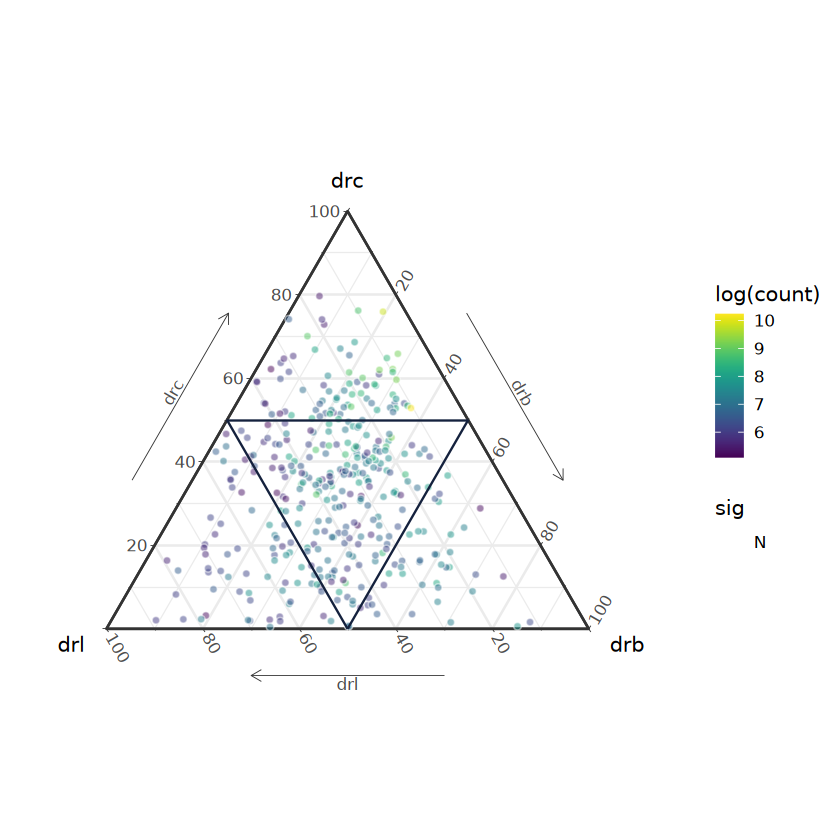

In [85]:
#
isosigl = isosigls.cl$GLU_GLU
huntrans1 = unique(isosigl[isosigl$sig == "Up",]$transcript_id)
isosigc = isosigls.cl$NonNeuron_NonNeuron
huntrans2 = unique(isosigc[isosigc$sig == "Up",]$transcript_id)
isosigb = isosigls.cl$GABA_GABA
huntrans3 = unique(isosigb[isosigb$sig == "Up",]$transcript_id)
huntrans = c(huntrans1,huntrans2,huntrans3)

isosigl = isosigl[isosigl$transcript_id %in% huntrans,]
isosigl = isosigl[isosigl$count > 10,]
isosigl = isosigl %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drl = max(relative) - min(relative),count = sum(count))

isosigc = isosigc[isosigc$transcript_id %in% huntrans,]
isosigc = isosigc[isosigc$count > 10,]
isosigc = isosigc %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drc = max(relative) - min(relative))

isosigb = isosigb[isosigb$transcript_id %in% huntrans,]
isosigb = isosigb[isosigb$count > 10,]
isosigb = isosigb %>% group_by(gene_id,transcript_id) %>% filter(length(areatr) > 1) %>% summarise(drb = max(relative) - min(relative))

isosigtri = merge(isosigl,isosigc,by = c("gene_id","transcript_id"))
isosigtri = merge(isosigtri,isosigb,by = c("gene_id","transcript_id"))
head(isosigtri)
nrow(isosigtri)
summary(isosigtri$drl)
summary(isosigtri$drb)
summary(isosigtri$drc)
isosigtri$transname = isosigtri$transcript_id
isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname =
paste0(isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$gene_id,"-",
       isosigtri[MySplit(isosigtri$transcript_id,"-",1) != isosigtri$gene_id,]$transname)
#isosigtri = rbind(isosigtri,data.frame("transcript_id" = "ref","drl" = 1, count = 1,"drc" = 1, "drb" = 1))
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = NULL
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
hubgene = NULL
isosigtri$sig = "N"
#isosigtri[isosigtri$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
library(ggtern)
library(ggpointdensity)
library(ggrepel)
labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

mycolors = c("white","red")
names(mycolors) = c("N","Y")
isosigtri = isosigtri[order(isosigtri$sig),]
p2 = ggtern(data=isosigtri,aes(drl,drc,drb,fill = log(count),color = sig)) + 
#geom_pointdensity() +
   geom_mask() +
   geom_point(shape=21,alpha = 0.5) + 
   geom_text(data=isosigtri[isosigtri$sig != "N",],
             aes(drl,drc,drb,label = gene_id),size = 2,color = "black")+
 #  geom_text_repel(data=isosigtri[isosigtri$sig != "N",],aes(drl,drc,drb)) +
   theme_bw() +
   theme_showarrows() +
   theme_clockwise() +
geom_Lline(Lintercept=0.50,color="#14213d") +
geom_Tline(Tintercept=0.50,color="#14213d") +
geom_Rline(Rintercept=0.50,color="#14213d") +
scale_fill_viridis() +
scale_color_manual(values = mycolors)
p2
ggexport(p2,filename = "result/figure4/layer_nn_glu_gaba_delta_tern_24_05_15.pdf",width = 5,height = 5)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


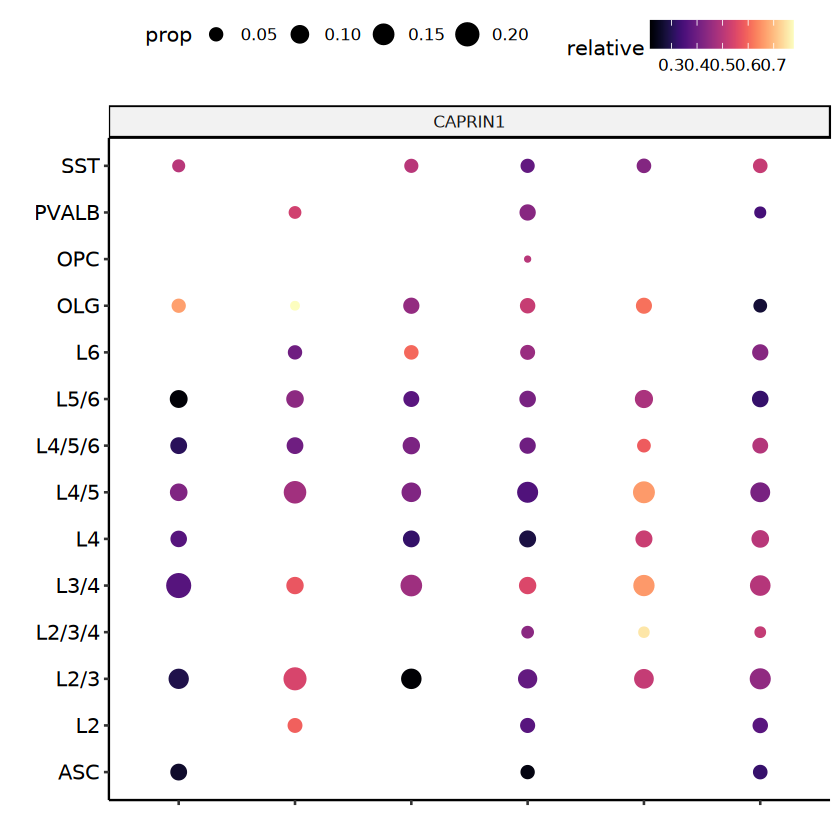

file saved to result/figure4/spatial_contribution_lobe_case_CAPRIN1_05_02.pdf



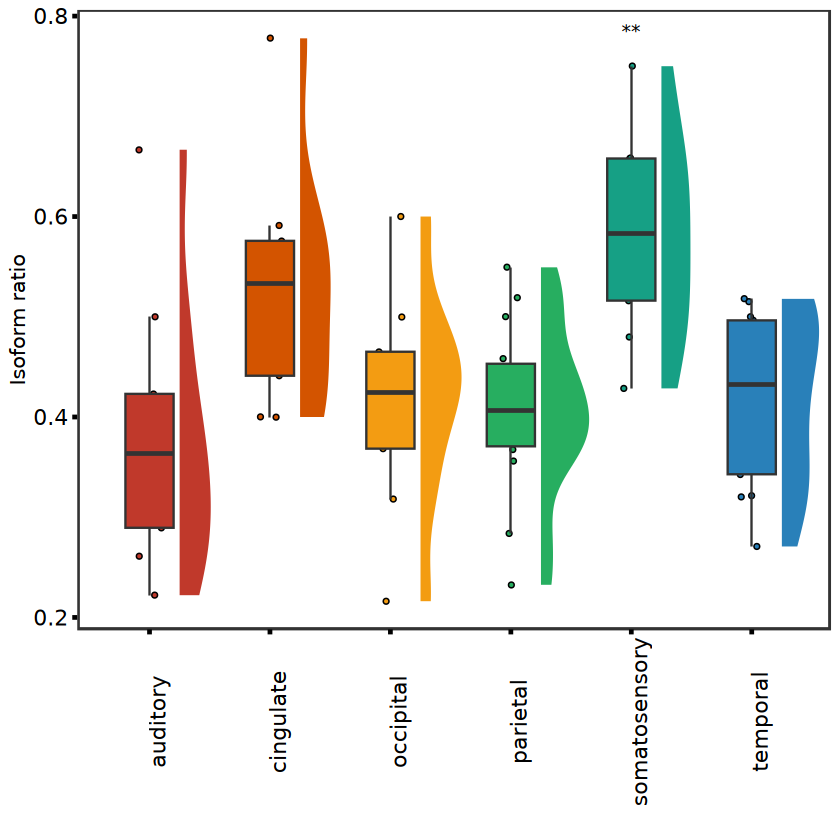

In [732]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
transex = c("XM_015434930.1")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtsb.case = transtsbf[transtsbf$transcript_id %in% transex,]
transtsb.case = transtsb.case %>% group_by(transcript_id) %>% filter(length(subclass) > 5)
transtsb.case = transtsb.case[transtsb.case$count > 5,]

isosigb = isosigls$lobe
isosigb = isosigb[,c("areatr","meanrelative","transcript_id")]

colnames(isosigb)[1] = "lobe"
transtsb.case = merge(transtsb.case,isosigb,by = c("lobe","transcript_id"))
transtsb.case$drc = transtsb.case$relative - transtsb.case$meanrelative
pburble = ggplot(transtsb.case,aes(x = lobe,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~gene_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtsb.case,aes(x = lobe,y = relative,fill = lobe)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_lobe_case_CAPRIN1_05_02.pdf",width = 5,height = 8)

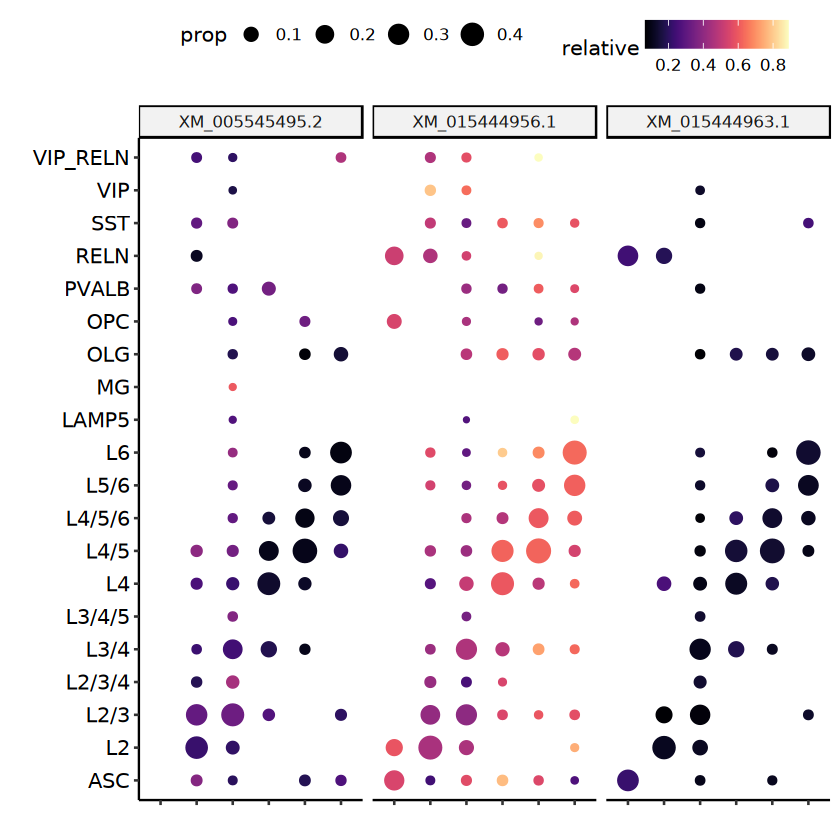

file saved to result/figure4/spatial_contribution_lobe_case_DDRGK1-WeiLab-1_05_02.pdf



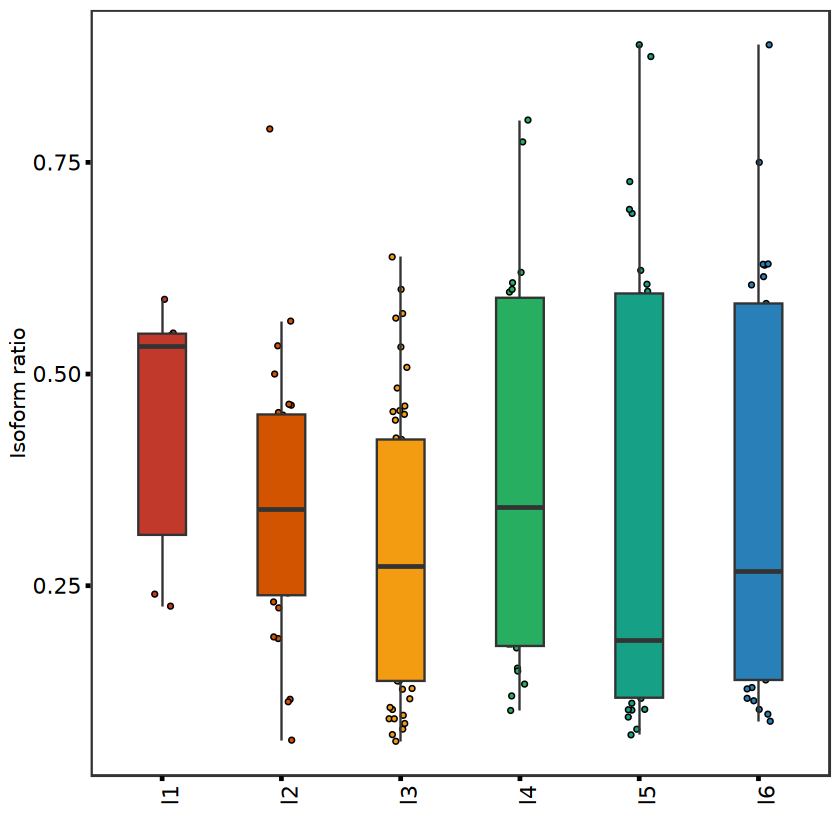

In [856]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
transex = c("XM_005545495.2","XM_015444956.1","XM_015444963.1")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtslf.case = transtslf[transtslf$transcript_id %in% transex,]
transtslf.case = transtslf.case[transtslf.case$count > 5,]

#transtslf.case$drc = transtslf.case$relative - transtslf.case$meanrelative
pburble = ggplot(transtslf.case,aes(x = layer,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~transcript_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtslf.case,aes(x = layer,y = relative,fill = layer)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_lobe_case_DDRGK1-WeiLab-1_05_02.pdf",width = 5,height = 8)

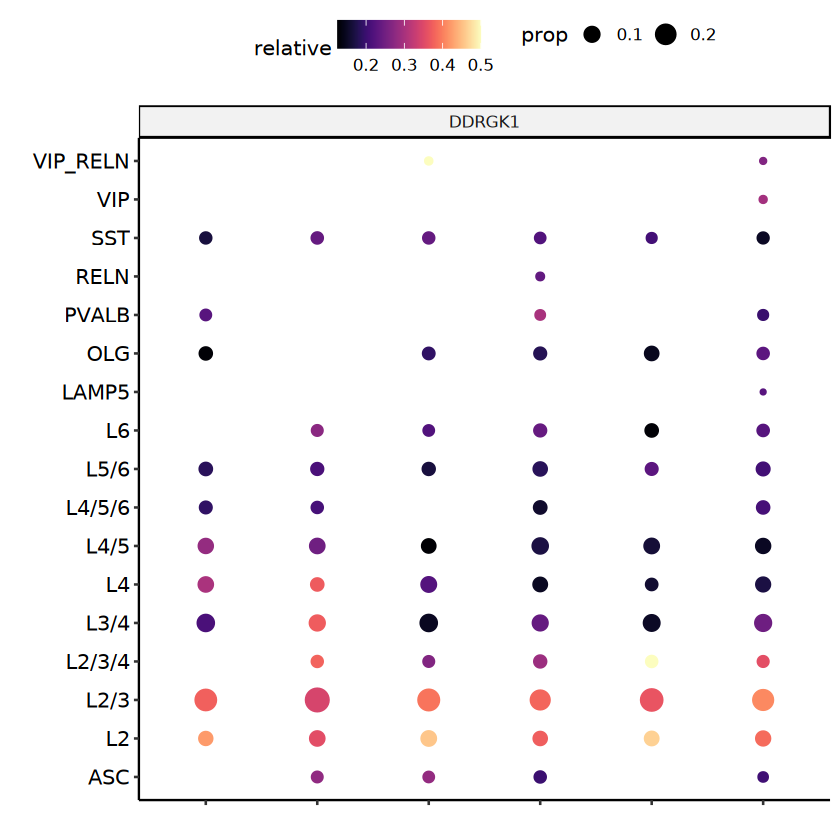

file saved to result/figure4/spatial_contribution_lobe_case_DDRGK1-WeiLab-1_05_02.pdf



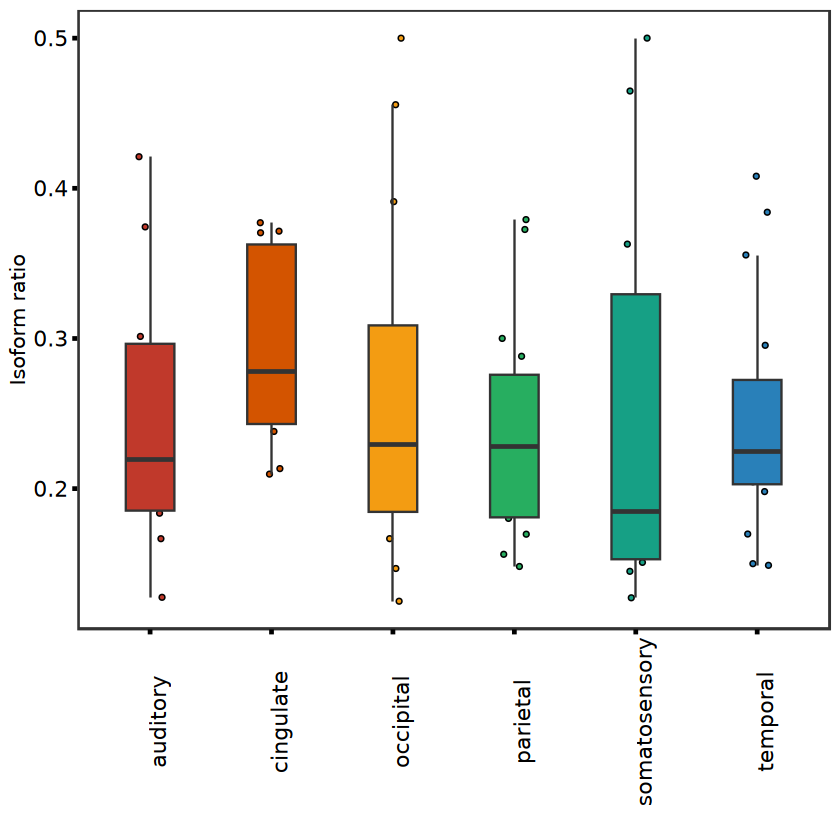

In [858]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
transex = c("DDRGK1-WeiLab-1")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtsbf.case = transtsbf[transtsbf$transcript_id %in% transex,]
transtsbf.case = transtsbf.case[transtsbf.case$count > 5,]

#transtslf.case$drc = transtslf.case$relative - transtslf.case$meanrelative
pburble = ggplot(transtsbf.case,aes(x = lobe,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~gene_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtsbf.case,aes(x = lobe,y = relative,fill = lobe)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_lobe_case_DDRGK1-WeiLab-1_05_02.pdf",width = 5,height = 8)

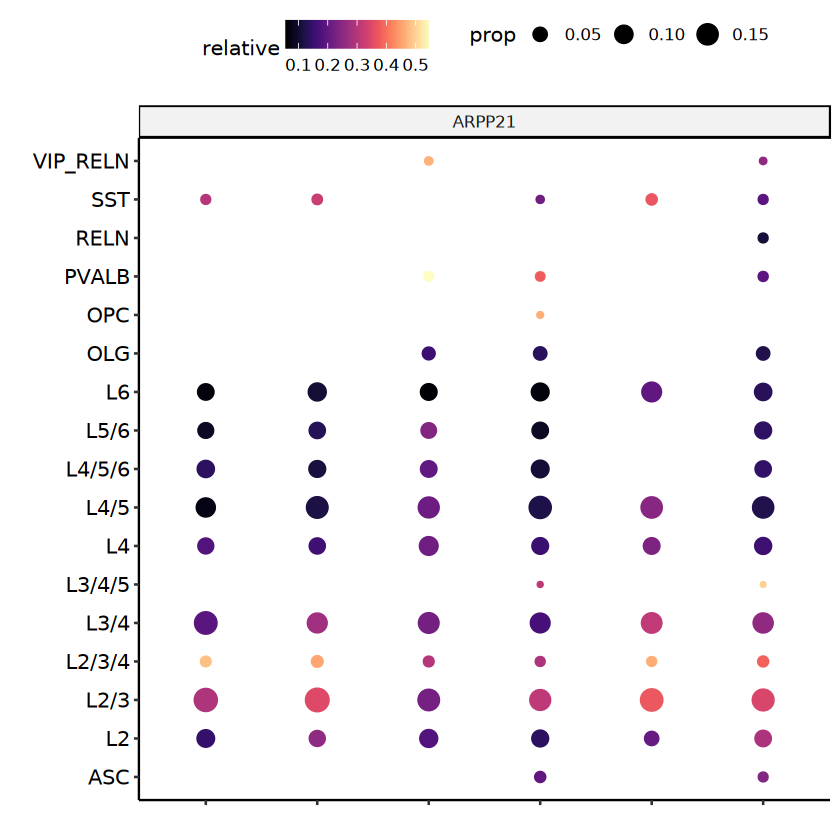

file saved to result/figure4/spatial_contribution_lobe_case_ARPP21_05_02.pdf



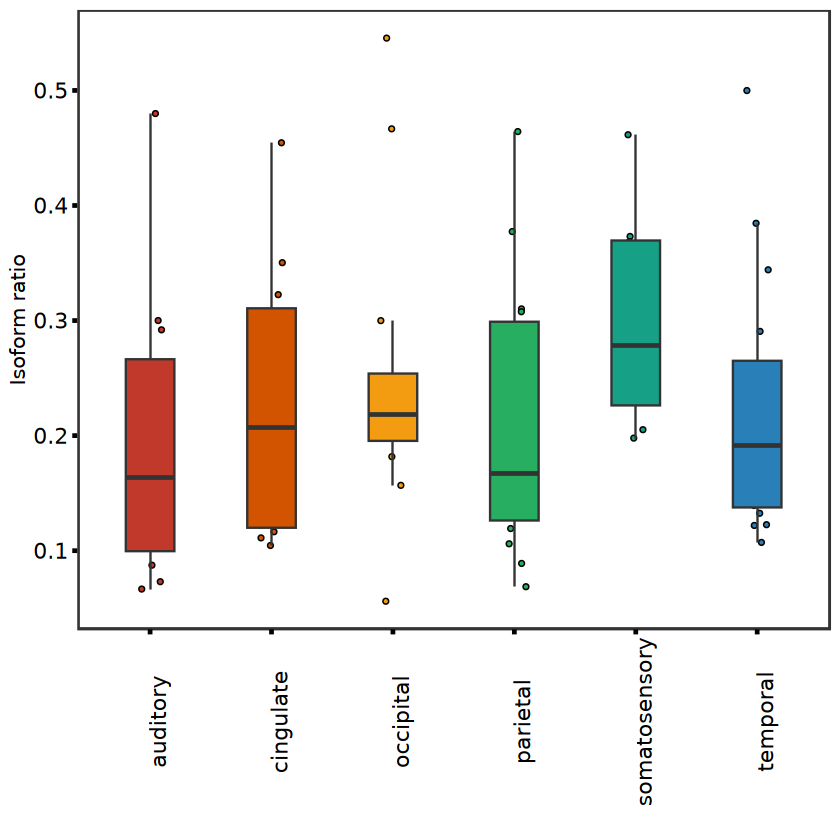

In [865]:
transex = c("XM_005545495.2")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtsbf.case = transtsbf[transtsbf$transcript_id %in% transex,]
transtsbf.case = transtsbf.case[transtsbf.case$count > 5,]

#transtslf.case$drc = transtslf.case$relative - transtslf.case$meanrelative
pburble = ggplot(transtsbf.case,aes(x = lobe,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~gene_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtsbf.case,aes(x = lobe,y = relative,fill = lobe)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_lobe_case_ARPP21_05_02.pdf",width = 5,height = 8)

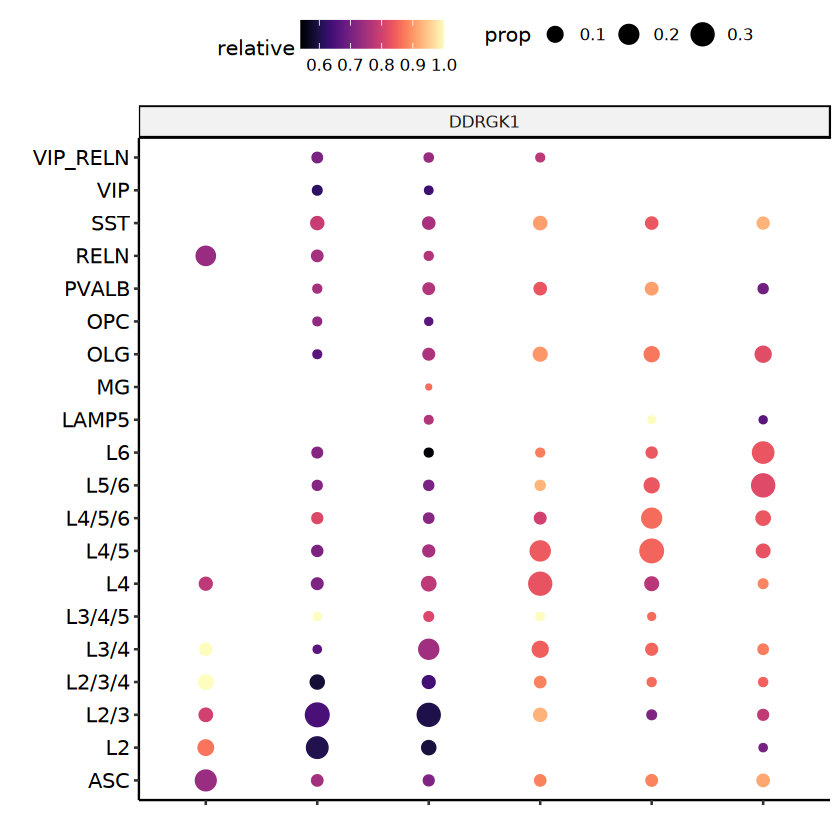

file saved to result/figure4/spatial_contribution_layer_case_DDRGK1-WeiLab-1_05_02.pdf



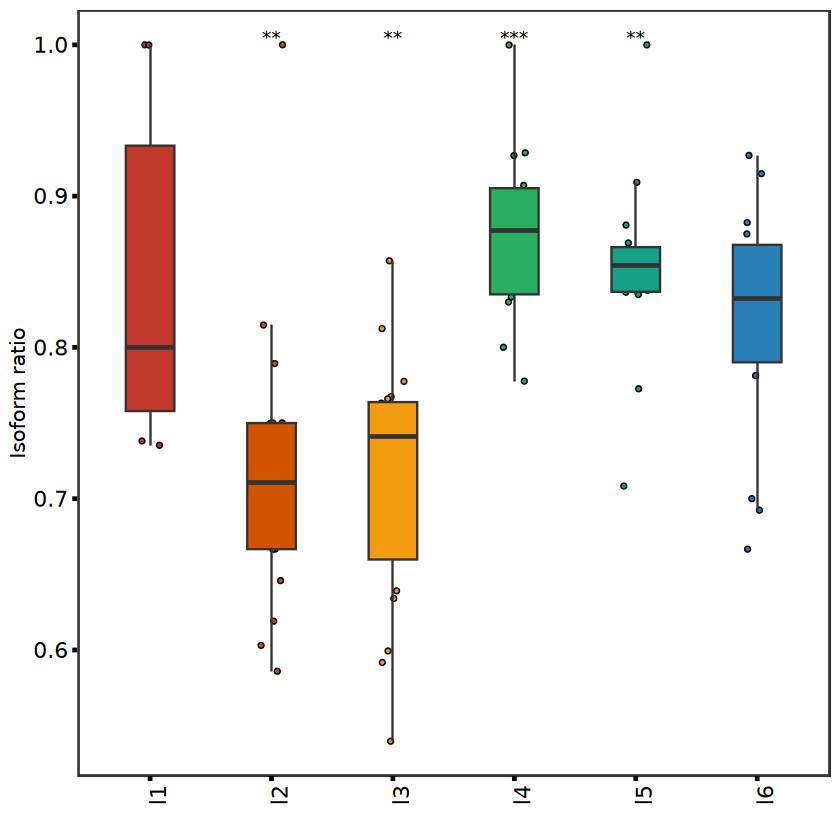

In [866]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
transex = c("XM_005568473.2")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtslf.case = transtslf[transtslf$transcript_id %in% transex,]
transtslf.case = transtslf.case[transtslf.case$count > 5,]

#transtslf.case$drc = transtslf.case$relative - transtslf.case$meanrelative
pburble = ggplot(transtslf.case,aes(x = layer,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~gene_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtslf.case,aes(x = layer,y = relative,fill = layer)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_layer_case_DDRGK1-WeiLab-1_05_02.pdf",width = 5,height = 8)

Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"


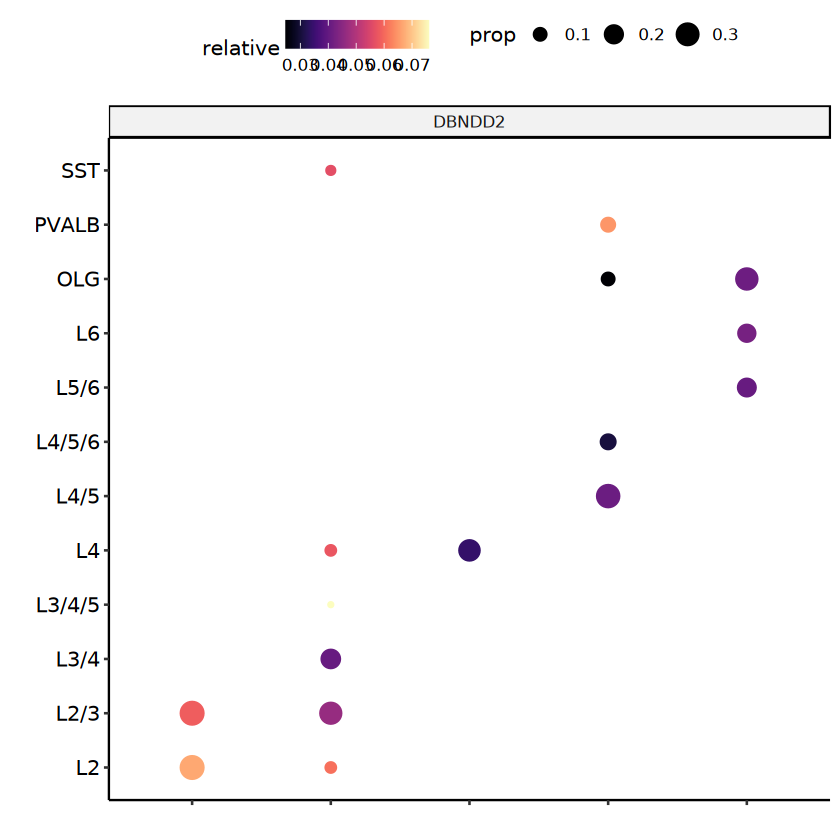

Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
file saved to result/figure4/spatial_contribution_layer_case_DBNDD2_05_02.pdf



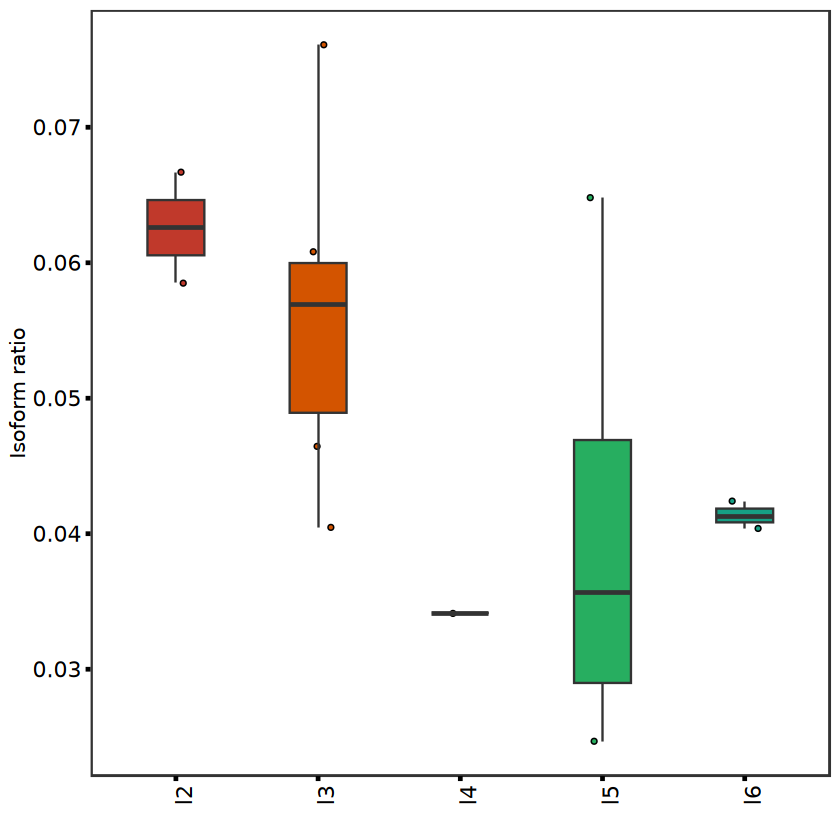

In [875]:
#transtsbf2.st = transtsbf2 %>% group_by(gene_id,transcript_id,lobe) %>% summarise(count = sum(count),drp = mean(drp),drb = mean(drb))
#unique(transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]$transcript_id)
#transtsb.case = transtsbf2.st[transtsbf2.st$drp < 0.05 & transtsbf2.st$drb > 0.1,]
#unique(transtsb.case$gene_id)
#case plot
transex = c("XM_005569136.2")
#transtsb.case = transtsbf[transtsbf$transcript_id %in% transtsb.case$transcript_id,]
transtslf.case = transtslf[transtslf$transcript_id %in% transex,]
transtslf.case = transtslf.case[transtslf.case$count > 5,]

#transtslf.case$drc = transtslf.case$relative - transtslf.case$meanrelative
pburble = ggplot(transtslf.case,aes(x = layer,y = subclass,color = relative,size = prop)) + 
geom_point() +
facet_grid(~gene_id) +
scale_color_viridis(option = "A") +
theme_pubr() + theme(axis.text.x = element_blank()) +
xlab("") + ylab("")
pburble

pbox1 = ggplot(transtslf.case,aes(x = layer,y = relative,fill = layer)) +
      geom_jitter(shape=21,size=1,width=0.1) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
      stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
pbox1

pt = ggarrange(pburble,pbox1,heights = c(1,0.8),ncol = 1)
ggexport(pt,filename = "result/figure4/spatial_contribution_layer_case_DBNDD2_05_02.pdf",width = 5,height = 8)

In [873]:
transtslf[transtslf$gene_id == "DBNDD2",]

gene_id,transcript_id,areatr,count,genecount,layer,subclass,relative,prop,drp,drb
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
DBNDD2,DBNDD2-WeiLab-1,l2-L2,11,165,l2,L2,0.06666667,0.33333333,0.113945578,0.002946593
DBNDD2,DBNDD2-WeiLab-1,l2-L2/3,11,188,l2,L2/3,0.05851064,0.33333333,0.186766056,0.006012689
DBNDD2,DBNDD2-WeiLab-1,l3-L2,11,181,l3,L2,0.06077348,0.07482993,-0.144557823,-0.002946593
DBNDD2,DBNDD2-WeiLab-1,l3-L2/3,41,882,l3,L2/3,0.04648526,0.27891156,0.132344288,-0.006012689
DBNDD2,DBNDD2-WeiLab-1,l3-L3/4,31,766,l3,L3/4,0.04046997,0.21088435,0.105235931,0.000000000
DBNDD2,DBNDD2-WeiLab-1,l3-L3/4/5,7,92,l3,L3/4/5,0.07608696,0.04761905,0.013844797,0.000000000
DBNDD2,DBNDD2-WeiLab-1,l3-L4,11,191,l3,L4,0.05759162,0.07482993,-0.057609797,0.011722641
DBNDD2,DBNDD2-WeiLab-1,l3-SST,9,160,l3,SST,0.05625000,0.06122449,0.015083903,0.000000000
DBNDD2,DBNDD2-WeiLab-1,l4-L4,7,205,l4,L4,0.03414634,0.25925926,0.126819530,-0.011722641


In [ ]:
testdf = read.delim("../script/map_ngs_nano_4.0/data/ont_revo_MBP_test_res",skip = 1,header = F)
testdft = fread("../script/map_ngs_nano_4.0/data/ont_revo_MBP_test",header = F)
length(unique(testdft$V1))
length(unique(testdf$V1))
summary(testdf$V5)
length(unique(testdf[testdf$V5<=5,]$V1))/length(unique(testdft$V1))

In [ ]:
testdf = read.delim("../script/map_ngs_nano_4.0/data/cyclone_revo_MBP_test_res",skip = 1,header = F)
testdft = fread("../script/map_ngs_nano_4.0/data/cyclone_revo_MBP_test",header = F)
length(unique(testdft$V1))
length(unique(testdf$V1))
summary(testdf$V5)
length(unique(testdf[testdf$V5<=5,]$V1))/length(unique(testdft$V1))

### Analysis contribution model

In [23]:
library(qs)
library(dplyr)
library(lme4)

Warning message:
"package 'lme4' was built under R version 4.3.3"
Loading required package: Matrix

Warning message:
"package 'Matrix' was built under R version 4.3.2"

Attaching package: 'Matrix'


The following object is masked from 'package:S4Vectors':

    expand




In [ ]:
transt_inner = fsraw.cor[fsraw.cor$subclass != "",] %>% group_by(lobe,layer,subclass,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(lobe,layer,subclass,gene_id) %>% 
                mutate(genecount = sum(count),relative = count/genecount)
transt_inner = transt_inner %>% group_by(subclass,transcript_id) %>% 
              mutate(meanrelative = mean(relative))

transt_inner.lobe = fsraw.cor[fsraw.cor$subclass != "",] %>% group_by(lobe,subclass,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(lobe,subclass,gene_id) %>% 
                mutate(genecount = sum(count),relative = count/genecount)
transt_inner.lobe = transt_inner.lobe %>% group_by(subclass,transcript_id) %>% 
              mutate(meanrelative = mean(relative))


transt_inner.layer = fsraw.cor[fsraw.cor$subclass != "",] %>% group_by(layer,subclass,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(layer,subclass,gene_id) %>% 
                mutate(genecount = sum(count),relative = count/genecount)
transt_inner.layer = transt_inner.layer %>% group_by(subclass,transcript_id) %>% 
              mutate(meanrelative = mean(relative))
transt_innerls = list("inner" = transt_inner,"lobe" = transt_inner.lobe,"layer" = transt_inner.layer)
qsave(list("inner" = transt_inner,"lobe" = transt_inner.lobe,"layer" = transt_inner.layer),
      "data/dtu_analysis/region_subclass_isoform_ratio_stat_251203.qs")

#transtf = transtf[transtf$tcount > 1000,]
transt = fsraw.cor %>% group_by(gene_id,transcript_id,subclass,lobe,region) %>% 
          summarise(count = length(readid)) %>% group_by(gene_id,subclass,lobe,region) %>% 
          mutate(genecount = sum(count),relative = count/genecount)
transt = transt %>% group_by(lobe) %>% mutate(tcount = sum(count))
transtf = transt %>% group_by(gene_id) %>% filter(length(unique(transcript_id)) > 1 )
#transtf = transtf[transtf$count > 5,]
#transtf = transtf[paste0(transtf$subclass,transtf$layer) %in% paste0(substf$subclass,substf$layer),]
transtf = transtf %>% group_by(gene_id,transcript_id,subclass) %>% mutate(cellm = sum(count)/sum(genecount))
transtf = transtf %>% group_by(gene_id,transcript_id,lobe) %>% mutate(lobem = sum(count)/sum(genecount))
transtf = transtf %>% group_by(gene_id,transcript_id,region) %>% mutate(regionm = sum(count)/sum(genecount))
transtf = transtf[transtf$genecount > 10,]
transtf = transtf %>% group_by(transcript_id,subclass) %>% filter(length(unique(lobe)) == 6)
transtf = transtf %>% group_by(transcript_id) %>% filter(length(unique(subclass)) > 6)
transt.lobei = transtf[transtf$subclass != "",]
length(unique(transtf$gene_id))



In [28]:
model_with_region = glmer(relative ~  cellm + regionm + (1|count),
                            family = binomial(),
                            data = transt.lobei[transt.lobei$gene_id == "RTN1",],
                            na.action = na.exclude)
summary(model_with_region)

Warning message in eval(family$initialize, rho):
"non-integer #successes in a binomial glm!"
boundary (singular) fit: see help('isSingular')



Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: relative ~ cellm + regionm + (1 | count)
   Data: transt.lobei[transt.lobei$gene_id == "RTN1", ]

     AIC      BIC   logLik deviance df.resid 
    90.7    109.6    -41.4     82.7      830 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-7.2636 -2.5415  0.1729  3.9234 11.0597 

Random effects:
 Groups Name        Variance Std.Dev.
 count  (Intercept) 0        0       
Number of obs: 834, groups:  count, 165

Fixed effects:
            Estimate Std. Error z value Pr(>|z|)    
(Intercept)  -10.944      1.132  -9.665   <2e-16 ***
cellm          2.186      8.307   0.263   0.7924    
regionm       18.849      8.112   2.323   0.0202 *  
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Correlation of Fixed Effects:
        (Intr) cellm 
cellm   -0.194       
regionm -0.016 -0.975
optimizer (Nelder_Mead) convergence code: 0 (OK)
bo

In [29]:
modelcoef2 = NULL
length(unique(transt.lobei$gene_id))
for(i in unique(transt.lobei$gene_id)){
    model_with_region = tryCatch(glmer(relative ~  cellm + regionm + (1|count),
                            family = binomial(),
                            data = transt.lobei[transt.lobei$gene_id == i,],
                            na.action = na.exclude), 
                   error = function(e) NA)

    if(!is.na(model_with_region)){
        modelsm = tryCatch(summary(model_with_region),error = function(e) NA)
        if(length(modelsm) == 1) next;
        modelsmdf = as.data.frame(modelsm$coefficients)
        modelsmdf$gene_id = i
        # gi = transt.lobei[transt.lobei$transcript_id == i,]$gene_id[1]
        # modelsmdf$gene_id = gi
        modelsmdf$areatr = rownames(modelsmdf)
        modelcoef2 = rbind(modelcoef2,modelsmdf)
    }    
    
   # print(summary(model_with_region))
}
                           
modelcoef2[modelcoef2$gene_id == "RTN1",]
colnames(modelcoef2)[4] = "pvalue"
length(unique(modelcoef2$gene_id))
length(unique(modelcoef2[modelcoef2$pvalue < 0.05 & (modelcoef2$areatr %in% c("lobem")),]$gene_id))
length(unique(modelcoef2[modelcoef2$pvalue < 0.05 & (modelcoef2$areatr %in% c("regionm")),]$gene_id))
length(unique(modelcoef2[modelcoef2$pvalue < 0.05 & (modelcoef2$areatr %in% c("cellm")),]$gene_id))

hubb = unique(modelcoef2[modelcoef2$pvalue < 0.05 & (modelcoef2$areatr %in% c("regionm")),]$gene_id)
hubc = unique(modelcoef2[modelcoef2$pvalue < 0.05 & (modelcoef2$areatr %in% c("cellm")),]$gene_id)

length(intersect(hubc,hubb))
qsave(modelcoef2,"data/dtu_analysis/region_subclass_isoform_model_tri_onlyregion_25_12_03.qs")

[1] 372

Warning message in eval(family$initialize, rho):
"non-integer #successes in a binomial glm!"
boundary (singular) fit: see help('isSingular')

Warning message in is.na(model_with_region):
"is.na() applied to non-(list or vector) of type 'S4'"
Warning message in vcov.merMod(object, use.hessian = use.hessian):
"variance-covariance matrix computed from finite-difference Hessian is
not positive definite or contains NA values: falling back to var-cov estimated from RX"
Warning message in vcov.merMod(object, correlation = correlation, sigm = sig):
"variance-covariance matrix computed from finite-difference Hessian is
not positive definite or contains NA values: falling back to var-cov estimated from RX"
Warning message in eval(family$initialize, rho):
"non-integer #successes in a binomial glm!"
boundary (singular) fit: see help('isSingular')

Warning message in is.na(model_with_region):
"is.na() applied to non-(list or vector) of type 'S4'"
Warning message in vcov.merMod(object, use.hessian =

,Estimate,Std. Error,z value,Pr(>|z|),gene_id,areatr
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
(Intercept)269,-10.943947,1.132282,-9.6653890,4.230098e-22,RTN1,(Intercept)
cellm269,2.186325,8.306524,0.2632058,7.923920e-01,RTN1,cellm
regionm269,18.848613,8.112464,2.3234140,2.015692e-02,RTN1,regionm


[1] 354

[1] 0

[1] 61

[1] 57

[1] 29

In [30]:
#modelcoef2 = qread("data/dtu_analysis/region_subclass_isoform_model_tri_241015.qs")
# modelcoef2 = qread("data/dtu_analysis/region_subclass_isoform_model_tri_onlyregion_24_12_20.qs")
modelcoef2$group = modelcoef2$areatr
modelcoef2[modelcoef2$areatr == "cellm",]$group = "cell"
#modelcoef2[modelcoef2$areatr == "lobem",]$group = "lobe"
#modelcoef2[modelcoef2$areatr == "layerm",]$group = "layer"
modelcoef2[modelcoef2$areatr == "regionm",]$group = "region"
head(modelcoef2)

,Estimate,Std. Error,z value,pvalue,gene_id,areatr,group
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
(Intercept),-59.727097,2366015078,-2.524375e-08,1,ABI2,(Intercept),(Intercept)
cellm,53.450647,1992326184,2.682826e-08,1,ABI2,cellm,cell
regionm,53.214197,1100514613,4.835392e-08,1,ABI2,regionm,region
(Intercept)1,-5.806286,771268832,-7.528226e-09,1,ADD1,(Intercept),(Intercept)
cellm1,30.355730,567226468,5.351607e-08,1,ADD1,cellm,cell
regionm1,21.291255,548798317,3.879614e-08,1,ADD1,regionm,region


[1] 354

Warning message:
"<ggplot> %+% x was deprecated in ggplot2 4.0.0.
ℹ Please use <ggplot> + x instead."


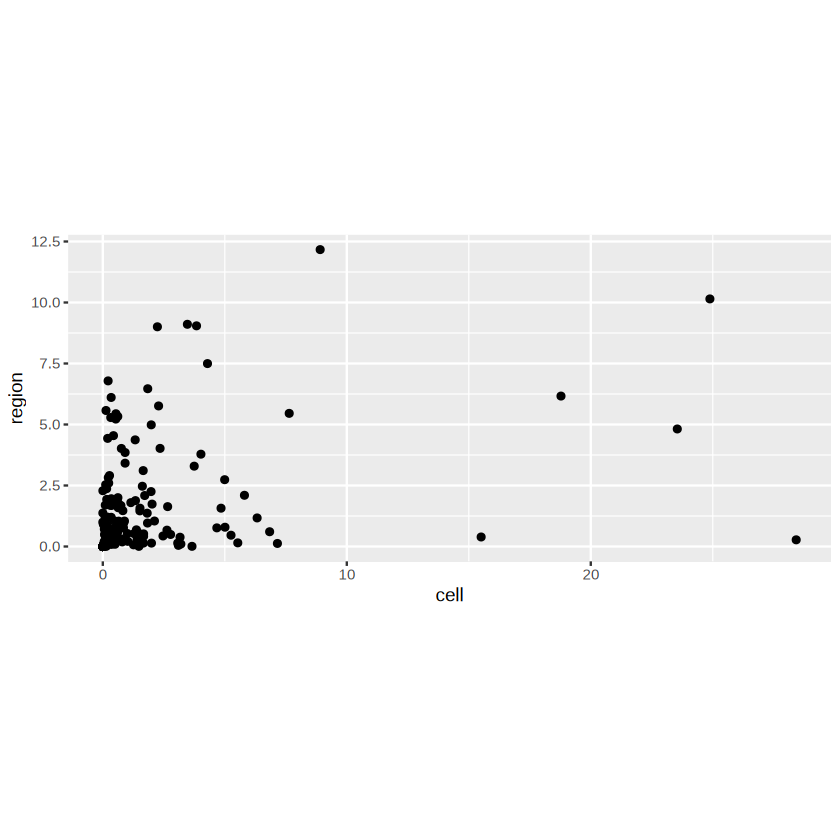

In [31]:
colnames(modelcoef2)[4] = "pvalue"
modelcoef.hub = modelcoef2[modelcoef2$group %in% c("cell","region"),]
length(unique(modelcoef.hub$gene_id))
modelcoef.hub$pvalue = -log10(modelcoef.hub$pvalue)
modelmx1 = dcast(modelcoef.hub,gene_id~group,value.var = "pvalue",fun.aggregate = sum)
ggplot(modelmx1,aes(x = cell,y = region)) + geom_point() + coord_fixed()


Warning message:
"package 'plotly' was built under R version 4.3.3"

Attaching package: 'plotly'


The following object is masked from 'package:ComplexHeatmap':

    add_heatmap


The following object is masked from 'package:BSgenome':

    export


The following object is masked from 'package:BiocIO':

    export


The following object is masked from 'package:XVector':

    slice


The following object is masked from 'package:ggplot2':

    last_plot


The following object is masked from 'package:rtracklayer':

    export


The following object is masked from 'package:AnnotationDbi':

    select


The following object is masked from 'package:IRanges':

    slice


The following object is masked from 'package:S4Vectors':

    rename


The following object is masked from 'package:stats':

    filter


The following object is masked from 'package:graphics':

    layout




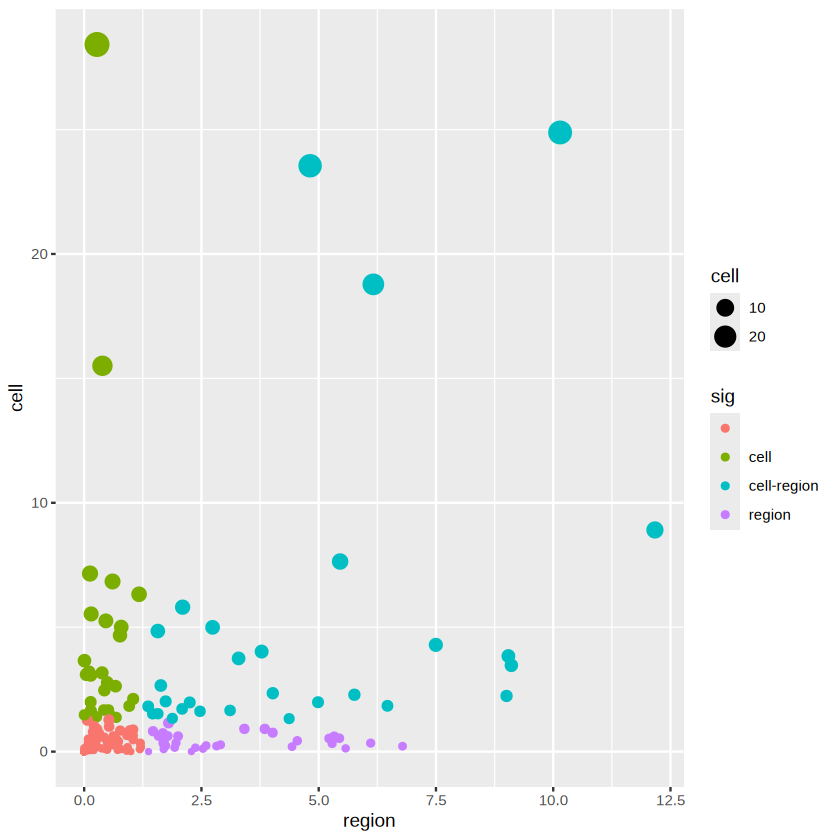

In [34]:
library(plotly)
#hubgene = modelcoef[modelcoef$pvalue < 0.05 & !(modelcoef$group %in% c("(Int")),]$gene_id
#hubgene2 = modelcoef[modelcoef$pvalue < 0.05 & !(modelcoef$group %in% c("(Int","cell")),]$gene_id
# htmlwidgets::saveWidget(
#         widget = pc1, #the plotly object
#         file = "figure/figure3_spatial_ana/3d_annotation_plot_case1_24_10_13.html",
#         selfcontained = TRUE
#       )
#modelmx1.hub = modelmx1[modelmx1$gene_id != "CIRBP",]
modelmx1.hub = modelmx1
modelmx1.hub$sig <- sapply(1:nrow(modelmx1.hub), function(i) {
  significant_cols <- names(modelmx1.hub)[-1][modelmx1.hub[i, -1] > -log10(0.05)]
  paste(significant_cols, collapse = "-")
})
#modelmx1.hub = modelmx1[modelmx1$gene_id != "CIRBP" & modelmx1$gene_id %in% hubgene,]
# modelmx1.hub$sig = "N"
# modelmx1.hub[modelmx1.hub$gene_id %in% hubgene2,]$sig = "Y"
# p = plot_ly(x = modelmx1.hub$layer,
#               y = modelmx1.hub$lobe,
#               z = modelmx1.hub$cell, marker = list(size = 2)) %>%
#  layout(scene = list(xaxis = list(title = "layer"),
#                         yaxis = list(title = "lobe"),
#                         zaxis = list(title = "cell")))
# p
ggplot(modelmx1.hub,aes(x = region,y = cell,size = cell,color = sig)) + geom_point()



In [140]:
datas4$region_model = modelmx1.hub

In [35]:

#isosigtri = isosigtri[isosigtri$gene_id %in% c(isosigi2$gene_id,isosigi1$gene_id),]

#nrow(isosigtri)
#isosigls$layer[isosigls$layer$gene_id == "MAG",]
#isosigls$lobe[isosigls$lobe$transcript_id == "XM_005558035.2",]
#isosigls$layer[isosigls$layer$gene_id == "C15H9orf85",]
hubtrans = c("XM_015434930.1","XM_005545495.2","DDRGK1-WeiLab-1","XM_005576035.2","XM_005592027.2")
casels = c("SRSF5","C11H12orf10","NTRK2","DBNDD2","DDRGK1","CAPRIN1","ARPP19","RPS21","IDH3B","RTN1")
#hubgene = c('AHNAK','AIFM3','CIB1','CTDSP1','DAAM2','FMNL2','INTS10','ITGA7','LITAF','MRVI1')
# hubgene = c("ARPP21","DDRGK1","CAPRIN1","SLC8A1","ARL2BP")
# modelmx1$sig = "N"
# modelmx1[modelmx1$transcript_id %in% hubtrans,]$sig = "Y"
#isosigtri[isosigtri$gene_id %in% hubgene,]
#isosigtri[isosigtri$drb > isosigtri$drc & isosigtri$drb > isosigtri$drl,]$sig = "Y"
#isosigtri[isosigtri$drl > isosigtri$drc & isosigtri$drl > isosigtri$drb,]$sig = "Y"
#install.packages("ggtern")
# library(ggtern)
library(ggpointdensity)
library(ggrepel)
isosigtri = modelmx1.hub[order(modelmx1.hub$sig),]
isosigtri = isosigtri[isosigtri$sig != "",]
# isosigi = isosigls$layer
# isosigi1 = isosigi[isosigi$sig != "N",]
# isosigi = isosigls$lobe
# isosigi2 = isosigi[isosigi$sig != "N",]
# isosigtri = isosigtri[isosigtri$gene_id %in% isosigi2$gene_id | isosigtri$lobe > (-log10(0.05)),]
#isosigtri = isosigtri[isosigtri$gene_id %in% isosigi2$gene_id,]
#isosigtri = isosigtri[isosigtri$gene_id %in% isosigi1$gene_id | isosigtri$layer > -log10(0.05),]
# isosigi = isosigls$subclass
# isosigi3 = isosigi[isosigi$sig != "N",]
nrow(isosigtri)
# isosigtri$sig = ""
# isosigtri[isosigtri$gene_id %in% isosigi1$gene_id & isosigtri$gene_id %in% isosigi2$gene_id & isosigtri$gene_id %in% isosigi3$gene_id,]$sig = "layer&lobe&cell"
# isosigtri[isosigtri$gene_id %in% isosigi1$gene_id & !(isosigtri$gene_id %in% isosigi2$gene_id),]$sig = "layer"
# isosigtri[!(isosigtri$gene_id %in% isosigi1$gene_id) & isosigtri$gene_id %in% isosigi2$gene_id,]$sig = "lobe"
# isosigtri[!(isosigtri$gene_id %in% isosigi1$gene_id) & !(isosigtri$gene_id %in% isosigi2$gene_id) & 
#           isosigtri$gene_id %in% isosigi3$gene_id,]$sig = "cell"
#isosigtri = isosigtri[isosigtri$sig != "",]

# labFnc <- function(x,digits=1) format(round(unique(x),digits),digits=digits)

# no_of_colors = length(unique(isosigtri$sig)) 
# mycolors = distinctColorPalette(no_of_colors - 1) 
# mycolors = c("grey",mycolors)

# p2 = ggtern(data=isosigtri,aes(cell,lobe,region,color = sig)) + 
# #geom_pointdensity() +
#    geom_mask() +
#    geom_point(size = 0.5) + 
#    geom_text(data=isosigtri[isosigtri$gene_id %in% casels,],
#              aes(cell,lobe,region,label = gene_id),size = 2,color = "black",vjust = 0.1)+
#    # geom_text_repel(data=isosigtri[!isosigtri$sig %in% c("","cell"),],
#    #                 aes(cell,lobe,layer,label = gene_id),size = 2,color = "black") +
#    theme_bw() +
#    theme_showarrows() +
#    theme_clockwise() +
# geom_Lline(Lintercept=0.50,color="#14213d") +
# geom_Tline(Tintercept=0.50,color="#14213d") +
# geom_Rline(Rintercept=0.50,color="#14213d") +
# xlab("Subclass")+ 
# ylab("Lobe")+
# zlab("region") +  
# #scale_fill_viridis()
# scale_color_discreterainbow()
# p2
#ggexport(p2,filename = "result/figure5/lobedtu_layer_subclass_lobe_model_tern_24_12_20.pdf",width = 5,height = 5)

[1] 89

In [131]:
thred = -log10(0.05)
isosigi = isosigls$region
isosigi2 = isosigi[isosigi$sig != "N",]
isosigtri = modelmx1.hub[order(modelmx1.hub$sig),]
isosigtri = isosigtri[isosigtri$cell < 100,]
isosigtri = isosigtri[isosigtri$sig != "",]
isosigtri = isosigtri[isosigtri$region > thred | isosigtri$gene_id %in% isosigi2$gene_id,]
isosigtri[isosigtri$cell > thred,]$sig = "cell"
isosigtri[isosigtri$region > thred,]$sig = "region"
isosigtri[isosigtri$region > thred & isosigtri$cell > thred,]$sig = "cell-region"
isosigtri$group = "N"
isosigtri[isosigtri$gene_id %in% isosigi2$gene_id,]$group = "Y"
length(unique(isosigtri$gene_id))
thred = log2(-log10(0.05))
casels = c("NTRK2","DBNDD2","DDRGK1","ARPP19","RTN1","MORF4L1","SNRPN")
p2 = ggplot(data = isosigtri,aes(x = log2(cell), y = log2(region), color = group)) + 
#geom_pointdensity() +
   geom_point(size = 0.5) + 
   geom_text_repel(data=isosigtri[isosigtri$gene_id %in% casels,], nudge_y = .2,min.segment.length = unit(0, 'lines'),
             aes(x = log2(cell), y = log2(region),label = gene_id),size = 3,color = "black",vjust = 0.1)+
   geom_hline(yintercept = thred,linetype = 3) +
   geom_vline(xintercept = thred,linetype = 3) +
    scale_x_continuous(limits = c(-5,5),breaks = c(log2(-log10(0.99)),log2(-log10(0.9)),
                                log2(-log10(0.05)),log2(-log10(0.01)),3,5),
                     labels = c("0.99","0.9","0.05","0.01","10-e8","10-e32")) +
     scale_y_continuous(limits = c(-5,5),breaks = c(log2(-log10(0.99)),log2(-log10(0.9)),
                                log2(-log10(0.05)),log2(-log10(0.01)),3,5),
                     labels = c("0.99","0.9","0.05","0.01","10-e8","10-e32")) +
   # geom_text_repel(data=isosigtri[!isosigtri$sig %in% c("","cell"),],
   #                 aes(cell,lobe,layer,label = gene_id),size = 2,color = "black") +
    theme_bw() + 
    theme(panel.grid.major = element_blank(),panel.grid.minor = element_blank(),
          axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) +
    xlab("Contribution p value of subclass") + 
    ylab("Contribution p value of cortex region") +
#scale_fill_viridis()
    scale_color_discreterainbow()
p2
table(isosigtri$group)
table(isosigtri$sig)
ggexport(p2,filename = "result/figure5/region_subclass_model_contribution_25_12_04.pdf",width = 4,height = 3)
pdf("result/figure5/region_subclass_model_contribution_stpie_24_12_20.pdf",width = 4,height = 4)
p2.1 = pie(table(isosigtri$sig),col = c("#789DBC","#FFE3E3","#C9E9D2"))
p2.1
dev.off()


[1] 107

Warning message:
"Removed 4 rows containing missing values or values outside the scale range
(`geom_point()`)."



 N  Y 
40 67 


       cell cell-region      region 
         14          47          46 

Warning message in grid.newpage():
"Cannot open temporary file '/tmp/Rtmp0wpa3l/pdfb39760476ba6' for compression (reason: No such file or directory); compression has been turned off for this device"
Warning message:
"Removed 4 rows containing missing values or values outside the scale range
(`geom_point()`)."
file saved to result/figure5/region_subclass_model_contribution_25_03_20.pdf

Warning message in plot.new():
"Cannot open temporary file '/tmp/Rtmp0wpa3l/pdfb3976963d97e' for compression (reason: No such file or directory); compression has been turned off for this device"


NULL

png 
  2

ERROR: Error in file(con, "rb"): cannot open the connection


plot without title

In [125]:
isosigtri[isosigtri$gene_id == "SNRPN",]

,gene_id,cell,region,sig,group
,<chr>,<dbl>,<dbl>,<chr>,<chr>
393,SNRPN,3.452751,9.104938,cell-region,Y



Attaching package: 'stringr'


The following object is masked from 'package:ggbio':

    fixed


file saved to result/figure5/lobedtu_layer_subclass_lobe_dtu_model_tern_stat_bar_24_11_09.pdf



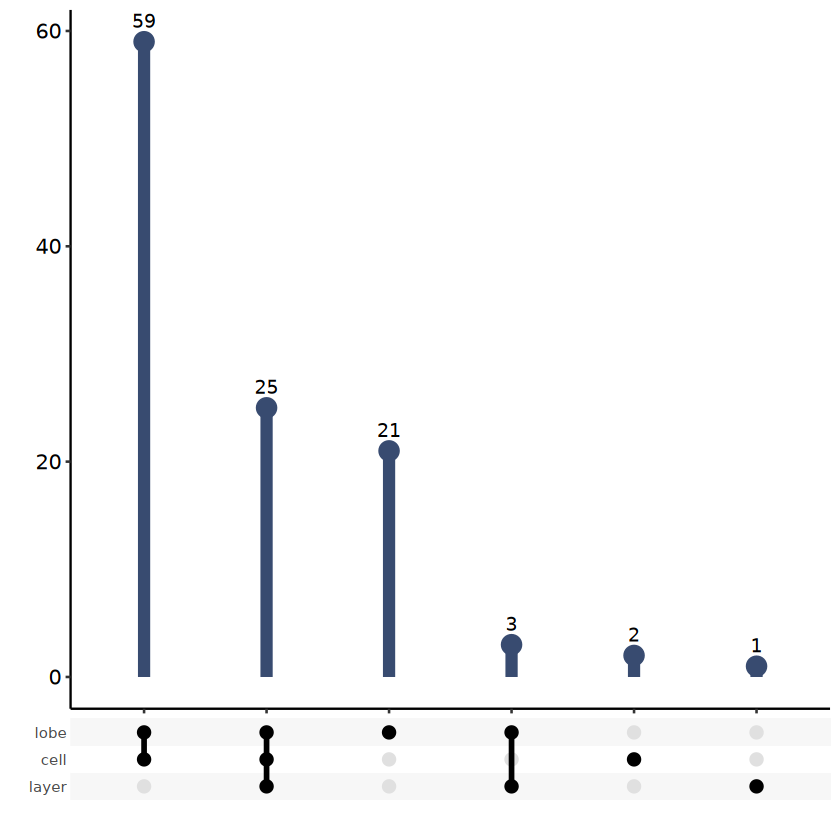

In [52]:
library(stringr)
isosigtrif = isosigtri[isosigtri$sig != "",]
#isosigtri.st = as.data.frame(table(isosigtri.st$sig))
dtustdf = NULL
for(i in 1:nrow(isosigtrif)){
    groupi =  unlist(str_split(isosigtrif$sig[i],"-"))
    dtustdfi = data.frame("group" = groupi,
                          "gene_id" = isosigtrif$gene_id[i])
    dtustdf = rbind(dtustdf,dtustdfi)
}

library(ggupset)
#dtustdfup = dtustdfup[,c("txid","type","group")]
#dtustdfup2 = dtustdfup[dtustdfup$group %in% c("Within GLU","Within GABA", "Within NN", "Among all"),] %>%
dtustdf = dtustdf %>%
  group_by(gene_id) %>%
  summarize(group = list(group))
pisonup1 = ggplot(data = dtustdf,aes(x = group))+ 
    scale_x_upset() + 
    geom_point(stat = "count",position = position_dodge(0.5),size = 5,color = "#384B70") + 
    geom_bar(position = position_dodge(0.5),width = 0.1,fill = "#384B70") +
    geom_text(stat = "count",aes(label=after_stat(count)),position = position_dodge(0.5),vjust = -1) + 
    xlab("") + ylab("") +
    #scale_fill_flatui() +
    #scale_color_flatui() +
    theme_pubr()
pisonup1
ggexport(pisonup1,filename = "result/figure5/lobedtu_layer_subclass_lobe_dtu_model_tern_stat_bar_24_11_09.pdf",width = 2,height = 4)
# ggplot(isosigtri.st,aes(x = Var1,y = Freq,fill = Var1,color = Var1)) + 
#     geom_point(shape = 21,size = 5) + 
#     geom_bar(stat = "identity",width = 0.1) +
#     geom_text(aes(label=Freq),vjust = -1) + 
#     scale_fill_flatui() +
#     scale_color_flatui() +
#     theme_pubr()


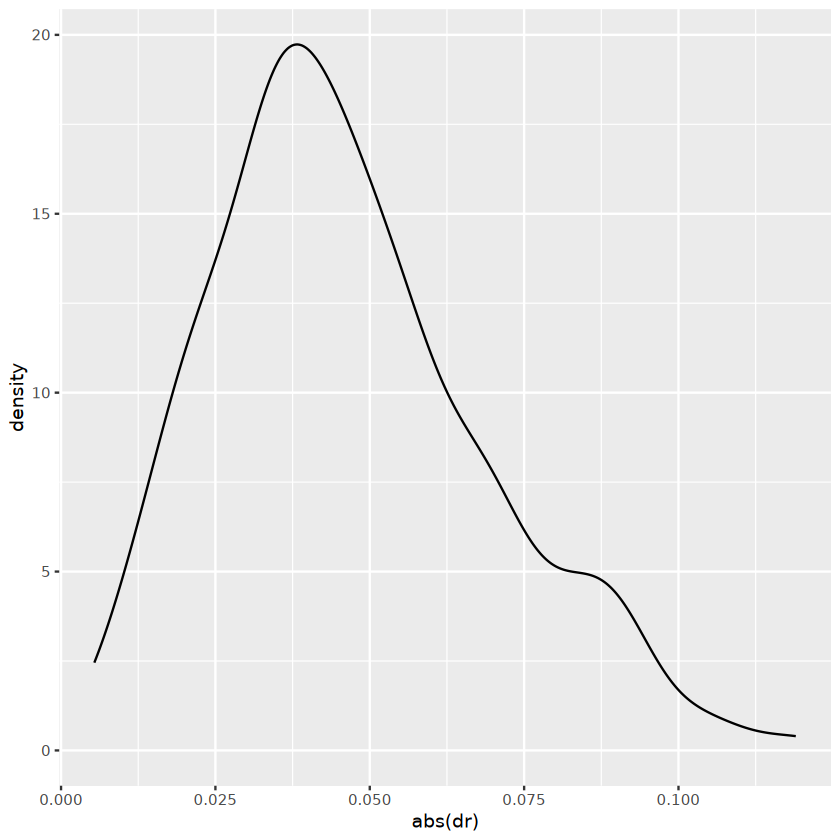

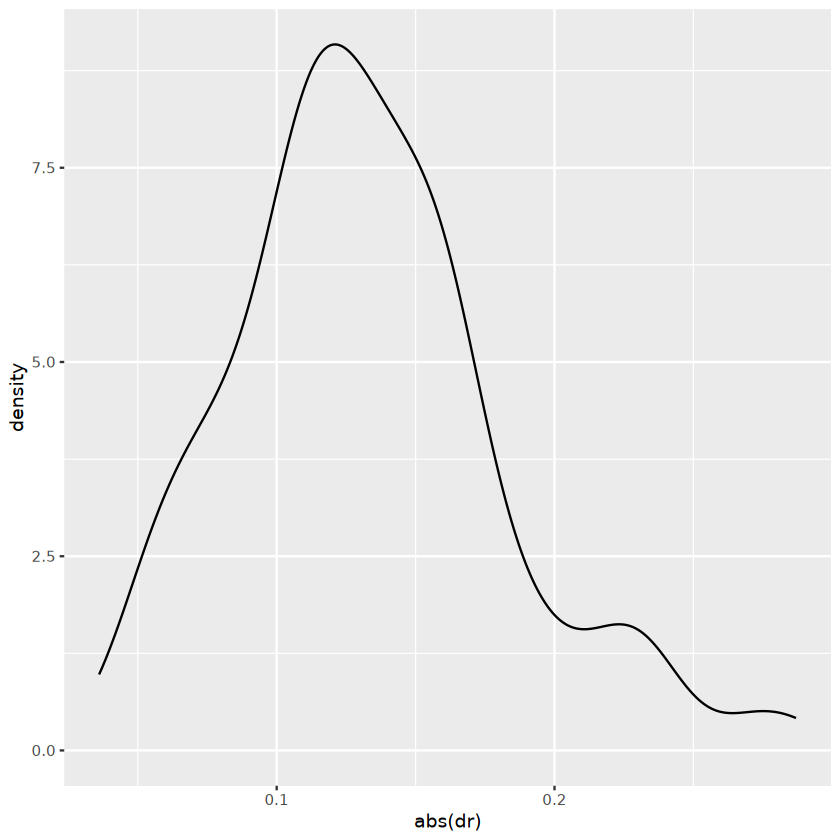

In [82]:
isosiglb = isosigls$lobe
isosiglb = isosiglb[isosiglb$gene_id %in% isosigtri[isosigtri$lobe < 0.05,]$gene_id,]
isosiglb = isosiglb %>% group_by(gene_id) %>% filter(dr == max(abs(dr)))
ggplot(isosiglb,aes(x = abs(dr))) + geom_density()

isosigcl = isosigls$subclass
isosigcl = isosigcl[isosigcl$gene_id %in% isosigtri[isosigtri$cell < 0.05,]$gene_id,]
isosigcl = isosigcl %>% group_by(gene_id) %>% filter(dr == max(abs(dr)))
ggplot(isosigcl,aes(x = abs(dr))) + geom_density()

In [105]:
#try GO analysis
library(gprofiler2)
MyGOPlot = function(hubgenei,ni,mytitle,mycolor = NULL){
    goi = gost(query = hubgenei,
               organism = "mfascicularis")
#godfi = CalOddRate(goi$result,5)
    godfi = goi$result
    godfi$gene_ratio = godfi$intersection_size/godfi$term_size
#godfi = godfi[godfi$p_value < 0.05,]
    godfi = godfi[godfi$intersection_size > 2,] %>% group_by(source) %>% arrange(gene_ratio) %>% 
    top_n(wt = gene_ratio,n = ni)
    godfi$term_name = factor(godfi$term_name,levels = unique(godfi$term_name))
    print(nrow(godfi))

    if(is.null(mycolor)){
        mycolor = pal_flatui("default")(length(unique(godfi$source)))
    }
    godfi = godfi[!godfi$term_name %in% c("cell junction","cytoplasm","cytosol","cytoskeleton"),]
    if(nrow(godfi) > 0){
        pgi = ggplot(godfi,
               aes(x = gene_ratio, y=term_name,fill = source)) + 
        geom_point(aes(size = intersection_size),shape = 21) +
        geom_bar(stat = "identity",width = 0.03) +
        geom_text(aes(label = term_name,x = 0),hjust = -0.01,vjust = -0.5) +
        scale_fill_manual(values = mycolor) +
 #       scale_fill_viridis(direction = 1,option = "A") +
        #scale_fill_distiller(direction = 1,palette = "Greens") +
    # scale_y_discrete(labels = rev(unique(godftf$term_name))) +
    #facet_grid(source~.,scales = "free",space = "free") + 
        xlab("gene counts") +
        theme_pubr() + theme(legend.position = "top",axis.text.y = element_blank()) +
        ggtitle(mytitle)
    }
    return(pgi)
    
}

MyGOCal = function(hubgenei,ni){
    goi = gost(query = hubgenei,
               organism = "mfascicularis")
#godfi = CalOddRate(goi$result,5)
    godfi = goi$result
    godfi$gene_ratio = godfi$intersection_size/godfi$term_size
#godfi = godfi[godfi$p_value < 0.05,]
    godfi = godfi[godfi$intersection_size > 2,] %>% arrange(gene_ratio) %>% 
    top_n(wt = gene_ratio,n = ni)
    godfi$term_name = factor(godfi$term_name,levels = unique(godfi$term_name))
    print(nrow(godfi))

    godfi = godfi[!godfi$term_name %in% c("cell junction","cytoplasm","cytosol","cytoskeleton"),]

    return(godfi)
    
}


#ggexport(pgi,filename = "result/figure3/sigiso_class_transcript_dr_cluster_heatmap_NN_GO_24_04_21.pdf",width = 4,height = 8)


In [108]:
isosigtri[isosigtri$sig == "lobe",]$gene_id # SRSF5
isosigtri[isosigtri$sig == "layer",]$gene_id # SRSF5
isosigtri[isosigtri$sig == "cell",]$gene_id # SRSF5
isosigtri[isosigtri$sig == "cell-layer",]$gene_id
isosigtri[isosigtri$sig == "cell-lobe",]$gene_id
isosigtri[isosigtri$sig == "cell-layer-lobe",]$gene_id
isosigtri[isosigtri$sig == "layer-lobe",]$gene_id

[1] "AKAP9"   "APOD"    "BRD4"    "CAPRIN1" "CCK"     "CEND1"   "CIRBP"  
 [8] "DCXR"    "FAM213A" "GUK1"    "KALRN"   "MORF4L1" "PCMT1"   "PDRG1"  
[15] "PSIP1"   "RAB18"   "TM2D3"   "TMEM205" "TMEM59"  "UBE2K"   "UCHL1"

[1] "BRI3"        "C19H19orf70" "CCNI"        "MEF2C"       "MRPL27"     
 [6] "NRCAM"       "PARK7"       "PCDH7"       "PSMD4"       "SYT1"       
[11] "YWHAZ"       "ZNF428"

[1] "ACOT7"        "AK1"          "ARF5"         "ARGLU1"       "ARL6IP4"     
  [6] "ARPP21"       "ATP5G1"       "ATP5J"        "ATP6V0B"      "BNIP3L"      
 [11] "BUD31"        "CAMK2B"       "CAMLG"        "CAMTA1"       "CAPZB"       
 [16] "CCDC136"      "CD59"         "CDC37"        "CDC42"        "CFL1"        
 [21] "CLTC"         "CMC2"         "CNTNAP2"      "CRIP2"        "DCTN1"       
 [26] "DPCD"         "DYNLL1"       "EEF1B2"       "EIF2S2"       "ENSA"        
 [31] "EVL"          "FBXO9"        "FEZ1"         "FKBP1B"       "FKBP2"       
 [36] "FNDC4"        "FUOM"         "GNAO1"        "GOT1"         "GPM6B"       
 [41] "GPX4"         "GTF3A"        "HAGH"         "HCFC1R1"      "HDDC2"       
 [46] "HK1"          "HNRNPA3"      "HNRNPDL"      "HNRNPK"       "IDH3B"       
 [51] "IGSF8"        "KLC1"         "KRTCAP2"      "LOC101866646" "LOC102114836"
 [56] "LOC102118724" "LOC102122855" "LOC102133057" "LOC102141554" "LOC107126439"
 [61] "LOC107126444" "LOC107129555" "LOC107131073" "MAP1LC3B"     "MAP6"        
 [66] "MEA1"         "MOBP"         "MORF4L2"      "MRPS15"       "MRPS18B"     
 [71] "MRPS24"       "MYL6"         "MZT2B"        "NDUFB9"       "NDUFS4"      
 [76] "NOL7"         "NPDC1"        "NTRK2"        "OSBPL1A"      "PDZD11"      
 [81] "PFDN1"        "PIN1"         "PNISR"        "POLDIP2"      "POLR2E"      
 [86] "POP5"         "PPP1R12A"     "PSMD8"        "PTN"          "RAB3C"       
 [91] "RAD23A"       "RANBP1"       "RPL19"        "RPL38"        "RPP21"       
 [96] "RPS27"        "RWDD1"        "SEPT11"       "SLC25A3"      "SNF8"        
[101] "SNX3"         "SPTAN1"       "SRPK2"        "SRSF5"        "SSBP1"       
[106] "STMN4"        "STRBP"        "SUMO1"        "TCEB1"        "TMEM219"     
[111] "TRAPPC1"      "TTYH1"        "TUBB2B"       "TXNL4A"       "VDAC2"       
[116] "YWHAE"        "YWHAH"

[1] "CUTA"         "DBNDD2"       "EPHB6"        "HMOX2"        "LOC101925321"
 [6] "LOC102130589" "NGFRAP1"      "PPP1R7"       "SIK3"         "TUSC3"

[1] "ADGRB3"          "ADNP"            "ANKS1B"          "AP1S2"          
 [5] "ATP6V1C1"        "AURKAIP1"        "BambuGene103646" "BCLAF1"         
 [9] "C11H12orf10"     "CABP1"           "CADM2"           "CAPNS1"         
[13] "CCNH"            "CLTA"            "COPS5"           "CYHR1"          
[17] "EMC7"            "ENHO"            "FAM58A"          "GCC2"           
[21] "GRIA3"           "HERC1"           "HNRNPA2B1"       "KCNA6"          
[25] "KCNIP4"          "LAMP2"           "LOC102140594"    "MTX2"           
[29] "NKIRAS1"         "NUDC"            "OCIAD1"          "PKM"            
[33] "POLR3H"          "PPM1B"           "PPP3R1"          "PSMA4"          
[37] "PSMD12"          "PTPMT1"          "RAB31"           "RBFOX3"         
[41] "RPS10"           "RPSA"            "RUNDC3A"         "SMIM19"         
[45] "SNRPN"           "SRSF3"           "SRSF7"           "TAF10"          
[49] "TCEA2"           "TENM2"           "THRA"            "TNIK"           
[53] "TPM1"            "TRIM9"           "TXN2"            "UBQLN1"         
[57] "USP9X"           "VTI1B"           "ZFAND2B"

[1] "ACTR2"        "APOE"         "ARPC2"        "ARPP19"       "BOLA3"       
 [6] "C19H19orf24"  "CA11"         "COPRS"        "DDRGK1"       "GAP43"       
[11] "GDAP1L1"      "HNRNPA1"      "HOPX"         "LOC101866282" "LOC102143921"
[16] "LOC102144989" "LOC107128490" "LY6H"         "NDUFS7"       "PPP1CC"      
[21] "RTN1"         "S100B"        "SLC44A1"      "TPM3"         "VDAC3"

[1] "CCDC88A" "NAP1L3"  "YPEL5"

[1] 21
[1] 11


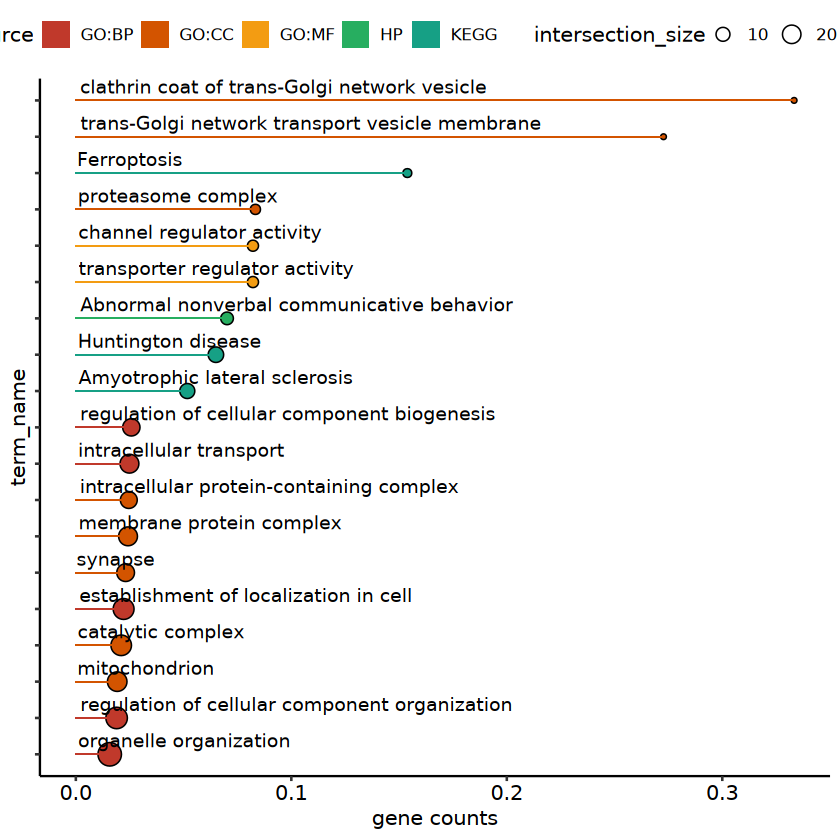

[1] 4


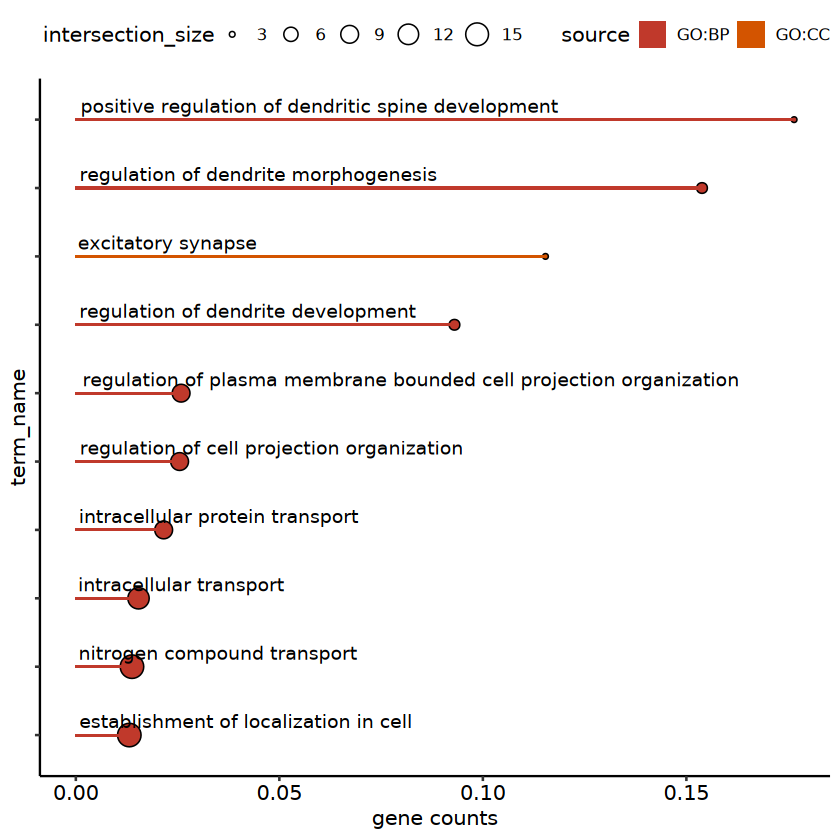

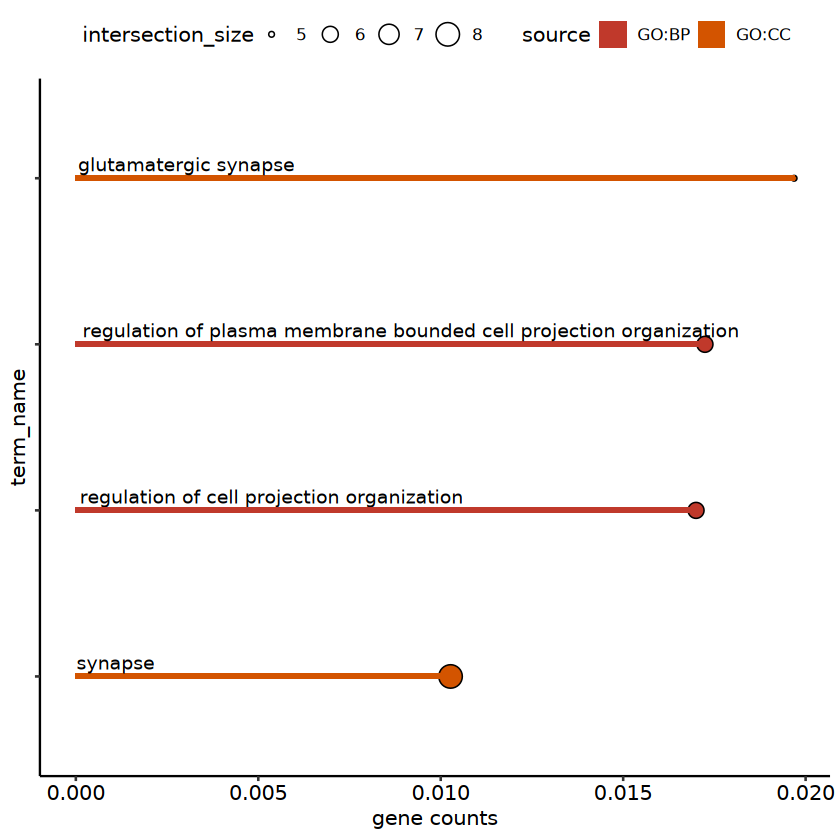

In [124]:
dtustdf2 = NULL
for(i in 1:nrow(isosigtrif)){
    groupi =  unlist(str_split(isosigtrif$sig[i],"-"))
    dtustdfi = data.frame("group" = groupi,
                          "gene_id" = isosigtrif$gene_id[i])
    dtustdf2 = rbind(dtustdf2,dtustdfi)
}


MyGOPlot(dtustdf2[dtustdf2$group == "cell",]$gene_id,10,NULL)
MyGOPlot(dtustdf2[dtustdf2$group == "lobe",]$gene_id,10,NULL)
MyGOPlot(dtustdf2[dtustdf2$group == "layer",]$gene_id,10,NULL)
#MyGOPlot(dtustdf$gene_id,10,NULL)
# MyGOPlot(isosigtri[isosigtri$lobe < 0.05 & isosigtri$cell < 0.05,]$gene_id,10,NULL)
# MyGOPlot(isosigtri[isosigtri$cell < 0.05,]$gene_id,10,NULL)

In [19]:
refgdf = read.csv(file = "ref/disease_gene/Total_gene_list_summary_24_10_30.csv")

isosigi = dtustdf2
#isosigi = isosigtri[isosigtri$sig != "",]
colnames(isosigi)[1] = "areatr"
areatrs = unique(isosigi$areatr)

FishEnrich = function(geneset,funcset,total_genen){
    drugovl = intersect(unique(funcset),geneset)
    geneset_size <- length(geneset)    # 感兴趣的基因集大小
    functional_category_size <- length(unique(funcset))  # 特定功能类别中的基因总数
    both <- length(drugovl)  # 两个集合都包含的基因数量
    total_genes <- 20000  # 整个基因组中的基因总数

    contingency_table <- matrix(c(both, geneset_size - both, 
                              functional_category_size - both, 
                              total_genes - (geneset_size + functional_category_size - both)), 
                            nrow = 2)

    # 进行Fisher精确检验
    fisher_test_result <- fisher.test(contingency_table)
    # 输出p值
    p_value <- fisher_test_result$p.value

    # 计算富集分数（Enrichment Ratio），这通常是感兴趣的基因集中具有特定功能的基因比例与整个基因组中该功能基因比例的比值
    enrichment_ratio <- (both / geneset_size) / (functional_category_size / total_genes)
    res = data.frame("p.value" = p_value,"enrichscore" = enrichment_ratio,"overlap_size" = both,
                     "term_size" = functional_category_size,"query_size" = geneset_size,
                    "overlap_ratio" = both/functional_category_size)
    return(res)
}

goana = NULL
sourceid = unique(refgdf$source)
for(i in 1:length(areatrs)){
    isosigii = isosigi[isosigi$areatr == areatrs[i],]
    hubgene = unique(isosigii$gene_id)
    for(j in 1:length(sourceid)){
        refgene = unique(refgdf[refgdf$source == sourceid[j],]$gene_id)
        goanai = FishEnrich(hubgene,refgene,20000)
        goanai$group = sourceid[j]
        goanai$areatr = areatrs[i]
        goana = rbind(goana,goanai)
    }
}
ph = ggplot(goana,aes(x = areatr,y = group, color = -log10(p.value),size = enrichscore)) + geom_point() + theme_bw() + 
theme(axis.text.x = element_text(angle = 90,vjust = 0.5)) +
scale_color_gradient2(low = "blue", mid = "white",high = "red",midpoint = 2) + coord_fixed()
ph

ERROR: Error in eval(expr, envir, enclos): object 'dtustdf2' not found


file saved to result/figure5/module_overlap_dtu_stat.pdf



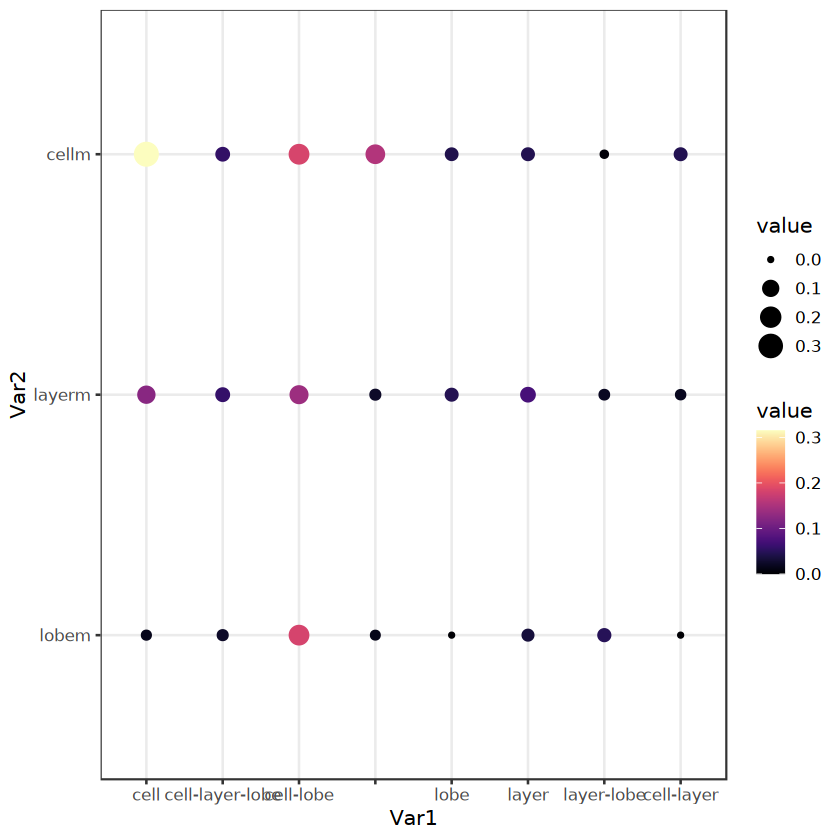

In [20]:
isosigi = modelmx1.hub
colnames(isosigi)[5] = "areatr"
refdtudf = NULL
refdtudfi = isosigls$lobe
refdtudfi = refdtudfi[refdtudfi$sig != "N",c("gene_id","areatr")];refdtudfi$areatr = "lobem";refdtudf = rbind(refdtudf,refdtudfi)
refdtudfi = isosigls$layer
refdtudfi = refdtudfi[refdtudfi$sig != "N",c("gene_id","areatr")];refdtudfi$areatr = "layerm";refdtudf = rbind(refdtudf,refdtudfi)
refdtudfi = isosigls$subclass
refdtudfi = refdtudfi[refdtudfi$sig != "N",c("gene_id","areatr")];refdtudfi$areatr = "cellm";refdtudf = rbind(refdtudf,refdtudfi)
refdtudf = refdtudf[refdtudf$gene_id %in% isosigi$gene_id,]
areatrs = unique(isosigi$areatr)
argenels = list()
for(i in 1:length(areatrs)){
    isosigi.ari = isosigi[isosigi$areatr == areatrs[i],]
    argenels[[i]] = unique(isosigi.ari$gene_id)
    names(argenels)[i] = areatrs[i]
}
refgenels = list()
areatrs2 = unique(refdtudf$areatr)
for(i in 1:length(areatrs2)){
    isosigi.ari = refdtudf[refdtudf$areatr == areatrs2[i],]
    refgenels[[i]] = unique(isosigi.ari$gene_id)
    names(refgenels)[i] = areatrs2[i]
}

MyJaccard = function(genels1,genels2){
    calculate_jaccard <- function(list1, list2) {
      intersection <- length(intersect(list1, list2))
      union <- length(union(list1, list2))
      jaccard_score <- intersection / union
      return(jaccard_score)
    }
    num_groups1 = length(genels1)
    num_groups2 = length(genels2)
    jaccard_matrix <- matrix(0, nrow = num_groups1, ncol = num_groups2)
    
    for (i in 1:num_groups1) {
      for (j in 1:num_groups2) {
        jaccard_matrix[i, j] <- calculate_jaccard(genels1[[i]], genels2[[j]])
      }
    }
    rownames(jaccard_matrix) <- names(genels1)
    colnames(jaccard_matrix) <- names(genels2)
    return(jaccard_matrix)
}
jcmx = MyJaccard(argenels,refgenels)
jcmxdf = melt(jcmx)
ph = ggplot(jcmxdf,aes(x = Var1,y = Var2)) + geom_point(aes(size = value,color = value)) + 
scale_color_viridis(option = "A") + theme_bw()
ph 
ggexport(ph,filename = "result/figure5/module_overlap_dtu_stat.pdf")

#### Case Plot

In [88]:
isosigtri = qread(file = "result/figure4/module_analysis_res_df_24_12_29.qs")

In [58]:
casels = c("SRSF5","C11H12orf10","NTRK2","DBNDD2","DDRGK1","CAPRIN1","SPTAN1","ARPP19","IDH3B")

In [103]:
pref = qread("../ref/area_figure_an.qs")
edgesdf = pref$areaedges
edgesdf[edgesdf$areaid == "1/2",]$areaid = "1|2"
edgesdf = edgesdf[edgesdf$areaid %in% unique(fsraw.cor$region),]
edgesdf = merge(edgesdf,areaan,by.x = "areaid",by.y = "area")
unique(edgesdf$areaid)
head(edgesdf)

[1] "1|2"  "23a"  "23b"  "23c"  "29"   "30"   "31"   "7op"  "AI"   "CL"  
[11] "CM"   "CPB"  "FST"  "LIPd" "LIPv" "PE"   "PEa"  "PG"   "PGa"  "TEO" 
[21] "TEpd" "TEpv" "TFO"  "TPO"  "V2"   "v23b" "V3v"  "V4"   "V4t"  "VIP"

,areaid,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,lobe
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1|2,14137,8201,13719,27125,13805,27151,13748.72,27181.92,13821.84,26940.06,0,0,somatosensory
2,1|2,6544,36469,13921,27127,14028,27183,13984.86,27135.20,14070.35,26971.87,0,0,somatosensory
3,1|2,23042,28818,14240,27193,14298,27255,14311.90,27183.87,14657.62,26860.46,0,0,somatosensory
4,1|2,7559,14391,13318,27000,13548,27076,13463.00,26947.21,13962.13,25436.69,0,0,somatosensory
5,1|2,11606,7559,13277,27001,13318,27000,13298.28,27032.41,13281.32,26337.29,0,0,somatosensory
6,1|2,37516,11606,13227,27004,13277,27001,13253.47,27026.95,13226.19,26572.31,0,0,somatosensory


In [89]:
no_of_colors = length(unique(cellan$subclass)) 
subclass_color = distinctColorPalette(no_of_colors) 
names(subclass_color) = unique(cellan$subclass)
subclass_color

L2      L2/3    L2/3/4      L3/4    L3/4/5        L4      L4/5    L4/5/6 
"#929A6B" "#DBA558" "#85CED8" "#DCDF4A" "#D745E0" "#6962DA" "#68E2CB" "#7638DE" 
     L5/6        L6     LAMP5      RELN  VIP_RELN       VIP    PV_CHC     PVALB 
"#DAA1D8" "#E4749D" "#E0E3DC" "#C1E8C0" "#7ADF8E" "#CA78DF" "#E0A8A1" "#90E652" 
      SST       ASC       OPC       OLG        MG        EC      VLMC 
"#DF48AA" "#67A9D5" "#7388D5" "#DEE498" "#814B59" "#C8C0DB" "#DE5B50"

In [24]:
# caseg = c("SRSF5")
# hubtrans = c('SRSF5-WeiLab-1','XM_005561612.2')
#unique(transtf[transtf$sig == "Y" & transtf$subclass == celli,c("gene_id","lobe")])
#caseg = c("LOC101866646","DBNDD2","RNASE1","RAB28")
caseg = c("GPM6B")
isosigi = isosigls$lobe
ModuleCasePlot = function(isosigi,caseg,fsraw.cor,id,areaorder,chunkorder,thred = 5){
    isosigi = isosigi[isosigi$gene_id %in% caseg,]
    hubtrans = unique(isosigi$transcript_id)[id]
#hubtrans = "XM_005582051.2"
    fsraw.cor.hub = fsraw.cor[fsraw.cor$gene_id %in% caseg & fsraw.cor$subclass != "",]

    casect = fsraw.cor.hub %>% group_by(group,areatr,chunk,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(group,areatr,chunk,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)
#casect = casect %>% group_by(subclass,gene_id) %>% filter(median(genecount) > 10)
    casect = casect[casect$transcript_id %in% hubtrans,]
    casect$areatr = factor(casect$areatr,levels = areaorder)
    #countn = 5
    casectf = casect[casect$count > thred,]
    casectf$chunk = factor(casectf$chunk, levels = chunkorder)
    casectf = casectf %>% group_by(chunk,gene_id) %>% filter(length(unique(areatr)) > 3)
    pbox1 = ggplot(casectf,aes(x = areatr,y = rate,fill = group)) +
      geom_point(aes(color = group,group = chunk),size= 0.3,color = "black") +
      geom_violin(alpha = 0.7) +
      #geom_line(aes(color = subclass,group = subclass),size=0.5,color = "grey") +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      # geom_point(size=1,show.legend = TRUE) +
      # geom_line(size=0.5,show.legend = TRUE) +
      #facet_grid(subclass~.,space = "free",scales = "free") +
      scale_y_continuous(limits = c(0,1)) +
      #geom_jitter(shape=21,size=1,width=0.05) +
      stat_compare_means(data = casectf,label = "p.signif", method = "t.test",hide.ns = T,ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90,hjust = 1),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_discreterainbow() + ylab("Isoform ratio") + xlab("") +
      ggtitle(paste0(caseg,"-",hubtrans))
    pbox1
    return(pbox1)
}

# ModuleCasePlot(isosigi,"CAPRIN1",fsraw.cor,2,lobeorder)
# ModuleCasePlot(isosigi,"RTN1",fsraw.cor,1,lobeorder)
# ModuleCasePlot(isosigi,"DDRGK1",fsraw.cor,1,lobeorder)
# ModuleCasePlot(isosigi,"NTRK2",fsraw.cor,2,lobeorder)
# pbox1 = ggplot(casectf,aes(x = lobe,y = rate,color = subclass,group = subclass)) +
#       geom_point(size=1,show.legend = TRUE) +
#       geom_line(size=0.5,show.legend = TRUE) +
#       scale_y_continuous(limits = c(0,1)) +
#       theme_bw()+
#       theme(panel.grid = element_blank(),
#         panel.border = element_rect(size = 1),
#         axis.text.x = element_text(color = "black", size = 13,angle = 90),
#         axis.text.y = element_text(color = "black",size = 13),
#         axis.ticks = element_line(color="black",linewidth = 1)) +
#       scale_color_manual(values = subclass_color,drop = FALSE) + 
#     ylab("Isoform ratio") + xlab("") +
#      ggtitle(paste0(caseg,"-",hubtrans))
# pbox1

`summarise()` has grouped output by 'group', 'areatr', 'chunk', 'gene_id'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'group', 'areatr', 'chunk', 'gene_id'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'group', 'areatr', 'chunk', 'gene_id'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'group', 'areatr', 'chunk', 'gene_id'. You
can override using the `.groups` argument.


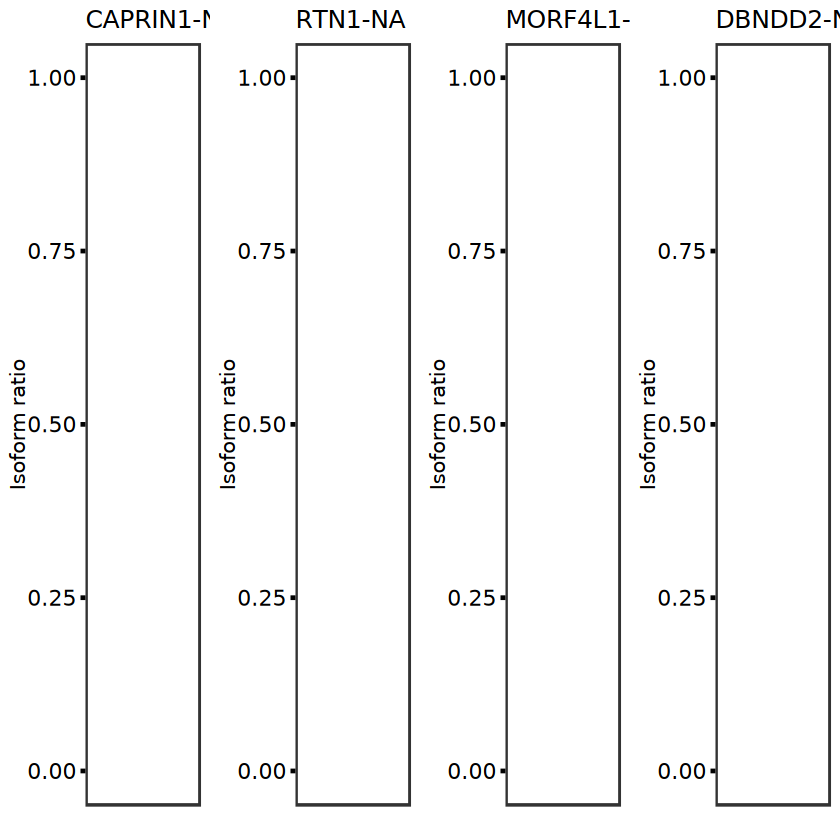

In [326]:
fsraw.cor$areatr = fsraw.cor$lobe
fsraw.cor$chunk = fsraw.cor$subclass
pc1.1 = ModuleCasePlot(isosigi,"CAPRIN1",fsraw.cor,2,lobeorder,suborder)
pc1.2 = ModuleCasePlot(isosigi,"RTN1",fsraw.cor,1,lobeorder,suborder)
pc1.3 = ModuleCasePlot(isosigi,"MORF4L1",fsraw.cor,2,lobeorder,suborder)
#ModuleCasePlot(isosigi,"PSMD12",fsraw.cor,2,lobeorder)
pc1.4 = ModuleCasePlot(isosigi,"DBNDD2",fsraw.cor,2,lobeorder,suborder)
pboxt = ggarrange(pc1.1,pc1.2,pc1.3,pc1.4,nrow = 1)
pboxt
#ggexport(pboxt,filename = "result/figure5/Model_case_boxplot_total_24_12_02.pdf",width = 12,height = 4)

`summarise()` has grouped output by 'lobe', 'region'. You can override using
the `.groups` argument.


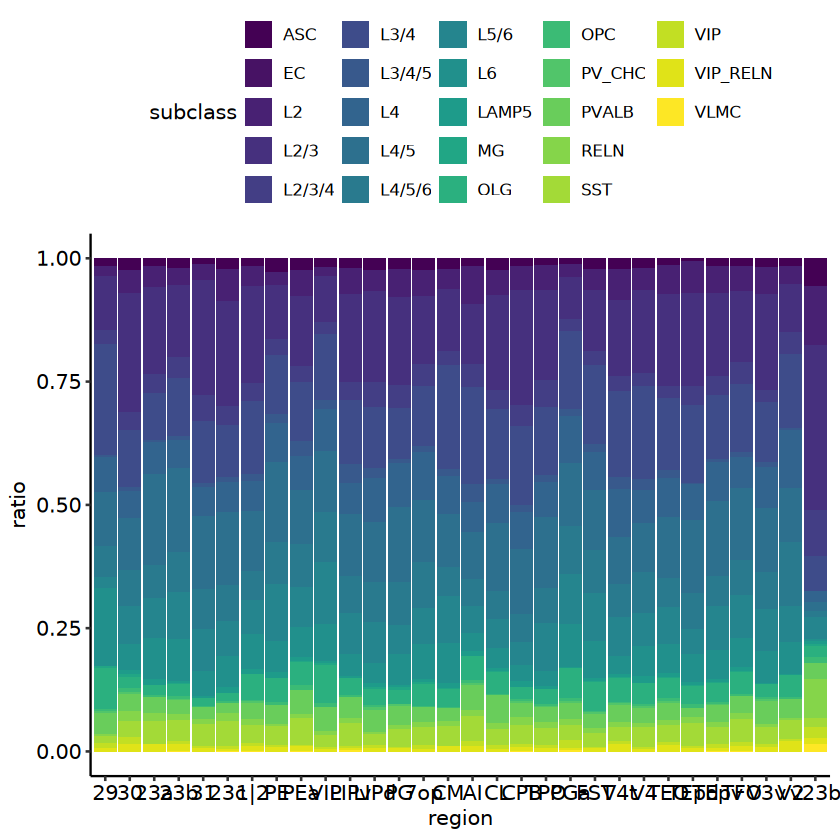

In [332]:
geneex = "RTN1"
fsraw.case = fsraw.cor[fsraw.cor$gene_id == geneex,]
clpos = fsraw.case %>% group_by(lobe,region,subclass) %>% summarise(count = length(unique(readid)))
clpos = clpos[clpos$subclass != "",]
clpos = clpos %>% group_by(lobe,region) %>% mutate(tcount = sum(count),ratio = count/tcount)
clpos$region = factor(clpos$region,levels = regionorder)
clpos$lobe = factor(clpos$lobe,levels = lobeorder)
ggplot(clpos,aes(x = region,y = ratio,fill = subclass)) + geom_bar(stat = "identity",position = "stack") + 
scale_fill_viridis(discrete = T) + theme_pubr()

`summarise()` has grouped output by 'group', 'areatr', 'chunk', 'gene_id'. You
can override using the `.groups` argument.
Warning message:
"The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead."
file saved to result/figure4/Lobe_case_spatial_DBNDD2_boxplot_24_12_21.pdf

`summarise()` has grouped output by 'group', 'areatr', 'chunk', 'gene_id'. You
can override using the `.groups` argument.
Warning message:
"Groups with fewer than two datapoints have been dropped.
ℹ Set `drop = FALSE` to consider such groups for position adjustment purposes."
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"


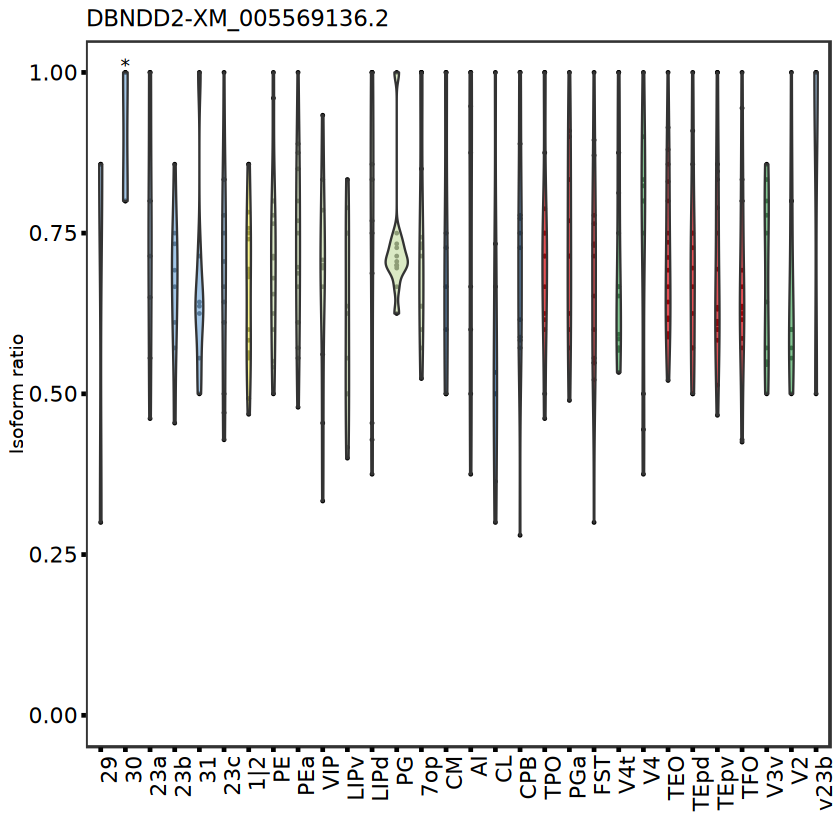

Warning message:
"Groups with fewer than two datapoints have been dropped.
ℹ Set `drop = FALSE` to consider such groups for position adjustment purposes."
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
file saved to result/figure4/Lobe_case_spatial_DBNDD2_boxplot2_24_12_21.pdf



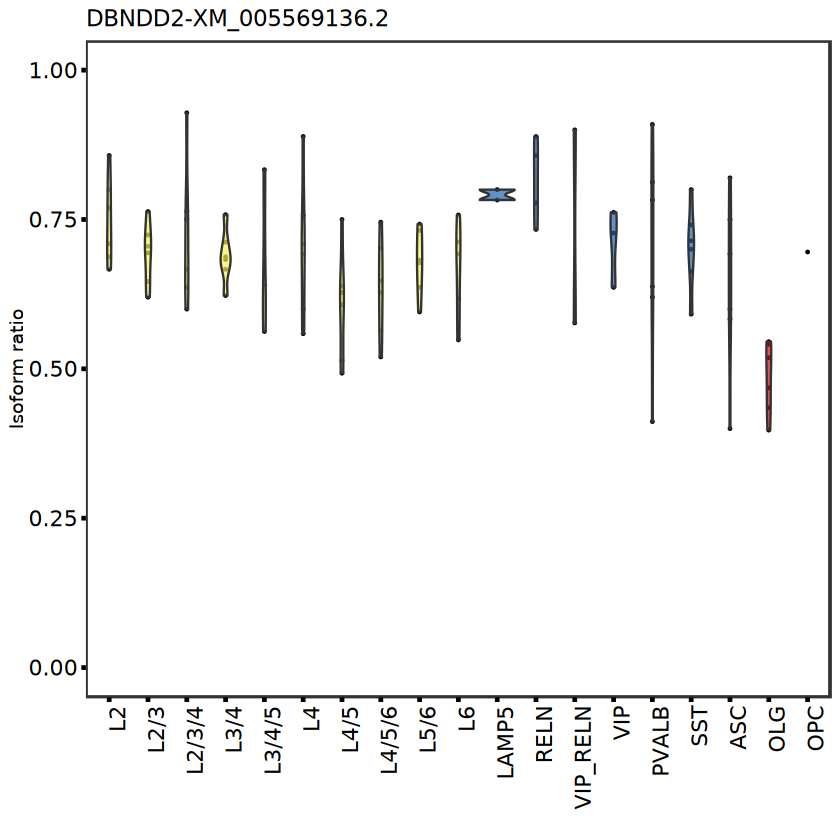

In [25]:
fsraw.cor$areatr = fsraw.cor$region
fsraw.cor$chunk = fsraw.cor$subclass
fsraw.cor$group = fsraw.cor$lobe
isosigi = isosigls$region
#pc1.1 = ModuleCasePlot(isosigi,"CAPRIN1",fsraw.cor,2,lobeorder)
pc1.1 = ModuleCasePlot(isosigi,"DBNDD2",fsraw.cor,2,regionorder,suborder,2)
pc1.1
ggexport(pc1.1,filename = "result/figure4/Lobe_case_spatial_DBNDD2_boxplot_24_12_21.pdf",width = 12,height = 3)

fsraw.cor$areatr = fsraw.cor$subclass
fsraw.cor$chunk = fsraw.cor$lobe
fsraw.cor$group = fsraw.cor$class
isosigi = isosigls$subclass
#pc1.1 = ModuleCasePlot(isosigi,"CAPRIN1",fsraw.cor,2,lobeorder)
pc1.1 = ModuleCasePlot(isosigi,"DBNDD2",fsraw.cor,2,suborder,regionorder)
pc1.1
ggexport(pc1.1,filename = "result/figure4/Lobe_case_spatial_DBNDD2_boxplot2_24_12_21.pdf",width = 12,height = 3)

`summarise()` has grouped output by 'group', 'areatr', 'chunk', 'gene_id'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'group', 'areatr', 'chunk', 'gene_id'. You
can override using the `.groups` argument.
Warning message:
"Groups with fewer than two datapoints have been dropped.
ℹ Set `drop = FALSE` to consider such groups for position adjustment purposes."
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"


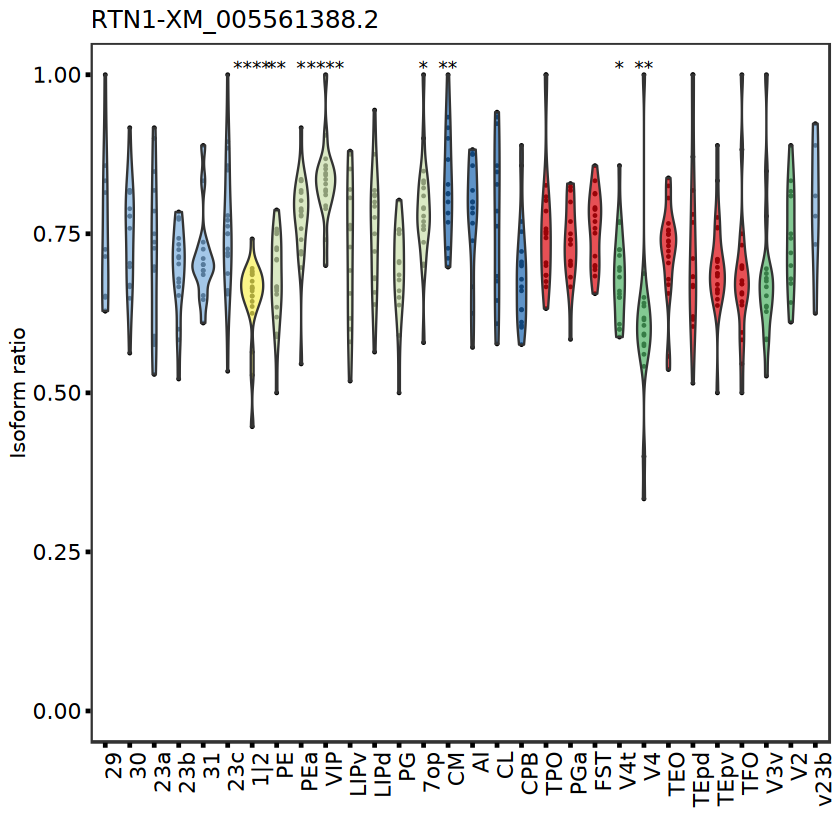

Warning message:
"Groups with fewer than two datapoints have been dropped.
ℹ Set `drop = FALSE` to consider such groups for position adjustment purposes."
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
file saved to result/figure4/Lobe_case_spatial_RTN1_boxplot_24_12_21.pdf



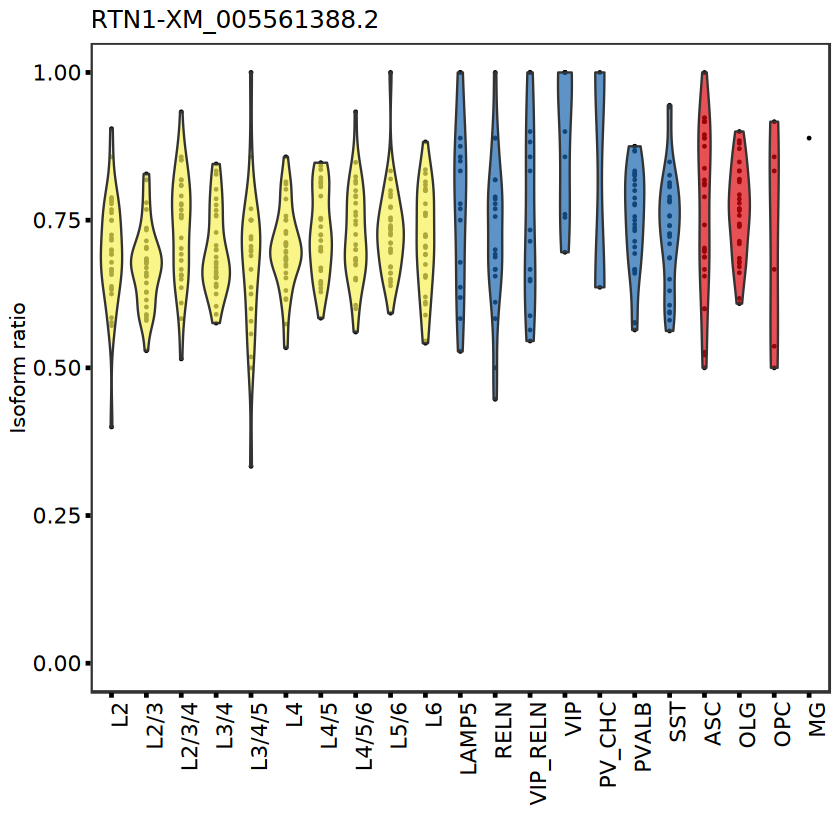

In [307]:
fsraw.cor$areatr = fsraw.cor$region
fsraw.cor$chunk = fsraw.cor$subclass
fsraw.cor$group = fsraw.cor$lobe
isosigi = isosigls$region
#pc1.1 = ModuleCasePlot(isosigi,"CAPRIN1",fsraw.cor,2,lobeorder)
pc1.1 = ModuleCasePlot(isosigi,"RTN1",fsraw.cor,1,regionorder,suborder)
pc1.1

fsraw.cor$areatr = fsraw.cor$subclass
fsraw.cor$chunk = fsraw.cor$region
fsraw.cor$group = fsraw.cor$class
pc1.2 = ModuleCasePlot(isosigi,"RTN1",fsraw.cor,1,suborder,regionorder)
pc1.2
ggexport(pc1.1+pc1.2,
         filename = "result/figure4/Lobe_case_spatial_RTN1_boxplot_24_12_21.pdf",width = 10,height = 3)
# fsraw.cor$areatr = fsraw.cor$region
# fsraw.cor$chunk = fsraw.cor$subclass
# pc1.1 = ModuleCasePlot(isosigi,"DBNDD2",fsraw.cor,2,regionorder,suborder,5)
# pc1.1
# fsraw.cor$areatr = fsraw.cor$subclass
# fsraw.cor$chunk = fsraw.cor$region
# pc1.2 = ModuleCasePlot(isosigi,"DBNDD2",fsraw.cor,2,suborder,regionorder,5)
# pc1.2

[1] "XM_005561388.2" "XM_005561389.2"

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 779 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 694 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 4 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 4 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 5 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 4 rows containing missing values or values outside the scale range
(`geom_

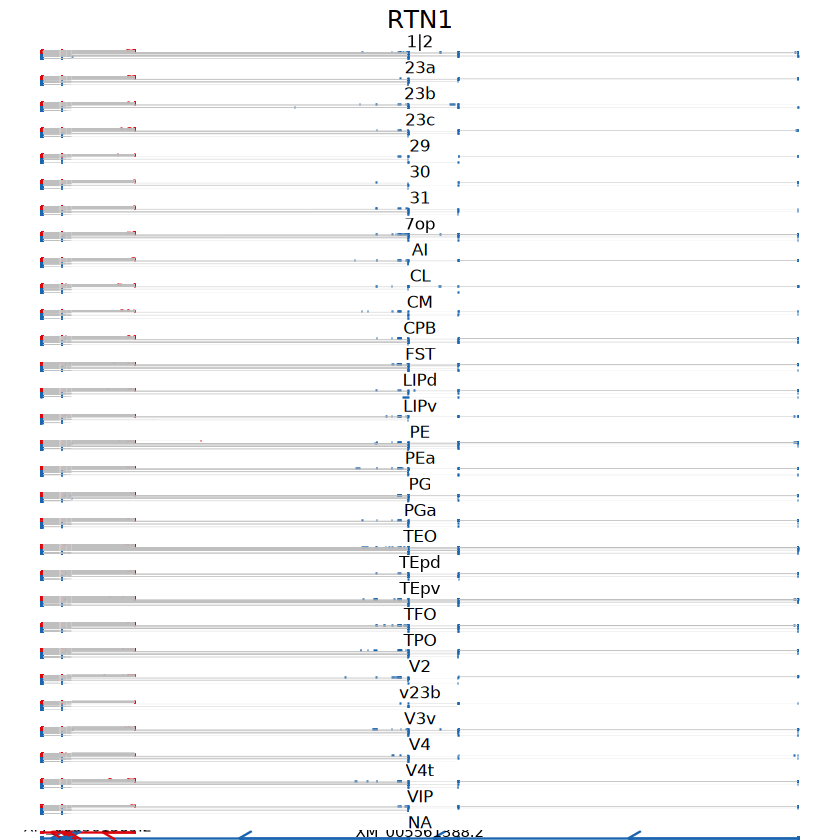

In [360]:
geneex = "RTN1"
isosigi = isosigls$region
unique(isosigi[isosigi$gene_id == geneex,]$transcript_id)
fsraw.cor$areatr = fsraw.cor$region
psp1 = IsoformReadPlotTotal(fsraw.cor,isosigi,longbed,gtf,geneex,NULL,TRUE,mycolor = c('#1965B0','#DC050C'))
psp1
fileid = paste0("result/figure4/",geneex,"_region_case_readsplice_fullscope_24_10_23.pdf")
ggexport(psp1,filename = fileid,width = 4,height = 15)

In [90]:
genehub = isosigtri[isosigtri$sig == "cell",]$gene_id
isosigi = isosigls$region
isosigi.hub = isosigi[isosigi$gene_id %in% genehub & isosigi$sig != "N",]
isosigi.hub
#isosigi.hub
isosigi = isosigls$region
isosigi.hub = isosigi[isosigi$gene_id %in% "DBNDD2"  & isosigi$sig != "N",]
isosigi.hub
#ggplot(isosigi.hub,aes(x = areatr))

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
40261,CCDC136,XM_015448009.1,31,23,178,0.1292135,0.2354791,0.2391435,-0.1099300,Down,5.946148e-11,1.368287e-09
40284,CCDC136,XM_015448009.1,v23b,31,89,0.3483146,0.2354791,0.2315882,0.1167264,Up,5.946148e-11,1.368287e-09
40321,CCDC136,XM_015448015.1,31,103,178,0.5786517,0.4785219,0.4750691,0.1035826,Up,5.946148e-11,1.368287e-09
40344,CCDC136,XM_015448015.1,v23b,30,89,0.3370787,0.4785219,0.4833992,-0.1463206,Down,5.946148e-11,1.368287e-09
59964,DBNDD2,XM_005569136.2,23b,234,298,0.7852349,0.6679821,0.6639389,0.1212960,Up,5.418703e-06,4.166866e-05
61560,DDX17,XM_005567295.2,23a,182,189,0.9629630,0.8621768,0.8587014,0.1042615,Up,3.579147e-09,5.804690e-08
71961,EEF1B2,EEF1B2-WeiLab-1,LIPv,157,342,0.4590643,0.3490588,0.3452655,0.1137988,Up,6.257658e-11,1.429183e-09
71991,EEF1B2,NM_001284704.1,LIPv,185,342,0.5409357,0.6509412,0.6547345,-0.1137988,Down,6.257658e-11,1.429183e-09
100688,HERC1,XM_005559745.2,1|2,107,884,0.1210407,0.2272382,0.2309002,-0.1098595,Down,8.271031e-20,5.864738e-18


,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
59964,DBNDD2,XM_005569136.2,23b,234,298,0.7852349,0.6679821,0.6639389,0.121296,Up,5.418703e-06,4.166866e-05


In [376]:
geneex = "EEF1B2"
 #NRCAM
isosigi = isosigls$region
unique(isosigi[isosigi$gene_id == geneex,]$transcript_id)
fsraw.cor$areatr = fsraw.cor$lobe
psp1 = IsoformReadPlotTotal(fsraw.cor,isosigi,longbed,gtf,geneex,NULL,TRUE,mycolor = c('#1965B0','#DC050C'))
psp1
fileid = paste0("result/figure4/",geneex,"_region_case_readsplice_fullscope_24_10_23.pdf")
ggexport(psp1,filename = fileid,width = 4,height = 5)

[1] "EEF1B2-WeiLab-1" "NM_001284704.1"

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 5517 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 5431 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 7 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 14 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 23 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 11 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 28 rows containing missing values or values outside the scale range


ERROR: Error in file(con, "rb"): cannot open the connection


plot without title

In [20]:
SpCasePlot = function(mkdf,hubtrans,edgesdf,ptsize = 1){
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
    mkdf = mkdf[order(mkdf$transcript_id),]
    pmkpti1 = ggplot() +
      scattermore::geom_scattermore(
        data = backpt,
        aes(x,y),
        color = "white",
        # pixels = raster.dpi,
        pointsize = 0.05
      ) +
      geom_segment(data = edgesdf, aes(x = x1, y = y1, xend = x2, yend = y2,color = areatr),
                 size = 0.5,alpha = 0.75) + 
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),shape = 21,size = ptsize,stroke = 0) + 
     # scale_size(range = c(0.05,0.1)) +
      #facet_wrap(~layer,nrow = 2) 
      theme_void() +
      scale_fill_discreterainbow() +
      scale_color_viridis(discrete = T) +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = guide_legend(override.aes = list(size=4),nrow = 3),
            fill = guide_legend(override.aes = list(size=4),nrow = 2),
            size = "none") +
      scale_y_reverse() + scale_x_reverse()
    return(pmkpti1)
}

SpCasePlotZoom = function(mkdf,hubtrans,zoomid,fsraw.cor,ptsize = 1){
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
    mkdf = mkdf[order(mkdf$transcript_id),]
    mkdf = mkdf[mkdf$region %in% zoomid,]
    fsraw.zoom = fsraw.cor[fsraw.cor$region %in% zoomid,]
    backpt.zoom = backpt[backpt$x < max(fsraw.zoom$x) & backpt$x > min(fsraw.zoom$x) &
                         backpt$y < max(fsraw.zoom$y) & backpt$y > min(fsraw.zoom$y),]
    pmkpti1 = ggplot() +
      scattermore::geom_scattermore(
        data = backpt.zoom,
        aes(x,y),
        color = "white",
        # pixels = raster.dpi,
        pointsize = 0.05
      ) +
      # geom_segment(data = edgesdf, aes(x = x1, y = y1, xend = x2, yend = y2,color = areatr),
      #            size = 0.5,alpha = 0.75) + 
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),shape = 21,size = ptsize,stroke = NA) + 
     # scale_size(range = c(0.05,0.1)) +
      #facet_wrap(~layer,nrow = 2) 
      theme_void() +
      scale_fill_discreterainbow() +
      scale_color_flatui() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = guide_legend(override.aes = list(size=4),nrow = 3),
            fill = guide_legend(override.aes = list(size=4),nrow = 2),
            size = "none") +
      scale_y_reverse() + scale_x_reverse() + ggtitle(zoomid)
    return(pmkpti1)
}

In [21]:
head(backpt)

cell_id,gene_id,transcript_id,class,subclass,x,y,readnum
<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>
1,ANAPC11,XM_005585268.2,GLU,L6,8433,77822,1
1,AP2M1,XM_005546525.2,GLU,L6,48984,77801,1
1,ATF7,XM_005571037.2,GLU,L6,8416,77824,1
1,ATP5D,XM_005587367.1,GLU,L6,8424,77813,1
1,ATP5J,XM_015446616.1,GLU,L6,51202,77805,1
1,ATP5J,XM_015446617.1,GLU,L6,11587,77807,1


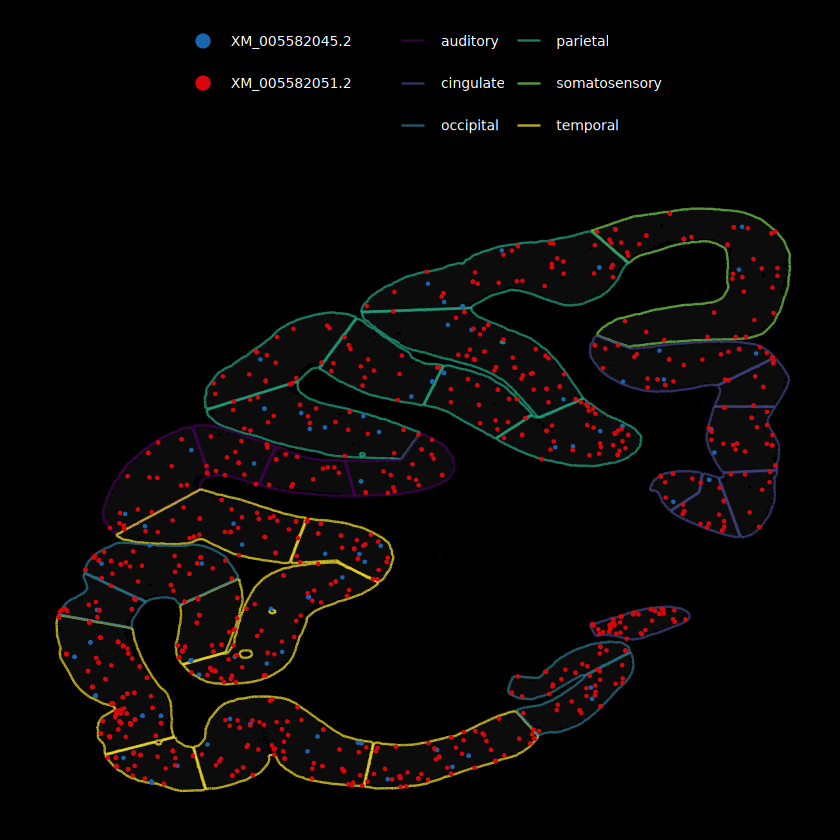

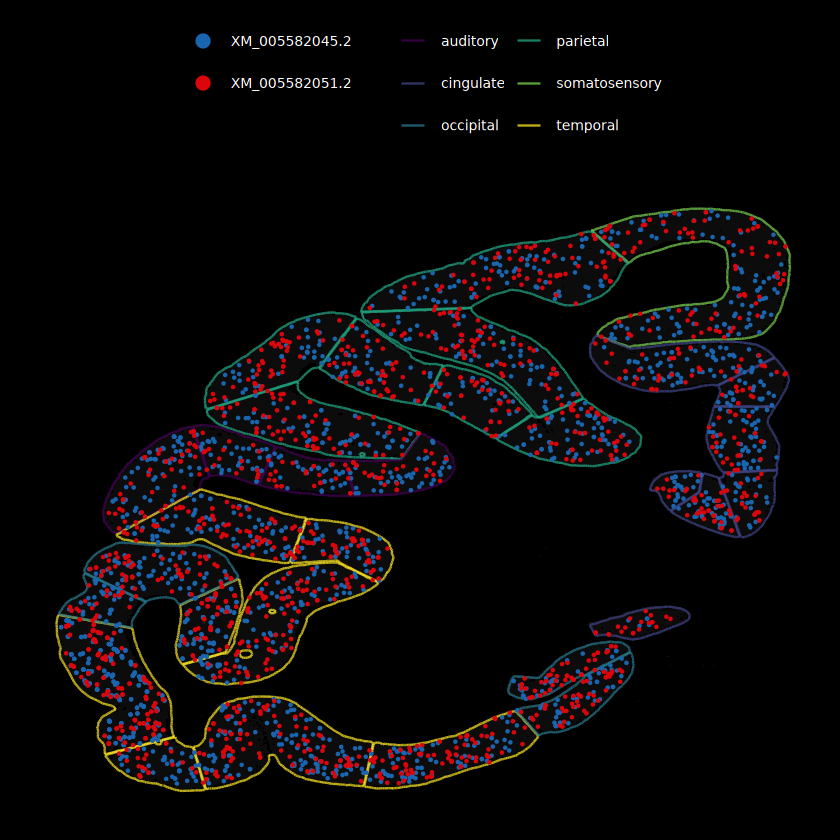

file saved to result/figure5/Lobe_case_spatial_NTRK2_24_12_23.pdf



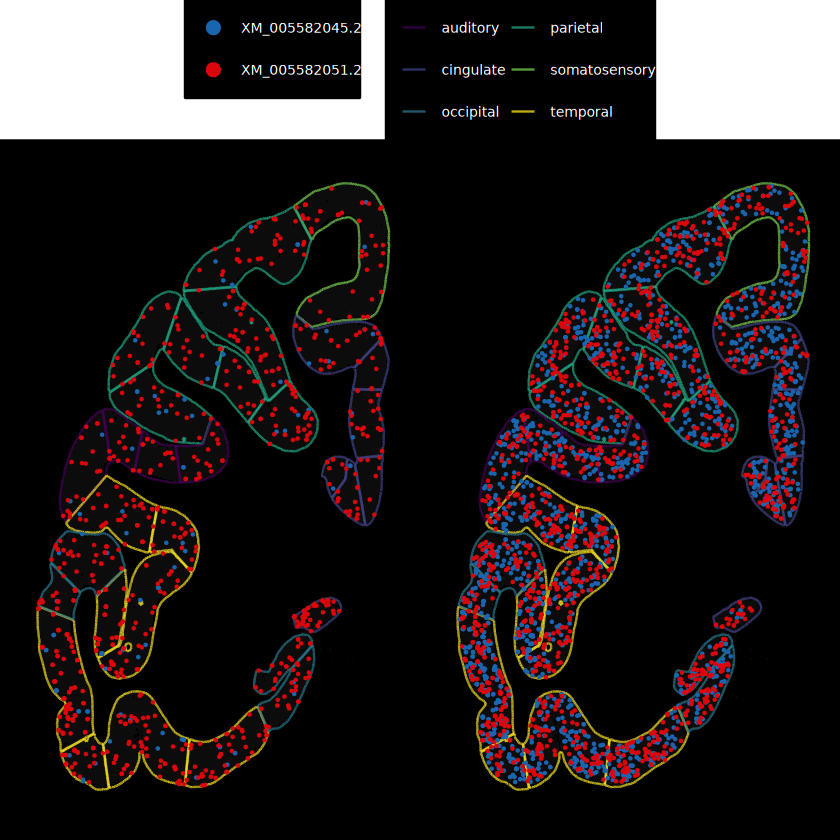

In [327]:
#case1 MYL6
geneex = "NTRK2"
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N" & isosigi$gene_id %in% geneex,]
hubtrans = unique(isosigi$transcript_id)

mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$subclass == "ASC",]
mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
pmkpti1 = SpCasePlot(mkdf,hubtrans,edgesdf)
pmkpti1

mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$class == "GLU",]
mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
mkdf = mkdf[order(mkdf$transcript_id),]
pmkpti2 = SpCasePlot(mkdf,hubtrans,edgesdf)
pmkpti2
pmkpti = ggarrange(pmkpti1,pmkpti2,nrow = 1, common.legend = T)
pmkpti
ggexport(pmkpti,filename = "result/figure5/Lobe_case_spatial_NTRK2_24_12_23.pdf",width = 8,height = 6)
#ggexport(pmkpti1,filename = "result/figure5/L1_ASC_case_spatial_NTRK2_24_09_23.pdf",width = 6,height = 6)

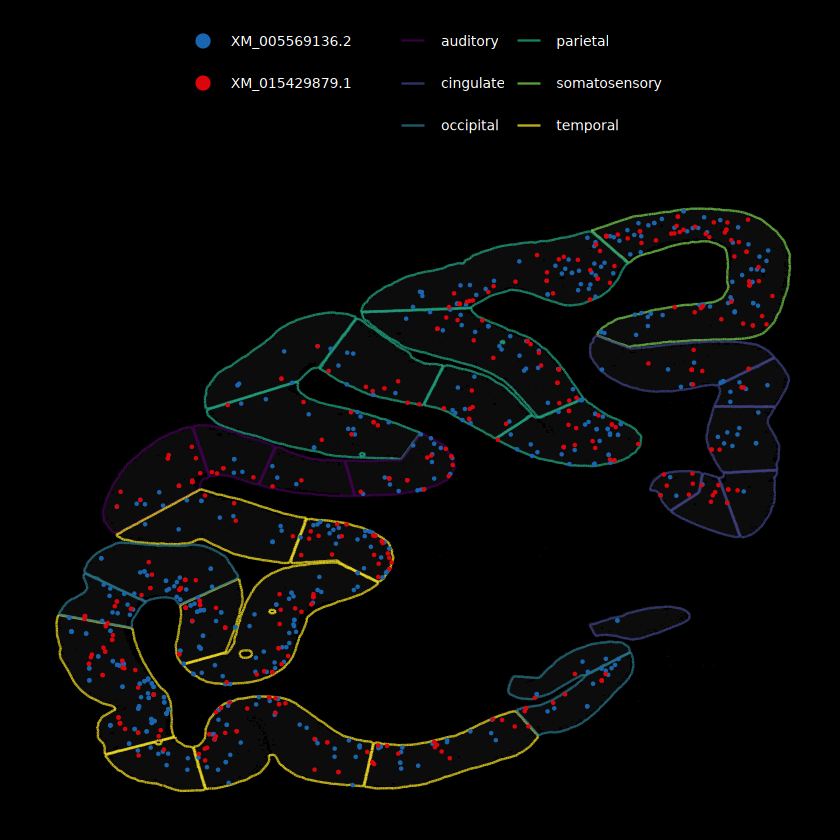

file saved to result/figure5/Lobe_case_spatial_DBNDD2_24_12_23.pdf



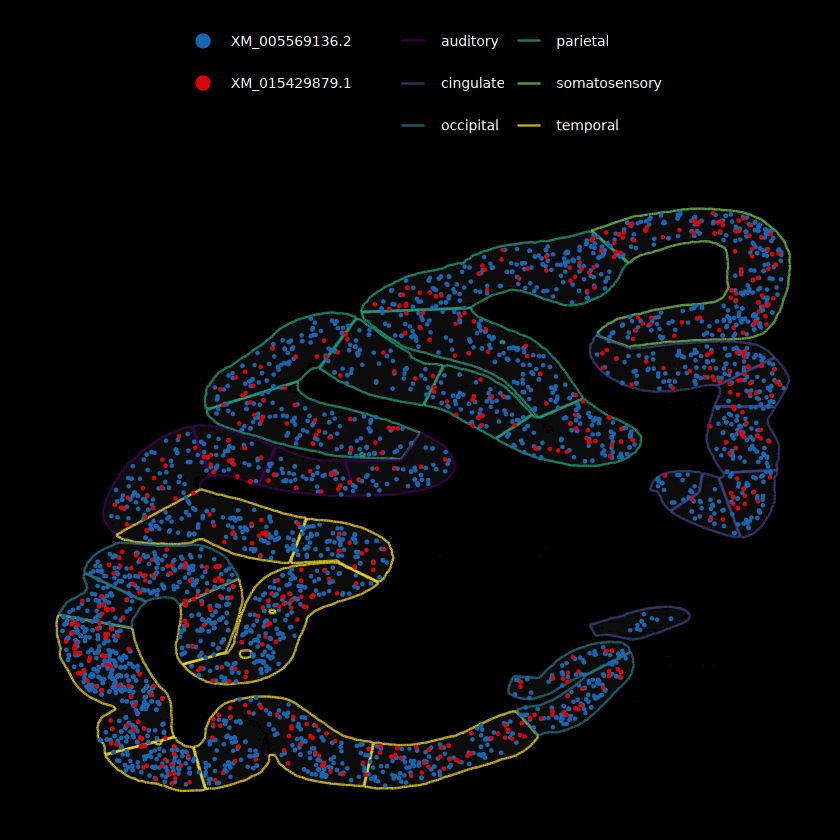

In [338]:
#case1 MYL6
geneex = "DBNDD2"
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N" & isosigi$gene_id %in% geneex,]
hubtrans = unique(isosigi$transcript_id)

mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$subclass == "OLG",]
mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
pmkpti1 = SpCasePlot(mkdf,hubtrans,edgesdf)
pmkpti1

mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$class == "GLU",]
mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
mkdf = mkdf[order(mkdf$transcript_id),]
pmkpti2 = SpCasePlot(mkdf,hubtrans,edgesdf)
pmkpti2
pmkpti = ggarrange(pmkpti1,pmkpti2,nrow = 1, common.legend = T)
pmkpti
ggexport(pmkpti,filename = "result/figure5/Lobe_case_spatial_DBNDD2_24_12_23.pdf",width = 8,height = 6)
#ggexport(pmkpti1,filename = "result/figure5/L1_ASC_case_spatial_NTRK2_24_09_23.pdf",width = 6,height = 6)

file saved to result/figure4/Lobe_case_spatial_DBNDD2_zoomed_25_03_08.pdf



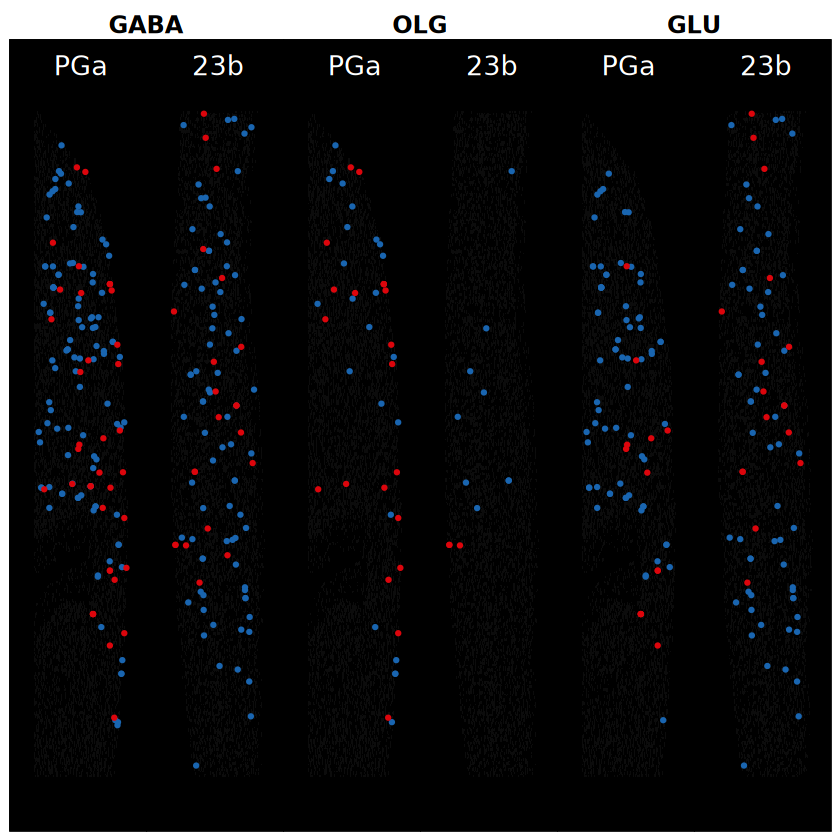

In [107]:
#case2 Lobe
geneex = "DBNDD2"
edgesdf$areatr = edgesdf$lobe
# isosigi = isosigls$subclass
# isosigi = isosigi[isosigi$gene_id %in% geneex,]
hubtrans = c('XM_005569136.2','XM_015429879.1')
fsraw.cor$areatr = fsraw.cor$subclass
RTN1CasePlot = function(subid,geneex,hubtrans,legend = F,ptsize = 1.5){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$areatr %in% subid,]
    #mkdf.zoom = mkdf[mkdf$region == "1|2",]
    pmkpti1 = SpCasePlotZoom(mkdf,hubtrans,"PGa",fsraw.cor,ptsize)
    pmkpti2 = SpCasePlotZoom(mkdf,hubtrans,"23b",fsraw.cor,ptsize)
    if(legend == T){
        pmkpti = ggarrange(pmkpti1,pmkpti2,common.legend = T,legend = "right")
    }else{
        pmkpti = ggarrange(pmkpti1,pmkpti2,common.legend = T,legend = "none")
    }
    pmkpti = annotate_figure(pmkpti, top = text_grob(subid, color = "black", face = "bold", size = 14))
    return(pmkpti)
}
fsraw.cor$areatr = fsraw.cor$class

#pmkpt2 = RTN1CasePlot("PVALB","RTN1",hubtrans)
#pmkpt2
pmkpt1 = RTN1CasePlot(c("GABA","GLU","NonNeuron"),geneex,hubtrans,F)
#pmkpt1
fsraw.cor$areatr = fsraw.cor$subclass
pmkpt2 = RTN1CasePlot("OLG",geneex,hubtrans)
fsraw.cor$areatr = fsraw.cor$class
pmkpt3 = RTN1CasePlot("GLU",geneex,hubtrans)
#pmkpt3
library(Seurat)
pmkpt = pmkpt1 + pmkpt2 +  pmkpt3
pmkpt
ggexport(pmkpt,filename = "result/figure4/Lobe_case_spatial_DBNDD2_zoomed_25_03_08.pdf",width = 15,height = 3)


In [23]:
rgb(0,160,233,maxColorValue = 255)
rgb(195,13,35,maxColorValue = 255)

[1] "#00A0E9"

[1] "#C30D23"

`summarise()` has grouped output by 'lobe', 'region'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.


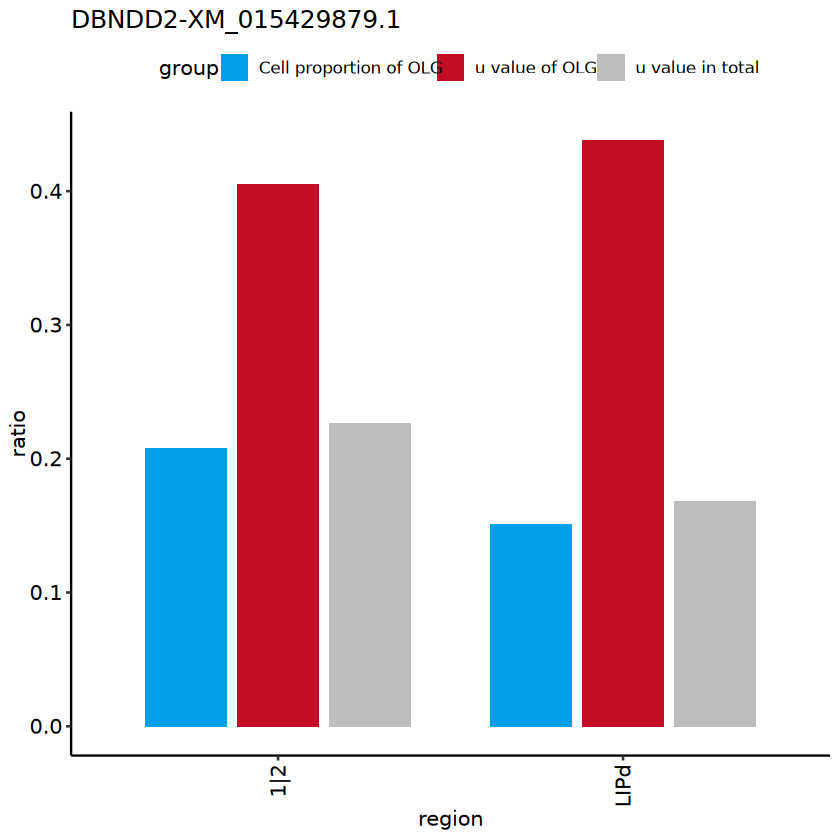

In [29]:
geneex = "DBNDD2"
transid = "XM_015429879.1"
#geneex = "SYT1"
#transid = "NM_001285042.1"
fsraw.case = fsraw.cor[fsraw.cor$gene_id == geneex,]
clpos = fsraw.case %>% group_by(lobe,region,subclass) %>% summarise(count = length(unique(readid)))
clpos = clpos[clpos$subclass != "",]
clpos = clpos %>% group_by(lobe,region) %>% mutate(tcount = sum(count),ratio = count/tcount)
clpos$region = factor(clpos$region,levels = regionorder)
clpos$lobe = factor(clpos$lobe,levels = lobeorder)
clposf = clpos[clpos$subclass == "OLG" & clpos$count > 10,]
# ggplot(clposf,aes(x = region,y = ratio,fill = subclass)) + geom_bar(stat = "identity",position = "stack") + 
# scale_fill_discreterainbow() + theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1))

isocase = isosigls$region
isocasef = isocase[isocase$gene_id == geneex & isocase$transcript_id == transid,]
isocasef$areatr = factor(isocasef$areatr,levels = regionorder)

clposf.hub = clposf[,c("region","ratio")]
clposf.hub$group = "Cell proportion of OLG"
isocasef.hub = isocasef[,c("areatr","relative")]
isocasef.hub$group = "u value in total"
colnames(isocasef.hub) = c("region","ratio","group")

datadf = fsraw.case[fsraw.case$subclass == "OLG",] %>% group_by(region,transcript_id) %>% summarise(count = n())
isocasef.hubc <- datadf %>% group_by(region) %>% 
          arrange(desc(transcript_id)) %>%
          mutate(ratio = count / sum(count))
isocasef.hubc = isocasef.hubc[isocasef.hubc$transcript_id %in% transid,]
isocasef.hubc = isocasef.hubc[,c("region","ratio")]
isocasef.hubc$group = "u value of OLG"

hubcmp = rbind(clposf.hub,isocasef.hub,isocasef.hubc)
hubcmp = hubcmp[hubcmp$region %in% c("1|2","LIPd"),]
hubcmp$group = factor(hubcmp$group,levels = c("Cell proportion of OLG","u value of OLG","u value in total"))
pcm1 = ggplot(hubcmp,aes(x = region,y = ratio,fill = group)) + geom_bar(stat = "identity",position = position_dodge(0.8),width = 0.7) + 
    scale_fill_manual(values = c('#00A0E9','#C30D23','grey')) + theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) +
    ggtitle("DBNDD2-XM_015429879.1")
pcm1
#ggexport(pcm,filename = "result/figure4/Lobe_case_spatial_DBNDD2_zoomed_stat_bar_25_03_10.pdf",width = 2,height = 4)


In [36]:
hubcmp

region,ratio,group
<chr>,<dbl>,<fct>
LIPd,0.1509434,Cell proportion of OLG
1|2,0.2079208,Cell proportion of OLG
1|2,0.2265077,u value in total
LIPd,0.1677632,u value in total
1|2,0.4047619,u value of OLG
LIPd,0.4375000,u value of OLG


`summarise()` has grouped output by 'lobe', 'region'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.


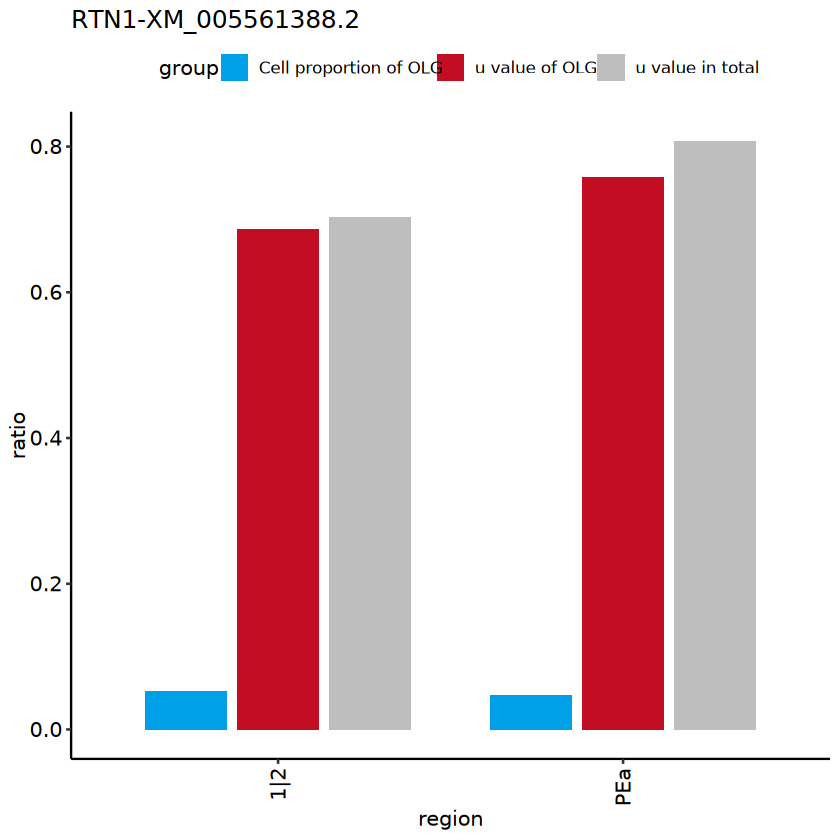

In [27]:
geneex = "RTN1"
transid = "XM_005561388.2"
#geneex = "SYT1"
#transid = "NM_001285042.1"
fsraw.case = fsraw.cor[fsraw.cor$gene_id == geneex,]
clpos = fsraw.case %>% group_by(lobe,region,subclass) %>% summarise(count = length(unique(readid)))
clpos = clpos[clpos$subclass != "",]
clpos = clpos %>% group_by(lobe,region) %>% mutate(tcount = sum(count),ratio = count/tcount)
clpos$region = factor(clpos$region,levels = regionorder)
clpos$lobe = factor(clpos$lobe,levels = lobeorder)
clposf = clpos[clpos$subclass == "OLG" & clpos$count > 10,]
# ggplot(clposf,aes(x = region,y = ratio,fill = subclass)) + geom_bar(stat = "identity",position = "stack") + 
# scale_fill_discreterainbow() + theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1))

isocase = isosigls$region
isocasef = isocase[isocase$gene_id == geneex & isocase$transcript_id == transid,]
isocasef$areatr = factor(isocasef$areatr,levels = regionorder)
# ggplot(isocase[isocase$count > 10 &isocase$areatr %in% clposf$region,],aes(x = areatr,y = relative)) + geom_bar(stat = "identity",position = "stack") + 
# scale_fill_discreterainbow() + theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1))

clposf.hub = clposf[,c("region","ratio")]
clposf.hub$group = "Cell proportion of OLG"
isocasef.hub = isocasef[,c("areatr","relative")]
isocasef.hub$group = "u value in total"
colnames(isocasef.hub) = c("region","ratio","group")

datadf = fsraw.case[fsraw.case$subclass == "OLG",] %>% group_by(region,transcript_id) %>% summarise(count = n())
isocasef.hubc <- datadf %>% group_by(region) %>% 
          arrange(desc(transcript_id)) %>%
          mutate(ratio = count / sum(count))
isocasef.hubc = isocasef.hubc[isocasef.hubc$transcript_id %in% transid,]
isocasef.hubc = isocasef.hubc[,c("region","ratio")]
isocasef.hubc$group = "u value of OLG"

hubcmp = rbind(clposf.hub,isocasef.hub,isocasef.hubc)
hubcmp$group = factor(hubcmp$group,levels = c("Cell proportion of OLG","u value of OLG","u value in total"))
hubcmp = hubcmp[hubcmp$region %in% c("1|2","PEa"),]
pcm2 = ggplot(hubcmp,aes(x = region,y = ratio,fill = group)) + geom_bar(stat = "identity",position = position_dodge(0.8),width = 0.7) + 
    scale_fill_manual(values = c('#00A0E9','#C30D23','grey')) + theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) +
    ggtitle("RTN1-XM_005561388.2")
pcm2

file saved to result/figure4/Lobe_case_spatial_DBNDD2_RTN1_zoomed_stat_bar_25_04_10.pdf



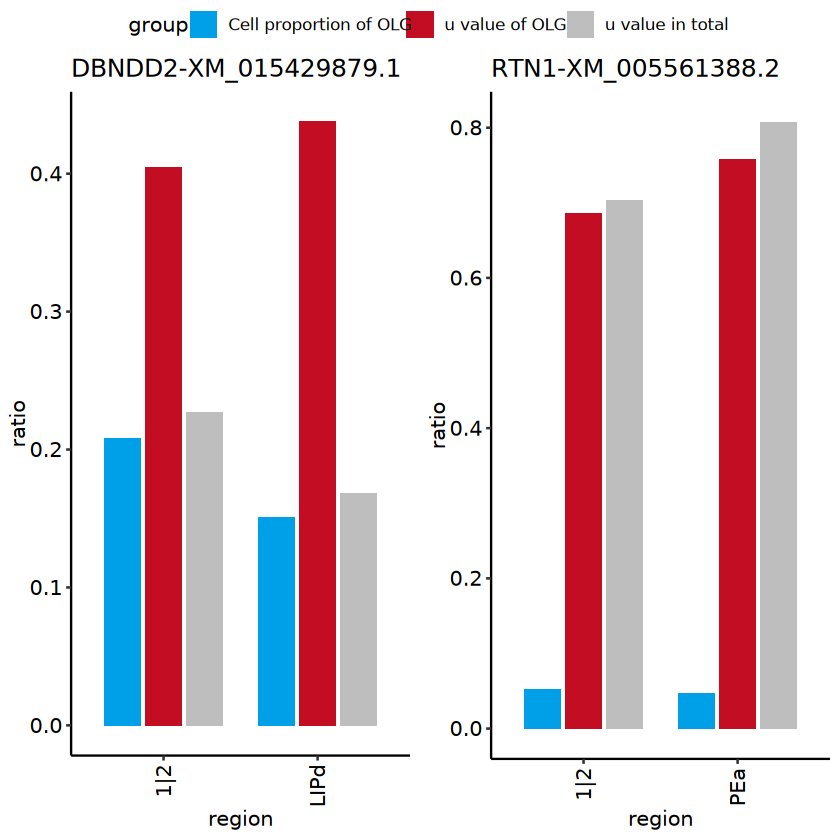

In [31]:
pcm = ggarrange(pcm1,pcm2,nrow = 1,common.legend = T)
pcm
ggexport(pcm,filename = "result/figure4/Lobe_case_spatial_DBNDD2_RTN1_zoomed_stat_bar_25_04_10.pdf",width = 4,height = 4)

In [47]:
PiePlot = function(mkdf){
    datadf = mkdf %>% group_by(region,transcript_id) %>% summarise(count = n())
    datadf <- datadf %>% group_by(region) %>% 
          arrange(desc(transcript_id)) %>%
          mutate(prop = count / sum(count) *100) %>%
          mutate(ypos = cumsum(prop)- 0.5*prop )
    datadf$proplabel = paste0(datadf$count,"(",round(datadf$prop,1),")%")

    p1.4 = ggplot(datadf, aes(x="", y=prop, fill=transcript_id)) +
          geom_bar(stat="identity", width=1, color= NA) +
          facet_wrap(~region) +
          coord_polar("y", start=0) +
          theme_void() + 
          theme(legend.position="none") +
          geom_text(aes(y = ypos, label = proplabel), color = "black", size=3) +
          scale_fill_discreterainbow()
    return(p1.4)
}

PiePlotCell = function(mkdf){
    datadf = mkdf %>% group_by(region,celltype) %>% summarise(celln = length(unique(readid)))
    datadf <- datadf %>% group_by(region) %>% 
          arrange(desc(celltype)) %>%
          mutate(prop = celln / sum(celln) *100) %>%
          mutate(ypos = cumsum(prop)- 0.5*prop )
    datadf$proplabel = paste0(datadf$celln,"(",round(datadf$prop,1),")%")
    mycolor = c("grey","yellow")
    names(mycolor) = levels(mkdf$celltype)
    p1.4 = ggplot(datadf, aes(x="", y=prop, fill=celltype)) +
          geom_bar(stat="identity", width=1, color= NA) +
          facet_wrap(~region) +
          coord_polar("y", start=0) +
          theme_void() + 
          theme(legend.position="none") +
          geom_text(aes(y = ypos, label = proplabel), color = "black", size=3) +
          scale_fill_manual(values = mycolor)
    return(p1.4)
}

In [ ]:
#case2 Lobe
geneex = "RTN1"
edgesdf$areatr = edgesdf$lobe
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$gene_id %in% geneex,]
hubtrans = unique(isosigi$transcript_id)
fsraw.cor$areatr = fsraw.cor$subclass
RTN1CasePlot = function(subid,geneex,hubtrans,legend = F,ptsize = 1.5){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$areatr %in% subid,]
    #mkdf.zoom = mkdf[mkdf$region == "1|2",]
    pmkpti1 = SpCasePlotZoom(mkdf,hubtrans,"1|2",ptsize)
    pmkpti2 = SpCasePlotZoom(mkdf,hubtrans,"PEa",ptsize)
    if(legend == T){
        pmkpti = ggarrange(pmkpti1,pmkpti2,common.legend = T,legend = "right")
    }else{
        pmkpti = ggarrange(pmkpti1,pmkpti2,common.legend = T,legend = "none")
    }
    pmkpti = annotate_figure(pmkpti, top = text_grob(subid, color = "black", face = "bold", size = 14))
    return(pmkpti)
}
fsraw.cor$areatr = fsraw.cor$class

#pmkpt2 = RTN1CasePlot("PVALB","RTN1",hubtrans)
#pmkpt2
pmkpt1 = RTN1CasePlot(c("GABA","GLU","NonNeuron"),geneex,hubtrans,F,1)
#pmkpt1
fsraw.cor$areatr = fsraw.cor$subclass
pmkpt2 = RTN1CasePlot("OLG","RTN1",hubtrans)
pmkpt3 = RTN1CasePlot("L3/4","RTN1",hubtrans)
#pmkpt3
library(Seurat)
pmkpt = pmkpt1 + pmkpt2 +  pmkpt3
pmkpt
ggexport(pmkpt,filename = "result/figure4/Lobe_case_spatial_RTN1_zoomed_24_12_21.pdf",width = 15,height = 3)

# pmkpt1 = RTN1CasePlot("L3/4")
# pmkpt1 = RTN1CasePlot("L6")
#hubtrans = rev(hubtrans)

# mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$class == "GABA",]
# mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
# mkdf = mkdf[order(mkdf$transcript_id),]
# pmkpti2 = SpCasePlot(mkdf,hubtrans,edgesdf)
# pmkpti2
# pmkpti = ggarrange(pmkpti1,pmkpti2,nrow = 1, common.legend = T)
# pmkpti
#ggexport(pmkpti,filename = "result/figure5/Lobe_case_spatial_RTN1_24_10_15.pdf",width = 8,height = 6)

In [112]:
subid = c("1|2","PEa")
geneex = "RTN1"


mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$region %in% subid,]
p1.1 = PiePlot(mkdf)
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$region %in% subid & fsraw.cor$subclass %in% "OLG",]
p1.2 = PiePlot(mkdf)
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$region %in% subid & fsraw.cor$subclass %in% "L3/4",]
p1.3 = PiePlot(mkdf)
p1.1 

p1.2
p1.3
ggexport(p1.1+p1.2+p1.3,filename = "result/figure4/Lobe_case_spatial_RTN1_zoomed_25_03_08.pdf",width = 15,height = 3)

`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.


ERROR: Error in file(con, "rb"): cannot open the connection


plot without title

ERROR: Error in file(con, "rb"): cannot open the connection


plot without title

Warning message in grid.newpage():
"Cannot open temporary file '/tmp/Rtmp0wpa3l/pdfb397763e98aa' for compression (reason: No such file or directory); compression has been turned off for this device"
file saved to result/figure4/Lobe_case_spatial_RTN1_zoomed_25_03_08.pdf



ERROR: Error in file(con, "rb"): cannot open the connection


plot without title

`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.
file saved to result/figure4/Lobe_case_spatial_RTN1_zoomed_cellporp_pie_25_04_23.pdf



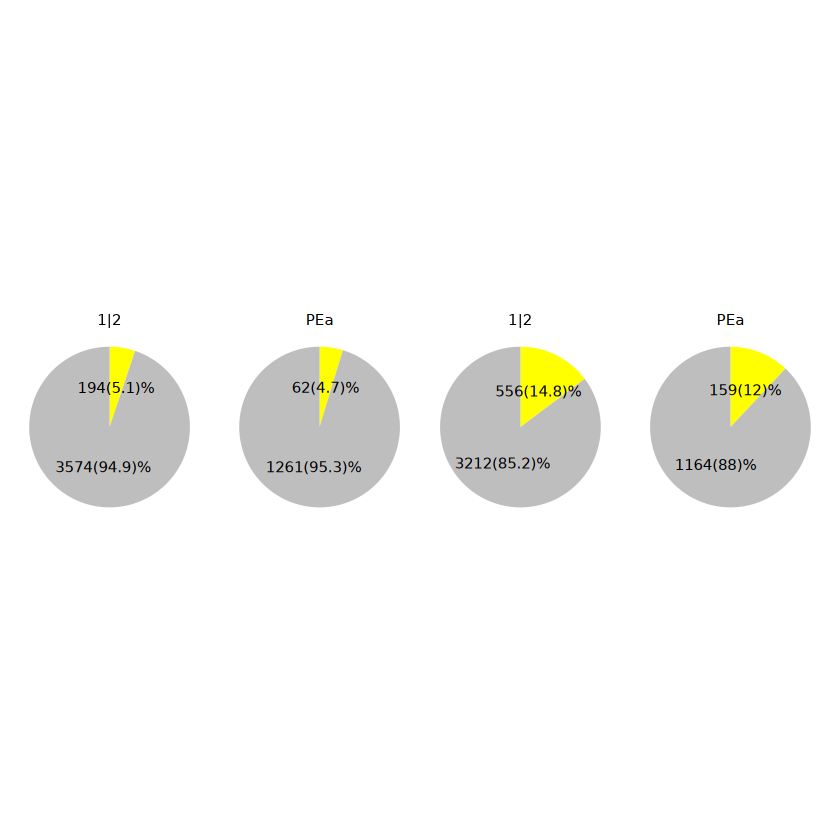

In [51]:
subid = c("1|2","PEa")
geneex = "RTN1"
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$region %in% subid & 
                 fsraw.cor$subclass != "",]
mkdf$celltype = mkdf$subclass
mkdf[mkdf$subclass != "OLG",]$celltype = "other"
mkdf$celltype = factor(mkdf$celltype,levels = c("other","OLG"))
p3.1 = PiePlotCell(mkdf)

mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$region %in% subid & 
                 fsraw.cor$subclass != "",]
mkdf$celltype = mkdf$subclass
mkdf[mkdf$subclass != "L3/4",]$celltype = "other"
mkdf$celltype = factor(mkdf$celltype,levels = c("other","L3/4"))
p3.2 = PiePlotCell(mkdf)
p3.1+p3.2
ggexport(p3.1+p3.2,filename = "result/figure4/Lobe_case_spatial_RTN1_zoomed_cellporp_pie_25_04_23.pdf",width = 10,height = 3)


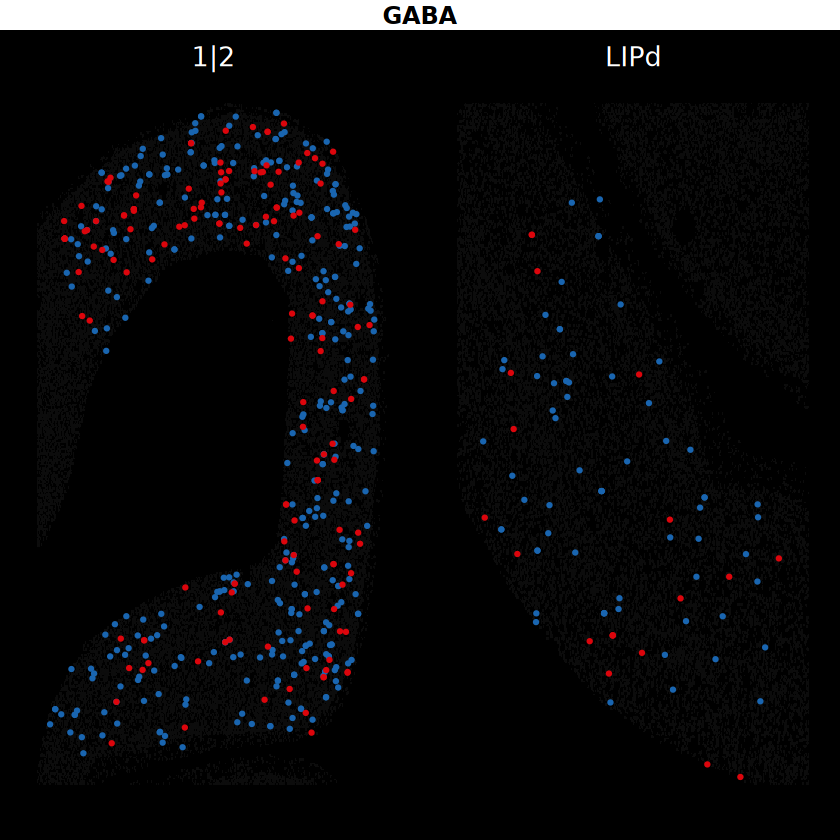

file saved to result/figure4/Lobe_case_spatial_DBNDD2_zoomed_25_04_23.pdf



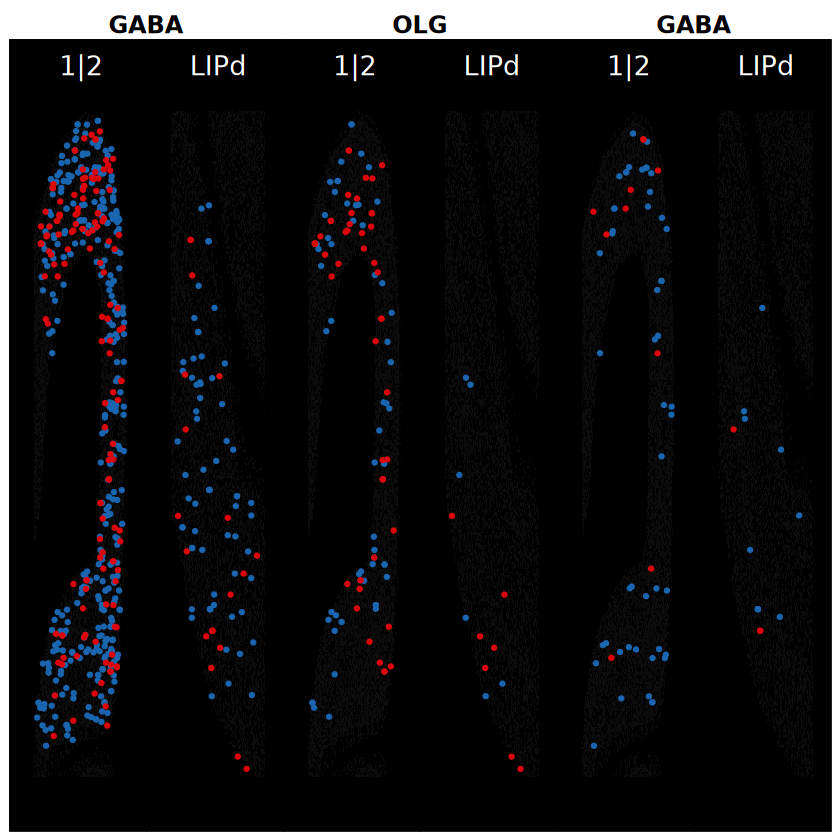

In [49]:
RTN1CasePlot = function(subid,geneex,hubtrans,legend = F,ptsize = 1.5){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$areatr %in% subid,]
    #mkdf.zoom = mkdf[mkdf$region == "1|2",]
    pmkpti1 = SpCasePlotZoom(mkdf,hubtrans,"1|2",fsraw.cor,ptsize)
    pmkpti2 = SpCasePlotZoom(mkdf,hubtrans,"LIPd",fsraw.cor,ptsize)
    if(legend == T){
        pmkpti = ggarrange(pmkpti1,pmkpti2,common.legend = T,legend = "right")
    }else{
        pmkpti = ggarrange(pmkpti1,pmkpti2,common.legend = T,legend = "none")
    }
    pmkpti = annotate_figure(pmkpti, top = text_grob(subid, color = "black", face = "bold", size = 14))
    return(pmkpti)
}
geneex = "DBNDD2"
hubtrans = c('XM_005569136.2','XM_015429879.1')
fsraw.cor$areatr = fsraw.cor$class
pmkpt1 = RTN1CasePlot(c("GABA","GLU","NonNeuron"),geneex,hubtrans)
pmkpt1
fsraw.cor$areatr = fsraw.cor$subclass
pmkpt2 = RTN1CasePlot("OLG",geneex,hubtrans)
#pmkpt1

# fsraw.cor$areatr = fsraw.cor$class
# pmkpt2 = RTN1CasePlot("GABA",geneex,hubtrans)
#pmkpt2
fsraw.cor$areatr = fsraw.cor$class
pmkpt3 = RTN1CasePlot("GABA",geneex,hubtrans)
#pmkpt3
pmkpt = pmkpt1 + pmkpt2 +  pmkpt3
pmkpt
ggexport(pmkpt,filename = "result/figure4/Lobe_case_spatial_DBNDD2_zoomed_25_04_23.pdf",width = 15,height = 3)

`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.
file saved to result/figure4/Lobe_case_spatial_DBNDD2_zoomed_pie_25_04_23.pdf



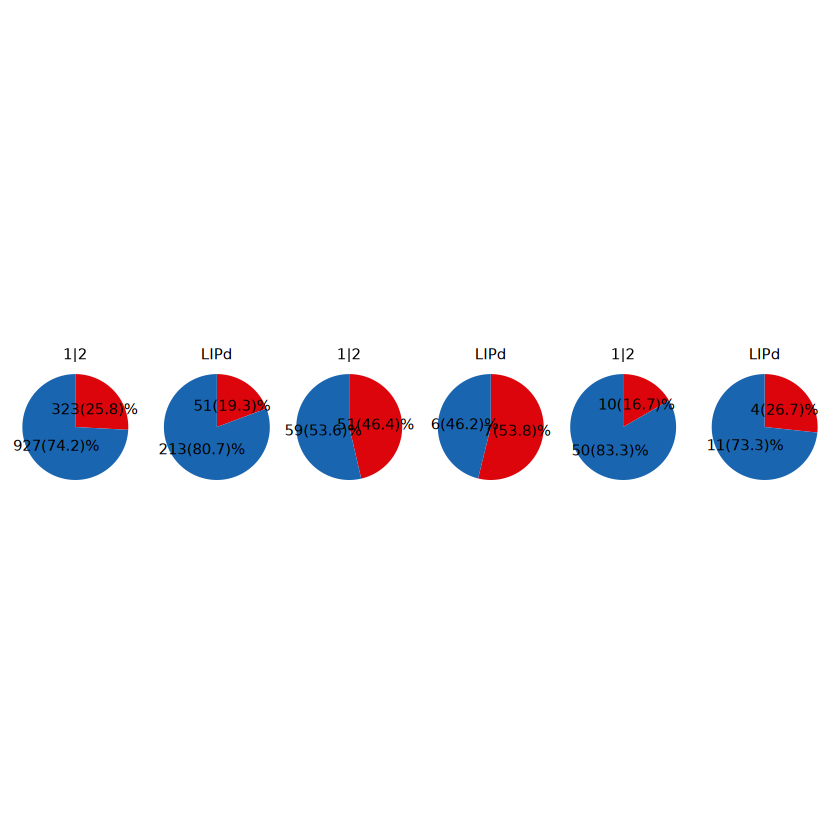

In [52]:
subid = c("1|2","LIPd")
geneex = "DBNDD2"
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$region %in% subid & 
                 fsraw.cor$transcript_id %in% c("XM_005569136.2","XM_015429879.1"),]
p2.1 = PiePlot(mkdf)
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$region %in% subid & 
                 fsraw.cor$subclass %in% "OLG" &
                 fsraw.cor$transcript_id %in% c("XM_005569136.2","XM_015429879.1"),]
p2.2 = PiePlot(mkdf)
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$region %in% subid & 
                 fsraw.cor$class %in% "GABA" &
                 fsraw.cor$transcript_id %in% c("XM_005569136.2","XM_015429879.1"),]
p2.3 = PiePlot(mkdf)
p2.1+p2.2+p2.3
ggexport(p2.1+p2.2+p2.3,filename = "result/figure4/Lobe_case_spatial_DBNDD2_zoomed_pie_25_04_23.pdf",width = 15,height = 3)

In [50]:
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$region %in% subid & 
                 fsraw.cor$subclass != "",]
mkdf$celltype = mkdf$subclass
mkdf[mkdf$subclass != "OLG",]$celltype = "other"
mkdf$celltype = factor(mkdf$celltype,levels = c("other","OLG"))
p3.1 = PiePlotCell(mkdf)

mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$region %in% subid & 
                 fsraw.cor$subclass != "",]
mkdf$celltype = mkdf$class
mkdf[mkdf$class != "GABA",]$celltype = "other"
mkdf$celltype = factor(mkdf$celltype,levels = c("other","GABA"))
p3.2 = PiePlotCell(mkdf)
ggexport(p3.1+p3.2,filename = "result/figure4/Lobe_case_spatial_DBNDD2_zoomed_cellporp_pie_25_04_23.pdf",width = 10,height = 3)


`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'region'. You can override using the
`.groups` argument.
file saved to result/figure4/Lobe_case_spatial_DBNDD2_zoomed_cellporp_pie_25_04_23.pdf



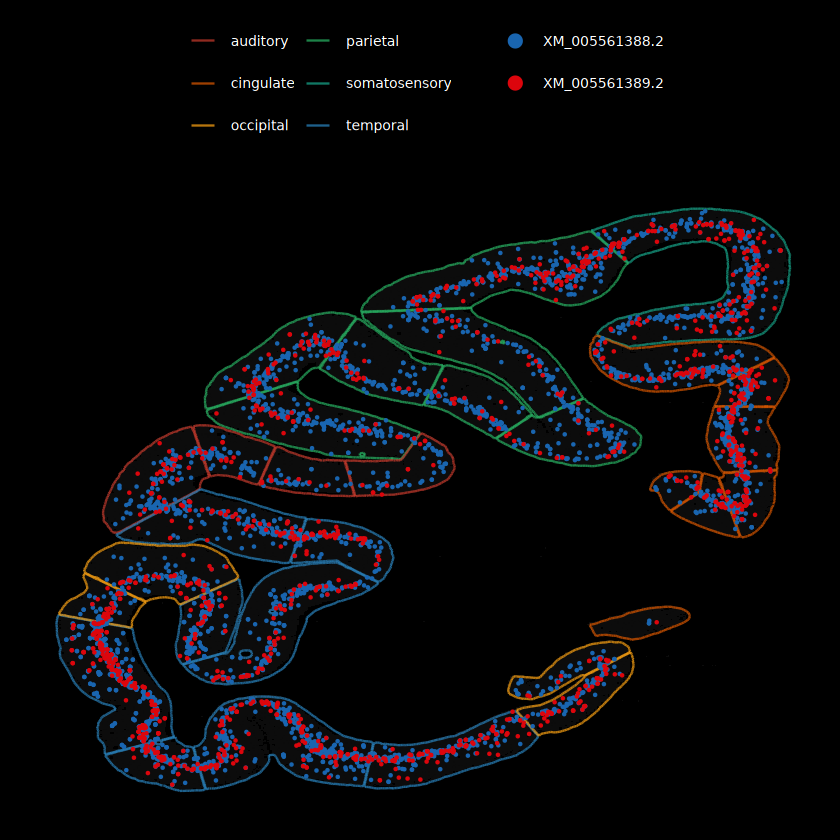

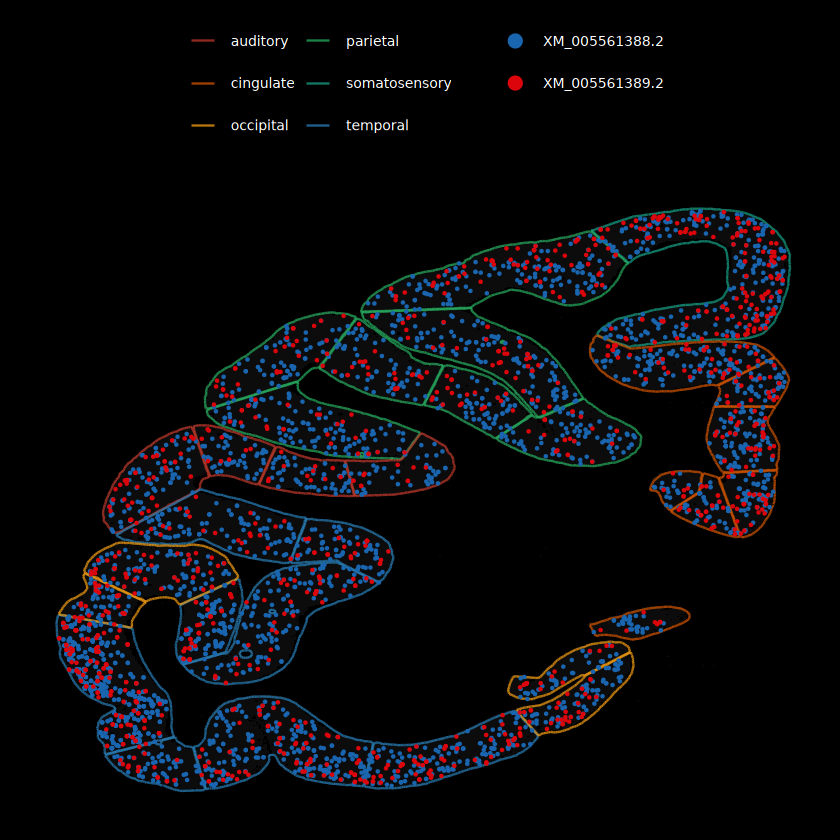

file saved to result/figure5/Lobe_case_spatial_RTN1_24_10_15.pdf



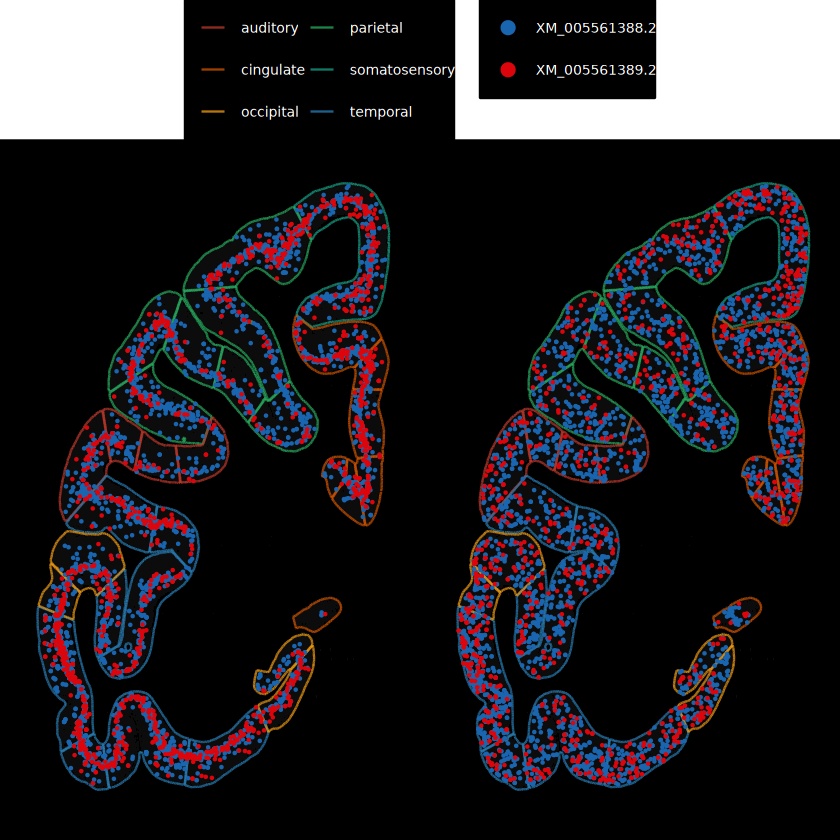

In [884]:
#case2 Lobe
geneex = "RTN1"
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$gene_id %in% geneex,]
hubtrans = unique(isosigi$transcript_id)
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$subclass == "L4/5",]
pmkpti1 = SpCasePlot(mkdf,hubtrans,edgesdf)
pmkpti1

mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$class == "GABA",]
mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
mkdf = mkdf[order(mkdf$transcript_id),]
pmkpti2 = SpCasePlot(mkdf,hubtrans,edgesdf)
pmkpti2
pmkpti = ggarrange(pmkpti1,pmkpti2,nrow = 1, common.legend = T)
pmkpti
#ggexport(pmkpti,filename = "result/figure5/Lobe_case_spatial_RTN1_24_10_15.pdf",width = 8,height = 6)

In [29]:
#case2 Lobe
geneex = "RTN1"
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$gene_id %in% geneex,]
hubtrans = unique(isosigi$transcript_id)
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$subclass == "L4/5",]
pmkpti1 = SpCasePlot(mkdf,hubtrans,edgesdf)
pmkpti1

mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$class == "GABA",]
mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
mkdf = mkdf[order(mkdf$transcript_id),]
pmkpti2 = SpCasePlot(mkdf,hubtrans,edgesdf)
pmkpti2
pmkpti = ggarrange(pmkpti1,pmkpti2,nrow = 1, common.legend = T)
pmkpti
#ggexport(pmkpti,filename = "result/figure5/Lobe_case_spatial_RTN1_24_10_15.pdf",width = 8,height = 6)

ERROR: Error in SpCasePlot(mkdf, hubtrans, edgesdf): object 'backpt' not found


In [902]:
edgesdf2 = pref$layeredges
edgesdf2 = edgesdf2[edgesdf2$areaid %in% unique(fsraw.cor$layer),]
head(edgesdf2)
edgesdf2$areatr = edgesdf2$areaid
#edgesdf = merge(edgesdf,areaan,by.x = "areaid",by.y = "area")
#unique(edgesdf$areaid)

,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,areaid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1385,7285,15438,46436,64705,46518,64693,46540.49,65132.87,46469.34,64646.63,0,0,l1
1386,16616,14951,46175,64676,46269,64674,46231.50,65121.50,46222.69,64707.37,0,0,l1
1387,33735,16616,46030,64696,46175,64676,46208.15,65451.96,46115.36,64779.21,0,0,l1
1388,3003,20924,46995,64656,46782,64591,46877.42,64659.80,46837.73,64789.86,0,0,l1
1389,4687,20924,46649,64706,46782,64591,46837.73,64789.86,46793.15,64738.31,0,0,l1
1390,32454,32318,47230,64665,47072,64696,47156.98,64710.96,47480.06,66357.65,0,0,l1


In [953]:
geneex = "DDRGK1"
genest = fsraw.cor[fsraw.cor$gene_id == geneex,] %>% group_by(subclass) %>% summarise(count = length(unique(readid)))
genest
genest2 = fsraw.cor[fsraw.cor$gene_id == geneex,] %>% group_by(layer,subclass) %>% summarise(count = length(unique(readid)))
genest2[genest2$subclass == "L2/3",]

subclass,count
<chr>,<int>
,19273
ASC,351
L2,972
L2/3,2670
L2/3/4,504
L3/4,1043
L3/4/5,88
L4,774
L4/5,824


`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.


layer,subclass,count
<chr>,<chr>,<int>
l1,L2/3,8
l2,L2/3,497
l3,L2/3,2063
l4,L2/3,39
l5,L2/3,26
l6,L2/3,37


In [955]:
genest2[genest2$subclass == "L2/3",]

layer,subclass,count
<chr>,<chr>,<int>
l1,L2/3,8
l2,L2/3,497
l3,L2/3,2063
l4,L2/3,39
l5,L2/3,26
l6,L2/3,37


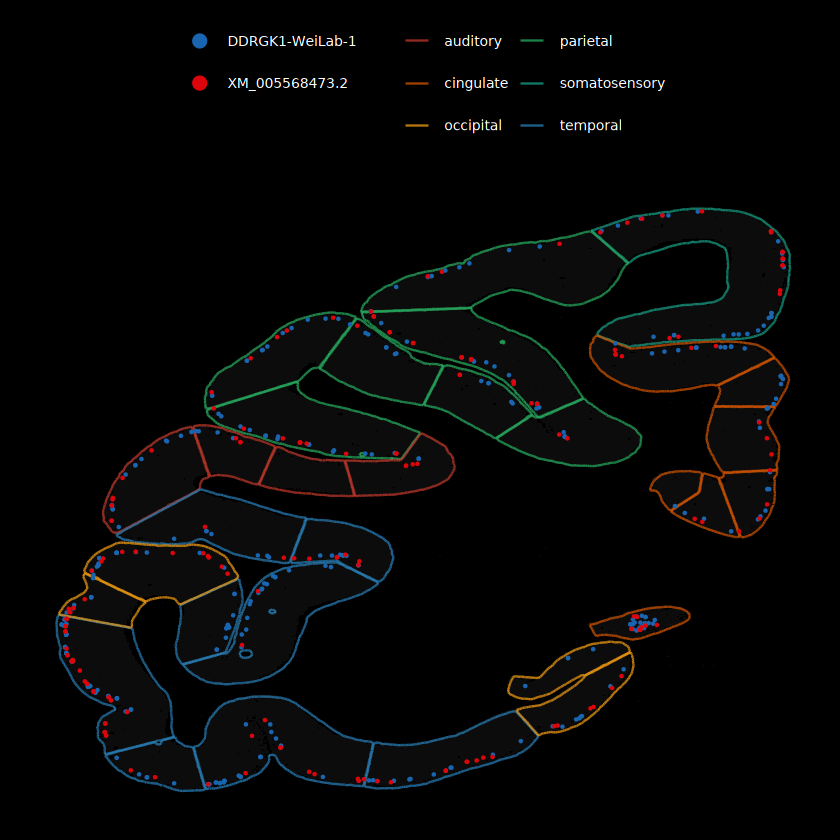

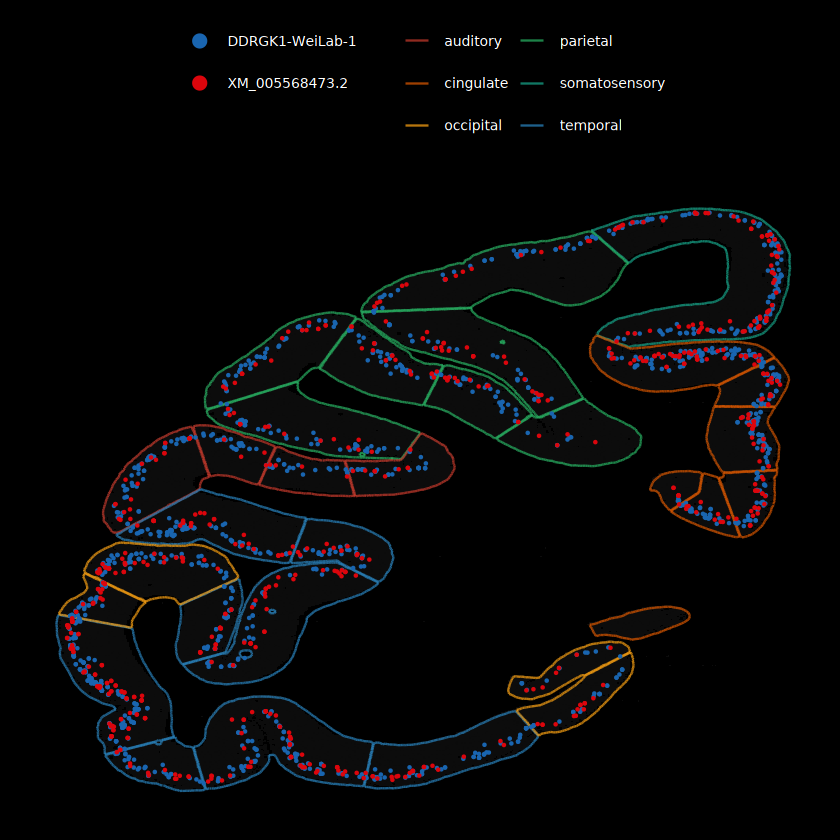

file saved to result/figure5/Lobe_case_spatial_DDRGK1_24_10_15.pdf



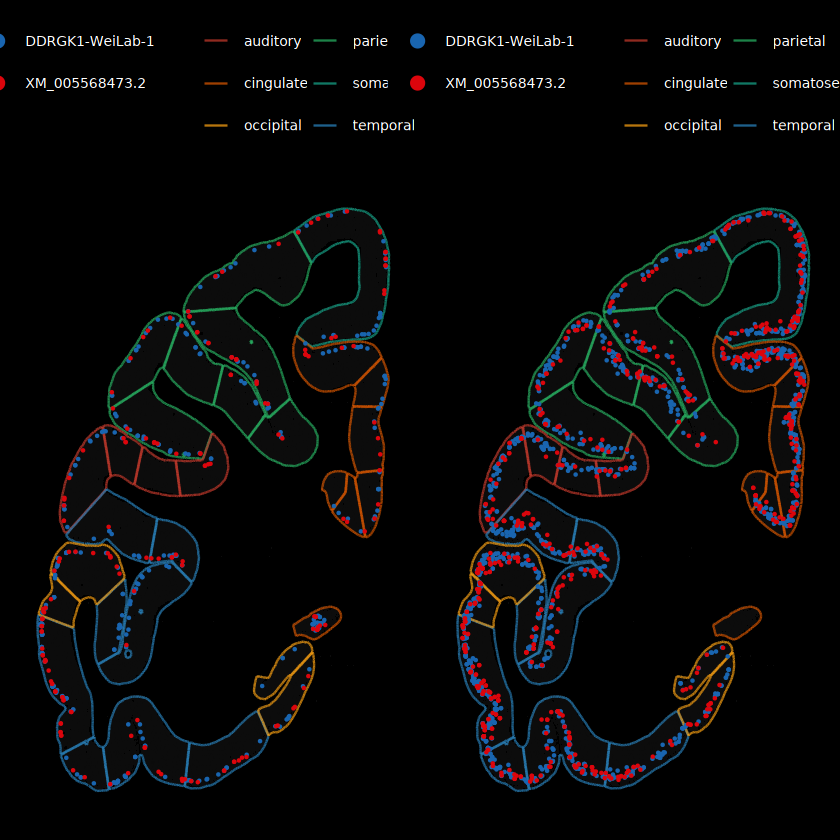

In [956]:
#case2 Lobe
geneex = "DDRGK1"
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$gene_id %in% geneex & isosigi$sig != "N",]
hubtrans = unique(isosigi$transcript_id)
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$subclass %in% c("L2/3") & fsraw.cor$layer == "l2",]
mkdf = mkdf[order(mkdf$transcript_id),]
pmkpti1 = SpCasePlot(mkdf,hubtrans,edgesdf)
pmkpti1

# geneex = "ARPP19"
# isosigi = isosigls$subclass
# isosigi = isosigi[isosigi$gene_id %in% geneex & isosigi$sig != "N",]
# hubtrans = unique(isosigi$transcript_id)
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$subclass %in% c("L2/3")  & fsraw.cor$layer == "l3",]
mkdf = mkdf[order(mkdf$transcript_id),]
pmkpti2 = SpCasePlot(mkdf,hubtrans,edgesdf)
pmkpti2
pmkpti = ggarrange(pmkpti1,pmkpti2,nrow = 1)
pmkpti
ggexport(pmkpti,filename = "result/figure5/Lobe_case_spatial_DDRGK1_24_10_15.pdf",width = 8,height = 6)

In [ ]:
geneex = "ARPP19"
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$gene_id %in% geneex & isosigi$sig != "N",]
hubtrans = unique(isosigi$transcript_id)
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex & fsraw.cor$subclass %in% c("L4/5"),]
mkdf = mkdf[order(mkdf$transcript_id),]
mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
    mkdf = mkdf[order(mkdf$transcript_id),]
mkdf.zoom = mkdf[mkdf$lobe == "temporal",]
backpt.zoom = backpt[backpt$x < max(mkdf.zoom$x) & backpt$x > min(mkdf.zoom$x) &
                     backpt$y < max(mkdf.zoom$y) & backpt$y > min(mkdf.zoom$y),]
mkdf.zoom$subclass = factor(mkdf.zoom$subclass,levels = c(cellanf$subclass))

    pmkpti1 = ggplot() +
      scattermore::geom_scattermore(
        data = backpt.zoom,
        aes(x,y),
        color = "white",
        # pixels = raster.dpi,
        pointsize = 0.05
      ) +
      geom_point(data = mkdf.zoom,
                 aes(x,y,fill = transcript_id),shape = 21,size = 1,stroke = 0) + 
     # scale_size(range = c(0.05,0.1)) +
      #facet_wrap(~layer,nrow = 2) 
      theme_void() +
      scale_fill_discreterainbow() +
      scale_color_flatui() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = guide_legend(override.aes = list(size=4),nrow = 3),
            fill = guide_legend(override.aes = list(size=4),nrow = 2),
            size = "none") +
      scale_y_reverse() + scale_x_reverse()
pmkpti1

#### Function analysis

[1] 35
[1] 15
[1] 38
[1] 18
[1] 50
[1] 18


Warning message:
"Removed 114 rows containing missing values or values outside the scale range
(`geom_point()`)."
Warning message:
"Removed 114 rows containing missing values or values outside the scale range
(`geom_text()`)."


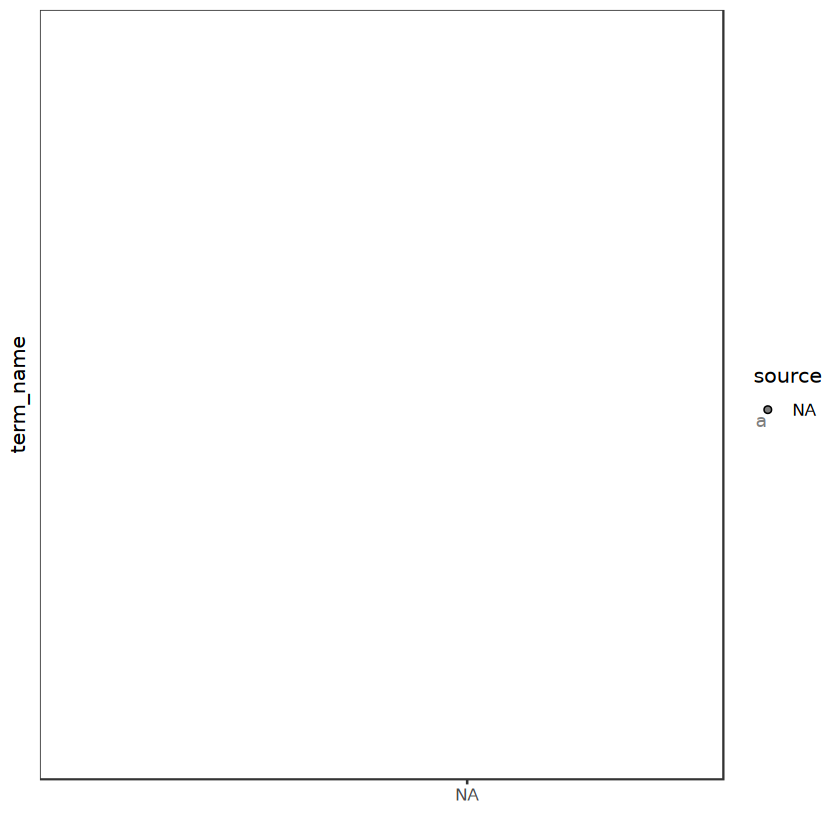

In [990]:
mycolor = pal_flatui("default")(5)
names(mycolor) = c("GO:BP","GO:MF","GO:CC","HP","KEGG")

hubgenels = list("layer" = isosigtri[isosigtri$layer < 0.05,]$gene_id,
                 "lobe" = isosigtri[isosigtri$lobe < 0.05,]$gene_id,
                 "cell" = isosigtri[isosigtri$cell < 0.05,]$gene_id)

pgls = list()
godft = NULL
for(i in 1:length(hubgenels)){
    hubgenei = hubgenels[[i]]
    godfi = MyGOCal(hubgenei,50)
    godfi$group = names(hubgenels)[i]
    godft = rbind(godft,godfi)
    pgls[[i]] = MyGOPlot(hubgenei,5,names(hubgenels)[i],mycolor)
}
pgot = ggplot(data = godft) + 
     # geom_rect(data = unique(godft[,c("term_name","source")]),
     #                               aes(ymin = as.numeric(term_name)-0.5,ymax = as.numeric(term_name)+0.5,
     #                                                        xmin = -Inf,xmax = Inf,fill = source),
     #            alpha = 0.2) +
    geom_point(aes(x = group,y = term_name,size = intersection_size,fill = source),shape = 21,color = "black") +
    geom_text(aes(y = term_name,label = term_name,x = 0,color = source),hjust = -0.01,vjust = -0.5) +
        scale_fill_manual(values = mycolor) + 
    scale_color_manual(values = mycolor) +
#    facet_grid(group~.,scales = "free",space = "free") +
    theme_bw() +
    theme(axis.text.y = element_blank(),
       axis.ticks.y = element_blank(),
      panel.spacing = unit(0,'lines'),
      panel.grid.major = element_blank(),
      #panel.grid.minor = element_blank(),
      panel.border = element_rect(fill = NA)) + xlab("")
pgot


file saved to result/figure5/Model_significant_GO_analysis_24_10_17.pdf



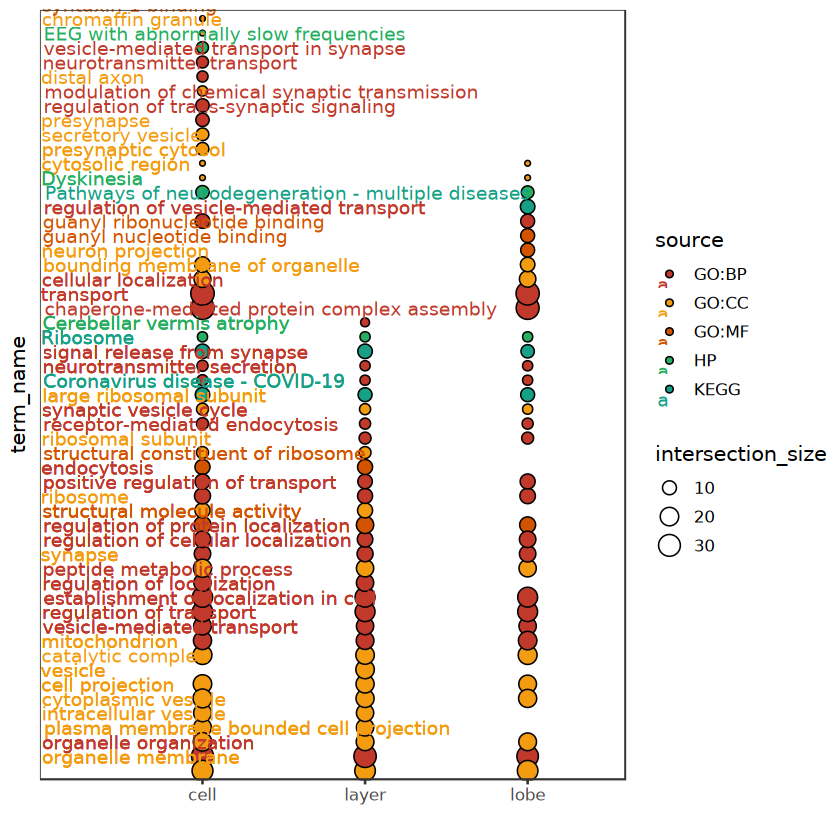

In [992]:
pgot = ggplot(data = godft) + 
     # geom_rect(data = unique(godft[,c("term_name","source")]),
     #                               aes(ymin = as.numeric(term_name)-0.5,ymax = as.numeric(term_name)+0.5,
     #                                                        xmin = -Inf,xmax = Inf,fill = source),
     #            alpha = 0.2) +
    geom_point(aes(x = group,y = term_name,size = intersection_size,fill = source),shape = 21,color = "black") +
    geom_text(aes(y = term_name,label = term_name,x = 0,color = source),hjust = -0.01,vjust = -0.5) +
        scale_fill_manual(values = mycolor) + 
    scale_color_manual(values = mycolor) +
#    facet_grid(group~.,scales = "free",space = "free") +
    theme_bw() +
    theme(axis.text.y = element_blank(),
       axis.ticks.y = element_blank(),
      panel.spacing = unit(0,'lines'),
      panel.grid.major = element_blank(),
      #panel.grid.minor = element_blank(),
      panel.border = element_rect(fill = NA)) + xlab("")
pgot
ggexport(pgot,filename = "result/figure5/Model_significant_GO_analysis_24_10_17.pdf",width = 5,height = 10)

In [978]:
library(readxl)
all_sheets <- read_excel("ref/human_Brain_drug_target_and_GPCR_20240826.xlsx", sheet = 1)
head(all_sheets)
tfgene = read.delim("ref/Macaca_fascicularis_TF.txt")
tfgene = unique(tfgene$Symbol)
spgene = read.delim("ref/splicing_factor_gene_in_macaca_fas.txt")
spgene = unique(spgene$Symbol)
rbpgene = read.csv("ref/RBPDB_v1.3.1_proteins_human_2012-11-21.csv",header = F)
head(rbpgene)
rbpgene = unique(rbpgene$V5)
length(rbpgene)

HumanGPCR,Opentarget-Drugs,GPCR-Drugs
<chr>,<chr>,<chr>
ACKR1,ABAT,ABAT
ACKR2,ABCA1,ABCA1
ACKR3,ABCC8,ABCC8
ACKR4,ABL1,ABL1
ADCYAP1R1,ACE,ACE
ADGRA1,ACHE,ACHE


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13
,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,1226,ENSG00000003756,2010-03-18,2010-04-24,RBM5,RNA binding motif protein 5 [Source:HGNC Symbol;Acc:9902],Homo sapiens,9606,RRMx2; Znf_C2H2x1,LUCA15; H37,\N,\N,\N
2,1228,ENSG00000004534,2010-03-18,2010-04-24,RBM6,RNA binding motif protein 6 [Source:HGNC Symbol;Acc:9903],Homo sapiens,9606,RRMx2,DEF-3; 3G2; NY-LU-12; g16; DEF3,\N,\N,\N
3,1229,ENSG00000005189,2010-03-18,2010-04-05,,Putative RNA exonuclease NEF-sp (EC 3.1.-.-) [Source:UniProtKB/Swiss-Prot;Acc:Q96IC2],Homo sapiens,9606,RRMx2,,\N,\N,\N
4,1230,ENSG00000006047,2010-03-18,2010-04-24,YBX2,Y box binding protein 2 [Source:HGNC Symbol;Acc:17948],Homo sapiens,9606,CSDx1,MSY2; CSDA3,\N,\N,\N
5,1231,ENSG00000009307,2010-03-18,2010-04-29,CSDE1,"cold shock domain containing E1, RNA-binding [Source:HGNC Symbol;Acc:29905]",Homo sapiens,9606,CSDx5,D1S155E; UNR,\N,\N,\N
6,1233,ENSG00000011304,2010-03-18,2010-04-07,PTBP1,polypyrimidine tract binding protein 1 [Source:HGNC Symbol;Acc:9583],Homo sapiens,9606,RRMx4,HNRPI; HNRNP-I; PTB2; PTB3; PTB-1; PTB4; pPTB,\N,\N,\N


[1] 407

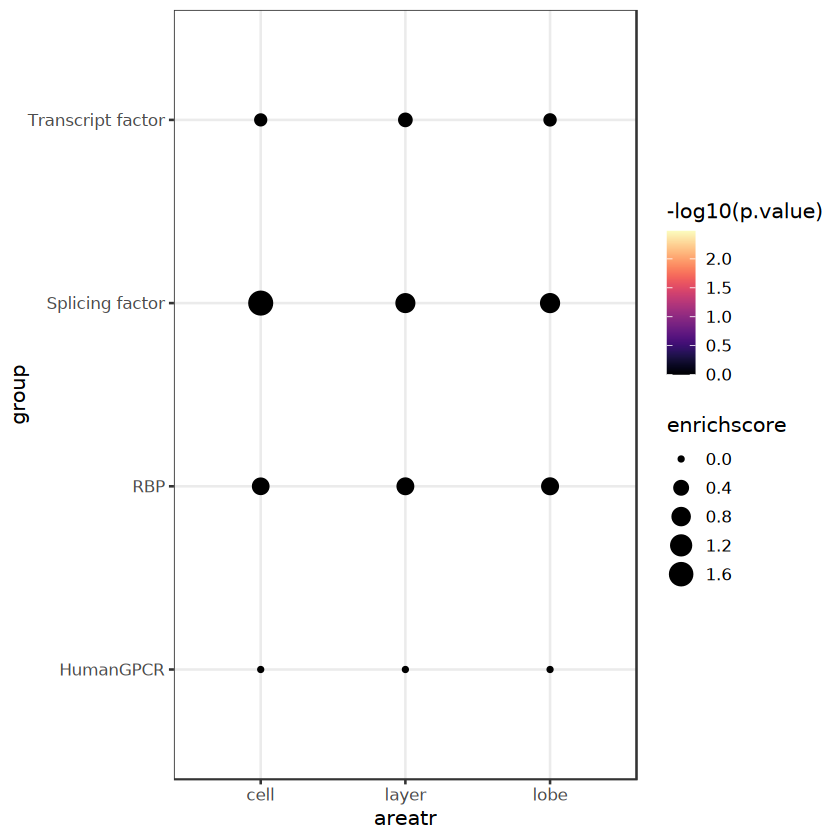

In [982]:
FishEnrich = function(geneset,funcset,total_genen){
    drugovl = intersect(unique(funcset),geneset)
    geneset_size <- length(geneset)    # 感兴趣的基因集大小
    functional_category_size <- length(unique(funcset))  # 特定功能类别中的基因总数
    both <- length(drugovl)  # 两个集合都包含的基因数量
    total_genes <- 20000  # 整个基因组中的基因总数

    contingency_table <- matrix(c(both, geneset_size - both, 
                              functional_category_size - both, 
                              total_genes - (geneset_size + functional_category_size - both)), 
                            nrow = 2)

    # 进行Fisher精确检验
    fisher_test_result <- fisher.test(contingency_table)
    # 输出p值
    p_value <- fisher_test_result$p.value

    # 计算富集分数（Enrichment Ratio），这通常是感兴趣的基因集中具有特定功能的基因比例与整个基因组中该功能基因比例的比值
    enrichment_ratio <- (both / geneset_size) / (functional_category_size / total_genes)
    res = data.frame("p.value" = p_value,"enrichscore" = enrichment_ratio)
    return(res)
}

goana = NULL
for(i in 1:length(hubgenels)){
    hubgenei = hubgenels[[i]]
    res.rbp = FishEnrich(hubgenei,rbpgene,20000)
    res.rbp$group = "RBP"
    res.spf = FishEnrich(hubgenei,spgene,20000)
    res.spf$group = "Splicing factor"
    res.tf = FishEnrich(hubgenei,tfgene,20000)
    res.tf$group = "Transcript factor"
    res.hp = FishEnrich(hubgenei,unlist(all_sheets[,1]),20000)
    res.hp$group = "HumanGPCR"
    goanai = rbind(res.rbp,res.spf,res.tf,res.hp)
    goanai$areatr = names(hubgenels)[i]
    goana = rbind(goana,goanai)
}


In [988]:
intersect(hubgenels[[i]],unlist(all_sheets[,1]))

character(0)

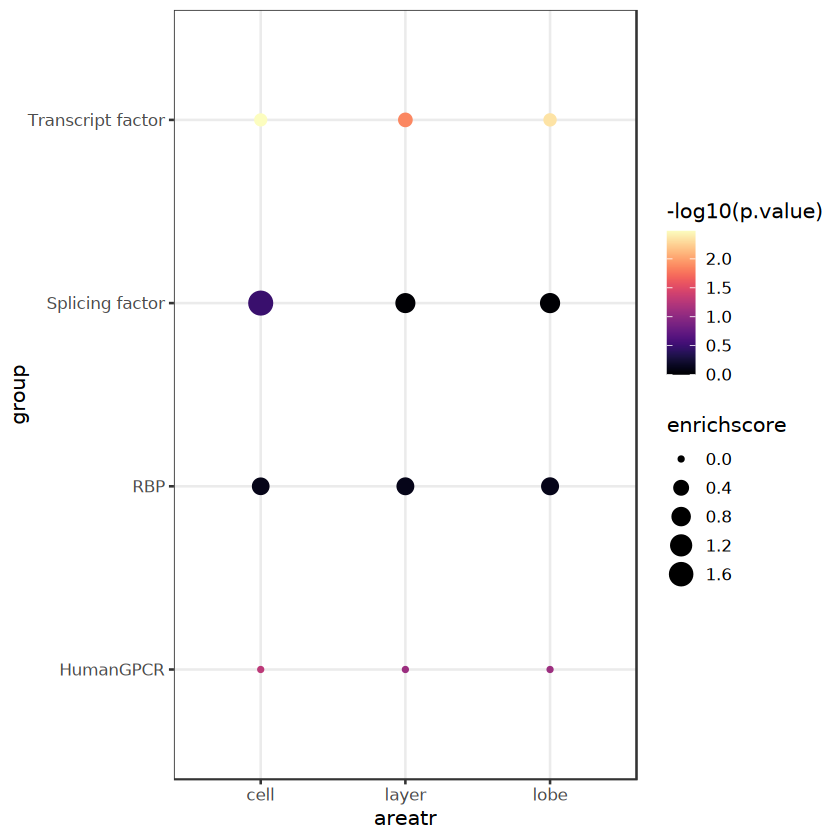

In [983]:
ph = ggplot(goana,aes(x = areatr,y = group, color = -log10(p.value),size = enrichscore)) + geom_point() + theme_bw() + 
scale_color_viridis(option = "A")
ph
ggexport(ph,filename = "result/figure4/subclass_dtu_enrich_analysis_24_09_17.pdf",width = 8,height = 4)

`summarise()` has grouped output by 'areatr1', 'areatr2', 'gene_id'. You can
override using the `.groups` argument.


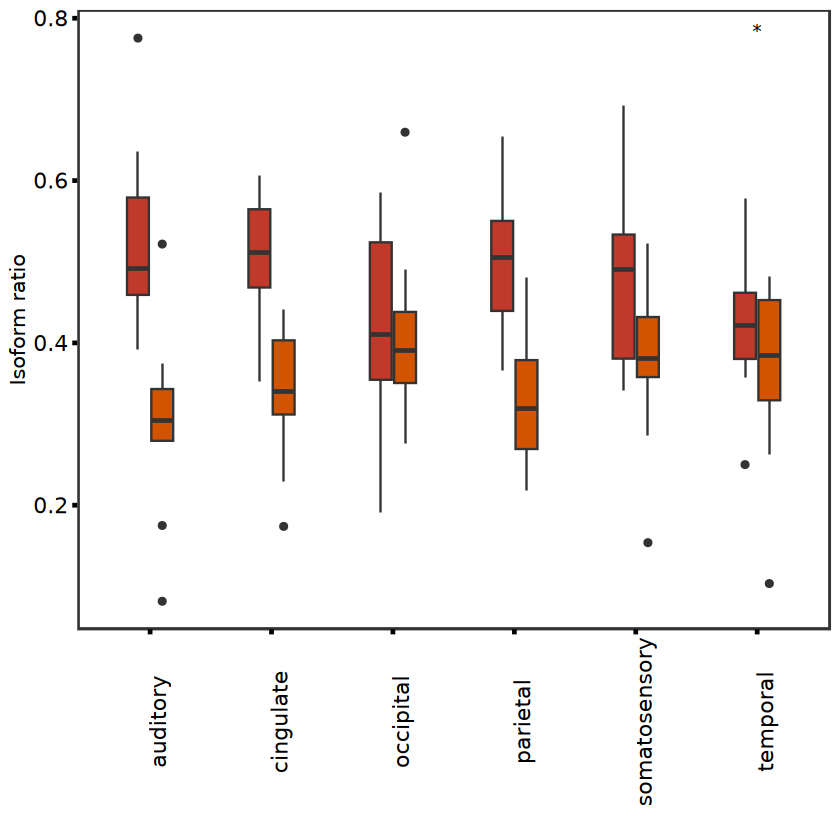

In [408]:
caseg = "CAPRIN1"
#hubtrans = c('SRSF5-WeiLab-1','XM_005561612.2')
#hubtrans = c('SRSF5-WeiLab-1')
fsraw.cor$areatr2 = fsraw.cor$subclass
fsraw.cor$areatr1 = fsraw.cor$lobe
countn = 20
CaseBoxPlot = function(fsraw.cor,caseg,hubtrans,countn = 10){
    fsraw.cor.hub = fsraw.cor[fsraw.cor$gene_id %in% caseg,]
    fsraw.cor.hub = fsraw.cor.hub[fsraw.cor.hub$areatr2 != "" & fsraw.cor.hub$areatr1 != "",]
    #fsraw.cor
    
    casect = fsraw.cor.hub %>% group_by(areatr1,areatr2,gene_id) %>% 
                mutate(layercount = length(readid)) %>% 
                group_by(areatr1,gene_id) %>% 
                mutate(layerrate = layercount/length(readid))

    casect = casect %>% group_by(areatr1,areatr2,gene_id,transcript_id) %>% 
                summarise(count = length(readid),layerrate = layerrate[1]) %>% 
                group_by(areatr1,areatr2,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount,layerrate = layerrate[1])
    casect = casect[casect$transcript_id %in% hubtrans,]

    casect = casect[casect$genecount > countn,]
    pbox1 = ggplot(casect,aes(x = areatr1,y = rate,fill = transcript_id)) +
      #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
      geom_boxplot(width=0.4,size=0.5) +
      #geom_jitter(shape=21,size=1,width=0.05) +
        stat_compare_means(data = casect[casect$transcript_id == hubtrans[1],],
                           aes(x = areatr1,y = rate),
                           label = "p.signif", method = "t.test",hide.ns = T,ref.group = ".all.")  +
      theme_bw()+
      theme(panel.grid = element_blank(),legend.position = "none",
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
      scale_fill_flatui() + ylab("Isoform ratio") + xlab("")
    pbox1
return(pbox1)
}
caseg = "SRSF5"
hubtrans = c('SRSF5-WeiLab-1','XM_005561612.2')
#hubtrans = c('SRSF5-WeiLab-1')
fsraw.cor$areatr2 = fsraw.cor$subclass
fsraw.cor$areatr1 = fsraw.cor$lobe
countn = 20
CaseBoxPlot(fsraw.cor,caseg,hubtrans,countn)

In [ ]:
'AKAP9''ANKS1B''APOE''CAMK2B''CUTA''ENSA''KCNA6''MYL6B''NDUFS7''NKIRAS1''OSBPL1A''POLR2I''POLR3H''SLC25A3''TCEA2''TENM2''TPM3''UBQLN1'
'LOC101925770''MEA1''NDUFA12''NDUFB9''RPS21'

In [ ]:
caseg = "NDUFA12"
#hubtrans = c('SRSF5-WeiLab-1','XM_005561612.2')
#unique(transtf[transtf$sig == "Y" & transtf$subclass == celli,c("gene_id","lobe")])
#caseg = c("LOC101866646","DBNDD2","RNASE1","RAB28")
#isosigi = isosigls$lobe
isosigi = isosigls$subclass
#isosigi = isosigi[isosigi$sig != "N",]
hubtrans = unique(isosigi$transcript_id)
#isosigi = isosigi[isosigi$sig != "N",]
#fsraw.cor.hub = fsraw.cor[fsraw.cor$subclass == celli,]
fsraw.cor.hub = fsraw.cor
fsraw.cor.hub$areatr2 = fsraw.cor.hub$subclass
fsraw.cor.hub$areatr1 = fsraw.cor.hub$layer
isosigi = isosigi[isosigi$transcript_id %in% hubtrans,]
plt = CasePiePlotSCmp(fsraw.cor.hub,isosigi,caseg,10)
plt

countn = 10
pbc = CaseBoxPlot(fsraw.cor.hub,caseg,hubtrans,countn)
pbc

`summarise()` has grouped output by 'areatr1', 'areatr2', 'gene_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'areatr1', 'areatr2', 'gene_id'. You can
override using the `.groups` argument.


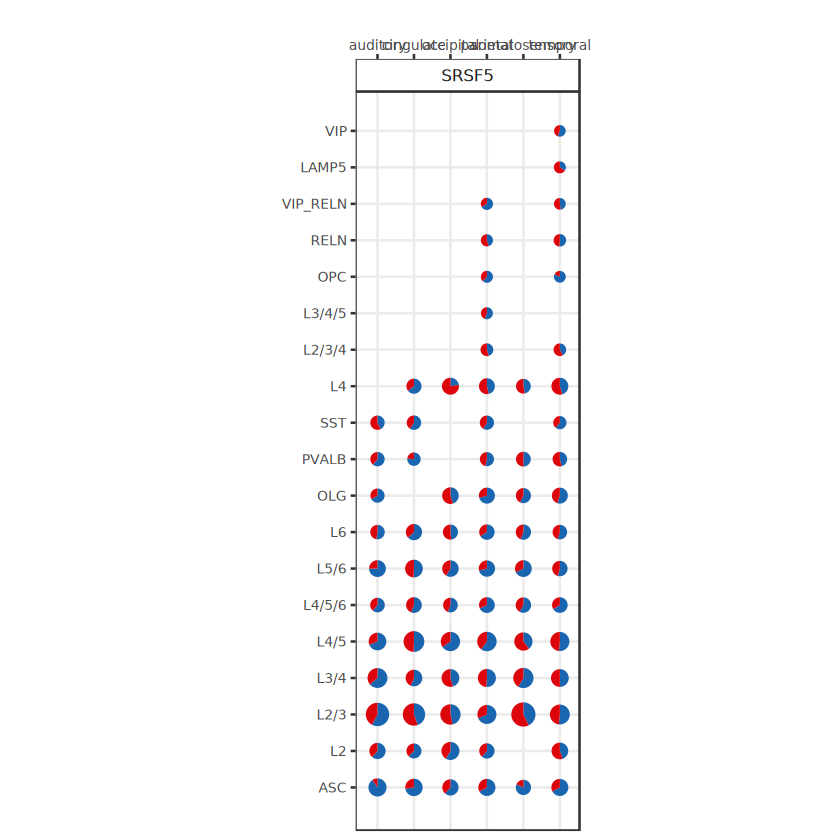

`summarise()` has grouped output by 'areatr1', 'areatr2', 'gene_id'. You can
override using the `.groups` argument.


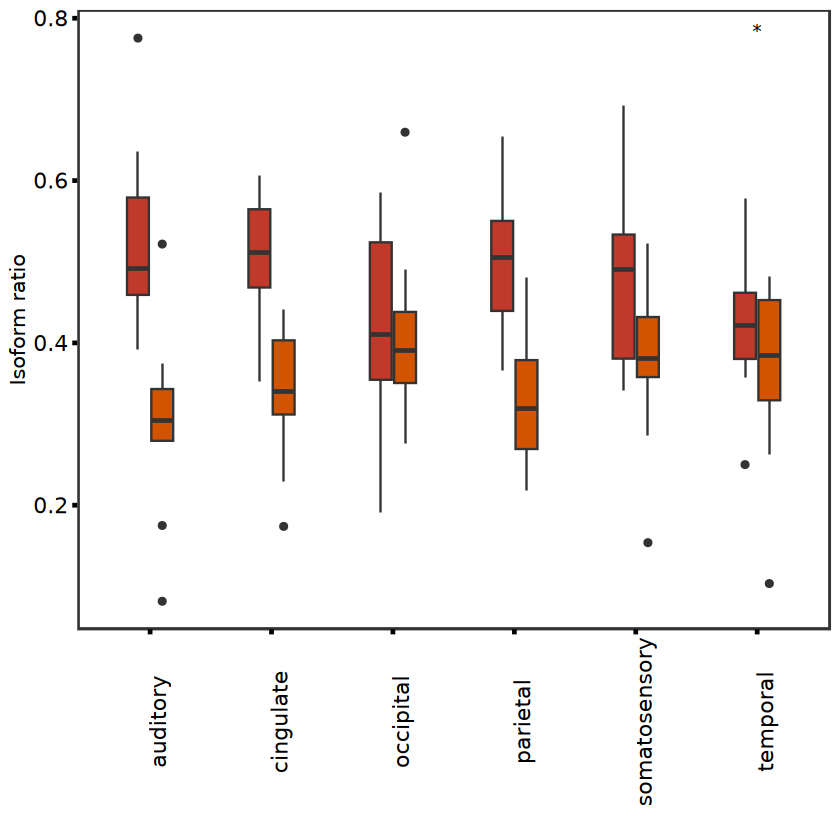

`summarise()` has grouped output by 'areatr1', 'areatr2', 'gene_id'. You can
override using the `.groups` argument.
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"


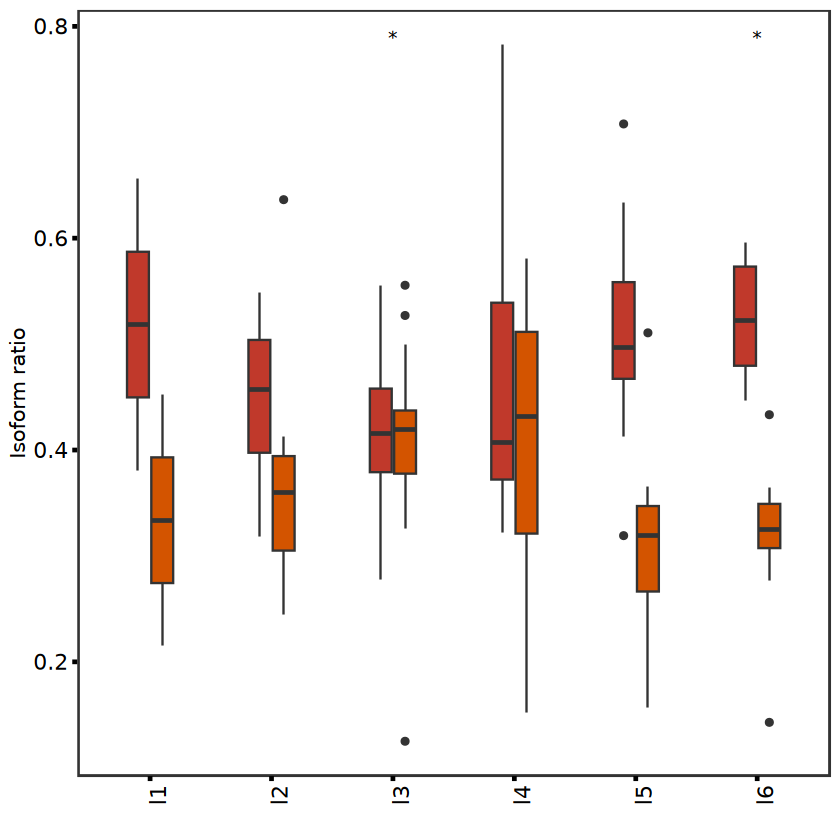

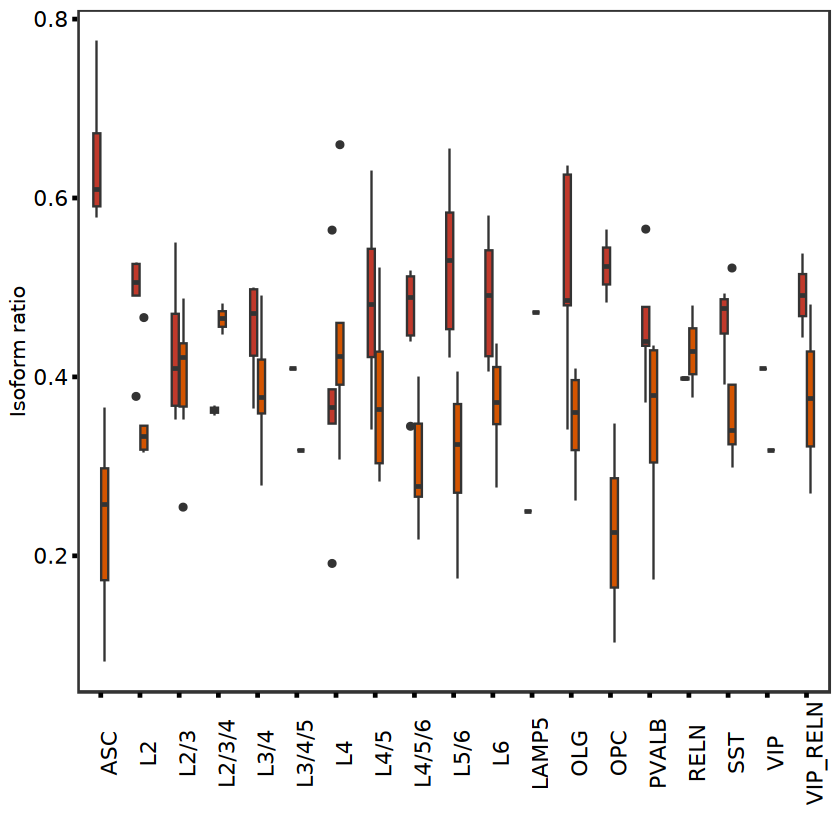

In [683]:
caseg = c("SRSF5")
#unique(transtf[transtf$sig == "Y" & transtf$subclass == celli,c("gene_id","lobe")])
#caseg = c("LOC101866646","DBNDD2","RNASE1","RAB28")
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$sig != "N" & isosigi$gene_id %in% caseg,]
hubtrans = unique(isosigi$transcript_id)
#isosigi = isosigi[isosigi$sig != "N",]
#fsraw.cor.hub = fsraw.cor[fsraw.cor$subclass == celli,]
fsraw.cor.hub = fsraw.cor
fsraw.cor.hub$areatr2 = fsraw.cor.hub$subclass
fsraw.cor.hub$areatr1 = fsraw.cor.hub$lobe
isosigi = isosigi[isosigi$transcript_id %in% hubtrans,]
plt = CasePiePlotSCmp(fsraw.cor.hub,isosigi,caseg,20)
plt

countn = 20
pbc = CaseBoxPlot(fsraw.cor,caseg,hubtrans,countn)
pbc

fsraw.cor.hub$areatr2 = fsraw.cor.hub$subclass
fsraw.cor.hub$areatr1 = fsraw.cor.hub$layer
countn = 20
pbc = CaseBoxPlot(fsraw.cor.hub,caseg,hubtrans,countn)
pbc

fsraw.cor.hub$areatr2 = fsraw.cor.hub$lobe
fsraw.cor.hub$areatr1 = fsraw.cor.hub$subclass
countn = 20
pbc = CaseBoxPlot(fsraw.cor.hub,caseg,hubtrans,countn)
pbc

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 694 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 614 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 12 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 12 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 18 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 4 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 21 rows containing missing values or values outside the scale range
(

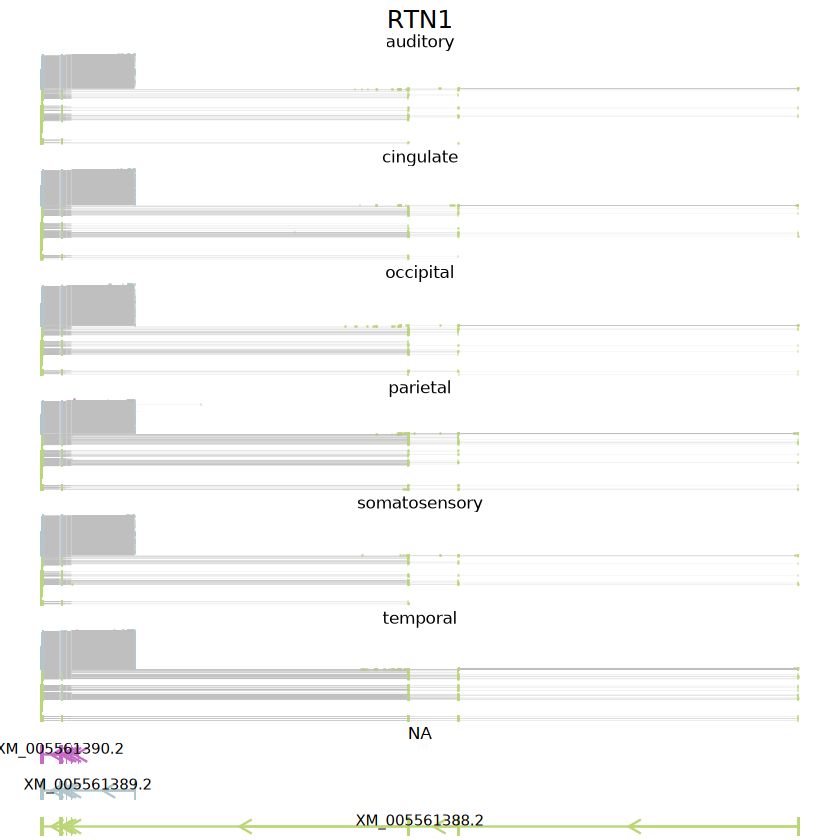

In [702]:
fsraw.cor$areatr = fsraw.cor$lobe
genei = "RTN1"
grtdfl = BuildPlotBed(fsraw.cor,longbed,"lobe",genei,NULL)
pi = IsoformReadPlot(gtf, grtdfl, genei, onlyhub = T)
pi

## Module case stat

### Module1 ASC layer1

In [37]:
isosigi = isosigls$layer
isosigi[isosigi$gene_id == "IDH3B",]

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
18732,IDH3B,XM_005568512.1,l1,185,497,0.3722334,0.3779349,0.3790752,-0.006841847,N,8.523208e-42,1.914313e-39
18733,IDH3B,XM_005568512.1,l2,390,896,0.4352679,0.3779349,0.3664684,0.068799501,N,8.523208e-42,1.914313e-39
18734,IDH3B,XM_005568512.1,l3,2248,5411,0.4154500,0.3779349,0.3704319,0.045018084,N,8.523208e-42,1.914313e-39
18735,IDH3B,XM_005568512.1,l4,457,1027,0.4449854,0.3779349,0.3645248,0.080460546,N,8.523208e-42,1.914313e-39
18736,IDH3B,XM_005568512.1,l5,766,2444,0.3134206,0.3779349,0.3908378,-0.077417181,N,8.523208e-42,1.914313e-39
18737,IDH3B,XM_005568512.1,l6,608,2124,0.2862524,0.3779349,0.3962715,-0.110019103,Down,8.523208e-42,1.914313e-39
18738,IDH3B,XM_005568513.1,l1,302,497,0.6076459,0.5905234,0.5870990,0.020546918,N,8.523208e-42,1.914313e-39
18739,IDH3B,XM_005568513.1,l2,481,896,0.5368304,0.5905234,0.6012621,-0.064431704,N,8.523208e-42,1.914313e-39
18740,IDH3B,XM_005568513.1,l3,2942,5411,0.5437073,0.5905234,0.5998867,-0.056179417,N,8.523208e-42,1.914313e-39


In [62]:
#stat plot
library(scatterpie)
caseg = c("CD47",'NTRK2',"TPM3","DDRGK1","ARPP19","DBNDD2","IDH3B")
#caseg = c("LOC102141554","CAMTA1","NTRK2","GPM6B","MYL6")
isosigi = isosigls$layer
isosigi = isosigi[isosigi$sig != "N",]
transsig = c("XM_015452432.1","NM_001283415.1","XM_005541217.2","XR_001492897.1", "XM_005541701.2","XM_005541710.2",
             'XM_005570477.2','XM_005570483.2',' NM_001284070.1','XM_005541713.2',"XM_005548232.2","XM_005548234.2",
             unique(isosigi[isosigi$sig != "N" & isosigi$gene_id %in% caseg,]$transcript_id))
# isosigi = isosigls$subclass
fsraw.cor.hub = fsraw.cor[fsraw.cor$gene_id %in% caseg & fsraw.cor$transcript_id %in% transsig,]
fsraw.cor.hub = fsraw.cor.hub[fsraw.cor.hub$subclass != "",]

casect = fsraw.cor.hub %>% group_by(layer,subclass,gene_id) %>% 
                mutate(layercount = length(readid)) %>% 
                group_by(layer,gene_id) %>% 
                mutate(layerrate = layercount/length(readid))

casect = casect %>% group_by(layer,subclass,gene_id,transcript_id) %>% 
                summarise(count = length(readid),layerrate = layerrate[1]) %>% 
                group_by(layer,subclass,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount,layerrate = layerrate[1])

casect.total = fsraw.cor.hub %>% group_by(layer,gene_id) %>% 
                mutate(layercount = length(readid)) %>% 
                group_by(layer,gene_id) %>% 
                mutate(layerrate = layercount/length(readid))
casect.total = casect.total %>% group_by(layer,gene_id,transcript_id) %>% 
                summarise(count = length(readid),layerrate = layerrate[1]) %>% 
                group_by(layer,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount,layerrate = layerrate[1])
casect.total$subclass = "Total"
casect.total$layerrate = 0.3
casect = rbind(casect,casect.total)
# casect = casect[casect$transcript_id %in% isosigi$transcript_id,]
casect = casect[casect$genecount > 10 & casect$layerrate > 0.01,]
casect = casect %>% group_by(gene_id) %>% mutate(id = as.character(as.numeric(as.factor(transcript_id))))
idn = max(as.numeric(casect$id))
casect$gene_tran = paste0(casect$gene_id,"-",casect$id)
casect = casect[casect$subclass != "",]
casectl = dcast(casect,layer+subclass+gene_id+layerrate~id,value.var = "rate")
casectl$group = paste0(casectl$layer,"-",casectl$subclass,"-",casectl$gene_id)
casectl[is.na(casectl)] = 0
#casectl
casectl$layerid = as.numeric(factor(casectl$layer,levels = paste0("l",1:6)))
cellanf = cellan[order(cellan$class,cellan$subclass),]
cellanf = cellanf[cellanf$subclass %in% casectl$subclass,] 

celllevel = c(suborder[suborder %in% cellanf$subclass],"Total")
casectl$subclassid = as.numeric(factor(casectl$subclass,levels = celllevel))
unique(casectl$subclass)

library(patchwork)
casectl$gene_id = factor(casectl$gene_id,levels = caseg)

#casectl = merge(casectl,cellan,by = "subclass")


`summarise()` has grouped output by 'layer', 'subclass', 'gene_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'layer', 'gene_id'. You can override using
the `.groups` argument.


[1] "ASC"      "L2"       "L4/5/6"   "RELN"     "Total"    "VIP_RELN"
 [7] "L2/3"     "L2/3/4"   "L3/4"     "L4"       "L4/5"     "L5/6"    
[13] "L6"       "OLG"      "OPC"      "PVALB"    "SST"      "VIP"     
[19] "L3/4/5"   "LAMP5"

file saved to result/figure4/case_layer_isoform_rate_stat_pie_ASC_layer1_25_12_04.pdf



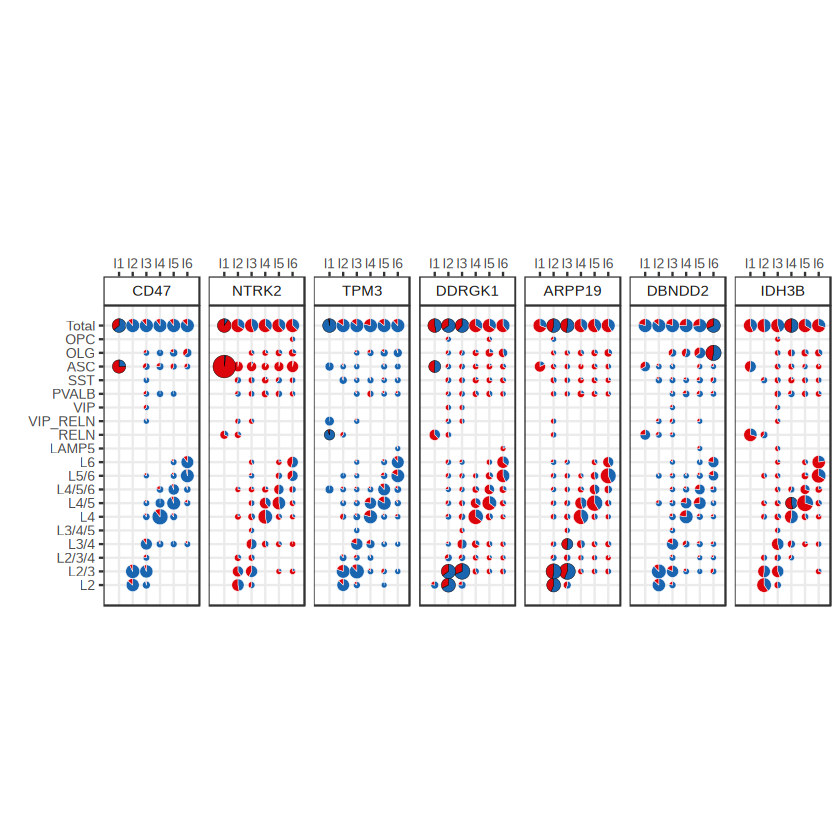

In [64]:
casectl$sig = 'N'
casectl$siggroup = paste0(casectl$gene_id,"-",casectl$layer,"-",casectl$subclass)
casectl[casectl$siggroup %in% c("CD47-l1-Total","CD47-l1-ASC",
                                "NTRK2-l1-Total","NTRK2-l1-ASC",
                                "TPM3-l1-Total","TPM3-l1-RELN","TPM3-l1-LAMP5",
                                "DDRGK1-l1-Total","DDRGK1-l2-Total","DDRGK1-l3-Total",
                                "DDRGK1-l1-ASC","DDRGK1-l2-L2","DDRGK1-l2-L2/3","DDRGK1-l3-L2/3",
                                "ARPP19-l2-Total","ARPP19-l3-Total",
                                "ARPP19-l2-L2","ARPP19-l2-L2/3","ARPP19-l3-L2/3","ARPP19-l3-L3/4",
                                "DBNDD2-l6-Total","DBNDD2-l6-OLG","IDH3B-l4-L4/5","IDH3B-l4-Total"),]$sig = "Y"
casectl$alpha = 0
casectl[casectl$sig == "Y",]$alpha = 0.5

plt = ggplot(data = casectl,aes(x = layerid, y = subclassid)) + 
      #geom_tile(aes(alpha = alpha),fill = "#c1fba4") +
      geom_scatterpie(data = casectl,
                      aes(x = layerid, y = subclassid, group = group, color = sig,
                          r = layerrate+0.2),linewidth = 0.1,
                      #color = NA,
                      cols=colnames(casectl)[5:(5+idn -1 )]) + 
      scale_size( range = c(0.5, 1)) +
      facet_wrap(~gene_id,nrow = 1) +
      # geom_histogram(data = root_sprn,aes(mean.model),bins = 100) +
      coord_fixed() +
      scale_x_continuous(breaks = c(1:6),labels = paste0("l",1:6),position = "top")+
      scale_y_continuous(breaks = c(1:length(unique(casectl$subclass))),labels = celllevel)+
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") + 
      scale_color_manual(values = c("N" = "white","Y" = "black")) +
      scale_fill_discreterainbow() +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",panel.grid.minor = element_blank(),
                         axis.text = element_text(size = 8),
                        strip.background =element_rect(fill="white"))
plt

ggexport(plt,filename = "result/figure4/case_layer_isoform_rate_stat_pie_ASC_layer1_25_12_04.pdf",width = 7,height = 4)

In [76]:
backpt = qread("longread_cell_isoform_without_subcortical_24_04_29.qs")

In [160]:
geneex = "NTRK2"
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$gene_id == geneex,]
unique(isosigi$transcript_id)
unique(fsraw.cor$lobe)

[1] "XM_005582045.2" "XM_005582049.2" "XM_005582051.2"

[1] "temporal"      "somatosensory" "auditory"      "cingulate"    
[5] "occipital"     "parietal"

In [198]:
# 安装并加载RColorBrewer包（如果尚未安装）
library(RColorBrewer)
library(grDevices)
# 假设你的数据框如下

# 获取唯一的细胞大类
classes <- unique(cellan$class) 
subclasses <- unique(cellan$subclass)

subclass_color_map <- setNames(rainbow(23), subclasses)
# 假设每个class下的subclass数量
class_subcounts <- table(cellan$class)
#namesclass_subcounts
# 为每个class生成不同的颜色渐变
#cellan_cl
for (i in 1:length(names(class_subcounts))) {
  class = names(class_subcounts)[i]
  # 定义起始和结束颜色，可以自定义
  start_color <- "white"
  end_color <- rainbow(3)[i]
  color_palette <- colorRampPalette(c(start_color,end_color))(class_subcounts[class]+1)
  cellan[cellan$class == class,]$color <- color_palette[-1]
}
cellan

,subclass,class,color
,<chr>,<chr>,<chr>
1,L2,GLU,#E5FFE5
12,L2/3,GLU,#CCFFCC
37,L2/3/4,GLU,#B2FFB2
42,L3/4,GLU,#99FF99
61,L3/4/5,GLU,#7FFF7F
62,L4,GLU,#65FF65
72,L4/5,GLU,#4CFF4C
90,L4/5/6,GLU,#32FF32
104,L5/6,GLU,#19FF19


In [28]:
pref = qread("../ref/area_figure_an.qs")
edgesdf = pref$layer
edgesdf = edgesdf[edgesdf$areaid %in% paste0("l",1:6),]
head(edgesdf)

,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,areaid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1385,7285,15438,46436,64705,46518,64693,46540.49,65132.87,46469.34,64646.63,0,0,l1
1386,16616,14951,46175,64676,46269,64674,46231.50,65121.50,46222.69,64707.37,0,0,l1
1387,33735,16616,46030,64696,46175,64676,46208.15,65451.96,46115.36,64779.21,0,0,l1
1388,3003,20924,46995,64656,46782,64591,46877.42,64659.80,46837.73,64789.86,0,0,l1
1389,4687,20924,46649,64706,46782,64591,46837.73,64789.86,46793.15,64738.31,0,0,l1
1390,32454,32318,47230,64665,47072,64696,47156.98,64710.96,47480.06,66357.65,0,0,l1


In [29]:
#case1 MYL6
geneex = "DDRGK1" 
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$gene_id == geneex & isosigi$sig != "N",]
unique(isosigi$transcript_id)
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
mkdf = mkdf[mkdf$transcript_id %in% isosigi$transcript_id & mkdf$subclass != "",]
#head(mkdf)
mkdf.zoom = mkdf
#mkdf.zoom = mkdf[mkdf$lobe != "",]
backpt.zoom = backpt[backpt$x < max(mkdf.zoom$x) & backpt$x > min(mkdf.zoom$x) &
                     backpt$y < max(mkdf.zoom$y) & backpt$y > min(mkdf.zoom$y),]
# cellanf = cellan[cellan$subclass %in% mkdf.zoom$subclass,]
# mycolor = cellanf$color; names(mycolor) = cellanf$subclass
mkdf.zoom$subclass = factor(mkdf.zoom$subclass,levels = suborder)
edgesdf.zoom = edgesdf[edgesdf$x1 < max(mkdf.zoom$x) & edgesdf$x1 > min(mkdf.zoom$x) &
                       edgesdf$y1 < max(mkdf.zoom$y) & edgesdf$y1 > min(mkdf.zoom$y),]

[1] "DDRGK1-WeiLab-1" "XM_005568473.2"

In [10]:
cellan[cellan$class == "GLU",]$subclass
#backpt.zoom[backpt.zoom$subclass %in% cellan[cellan$class == "GLU",]$subclass,]

[1] "L2"     "L2/3"   "L2/3/4" "L3/4"   "L3/4/5" "L4"     "L4/5"   "L4/5/6"
 [9] "L5/6"   "L6"

file saved to result/figure4/DDRGK1_layer_GLU_case_spatial_25_04_11.pdf



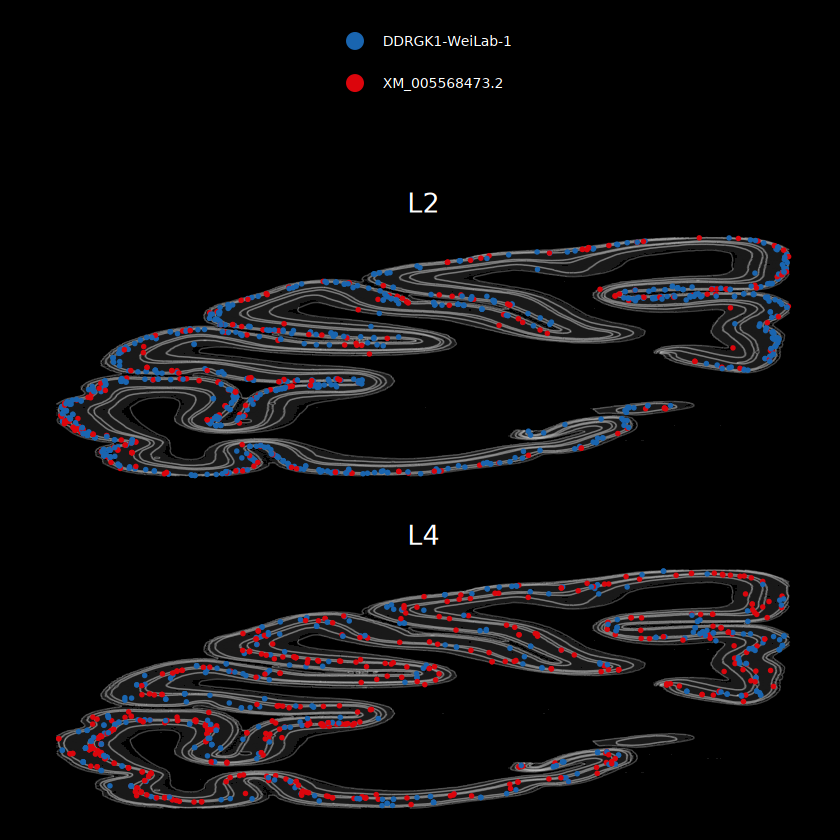

In [30]:
pmkpti1 = ggplot() +
      scattermore::geom_scattermore(
        data = backpt.zoom[,-5],
        aes(x,y),
        color = "white",
        # pixels = raster.dpi,
        pointsize = 0.1
      ) +
      geom_segment(data = edgesdf.zoom, aes(x = x1, y = y1, xend = x2, yend = y2),color = "white",
                   size = 0.3,alpha = 0.25) + 
      geom_point(data = mkdf.zoom[mkdf.zoom$subclass %in% c("L2","L4"),],
                 aes(x,y,color = transcript_id),size = 0.5) + 
     # scale_size(range = c(0.05,0.1)) +
      facet_wrap(~subclass,ncol = 1) +
      theme_void() +
      scale_color_discreterainbow() +
      #scale_color_manual(values = mycolor) +
    #scale_shape_manual(values=c(3, 13))+
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = guide_legend(override.aes = list(size=4),
                                  nrow = 3),
            size = "none") +
      scale_y_reverse() + scale_x_reverse()
pmkpti1


In [32]:
ggexport(pmkpti1,filename = "result/figure4/DDRGK1_layer_GLU_case_spatial_25_04_11.pdf",width = 3,height = 9)

file saved to result/figure4/DDRGK1_layer_GLU_case_spatial_25_04_11.pdf



### OLG and l6

Warning message:
"package 'scatterpie' was built under R version 4.3.3"
scatterpie v0.2.4 Learn more at https://yulab-smu.top/

Please cite:

D Wang, G Chen, L Li, S Wen, Z Xie, X Luo, L Zhan, S Xu, J Li, R
Wang, Q Wang, G Yu. Reducing language barriers, promoting information
absorption, and communication using fanyi. Chinese Medical Journal. 2024,
137(16):1950-1956. doi: 10.1097/CM9.0000000000003242



Attaching package: 'scatterpie'


The following object is masked from 'package:sp':

    recenter


Warning message:
"package 'patchwork' was built under R version 4.3.2"
`summarise()` has grouped output by 'areatr', 'subclass', 'gene_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'areatr', 'gene_id'. You can override using
the `.groups` argument.
file saved to result/figure5/case_layer_isoform_rate_stat_pie_OLG_L6_layer6_24_09_24.pdf



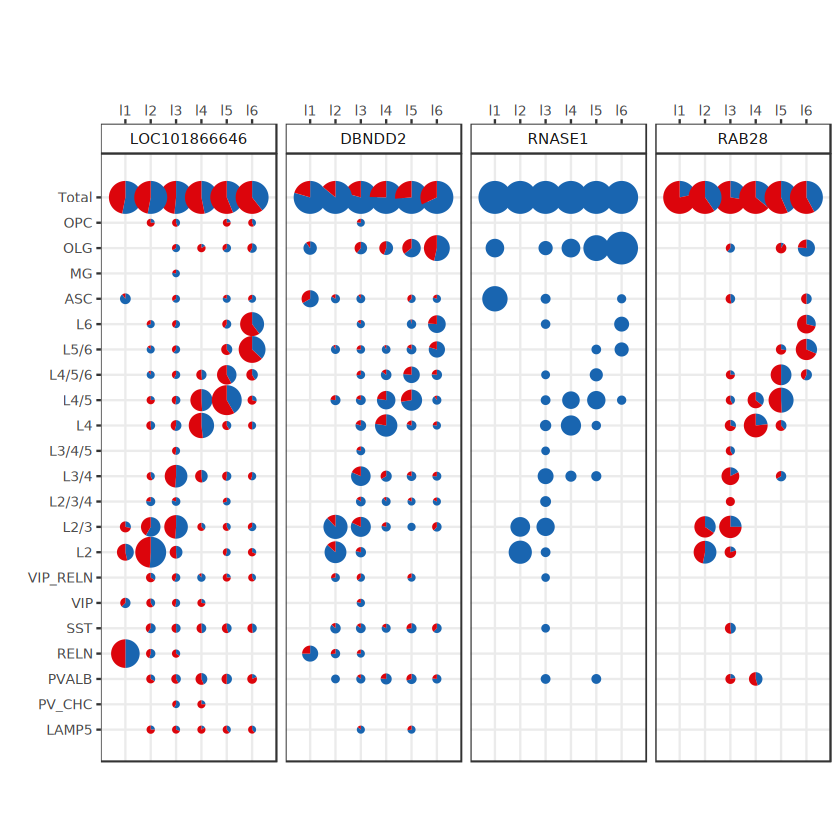

In [29]:
#stat plot
library(scatterpie)
library(patchwork)
#caseg = c("DCLK1","GMFG","IDH3B","MICALL1","DBNDD2","CDC42")

CasePiePlotSub = function(fsraw.cor,isosigi,caseg,countn){
    fsraw.cor.hub = fsraw.cor[fsraw.cor$gene_id %in% caseg,]
    fsraw.cor.hub = fsraw.cor.hub[fsraw.cor.hub$subclass != "",]
    
    casect = fsraw.cor.hub %>% group_by(areatr,subclass,gene_id) %>% 
                mutate(layercount = length(readid)) %>% 
                group_by(areatr,gene_id) %>% 
                mutate(layerrate = layercount/length(readid))

    casect = casect %>% group_by(areatr,subclass,gene_id,transcript_id) %>% 
                summarise(count = length(readid),layerrate = layerrate[1]) %>% 
                group_by(areatr,subclass,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount,layerrate = layerrate[1])

    casect.total = fsraw.cor.hub %>% group_by(areatr,gene_id) %>% 
                mutate(layercount = length(readid)) %>% 
                group_by(areatr,gene_id) %>% 
                mutate(layerrate = layercount/length(readid))
    casect.total = casect.total %>% group_by(areatr,gene_id,transcript_id) %>% 
                summarise(count = length(readid),layerrate = layerrate[1]) %>% 
                group_by(areatr,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount,layerrate = layerrate[1])
    casect.total$subclass = "Total"
    casect.total$layerrate = 0.5
    casect = rbind(casect,casect.total)
    casect = casect[casect$transcript_id %in% isosigi$transcript_id,]
    casect = casect[casect$genecount > countn,]
    casect = casect %>% group_by(gene_id) %>% mutate(id = as.character(as.numeric(as.factor(transcript_id))))
    idn = max(as.numeric(casect$id))
    casect$gene_tran = paste0(casect$gene_id,"-",casect$id)
    casect = casect[casect$subclass != "",]
    casectl = dcast(casect,areatr+subclass+gene_id+layerrate~id,value.var = "rate")
    casectl$group = paste0(casectl$areatr,"-",casectl$subclass,"-",casectl$gene_id)
    casectl[is.na(casectl)] = 0
#casectl
    casectl = casectl[order(casectl$areatr),]
    casectl$areatrid = as.numeric(factor(casectl$areatr,levels = unique(casectl$areatr)))
    cellanf = cellan[order(cellan$class,cellan$subclass),]
    cellanf = cellanf[cellanf$subclass %in% casectl$subclass,] 

    celllevel = c(unique(cellanf$subclass),"Total")
    casectl$subclassid = as.numeric(factor(casectl$subclass,levels = celllevel))
    #unique(casectl$subclass)

    casectl$gene_id = factor(casectl$gene_id,levels = caseg)
    #casectl = merge(casectl,cellan,by = "subclass")
    plt = ggplot() + 
      geom_scatterpie(data = casectl,
                      aes(x = areatrid, y = subclassid, group = group, r = layerrate + 0.15),color=NA,
                      cols=colnames(casectl)[5:(5+idn -1 )]) + 
      #scale_size( range = c(0.5, 1)) +
      facet_wrap(~gene_id,nrow = 1) +
      # geom_histogram(data = root_sprn,aes(mean.model),bins = 100) +
      coord_fixed() +
      scale_x_continuous(breaks = c(1:length(unique(casectl$areatr))),labels = unique(casectl$areatr),position = "top")+
      scale_y_continuous(breaks = c(1:length(unique(casectl$subclass))),labels = celllevel)+
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") + 

      scale_fill_discreterainbow() +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",panel.grid.minor = element_blank(),
                         axis.text = element_text(size = 8),
                        strip.background =element_rect(fill="white"))
    return(plt)
}
isosigi = isosigls$layer
#isosigi = isosigi[isosigi$count > 50,]
isosigi = isosigi[isosigi$sig != "N",]
caseg = c("LOC101866646","DBNDD2","RNASE1","RAB28")
fsraw.cor$areatr = fsraw.cor$layer
plt = CasePiePlotSub(fsraw.cor,isosigi,caseg,10)
plt
ggexport(plt,filename = "result/figure5/case_layer_isoform_rate_stat_pie_OLG_L6_layer6_24_09_24.pdf",width = 6,height = 4)

[1] "XM_005582024.2" "XM_005582026.2"

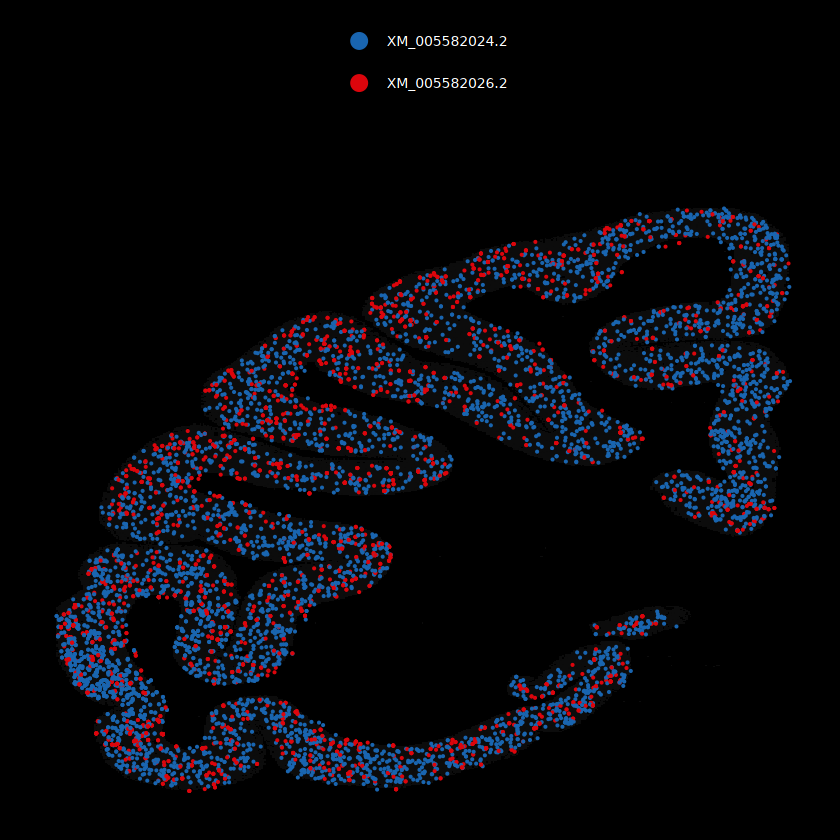

In [414]:
#case1 MYL6
geneex = "UBQLN1"
isosigi = isosigls$lobe
isosigi = isosigi[isosigi$gene_id == geneex & isosigi$sig != "N",]
unique(isosigi$transcript_id)
mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
mkdf = mkdf[mkdf$transcript_id %in% isosigi$transcript_id,]
#head(mkdf)
#mkdf.zoom = mkdf[mkdf$region == "PEa",]
mkdf.zoom = mkdf[mkdf$lobe == "cingulate" & mkdf$region != "v23b",]
mkdf.zoom = mkdf[mkdf$lobe != "",]
backpt.zoom = backpt[backpt$x < max(mkdf.zoom$x) & backpt$x > min(mkdf.zoom$x) &
                     backpt$y < max(mkdf.zoom$y) & backpt$y > min(mkdf.zoom$y),]
cellanf = cellan[cellan$subclass %in% mkdf.zoom$subclass,]
mycolor = cellanf$color; names(mycolor) = cellanf$subclass
mkdf.zoom$subclass = factor(mkdf.zoom$subclass,levels = c(cellanf$subclass))

pmkpti1 = ggplot() +
      scattermore::geom_scattermore(
        data = backpt.zoom,
        aes(x,y),
        color = "white",
        # pixels = raster.dpi,
        pointsize = 0.05
      ) +
      # geom_segment(data = edgesdf, aes(x = x1, y = y1, xend = x2, yend = y2),
      #            size = 0.005,color = "white",alpha = 0.25) + 
      geom_point(data = mkdf.zoom,
                 aes(x,y,color = transcript_id),size = 0.1) + 
     # scale_size(range = c(0.05,0.1)) +
      #facet_wrap(~layer,nrow = 2) +
      theme_void() +
      scale_color_discreterainbow() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = guide_legend(override.aes = list(size=4),
                                  nrow = 3),
            size = "none") +
      scale_y_reverse() + scale_x_reverse()
pmkpti1
#ggexport(pmkpti1,filename = "result/figure5/L1_ASC_case_spatial_NTRK2_24_09_23.pdf",width = 6,height = 6)

`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Using the `size` aesthetic in this geom was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` in the `default_aes` field and elsewhere instead."
Warning message:
"Removed 868 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 612 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 21 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 25 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 23 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 66 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 27 rows contain

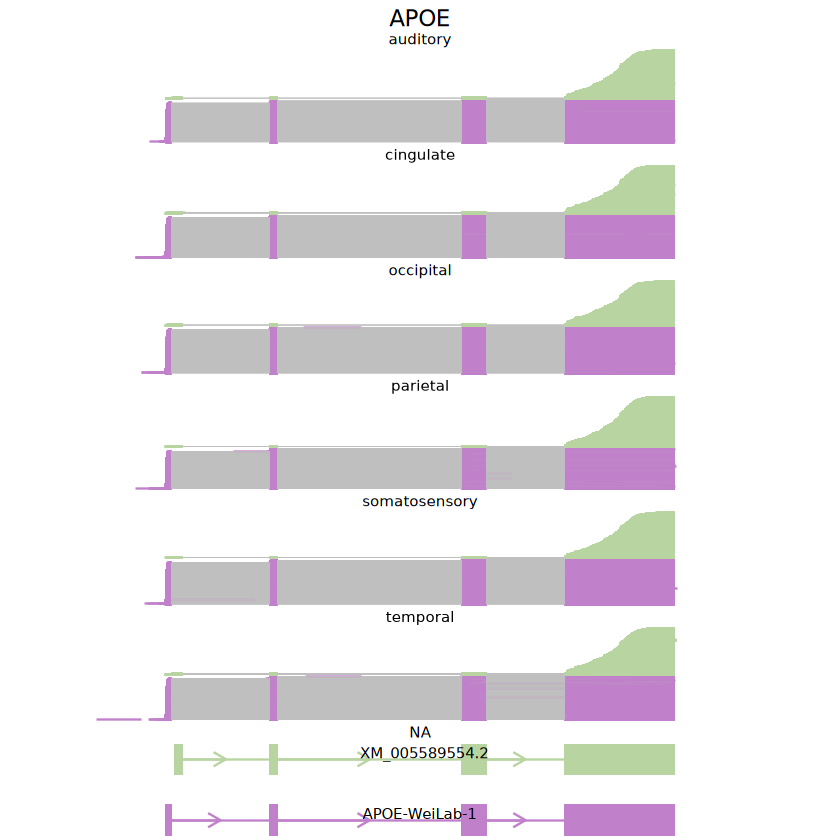

In [45]:
fsraw.cor$areatr = fsraw.cor$lobe
grtdfl = BuildPlotBed(fsraw.cor,longbed,"lobe","APOE",NULL)
pi = IsoformReadPlot(gtf, grtdfl, "APOE",onlyhub = T)
pi

In [454]:
grtdfi = grtdfl[grtdfl$transcript_id == "XM_005582026.2",]
summary(table(grtdfi$readid))
grtdfi = grtdfi %>% group_by(readid) %>% mutate(segnum = n())

Number of cases in table: 1643 
Number of factors: 1 

In [455]:
grtdfi[grtdfi$segnum == 1,]
summary(grtdfi$segnum)

readid,seqnames,start,end,width,strand,score,group,transcript_id,readord,orid,oridnorm,sig,segnum
<chr>,<fct>,<int>,<int>,<int>,<fct>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<int>
0961aca0-eb8f-4d99-9fd6-c5bb962911f6-3;st_ed:A:614-1323;AD:A:adapterD-adapterE;AP:A:Correct_665-689:+,NC_022286.1,94498771,94499407,637,+,60,temporal,XM_005582026.2,XM_005582026.2-0961aca0-eb8f-4d99-9fd6-c5bb962911f6-3;st_ed:A:614-1323;AD:A:adapterD-adapterE;AP:A:Correct_665-689:+,759,0.6646235,black,1
4f22544a-a6fb-4383-b735-b5ff1a8483ef-8;st_ed:A:3688-4388;AD:A:adapterN-adapterO;AP:A:Correct_657-681:+,NC_022286.1,94498781,94499397,617,+,60,cingulate,XM_005582026.2,XM_005582026.2-4f22544a-a6fb-4383-b735-b5ff1a8483ef-8;st_ed:A:3688-4388;AD:A:adapterN-adapterO;AP:A:Correct_657-681:+,259,0.8144654,black,1
4da1ff89-d681-4294-a637-e493834ed251-12;st_ed:A:6856-8858;AD:A:adapterB.rc-adapterA.rc;AP:A:Correct_20-44:-,NC_022286.1,94498783,94500731,1949,-,60,parietal,XM_005582026.2,XM_005582026.2-4da1ff89-d681-4294-a637-e493834ed251-12;st_ed:A:6856-8858;AD:A:adapterB.rc-adapterA.rc;AP:A:Correct_20-44:-,480,0.6307490,black,1
d682c53d-c0a2-454c-a5d3-41b246c03409-4;st_ed:A:1396-2259;AD:A:adapterC-adapterD;AP:A:Correct_820-844:+,NC_022286.1,94501082,94501849,768,+,60,occipital,XM_005582026.2,XM_005582026.2-d682c53d-c0a2-454c-a5d3-41b246c03409-4;st_ed:A:1396-2259;AD:A:adapterC-adapterD;AP:A:Correct_820-844:+,232,0.6535211,black,1
8762b5f3-4b6f-4fa6-abf0-e8a404774d54-8;st_ed:A:5001-5465;AD:A:adapterG-adapterH;AP:A:Correct_421-445:+,NC_022286.1,94501148,94501497,350,-,59,parietal,XM_005582026.2,XM_005582026.2-8762b5f3-4b6f-4fa6-abf0-e8a404774d54-8;st_ed:A:5001-5465;AD:A:adapterG-adapterH;AP:A:Correct_421-445:+,481,0.6320631,black,1
TB2000B122-202403111708120_20240312014500_00821_003394468_11.34-7;st_ed:A:2512-3078;AD:A:adapterO-end;AP:A:Boundary|ts-te:72-540,NC_022286.1,94503420,94503894,475,-,60,parietal,XM_005582026.2,XM_005582026.2-TB2000B122-202403111708120_20240312014500_00821_003394468_11.34-7;st_ed:A:2512-3078;AD:A:adapterO-end;AP:A:Boundary|ts-te:72-540,482,0.6333771,black,1
f76c2216-360d-4f3b-91ae-77a11ce50183-2;st_ed:A:909-1429;AD:A:adapterG.rc-adapterF.rc;AP:A:Correct_22-46:-,NC_022286.1,94503422,94503865,444,+,60,temporal,XM_005582026.2,XM_005582026.2-f76c2216-360d-4f3b-91ae-77a11ce50183-2;st_ed:A:909-1429;AD:A:adapterG.rc-adapterF.rc;AP:A:Correct_22-46:-,760,0.6654991,black,1
0dd75bf4-de39-4f4a-a390-416881a84138-2;st_ed:A:91-637;AD:A:adapterP.rc-adapterO.rc;AP:A:Correct_20-44:-,NC_022286.1,94503422,94503903,482,+,60,occipital,XM_005582026.2,XM_005582026.2-0dd75bf4-de39-4f4a-a390-416881a84138-2;st_ed:A:91-637;AD:A:adapterP.rc-adapterO.rc;AP:A:Correct_20-44:-,233,0.6563380,black,1
d799dc22-f7cd-436f-aa78-06cc366e5753-3;st_ed:A:94-659;AD:A:adapterA-adapterB;AP:A:Correct_520-544:+,NC_022286.1,94503425,94503889,465,-,60,cingulate,XM_005582026.2,XM_005582026.2-d799dc22-f7cd-436f-aa78-06cc366e5753-3;st_ed:A:94-659;AD:A:adapterA-adapterB;AP:A:Correct_520-544:+,260,0.8176101,black,1


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   2.836   5.000  12.000 

#### ARPP21 diger

In [104]:
geneex = "ARPP21"
fileid = paste0("result/figure4/",geneex,"_layer_case_24_04_29.pdf")
isosigi = isosigls$layer
fsrawdp$areatr = fsrawdp$layer
fsrawdp$chunk = fsrawdp$lobe
pc1 = CasePlotTotalClass(fsrawdp,isosigi,gtf,geneex,hubtrans = c("XM_005545495.2","XM_015444963.1","XM_015444956.1"))
pc1
ggexport(pc1,filename = fileid,width = 8,height = 6)

[1] "#B1C6C8" "#C36EC5" "#BBD874"


ERROR: Error in CasePlotTotalClass(fsrawdp, isosigi, gtf, geneex, hubtrans = c("XM_005545495.2", : object 'longbed' not found


[1] "#BE6BC7" "#B5D97C" "#B4C5C8"
# A tibble: 6 × 13
# Groups:   group [3]
  readid   seqnames  start    end width strand score group transcript_id readord
  <chr>    <fct>     <int>  <int> <int> <fct>  <dbl> <chr> <chr>         <chr>  
1 m84075_… NC_0222… 1.16e7 1.16e7   787 -         60 l3    XM_005545487… XM_005…
2 9a19f60… NC_0222… 1.16e7 1.16e7   786 +         60 l5    XM_005545487… XM_005…
3 2fe919a… NC_0222… 1.16e7 1.16e7   781 +         60 l3    XM_005545487… XM_005…
4 f07a183… NC_0222… 1.16e7 1.16e7   780 -         60 l5    XM_005545487… XM_005…
5 m84129_… NC_0222… 1.16e7 1.16e7   760 -         60 l2    XM_005545487… XM_005…
6 20ff10b… NC_0222… 1.16e7 1.16e7   402 -         60 l3    XM_005545487… XM_005…
# ℹ 3 more variables: orid <dbl>, oridnorm <dbl>, sig <chr>


`summarise()` has grouped output by 'transcript_id'. You can override using the
`.groups` argument.
Warning message:
"Removed 1313 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 653 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 12 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 52 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 216 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 46 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 139 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 150 rows containing missing values or values outside the scale r

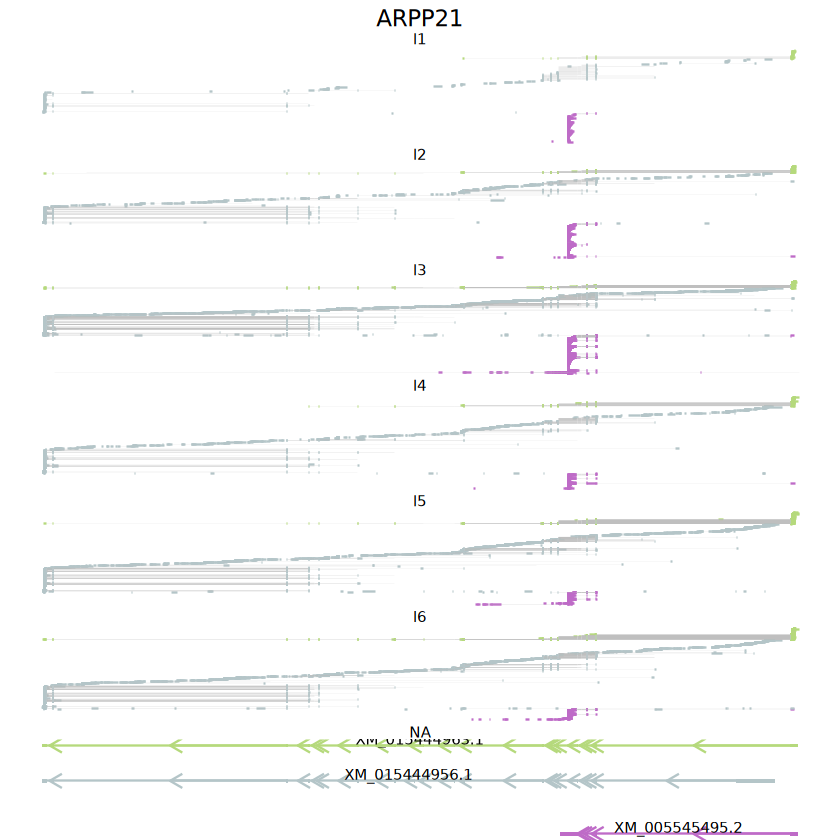

In [855]:
hubtrans = c("XM_005545495.2","XM_015444963.1","XM_015444956.1")
transname = unique(isosigi[isosigi$gene_id %in% geneex,]$transcript_id)
if(!is.null(hubtrans)){
        transname = hubtrans
}
    mycolors = distinctColorPalette(length(transname))
    print(mycolors)
    names(mycolors) = transname
    grtdfl = BuildPlotBed(fsrawsp,longbed,'areatr',geneex,NULL)
    print(head(grtdfl))
    grtdfl = grtdfl[grtdfl$transcript_id %in% transname,]
    
pci1 = IsoformReadPlot(gtf, grtdfl, geneex,onlyhub = T,mycolors)
pci1
ggexport(pci1,filename = "result/figure4/read_annotation_ARPP21_24_04_16.pdf",
           width = 6,height = 20)

In [106]:
#case plot
isosub = fsrawdp %>% group_by(layer,subclass,gene_id) %>% 
    mutate(readnumt = length(unique(readid))) %>% 
    group_by(layer,subclass,gene_id,transcript_id)  %>% 
    summarise(readnum = length(unique(readid)),
              readnumt = readnumt[1],
              relative = readnum/readnumt)
isosub = isosub %>% group_by(transcript_id) %>% 
    mutate(meanrelative = mean(relative),
           otherrelative = (sum(relative) - relative)/(n() - 1))
isosub = isosub %>% group_by(gene_id) %>% 
    mutate(readnorm = readnumt/sum(readnumt[!duplicated(paste0(layer,subclass))]))
isosubf = isosub[isosub$subclass != "" & isosub$readnumt > 5,]

`summarise()` has grouped output by 'layer', 'subclass', 'gene_id'. You can
override using the `.groups` argument.


file saved to result/figure4/ARPP21_diger_isoform_subclass_dr_bubble_plot_05_16.pdf



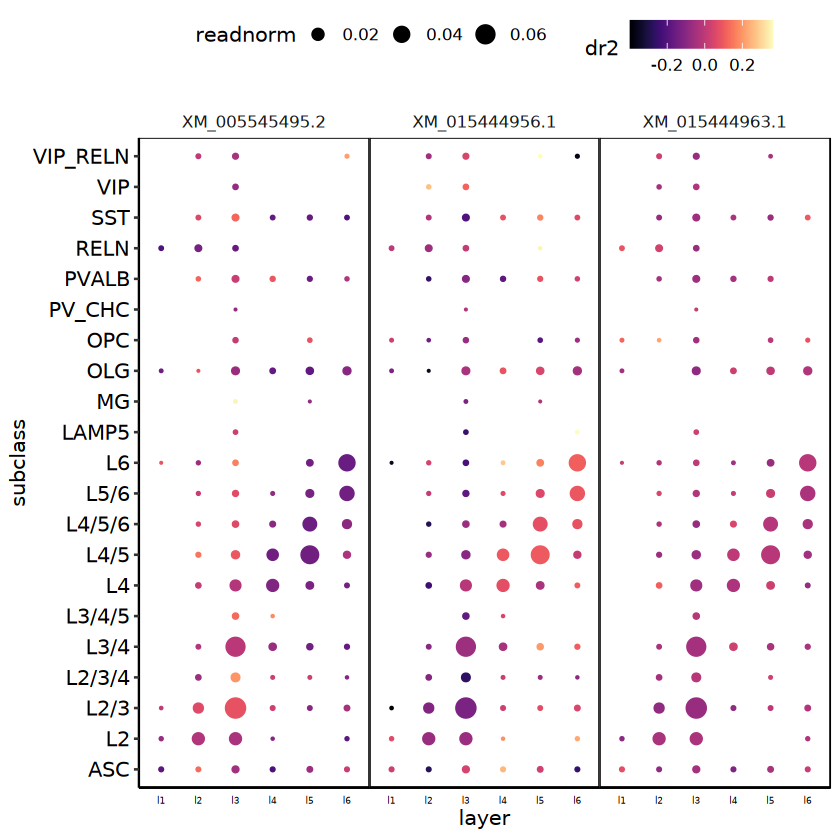

In [110]:
#cell stat
geneex = "ARPP21"
isosigs = isosubf
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% geneex,]
#isosigsf = isosigs[isosigs$dr2 > 0.05,]
isosigs = isosigs[isosigs$transcript_id %in% c("XM_005545495.2","XM_015444963.1","XM_015444956.1"),]
pmd4cs3 = ggplot(isosigs,aes(x = subclass, y = layer, color = dr2, size = readnorm)) + 
geom_point() +
scale_color_viridis(option = "A") +
facet_grid(~transcript_id,scales = "free",space = "free") + 
scale_size_continuous(range = c(0.1,5)) +
theme_pubr() + 
theme(axis.text.x = element_text(size = 5),
      axis.ticks.x = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
      strip.text.x = element_text(),
     panel.border = element_rect(fill = NA)) +
coord_flip()
pmd4cs3
ggexport(pmd4cs3,filename = "result/figure4/ARPP21_diger_isoform_subclass_dr_bubble_plot_05_16.pdf",width = 6,height = 5)

`summarise()` has grouped output by 'layer', 'subclass', 'gene_id'. You can
override using the `.groups` argument.
file saved to result/figure4/DBNDD2_diger_isoform_subclass_dr_bubble_plot_05_16.pdf



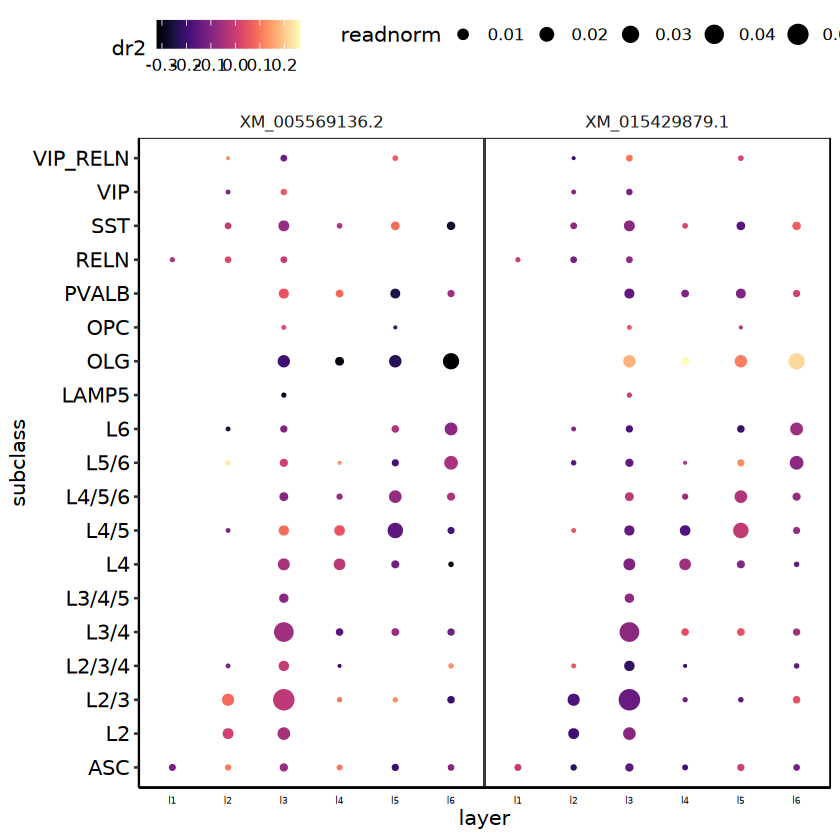

In [112]:
#cell stat
#case plot
fsrawdpf = qread("data/reads_full_anotation/main_data_read_total_annotation_read_onlyunique_24_05_16.qs")
isosub = fsrawdpf %>% group_by(layer,subclass,gene_id) %>% 
    mutate(readnumt = length(unique(readid))) %>% 
    group_by(layer,subclass,gene_id,transcript_id)  %>% 
    summarise(readnum = length(unique(readid)),
              readnumt = readnumt[1],
              relative = readnum/readnumt)
isosub = isosub %>% group_by(transcript_id) %>% 
    mutate(meanrelative = mean(relative),
           otherrelative = (sum(relative) - relative)/(n() - 1))
isosub = isosub %>% group_by(gene_id) %>% 
    mutate(readnorm = readnumt/sum(readnumt[!duplicated(paste0(layer,subclass))]))
isosubf = isosub[isosub$subclass != "" & isosub$readnumt > 5,]

geneex = "DBNDD2"
isosigs = isosubf
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% geneex,]
#isosigsf = isosigs[isosigs$dr2 > 0.05,]
isosigs = isosigs[isosigs$transcript_id %in% c("XM_005569136.2","XM_015429879.1"),]
pmd4cs3 = ggplot(isosigs,aes(x = subclass, y = layer, color = dr2, size = readnorm)) + 
geom_point() +
scale_color_viridis(option = "A") +
facet_grid(~transcript_id,scales = "free",space = "free") + 
scale_size_continuous(range = c(0.1,5)) +
theme_pubr() + 
theme(axis.text.x = element_text(size = 5),
      axis.ticks.x = element_blank(),
      strip.background = element_rect(fill = NA,color = NA),
      panel.spacing = unit(0,'lines'),
      strip.text.x = element_text(),
     panel.border = element_rect(fill = NA)) +
coord_flip()
pmd4cs3
ggexport(pmd4cs3,filename = "result/figure4/DBNDD2_diger_isoform_subclass_dr_bubble_plot_05_16.pdf",width = 6,height = 5)

Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
Warning message:
"Computation failed in `stat_compare_means()`.
Caused by error in `t.test.default()`:
! not enough 'x' observations"
file saved to result/figure4/DBNDD2_diger_isoform_subclass_dr_box_plot_05_16.pdf



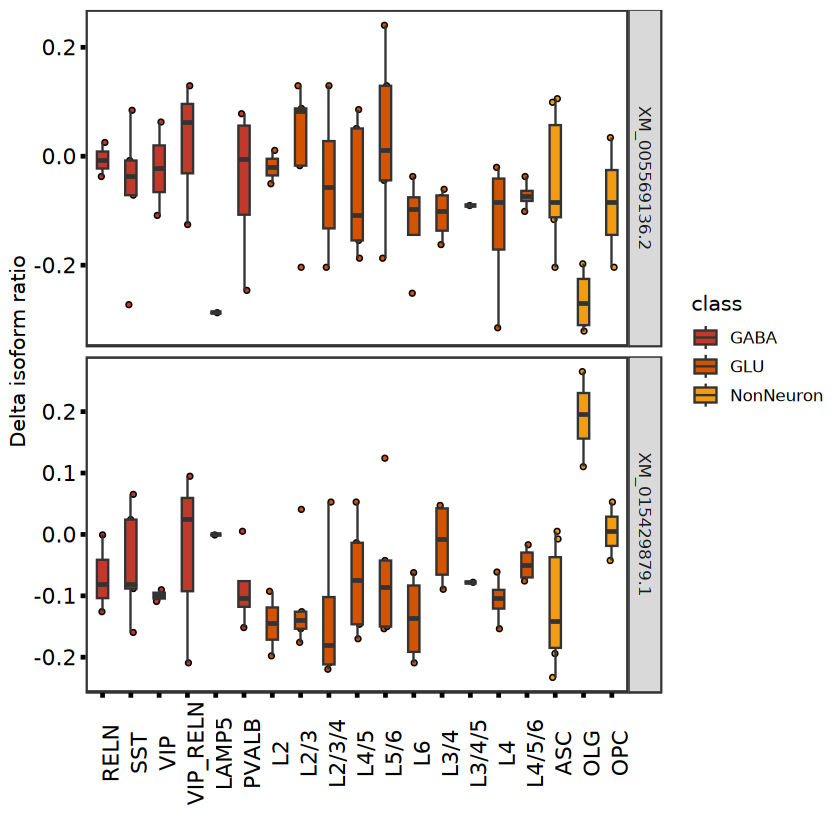

In [116]:
isosigs$class = cellan[match(isosigs$subclass,cellan$subclass),]$class
isosigs = isosigs[order(isosigs$class),]
#isosigs[isosigs$subclass %in% c("L3/4","L3/4/5"),]$class = "surface-GLU"
isosigs$subclass = factor(isosigs$subclass,levels = unique(isosigs$subclass))
pmd4cs3 = ggplot(isosigs,aes(x = subclass, y = dr2, fill = class))+
  geom_jitter(aes(fill = class),shape=21,size=1,width=0.1) +
  #geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
  geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
  stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
  facet_grid(transcript_id~.,scales = "free") +
  theme_bw()+
  theme(panel.grid = element_blank(),
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
  scale_fill_flatui() + ylab("Delta isoform ratio") + xlab("")
#coord_flip()
pmd4cs3
ggexport(pmd4cs3,filename = "result/figure4/DBNDD2_diger_isoform_subclass_dr_box_plot_05_16.pdf",width = 6,height = 5)

In [861]:
isosigs = isosigls$subclass
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% geneex,]
head(isosigs)

gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj,dr2
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
ARPP21,XM_005545480.2,ASC,42,176,0.2386364,0.2331164,0.2328098,0.005826592,Y,2.261909e-313,1.338924e-310,0.005519929
ARPP21,XM_005545480.2,L2,136,685,0.1985401,0.2331164,0.2350373,-0.036497194,Y,2.261909e-313,1.338924e-310,-0.034576289
ARPP21,XM_005545480.2,L2/3,253,1388,0.1822767,0.2331164,0.2359409,-0.053664210,Y,2.261909e-313,1.338924e-310,-0.050839778
ARPP21,XM_005545480.2,L2/3/4,33,183,0.1803279,0.2331164,0.2360491,-0.055721264,Y,2.261909e-313,1.338924e-310,-0.052788566
ARPP21,XM_005545480.2,L3/4,204,1105,0.1846154,0.2331164,0.2358109,-0.051195553,Y,2.261909e-313,1.338924e-310,-0.048501050
ARPP21,XM_005545480.2,L3/4/5,12,55,0.2181818,0.2331164,0.2339461,-0.015764317,Y,2.261909e-313,1.338924e-310,-0.014934616


file saved to result/figure4/ARPP21_diger_isoform_subclass_dr_barplot_04_29.pdf



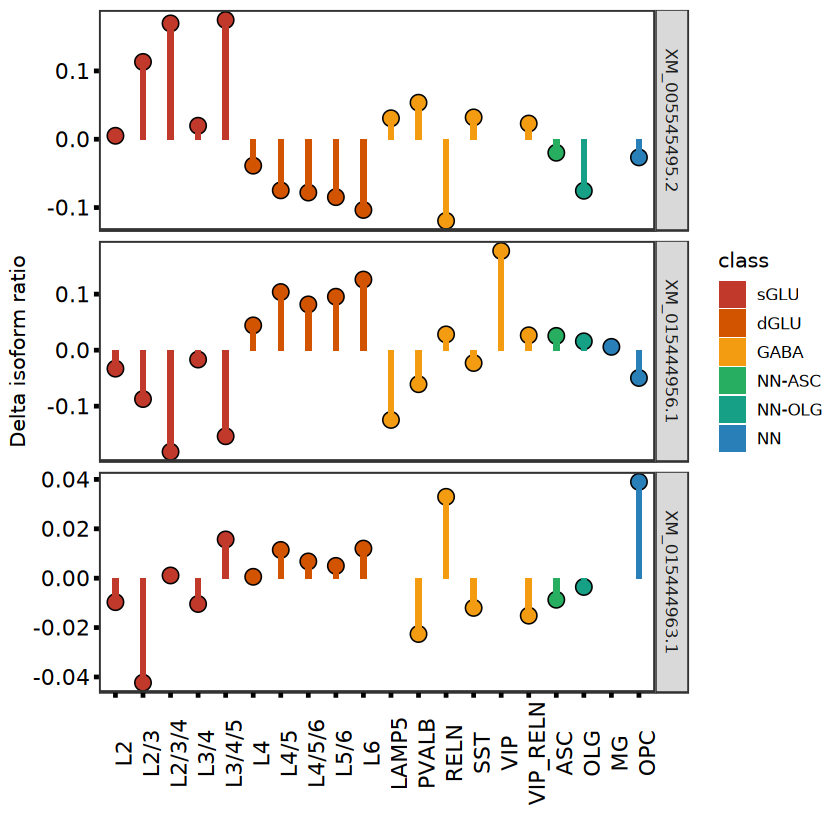

In [455]:
isosigs = isosigls$subclass
isosigs$dr2 = isosigs$relative - isosigs$meanrelative
isosigs = isosigs[isosigs$gene_id %in% geneex,]
#isosigsf = isosigs[isosigs$dr2 > 0.05,]
isosigs = isosigs[isosigs$transcript_id %in% c("XM_005545495.2","XM_015444963.1","XM_015444956.1"),]
colnames(isosigs)[3] = "subclass"

isosigs$class = subclassan[match(isosigs$subclass,subclassan$subclass),]$class
#isosigs[isosigs$subclass %in% c("L3/4","L3/4/5"),]$class = "surface-GLU"
isosigs$class = factor(isosigs$class,levels = c('sGLU','dGLU','GABA','NN-ASC','NN-OLG','NN'))
isosigs = isosigs[order(isosigs$class,isosigs$subclass),]
isosigs$subclass = factor(isosigs$subclass,levels = unique(isosigs$subclass))
isosigs = isosigs[isosigs$count > 5,]

pmd4cs5 = ggplot(isosigs,aes(x = subclass, y = dr2, fill = class))+
  geom_point(aes(fill = class),shape=21,size = 4) +
#  geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
  geom_bar(width=0.2,size=0.5, stat = "identity") +
  facet_grid(transcript_id~.,scales = "free") +
  theme_bw()+
  theme(panel.grid = element_blank(),
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
  scale_fill_flatui() + ylab("Delta isoform ratio") + xlab("")
#coord_flip()
pmd4cs5
ggexport(pmd4cs5,filename = "result/figure4/ARPP21_diger_isoform_subclass_dr_barplot_04_29.pdf",width = 6,height = 5)

file saved to result/figure4/ARPP21_diger_isoform_subclass_dr_barplot_04_29.pdf



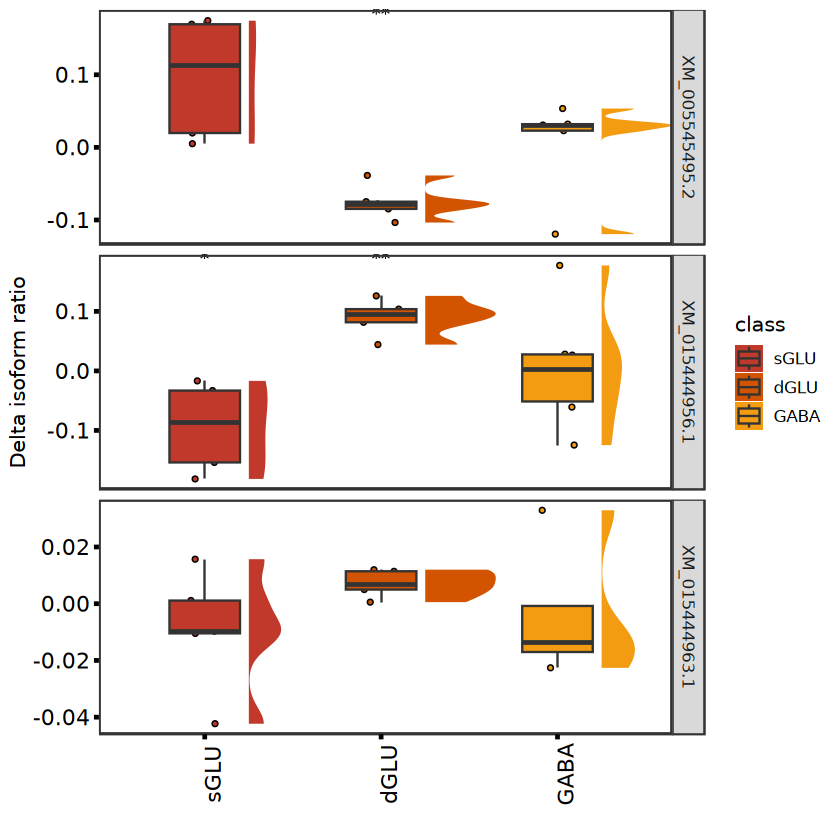

In [456]:
pmd4cs6 = ggplot(isosigs[isosigs$class %in% c('sGLU','dGLU','GABA'),],aes(x = class, y = dr2, fill = class))+
  geom_jitter(aes(fill = class),shape=21,size=1,width=0.1) +
  geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+
  geom_boxplot(width=0.4,size=0.5, outlier.color =NA) +
  stat_compare_means(label = "p.signif", method = "t.test",hide.ns = T,
                     ref.group = ".all.")  +
  facet_grid(transcript_id~.,scales = "free") +
  theme_bw()+
  theme(panel.grid = element_blank(),
        panel.border = element_rect(size = 1),
        axis.text.x = element_text(color = "black", size = 13,angle = 90),
        axis.text.y = element_text(color = "black",size = 13),
        axis.ticks = element_line(color="black",linewidth = 1)) +
  scale_fill_flatui() + ylab("Delta isoform ratio") + xlab("")
#coord_flip()
pmd4cs6
ggexport(pmd4cs6,filename = "result/figure4/ARPP21_diger_isoform_subclass_dr_barplot_04_29.pdf",width = 6,height = 5)

In [904]:
qsave(list("md1" = isosigl.st,"md2" = isosigl2,"md3" = isosigl3),file = "result/figure4/module_hub_gene_list_24_04_16.qs")

### Analysis Spatial and Cell interact

In [20]:
cellprop.layer = fsraw[fsraw$class != "",] %>% group_by(layer,class,subclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.layer = cellprop.layer %>% group_by(layer) %>% mutate(cellprop = cellnum/sum(cellnum))

cellprop.lobe = fsraw[fsraw$class != "",] %>% group_by(lobe,class,subclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.lobe = cellprop.lobe %>% group_by(lobe) %>% mutate(cellprop = cellnum/sum(cellnum))
head(cellprop.lobe)

`summarise()` has grouped output by 'layer', 'class'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'lobe', 'class'. You can override using the
`.groups` argument.


lobe,class,subclass,cellnum,cellprop
<chr>,<chr>,<chr>,<int>,<dbl>
auditory,GABA,LAMP5,337,0.009658651
auditory,GABA,PVALB,1750,0.050156201
auditory,GABA,PV_CHC,78,0.002235534
auditory,GABA,RELN,716,0.020521051
auditory,GABA,SST,1724,0.049411023
auditory,GABA,VIP,301,0.008626867


file saved to result/figure4/cellprop_stat_24_04_03.pdf



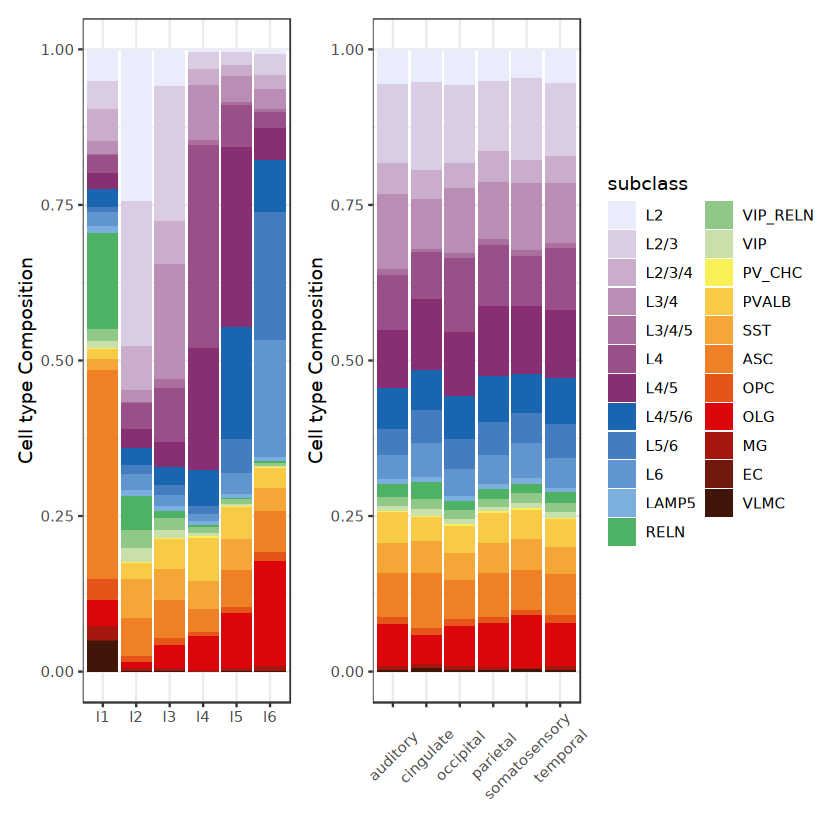

In [23]:
cellprop.layer$subclass = factor(cellprop.layer$subclass,levels = suborder)
cellprop.lobe$subclass = factor(cellprop.lobe$subclass,levels = suborder)
pst1 = ggplot(cellprop.layer,aes(x = layer,y = cellprop,fill = subclass)) + geom_bar(stat = "identity") + scale_fill_discreterainbow() + theme_bw() +
xlab("") + ylab("Cell type Composition") + NoLegend()
pst2 = ggplot(cellprop.lobe,aes(x = lobe,y = cellprop,fill = subclass)) + geom_bar(stat = "identity") + scale_fill_discreterainbow() + theme_bw() +
xlab("") + ylab("Cell type Composition") + theme(axis.text.x = element_text(angle = 45,vjust = 0.5))
pst = pst1 + pst2
pst
ggexport(pst,filename = "result/figure4/cellprop_stat_24_04_03.pdf",width = 7,height = 4)

In [24]:
qsave(list("layer" = cellprop.layer,"lobe" = cellprop.lobe), file = "result/figure4/cell_prop_longread.qs")

In [239]:
#stat with celltype module
fsraw$myclass = subclassan[match(fsraw$subclass,subclassan$subclass),]$class
cellprop.layer.md = fsraw[fsraw$myclass != "",] %>% group_by(layer,myclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.layer.md = cellprop.layer.md %>% group_by(layer) %>% mutate(cellprop = cellnum/sum(cellnum))
cellprop.lobe.md = fsraw[fsraw$myclass != "",] %>% group_by(lobe,myclass) %>% summarise(cellnum = length(unique(cell_id)))
cellprop.lobe.md = cellprop.lobe.md %>% group_by(lobe) %>% mutate(cellprop = cellnum/sum(cellnum))


`summarise()` has grouped output by 'layer'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'lobe'. You can override using the
`.groups` argument.
ERROR while rich displaying an object: Error:
! Problem while computing aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error:
! object 'myclass' not found

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2re

ERROR: [1m[33mError[39m:[22m
[1m[22m[33m![39m Problem while computing aesthetics.
[36mℹ[39m Error occurred in the 1st layer.
[1mCaused by error:[22m
[33m![39m object 'myclass' not found


file saved to result/figure4/cellprop_stat_my_module_24_04_03.pdf



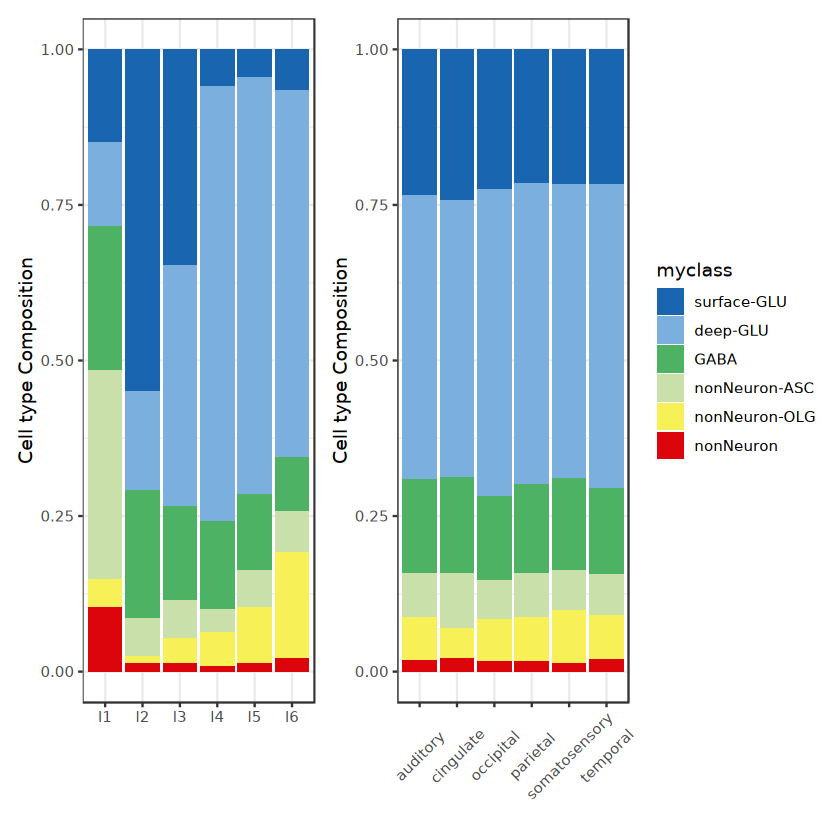

In [243]:
cellprop.layer.md$myclass = factor(cellprop.layer.md$myclass,levels = c('surface-GLU','deep-GLU','GABA','nonNeuron-ASC','nonNeuron-OLG','nonNeuron'))
cellprop.lobe.md$myclass = factor(cellprop.lobe.md$myclass,levels = c('surface-GLU','deep-GLU','GABA','nonNeuron-ASC','nonNeuron-OLG','nonNeuron'))
cellprop.lobe.md = cellprop.lobe.md[!is.na(cellprop.lobe.md$myclass),]
cellprop.layer.md = cellprop.layer.md[!is.na(cellprop.layer.md$myclass),]
pst1 = ggplot(cellprop.layer.md,aes(x = layer,y = cellprop,fill = myclass)) + geom_bar(stat = "identity") + scale_fill_discreterainbow() + theme_bw() +
xlab("") + ylab("Cell type Composition") + NoLegend()
pst2 = ggplot(cellprop.lobe.md,aes(x = lobe,y = cellprop,fill = myclass)) + geom_bar(stat = "identity") + scale_fill_discreterainbow() + theme_bw() +
xlab("") + ylab("Cell type Composition") + theme(axis.text.x = element_text(angle = 45,vjust = 0.5))
pst = pst1+pst2
pst
ggexport(pst,filename = "result/figure4/cellprop_stat_my_module_24_04_03.pdf",width = 7,height = 4)

In [244]:
qsave(list("layer" = cellprop.layer.md,"lobe" = cellprop.lobe.md), file = "result/figure4/cell_prop_md_longread.qs")

In [ ]:
# 导入所需的包
library(rpart)
library(randomForest)

# 1. 准备数据集（假设你的数据框名为df，包含两个因素 factor1 和 factor2，以及数值变量 target）
# 例如：
# df <- data.frame(factor1 = factor(c("A", "B", "A", "B")),
#                  factor2 = factor(c("X", "Y", "Y", "X")),
#                  target = c(10, 15, 20, 25))

# 2. 拆分数据集为训练集和测试集（这里假设70%的数据用于训练，30%用于测试）
set.seed(123) # 设置随机种子以确保结果可复现
train_index <- sample(1:nrow(cpcclst.cellf), 0.7 * nrow(cpcclst.cellf))
train_data <- cpcclst.cellf[train_index, ]
test_data <- cpcclst.cellf[-train_index, ]

# 3. 构建决策树模型
tree_model <- rpart(readrate ~ subclass + lobe, data = train_data)

# 4. 查看特征重要性
# 获取特征重要性
tree_importance <- tree_model$variable.importance

# 5. 可视化特征重要性
barplot(tree_importance, main = "Feature Importance (Decision Tree)", xlab = "Features", ylab = "Importance")

# 6. 构建随机森林模型
rf_model <- randomForest(readrate ~ subclass + lobe, data = train_data)

# 7. 查看特征重要性
# 获取特征重要性
rf_importance <- importance(rf_model)

# 8. 可视化特征重要性
varImpPlot(rf_model, main = "Feature Importance (Random Forest)")


In [10]:
isosigan = read.csv("result/figure3/sigiso_subclass_transcript_dr_cluster_tab.csv")
head(isosigan)
length(unique(isosigan$gene_id))

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj,dr2,cluster,class
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<chr>
1,ACBD7,ACBD7-WeiLab-2,ASC,63,90,0.7000000,0.5847059,0.5462745,0.15372549,N,0.1035015,1,0.11529412,1,nonNeuron-ASC
2,ACBD7,ACBD7-WeiLab-2,L2/3,19,34,0.5588235,0.5847059,0.5933333,-0.03450980,N,0.1035015,1,-0.02588235,1,surface-GLU
3,ACBD7,ACBD7-WeiLab-2,L3/4,14,25,0.5600000,0.5847059,0.5929412,-0.03294118,N,0.1035015,1,-0.02470588,1,surface-GLU
4,ACBD7,ACBD7-WeiLab-2,L4,13,25,0.5200000,0.5847059,0.6062745,-0.08627451,N,0.1035015,1,-0.06470588,1,L4
5,AKAP9,XM_015447760.1,ASC,192,216,0.8888889,0.7486167,0.7403654,0.14852351,N,1.0000000,1,0.14027220,1,nonNeuron-ASC
6,AKAP9,XM_015447760.1,L2,136,203,0.6699507,0.7486167,0.7532441,-0.08329335,N,1.0000000,1,-0.07866595,1,surface-GLU


[1] 298

In [31]:
isosig = isosigls$subclass

gvls = list()
hubtrans = NULL
hubgene = NULL
for(i in 1:length(isosigls.cl)){
    tdtui = isosigls.cl[[i]]
    hubtrans = unique(c(hubtrans,unique(tdtui[tdtui$sig != "N",]$transcript_id)))
    hubgene = unique(c(hubgene,unique(tdtui[tdtui$sig != "N",]$gene_id)))
    print(names(isosigls.cl)[i])
}
length(hubgene)
isosig.hub = isosig[isosig$gene_id %in% hubgene,]

[1] "Neuron_NonNeuron"
[1] "GABA_NonNeuron"
[1] "GLU_NonNeuron"
[1] "GABA_GLU"
[1] "GABA_GABA"
[1] "GLU_GLU"
[1] "NonNeuron_NonNeuron"


[1] 708

[1] "ACTA2"           "AKT3"            "AP4E1"           "APBA3"          
 [5] "APC"             "BambuGene127834" "BambuGene37959"  "BambuGene44498" 
 [9] "CA11"            "CALM3"           "CBR4"            "CCDC71"         
[13] "CENPV"           "CISD3"           "CRYAB"           "DAZAP2"         
[17] "DCLK1"           "EEF1E1"          "ERC2"            "FAM173A"        
[21] "FBXO15"          "GAP43"           "GRIA4"           "GRIN2B"         
[25] "HOMER2"          "IDH3B"           "IGFLR1"          "IQSEC2"         
[29] "LOC101866646"    "LOC102122770"    "LOC102133073"    "LOC102133863"   
[33] "LOC102136493"    "LOC102137214"    "LOC102140491"    "LOC102142523"   
[37] "LRRC8B"          "MACROD1"         "MAP6"            "MATR3"          
[41] "MRPS33"          "MTERF2"          "NPM1"            "PAK3"           
[45] "PCID2"           "PDLIM7"          "PSMA2_1"         "PTGDS"          
[49] "QDPR"            "R3HCC1L"         "RPL14"           "RPL19"          
[53] "RPL21"           "RPL41"           "RPL9"            "RPS10"          
[57] "RPS12"           "RPS7"            "SATB1"           "SH3BGRL3"       
[61] "SLC6A13"         "SNX3"            "STAT2"           "TAPBPL"         
[65] "TNFSF10"         "TNNC1"           "TPM3"            "TRAPPC1"        
[69] "UCHL1"           "YWHAE"           "YWHAH"           "ZNF235"         
[73] "ZNF382"          "ZNF629"

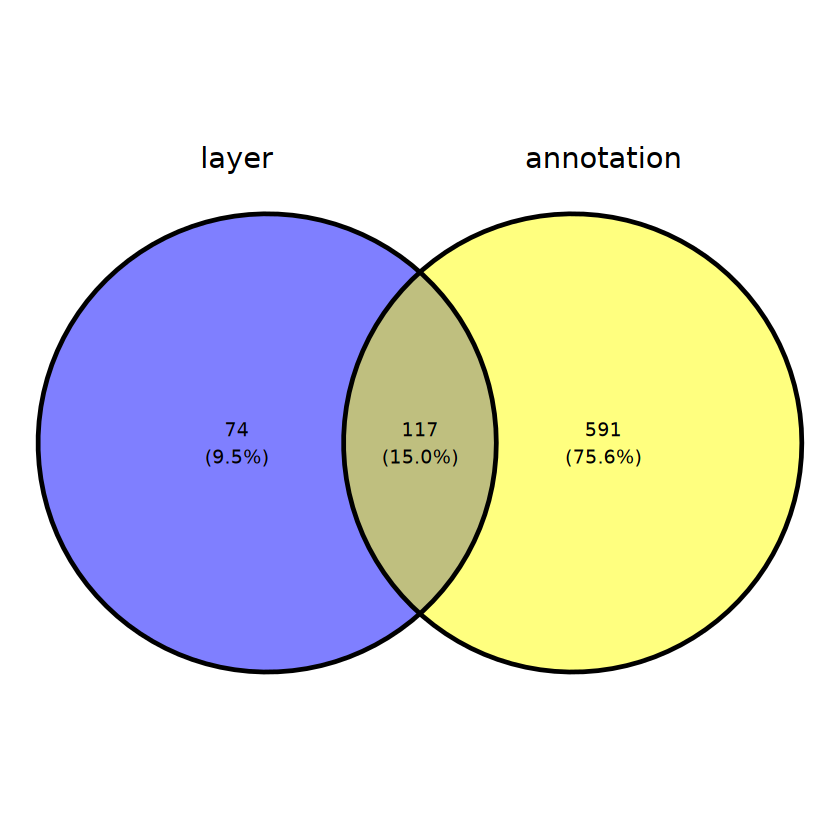

In [33]:
isosigl = isosigls$layer
isosigl = isosigl[isosigl$sig != "N",]
library(ggvenn)
ggvenn(list("layer" = isosigl$gene_id,"annotation" = hubgene))
unique(isosigl[!isosigl$gene_id %in% hubgene,]$gene_id)

In [52]:
isocmpdf = NULL
hutrans = unique(isocmp$transcript_id)
length(hutrans)
for(i in 1:length(hutrans)){
    isoli = isosigl[isosigl$transcript_id == hutrans[i],]
    isoci = isocmp[isocmp$transcript_id == hutrans[i],]
    isocmpdfi = isoci
    for(j in 1:nrow(isoli)){
        isocmpdfi$dr2.layer = isoli[j,]$dr2
        isocmpdfi$dist = isocmpdfi$dr2 - isocmpdfi$dr2.layer
        isocmpdfi$group = isoli[j,]$areatr
        isocmpdfi = isocmpdfi[,c("gene_id","transcript_id","areatr","group","sig","dr2","dr2.layer","dist")]
        isocmpdf = rbind(isocmpdf,isocmpdfi)
    }
}

[1] 983

In [156]:
isocell = read.csv("result/figure3/sigiso_subclass_transcript_dr_cluster_tab.csv")

[1] 322

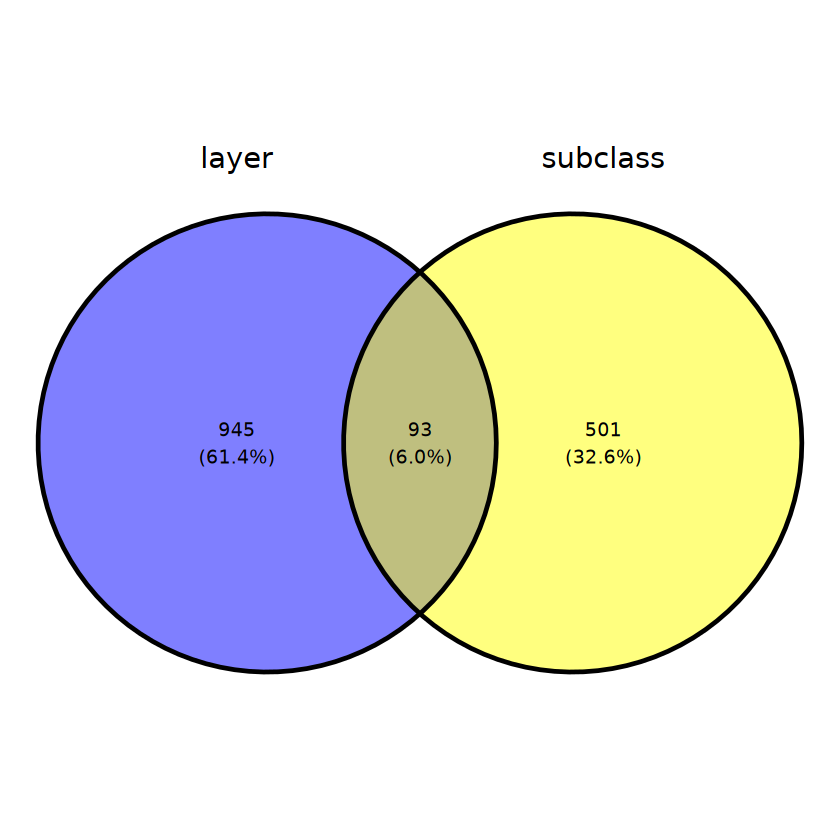

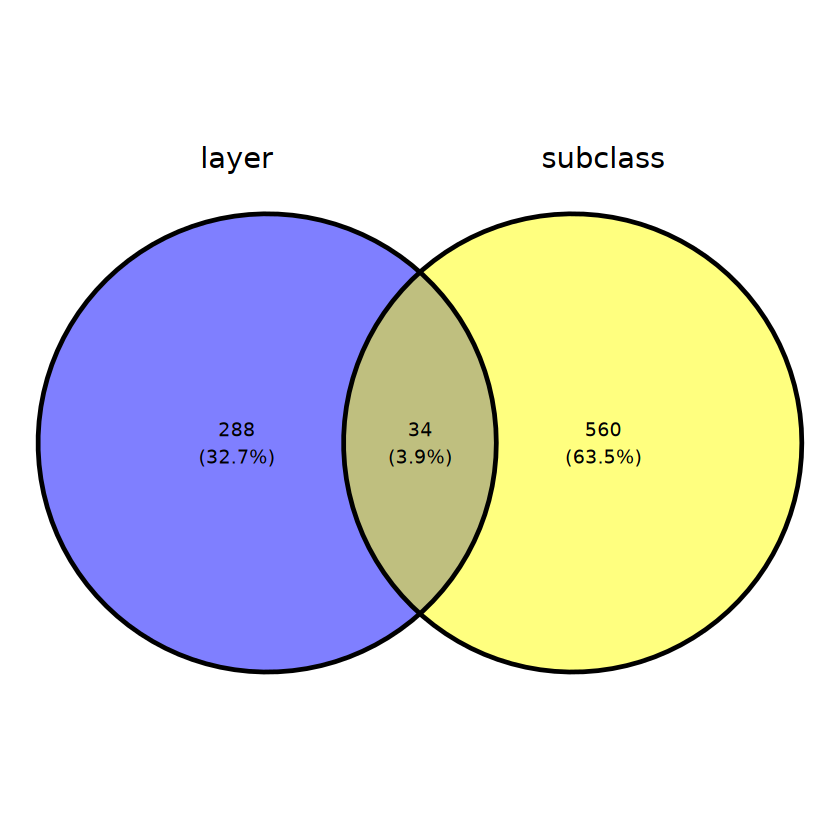

In [210]:
#layer as cluster
isosigl$dr2 = isosigl$relative - isosigl$meanrelative
ggvenn(list("layer" = isosigl$transcript_id, "subclass" = isocell$transcript_id))
isosigl$dr2 = isosigl$relative - isosigl$meanrelative
#isosigf = isosigl[isosigl$transcript_id %in% hubtrans,]
#isosigf2 = isosigf2[isosigf2$sig != "N",]
isosigf2 = isosigl %>% group_by(transcript_id) %>% filter(max(abs(dr2)) > 0.1)
#isosigf2 = isosigf2 %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
length(unique(isosigf2$transcript_id))
isosigf.mx = dcast(isosigf2,transcript_id~areatr,value.var = "dr2",fun.aggregate = sum)
rownames(isosigf.mx) = isosigf.mx$transcript_id;isosigf.mx = isosigf.mx[-1]
ggvenn(list("layer" = isosigf2$transcript_id, "subclass" = isocell$transcript_id))
#isosigf.mx = isosigf.mx[,!colnames(isosigf.mx) %in% c("MG","PV_CHC","EC","VLMC")]
#isosigf.mx = isosigf.mx[,!colnames(isosigf.mx) %in% c("EC","VLMC")]
library(ComplexHeatmap)

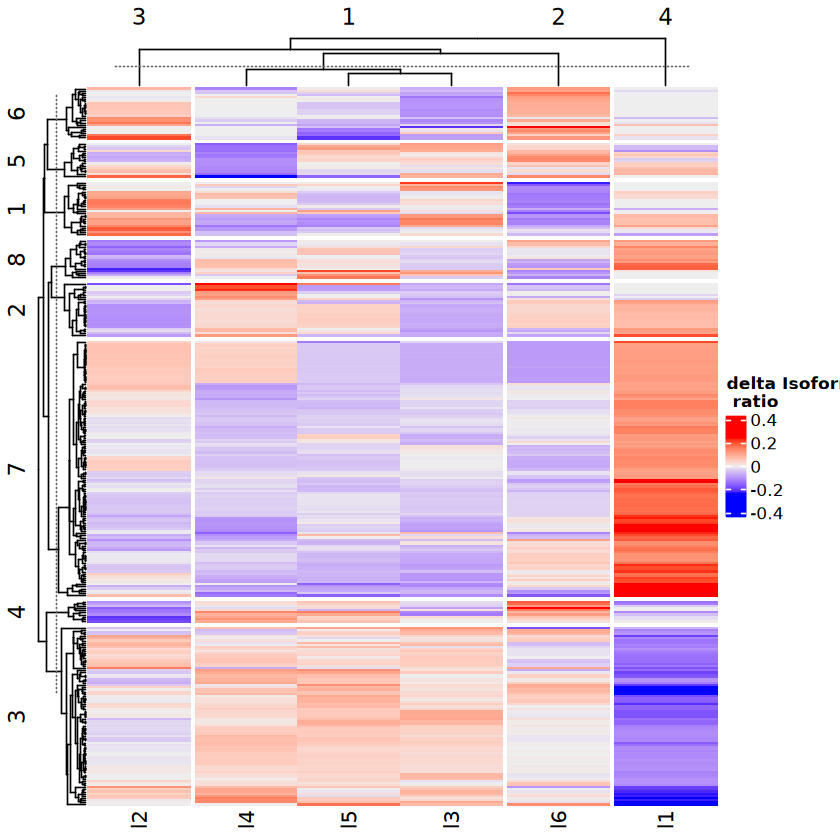

In [214]:
n = 8
fit = kmeans(isosigf.mx,n)
split <- factor(as.character(fit$cluster), levels=as.character(c(1:n)))
#reorder.hmap <- Heatmap(as.matrix(cellmxfn), split=split, cluster_row_slices = FALSE,
#                          show_row_names = F,column_order = cellorder)
#reorder.hmap
isosigf.mx = as.matrix(isosigf.mx)
pcloneht = Heatmap(isosigf.mx,show_row_names = F,column_km = 4,split=split,name = "delta Isoform\n ratio")
pcloneht

clusteran = data.frame("cluster" = split,"transcript_id" = rownames(isosigf.mx))
isosigf2$cluster = clusteran[match(isosigf2$transcript_id,clusteran$transcript_id),]$cluster

In [384]:
#cell composition stat of gene
transtcs.layer = fsraw %>% group_by(gene_id, layer,subclass) %>% 
        mutate(genecount = length(unique(readid)),cellnum = length(unique(cell_id))) %>% 
        group_by(gene_id,transcript_id,layer,subclass) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),
                 cellnum = cellnum[1])
transtcs.layer = transtcs.layer[!is.na(transtcs.layer$subclass) & transtcs.layer$subclass != "",] %>% 
group_by(gene_id, layer) %>% mutate(cellprop = cellnum/(sum(cellnum)))

transtcs.lobe = fsraw %>% group_by(gene_id, lobe, subclass) %>% 
        mutate(genecount = length(unique(readid)),cellnum = length(unique(cell_id))) %>% 
        group_by(gene_id,transcript_id,lobe,subclass) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),
                 cellnum = cellnum[1])
transtcs.lobe = transtcs.lobe[!is.na(transtcs.lobe$subclass) & transtcs.lobe$subclass != "",] %>% 
group_by(gene_id, lobe) %>% mutate(cellprop = cellnum/(sum(cellnum)))
head(transtcs.lobe)

`summarise()` has grouped output by 'gene_id', 'transcript_id', 'layer'. You
can override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id', 'lobe'. You can
override using the `.groups` argument.


gene_id,transcript_id,lobe,subclass,count,genecount,cellnum,cellprop
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>
A1BG,XM_015441069.1,temporal,L2,1,1,1,0.3333333
A1BG,XM_015441069.1,temporal,L4/5,1,1,1,0.3333333
A1BG,XM_015441069.1,temporal,SST,1,1,1,0.3333333
A2ML1,XM_005570054.2,cingulate,L2/3,1,1,1,0.3333333
A2ML1,XM_005570054.2,occipital,ASC,1,1,1,0.1111111
A2ML1,XM_005570054.2,occipital,L4/5/6,1,1,1,0.1111111


In [326]:
#select similar pattern as between layer and cell
head(transtcs.sigl)

,transcript_id,layer,myclass,gene_id,count,genecount,cellnum,cellprop,meancellprop,othercellprop,relative,dr2,dr.cp
,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AP4E1-WeiLab-2,l6,deep-GLU,AP4E1,9,24,22,0.20183486,0.07543323,0.05963303,0.3750000,0.009989648,0.12640163
2,AP4E1-WeiLab-2,l6,deep-GLU,AP4E1,9,24,22,0.20183486,0.07543323,0.05963303,0.3750000,-0.021066253,0.12640163
3,BambuGene103646-WeiLab-1,l1,GABA,BambuGene103646,9,13,12,0.21818182,0.11111111,0.09772727,0.6923077,-0.096553190,0.10707071
4,BambuGene103646-WeiLab-1,l1,GABA,BambuGene103646,9,13,12,0.21818182,0.11111111,0.09772727,0.6923077,-0.008257685,0.10707071
5,BambuGene103646-WeiLab-1,l1,GABA,BambuGene103646,9,13,12,0.21818182,0.11111111,0.09772727,0.6923077,0.165717872,0.10707071
6,BambuGene103646-WeiLab-1,l1,nonNeuron-ASC,BambuGene103646,5,7,4,0.07272727,0.11111111,0.11590909,0.7142857,0.182811890,-0.03838384


In [381]:
transt.cs.l = transtcs.layer[transtcs.layer$transcript_id %in% isosigl$transcript_id,]
transt.cs.l = transt.cs.l[transt.cs.l$myclass != "",]
#transt.cs.l = transt.cs.l[transt.cs.l$genecount > 10,]
transt.cs.l = transt.cs.l %>% group_by(gene_id,layer) %>% 
      mutate(meancellprop = mean(cellprop),
             othercellprop = (sum(cellprop) - cellprop)/(n() - 1))
transt.cs.l$dr.cp = transt.cs.l$cellprop - transt.cs.l$meancellprop

#transt.is.cl = isosigcmp[,c("transcript_id","cluster","class","dr2")]
#colnames(transt.is.cl)[2:4] = c("layer","myclass","dr.rcl")
transt.cs.l$relative = transt.cs.l$count/transt.cs.l$genecount
transt.cs.l = transt.cs.l %>% group_by(transcript_id) %>% 
      mutate(meanrelative = mean(relative),
            otherrelative = (sum(relative) - relative)/(n() - 1))
transt.cs.l$dr.rcl = transt.cs.l$relative - transt.cs.l$meanrelative

transt.is.l = isosigls$layer
transt.is.l$dr.rl = transt.is.l$relative - transt.is.l$meanrelative
transt.is.l = transt.is.l[transt.is.l$sig != "N" & transt.is.l$dr.rl > 0.1,]
transt.is.l = transt.is.l[,c("transcript_id","areatr","dr.rl")]
colnames(transt.is.l)[2] = c("layer")
#transtcs.siglt = transtcs.siglt[transtcs.siglt$sig != "N",c("transcript_id","areatr","dr.rl")]
#transtcs.siglt = transtcs.siglt[transtcs.siglt$dr.rl > 0.1,]
transt.cs.l = merge(transt.cs.l,transt.is.l,by = c("transcript_id","layer"))
transt.cs.l$dr.rp = transt.cs.l$dr.rcl - transt.cs.l$dr.rl
head(transt.cs.l)
length(unique(transt.is.l$transcript_id))


,transcript_id,layer,gene_id,myclass,count,genecount,cellnum,cellprop,meancellprop,othercellprop,dr.cp,relative,meanrelative,otherrelative,dr.rcl,dr.rl,dr.rp
,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AP4E1-WeiLab-2,l6,AP4E1,deep-GLU,9,24,22,0.20183486,0.07543323,0.05963303,0.12640163,0.3750000,0.3781953,0.3784616,-0.003195334,0.1125214,-0.11571670
2,AP4E1-WeiLab-2,l6,AP4E1,nonNeuron-ASC,1,3,3,0.02752294,0.07543323,0.08142202,-0.04791030,0.3333333,0.3781953,0.3819338,-0.044862001,0.1125214,-0.15738337
3,AP4E1-WeiLab-2,l6,AP4E1,nonNeuron-OLG,4,12,10,0.09174312,0.07543323,0.07339450,0.01630989,0.3333333,0.3781953,0.3819338,-0.044862001,0.1125214,-0.15738337
4,APBA3-WeiLab-1,l4,APBA3,nonNeuron,2,2,1,0.04166667,0.16666667,0.19166667,-0.12500000,1.0000000,0.4564815,0.3477778,0.543518519,0.1321773,0.41134123
5,APBA3-WeiLab-1,l4,APBA3,GABA,1,2,2,0.08333333,0.16666667,0.18333333,-0.08333333,0.5000000,0.4564815,0.4477778,0.043518519,0.1321773,-0.08865877
6,APBA3-WeiLab-1,l4,APBA3,deep-GLU,2,9,9,0.37500000,0.16666667,0.12500000,0.20833333,0.2222222,0.4564815,0.5033333,-0.234259259,0.1321773,-0.36643655


[1] 216

In [385]:
head(transtcs.layer)

gene_id,transcript_id,layer,subclass,count,genecount,cellnum,cellprop
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>
A1BG,XM_015441069.1,l2,L2,1,1,1,1.00000000
A1BG,XM_015441069.1,l3,L4/5,1,1,1,0.50000000
A1BG,XM_015441069.1,l3,SST,1,1,1,0.50000000
A2ML1,XM_005570054.2,l1,ASC,2,4,3,0.25000000
A2ML1,XM_005570054.2,l1,L4/5/6,1,1,1,0.08333333
A2ML1,XM_005570054.2,l3,ASC,1,1,1,0.09090909


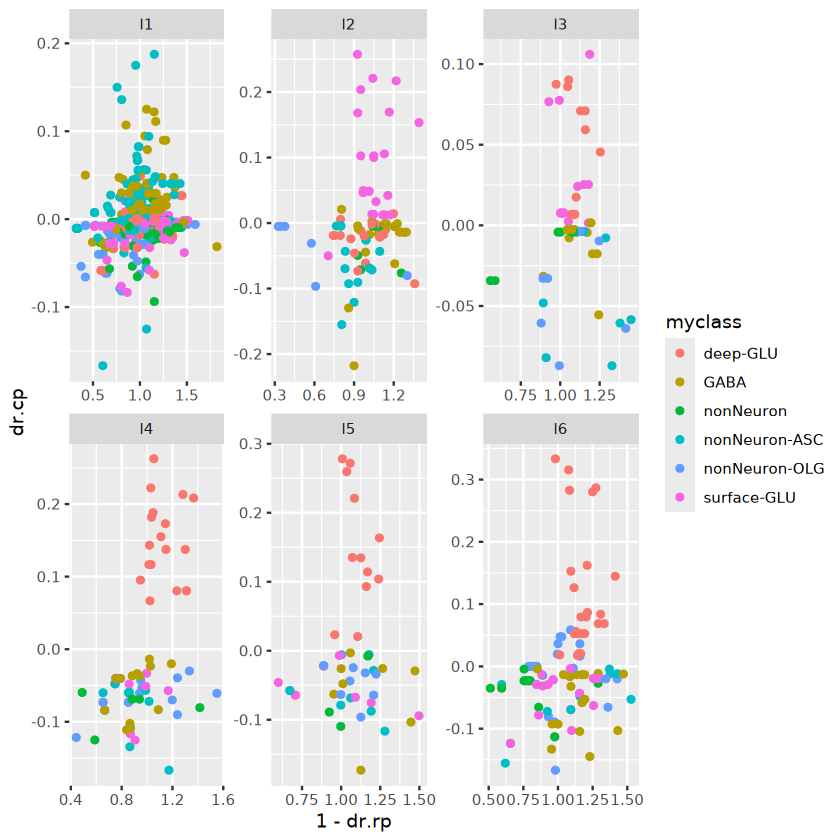

In [370]:
#transt.cs.lf = transt.cs.l[transt.cs.l$dr.cp > 0.05,]
ggplot(transt.cs.l,aes(x = 1-dr.rp,y = dr.cp,color = myclass)) + geom_point() + 
facet_wrap(layer~.,scales = "free")

In [245]:
fsraw$areatr = fsraw$myclass
transt = fsraw %>% group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
transt = transt[transt$areatr != "" &
                          !is.na(transt$areatr),]
transt = transt[!is.na(transt$areatr),]
transt = transt[transt$areatr != "",]
transt$relative = transt$count/transt$genecount
transtf = transt[transt$genecount > 20,]
isosigt = transtf %>% group_by(transcript_id) %>% 
      mutate(meanrelative = mean(relative),
             otherrelative = (sum(relative) - relative)/(n() - 1))
isosigt$dr2 = isosigt$relative - isosigt$meanrelative
isosigt$dr = isosigt$relative - isosigt$otherrelative
head(isosigt)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr2,dr
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAAS,AAAS-WeiLab-1,GABA,37,39,0.9487179,0.8922993,0.8640900,0.056418619,0.084627929
AAAS,AAAS-WeiLab-1,deep-GLU,123,146,0.8424658,0.8922993,0.9172161,-0.049833576,-0.074750364
AAAS,AAAS-WeiLab-1,surface-GLU,31,35,0.8857143,0.8922993,0.8955919,-0.006585044,-0.009877565
AAAS,AAAS-WeiLab-2,GABA,34,39,0.8717949,0.9203439,0.9446184,-0.048549016,-0.072823524
AAAS,AAAS-WeiLab-2,deep-GLU,134,146,0.9178082,0.9203439,0.9216117,-0.002535668,-0.003803502
AAAS,AAAS-WeiLab-2,surface-GLU,34,35,0.9714286,0.9203439,0.8948015,0.051084684,0.076627026


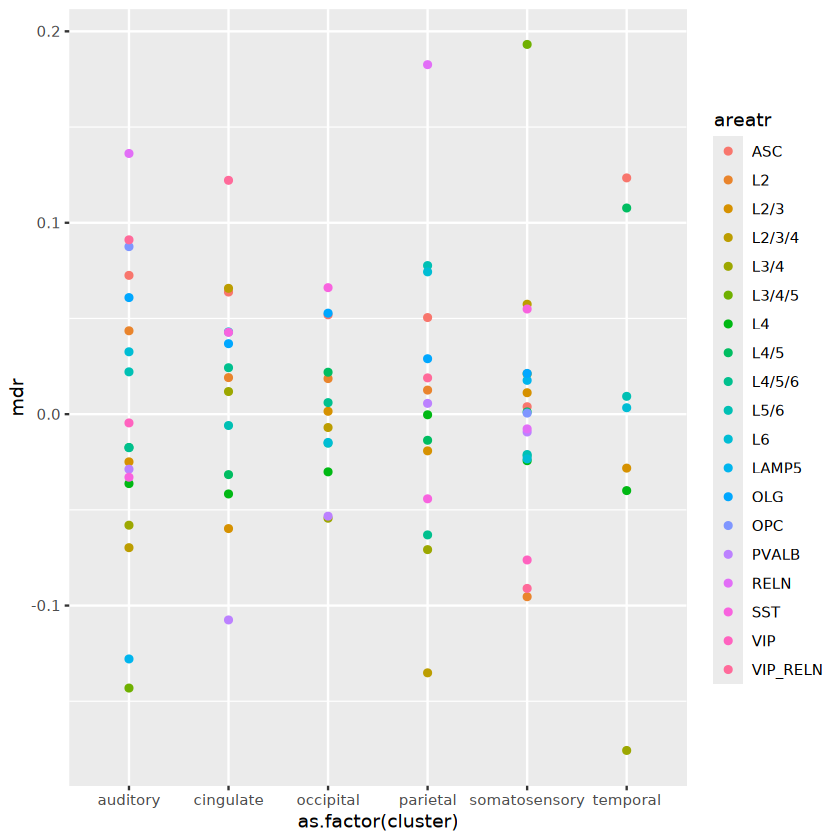

In [267]:
ggplot(isosigcmp2.st,aes(x = as.factor(cluster),y = mdr,color = areatr)) + geom_point()

In [576]:
#case plot 
#DDRGK1
geneex = "DDRGK1"
transtcs = fsraw[fsraw$gene_id %in% geneex,] %>% group_by(gene_id, layer,subclass) %>% 
        mutate(genecount = length(unique(readid)),cellnum = length(unique(cell_id))) %>% 
        group_by(gene_id,transcript_id,layer,subclass) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount),
                 cellnum = cellnum[1])
transtcs = transtcs %>% group_by(gene_id, layer) %>% mutate(cellprop = cellnum/(sum(cellnum)))
transtcs$relative = transtcs$count/transtcs$genecount


`summarise()` has grouped output by 'gene_id', 'transcript_id', 'layer'. You
can override using the `.groups` argument.


Warning message:
"Duplicated aesthetics after name standardisation: size"


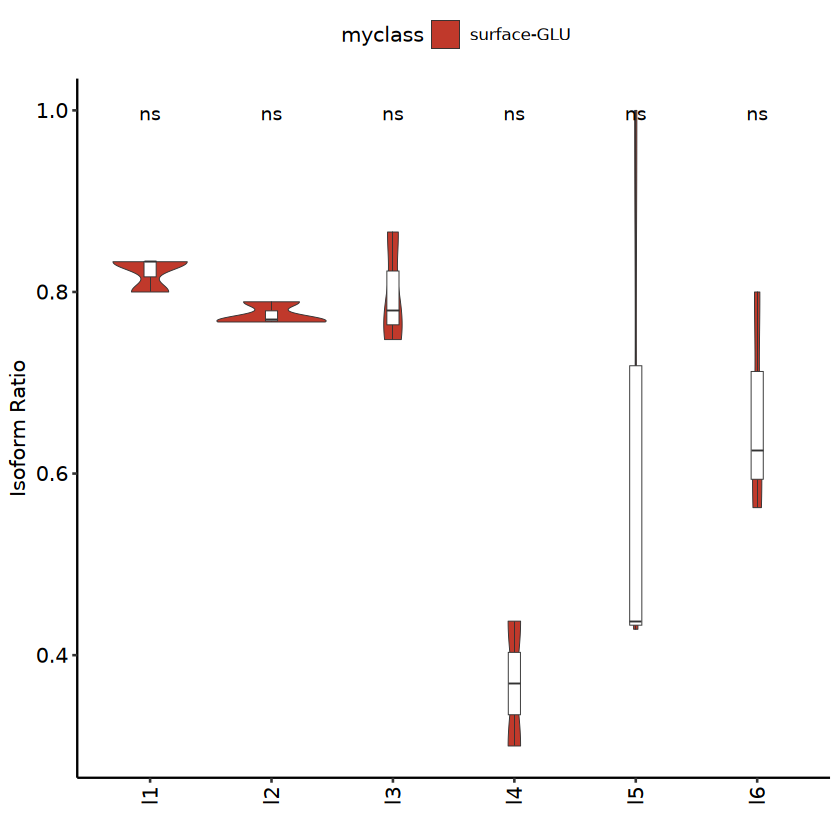

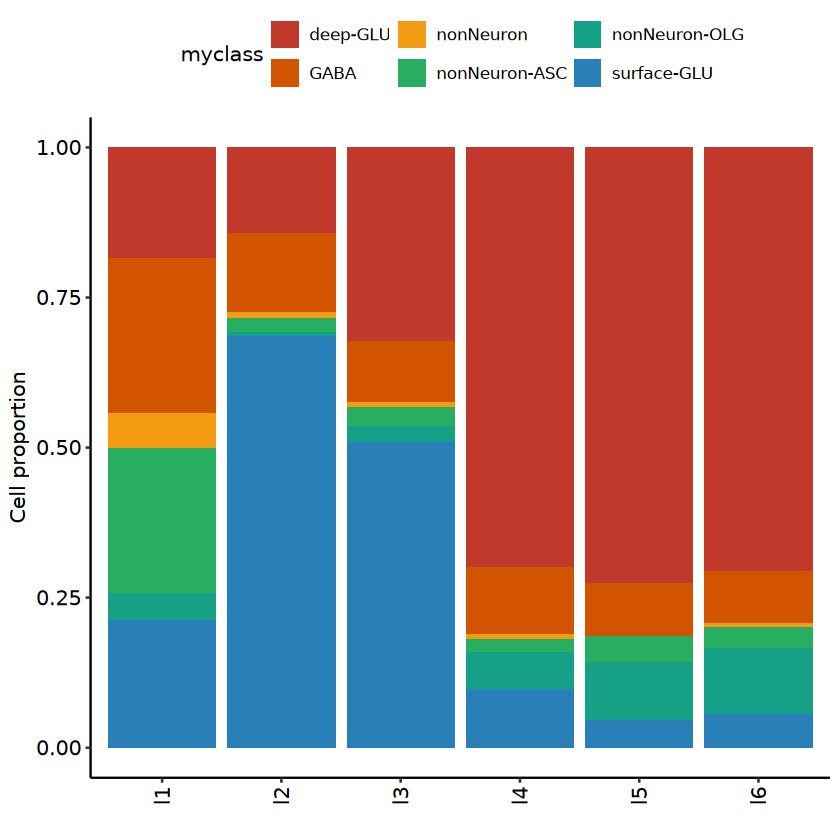

In [578]:
#transtcs = transtcs[transtcs$genecount > 20,]
transtcs$myclass = subclassan[match(transtcs$subclass,subclassan$subclass),]$class
p1 = ggplot(transtcs[transtcs$transcript_id == "DDRGK1-WeiLab-1" & 
                transtcs$myclass %in% c("surface-GLU") & 
                transtcs$subclass != "",],
       aes(x = layer,y = relative,fill = myclass)) + 
geom_violin(size = 0.2) +
geom_boxplot(fill = "white",
             size = 0.2,width=0.1,cex=0.8,outlier.size = 0.1) +
#facet_grid(myclass~.,scales = "free") +
scale_fill_flatui() +
stat_compare_means(aes(label = after_stat(p.signif)),hide.ns = F,ref.group = ".all.",vjust = 0.7) +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5)) +
xlab("") + ylab("Isoform Ratio")
p1 
p2 = ggplot(transtcs[transtcs$transcript_id == "DDRGK1-WeiLab-1" & 
                transtcs$subclass != "",],aes(x = layer,y = cellprop,fill = myclass)) + 
geom_bar(stat = "identity",position = "fill") +
scale_fill_flatui() +
theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5)) +
xlab("") + ylab("Cell proportion")
p2
#ggplot(transtcs[transtcs$transcript_id == "DDRGK1-WeiLab-1" & transtcs$subclass != "",],aes(x = subclass,y = relative)) + 
#geom_boxplot() +
#theme_pubr() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5))

In [579]:
ggexport(p1,filename = "result/figure4/explain_case_DDRGK1_boxplot_layer_24_04_07.pdf",width = 5,height = 4)
ggexport(p2,filename = "result/figure4/explain_case_DDRGK1_cellpop_barplot_layer_24_04_07.pdf",width = 3,height = 5)

file saved to result/figure4/explain_case_DDRGK1_boxplot_layer_24_04_07.pdf

file saved to result/figure4/explain_case_DDRGK1_cellpop_barplot_layer_24_04_07.pdf



### DDRGK1 spatial case plot

In [39]:
MarkerSpPlot = function(npclfdp.cell,npclfdp.cellb,geneex){
    markdf = npclfdp.cell[npclfdp.cell$gene_id %in% geneex,]
    markdfb = npclfdp.cellb[!npclfdp.cellb$cell_id %in% markdf$cell_id,]
    markdf$transcript_id = paste0(markdf$gene_id,"-",markdf$transcript_id)
    markdf = markdf %>% group_by(cell_id,gene_id) %>% mutate(readrate = readnum/sum(readnum))
    markdf = markdf[markdf$readrate > 0.5,]
    markdfst = markdf %>% group_by(transcript_id) %>% summarise(cellnum = length(cell_id))
    markdfst$cellpop = markdfst$cellnum/sum(markdfst$cellnum)
    markdfst = markdfst[markdfst$cellpop > 0.01,]
    markdf = markdf[markdf$transcript_id %in% markdfst$transcript_id,]
    
    pmkpti = ggplot() +
      scattermore::geom_scattermore(
        data = markdfb,
        aes(x,y),
        color = "white",
        # pixels = raster.dpi,
        pointsize = 0.1
      ) +
      geom_point(data = markdf,
                 aes(x,y,shape = myclass,color = transcript_id),
                size = 1) + 
      # facet_wrap(~gene_id,nrow = 2) +
      theme_void() + 
      scale_fill_discreterainbow() +
      scale_color_discreterainbow() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 6)) +
      guides(color = guide_legend(override.aes = list(size=4),
                                  nrow = 2)) +
      scale_y_reverse() + scale_x_reverse()
    pmkpti
    return(pmkpti)
}

In [870]:
#case plot
fsrawdp.cell = fsrawdp[fsrawdp$class != "",] %>% 
    group_by(cell_id,gene_id,transcript_id,class,subclass) %>%
    summarise(x = mean(x),y = mean(y),
              readnum = length(unique(readid)))
fsrawdp.cellb = qread("data//reads_full_anotation/longread_cell_position_24_03_29.qs")




`summarise()` has grouped output by 'cell_id', 'gene_id', 'transcript_id',
'class'. You can override using the `.groups` argument.


In [47]:
pref = qread("../ref/area_figure_an.qs")

fsrawdp.cell = qread("data/reads_full_anotation/main_data_read_total_annotation_dedup_forplot_onlycortex_24_05_01.qs")
#fsrawdp.cell = qread("data/reads_full_anotation/longread_cell_isoform_without_subcortical_24_03_29.qs")
fsrawdp.cellb = qread("data//reads_full_anotation/longread_cell_position_24_03_29.qs")

In [33]:
fsrawdp.cell = fsrawdp[fsrawdp$class != "",] %>% 
    group_by(cell_id,gene_id,transcript_id,layer,lobe,class,subclass) %>%
    summarise(x = mean(x),y = mean(y),
              readnum = length(unique(readid)))
qsave(fsrawdp.cell,"data/reads_full_anotation/longread_cell_isoform_without_subcortical_24_03_29.qs")

`summarise()` has grouped output by 'cell_id', 'gene_id', 'transcript_id',
'layer', 'lobe', 'class'. You can override using the `.groups` argument.


In [48]:
fsrawdp.cell = fsrawdp.cell[fsrawdp.cell$class != "",] %>% 
    group_by(cell_id,gene_id,transcript_id,layer,lobe,class,subclass) %>%
    summarise(x = mean(x),y = mean(y),
              readnum = length(unique(readid)))

`summarise()` has grouped output by 'cell_id', 'gene_id', 'transcript_id',
'layer', 'lobe', 'class'. You can override using the `.groups` argument.


In [49]:
#fsrawdp.cell$myclass = subclassan[match(fsrawdp.cell$subclass,subclassan$subclass),]$class

fsrawdp.cellf = fsrawdp.cell[fsrawdp.cell$subclass %in% c("L2/3/4","L2/3","L3/4"),]


markdf = fsrawdp.cellf[fsrawdp.cellf$gene_id %in% "DDRGK1",]
markdfb = fsrawdp.cellb[!fsrawdp.cellb$cell_id %in% markdf$cell_id,]
markdf$transcript_id = paste0(markdf$gene_id,"-",markdf$transcript_id)
# markdf = markdf %>% group_by(cell_id,gene_id,transcript_id,layer,lobe,class,subclass) %>%
#     summarise(x = mean(x),y = mean(y),readnum = length(unique(readid)))
markdf = markdf %>% group_by(cell_id,gene_id) %>% mutate(readrate = readnum/sum(readnum))
markdf = markdf[markdf$readrate > 0.5,]
markdfst = markdf %>% group_by(transcript_id) %>% summarise(cellnum = length(cell_id))
markdfst$cellpop = markdfst$cellnum/sum(markdfst$cellnum)
markdfst = markdfst[markdfst$cellpop > 0.01,]
markdf = markdf[markdf$transcript_id %in% markdfst$transcript_id,]

file saved to result/figure4/DDRGK1_spatial_plot_different_crosslayer_cellclass_24_05_30.pdf



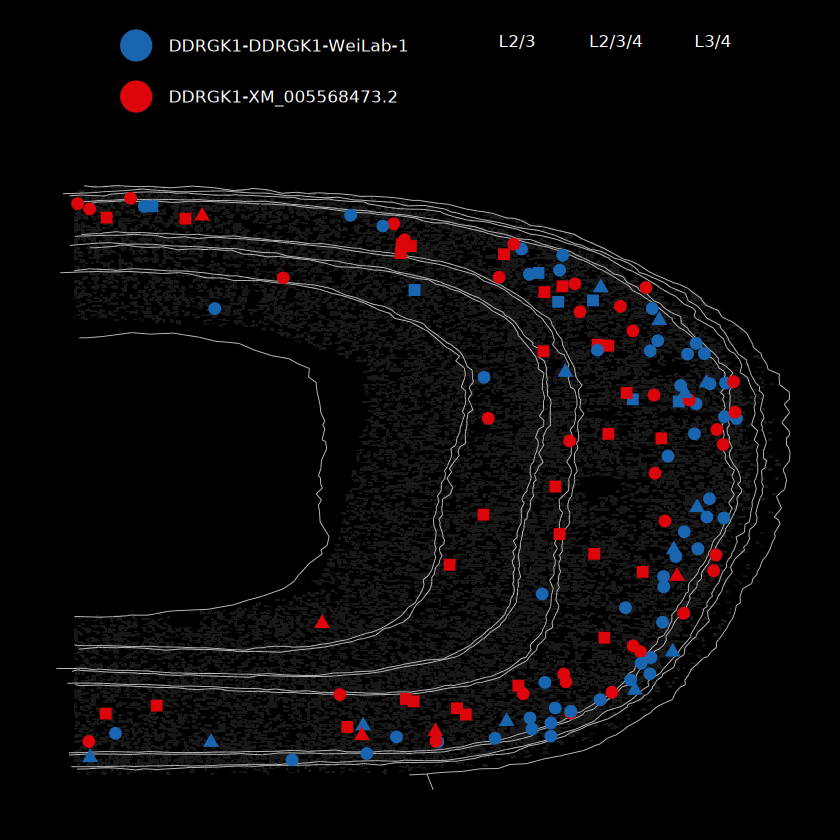

In [50]:
zoomaxis = c(10000,3000,41000,20000)
#zoomaxis = c(10000,3000,70000,40000)
#zoomaxis = c(130000,1000,100000,2000)
myedges = pref$layeredges
markdfzoom = markdf[markdf$x < zoomaxis[1] & markdf$x > zoomaxis[2] & markdf$y < zoomaxis[3] & markdf$y > zoomaxis[4],]
markdfbzoom = markdfb[markdfb$x < zoomaxis[1] & markdfb$x > zoomaxis[2] & markdfb$y < zoomaxis[3] & markdfb$y > zoomaxis[4],]
myedges = myedges[myedges$x1 < zoomaxis[1] & myedges$x1 > zoomaxis[2] & myedges$y1 < zoomaxis[3] & myedges$y1 > zoomaxis[4],]
pmkpti = ggplot() +
      scattermore::geom_scattermore(
        data = markdfbzoom,
        aes(x,y),
        color = "white",
        pointsize = 0.1
      ) +
     geom_segment(data = myedges, 
                   aes(x = x1, y = y1, xend = x2, yend = y2),
                   size = 0.2,
                   color = "grey") + theme_void() +
      geom_point(data = markdfzoom,
                 aes(x,y,color = transcript_id,shape = subclass),
                size = 3) + 
      theme_void() + 
      scale_fill_discreterainbow() +
      scale_color_discreterainbow() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 10)) +
      guides(color = guide_legend(override.aes = list(size=8),
                                  nrow = 2)) +
      scale_y_reverse() + scale_x_reverse()
pmkpti
ggexport(pmkpti,filename = "result/figure4/DDRGK1_spatial_plot_different_crosslayer_cellclass_24_05_30.pdf",width = 6,height = 6)

In [58]:
#stat plot
markdfst = markdf %>% group_by(subclass,layer,transcript_id) %>% summarise(readnum = sum(readnum))
markdfst = markdfst %>% group_by(subclass,layer) %>% mutate(readrate = readnum/sum(readnum))
pmkpt2 = ggplot(markdfst[markdfst$layer != "l1",],aes(x = layer, y = readrate,fill = subclass)) + 
geom_bar(stat = "identity",position = position_dodge(0.7),width = 0.1) +
geom_point(shape = 21,position = position_dodge(0.7)) +
theme_pubr() +
scale_fill_flatui() +
facet_grid(~transcript_id)
pmkpt2
ggexport(pmkpt2,filename = "result/figure4/DDRGK1_spatial_plot_different_crosslayer_cellclass_stat_24_05_30.pdf",width = 4,height = 4)

`summarise()` has grouped output by 'subclass', 'layer'. You can override using
the `.groups` argument.
file saved to result/figure4/DDRGK1_spatial_plot_different_crosslayer_cellclass_stat_24_05_30.pdf



file saved to result/figure4/MYL6_spatial_plot_different_cellclass_24_04_05.pdf



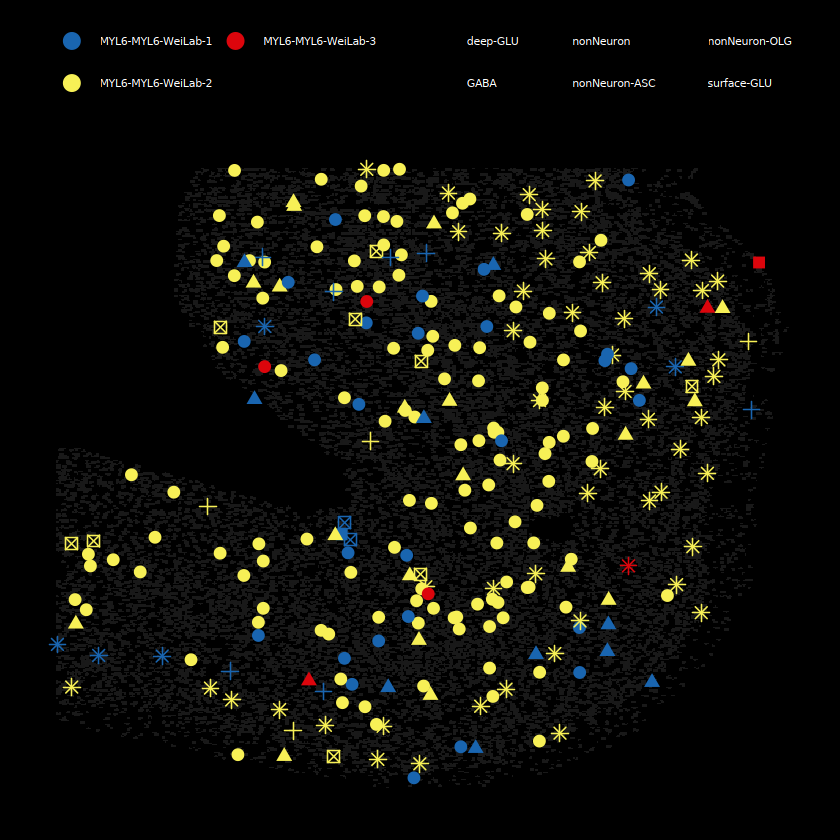

In [528]:
geneex = "MYL6"
fileid = paste0("result/figure4/",geneex,"_spatial_plot_different_cellclass_24_04_05.pdf")
pc2 = MarkerSpPlot(fsrawdp.cell[fsrawdp.cell$x < 10000 & fsrawdp.cell$x > 3000 & fsrawdp.cell$y < 70000 & fsrawdp.cell$y > 50000,],
                   fsrawdp.cellb[fsrawdp.cellb$x < 10000 & fsrawdp.cellb$x > 3000 & fsrawdp.cellb$y < 70000 & fsrawdp.cellb$y > 50000,],
                   geneex)
pc2
ggexport(pc2,filename = fileid,width = 6,height = 6)

In [441]:
head(fsrawdp.cell)

cell_id,gene_id,transcript_id,class,subclass,x,y,readnum
<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>
1,AAR2,XM_005568913.2,GLU,L6,51192,77807,1
1,ACACA,XM_005583932.2,GLU,L6,48966,77807,1
1,ADAM11,XM_005584444.2,GLU,L6,8427,77819,2
1,ANKRD12,XM_005587177.2,GLU,L6,51208,77803,1
1,AP2M1,XM_005546525.2,GLU,L6,48984,77801,1
1,ARMC1,XM_005563431.2,GLU,L6,51181,77807,1


#### Summary data

In [ ]:
library(writexl)
write_xlsx(datas4,"result/figure4/table_s4_region_dtu_model.xlsx")